In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
from transformers import RobertaTokenizer, RobertaModel
# from matplotlib import style
import random
import pickle
# style.use("dark_background")
seed_val = 994
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
device=torch.device("cuda")

In [2]:
# %history
train_df=pd.read_csv("./MELD/data/MELD/train_sent_emo.csv")
val_df=pd.read_csv("./MELD/data/MELD/dev_sent_emo.csv")
test_df=pd.read_csv("./MELD/data/MELD/test_sent_emo.csv")


train_df.head()

# file = open("IEMOCAP_features_bert.pkl",'rb')
# object_file = pickle.load(file)
# file.close()

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,also I was the point person on my company’s tr...,Chandler,neutral,neutral,0,0,8,21,"00:16:16,059","00:16:21,731"
1,2,You must’ve had your hands full.,The Interviewer,neutral,neutral,0,1,8,21,"00:16:21,940","00:16:23,442"
2,3,That I did. That I did.,Chandler,neutral,neutral,0,2,8,21,"00:16:23,442","00:16:26,389"
3,4,So let’s talk a little bit about your duties.,The Interviewer,neutral,neutral,0,3,8,21,"00:16:26,820","00:16:29,572"
4,5,My duties? All right.,Chandler,surprise,positive,0,4,8,21,"00:16:34,452","00:16:40,917"


0    4710
4    1743
1    1205
6    1109
3     683
5     271
2     268
Name: Emotion, dtype: int64


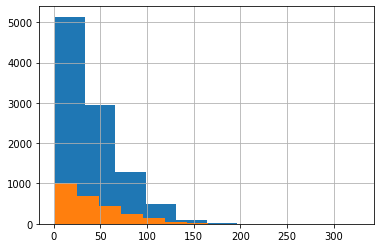

In [46]:

mapping ={'neutral':0, 'surprise':1, 'fear':2, 'sadness':3, 'joy':4, 'disgust':5, 'anger':6}

mapping2={"Chandler":0,"Phoebe":1,"Monica":2,"Ross":3,"Joey":4,"Rachel":5}

train_df=train_df.replace({"Emotion":mapping})# mapping labels to integer
val_df=val_df.replace({"Emotion":mapping})
test_df=test_df.replace({"Emotion":mapping})

train_df=train_df.replace({"Speaker":mapping2})# mapping labels to integer
val_df=val_df.replace({"Speaker":mapping2})
test_df=test_df.replace({"Speaker":mapping2})


train_text=train_df["Utterance"].tolist()
val_text=val_df["Utterance"].tolist()
test_text=test_df["Utterance"].tolist()


train_labels=train_df["Emotion"]
val_labels=val_df["Emotion"]
test_labels=test_df["Emotion"]

train_dia_id=train_df["Dialogue_ID"]
val_dia_id=val_df["Dialogue_ID"]
test_dia_id=test_df["Dialogue_ID"]

train_speaker=train_df["Speaker"]
val_speaker=val_df["Speaker"]
test_speaker=test_df["Speaker"]

# print(train_text,train_labels)

len_train=[len(j) for j in train_text]
len_test=[len(i) for i in test_text]

pd.Series(len_train).hist()
pd.Series(len_test).hist()

print(train_df.Emotion.value_counts())



In [4]:
print(train_text[6])
print(train_df["Speaker"].value_counts())



I see.
4                   1510
3                   1458
5                   1435
1                   1321
2                   1299
                    ... 
Phoebe/Waitress        1
Vince                  1
Gary Collins           1
Hold Voice             1
Front Desk Clerk       1
Name: Speaker, Length: 260, dtype: int64


In [5]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
tokenizer = RobertaTokenizer.from_pretrained('roberta-large')
model = RobertaModel.from_pretrained('roberta-large')

Some weights of the model checkpoint at roberta-large were not used when initializing RobertaModel: ['lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [6]:
tokens_train=tokenizer(train_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

tokens_val=tokenizer(val_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

tokens_test=tokenizer(test_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

In [7]:
train_seq=torch.tensor(tokens_train["input_ids"])
train_mask=torch.tensor(tokens_train["attention_mask"])
train_label=torch.tensor(train_labels.tolist())

val_seq=torch.tensor(tokens_val["input_ids"])
val_mask=torch.tensor(tokens_val["attention_mask"])
val_label=torch.tensor(val_labels.tolist())

test_seq=torch.tensor(tokens_test["input_ids"])
test_mask=torch.tensor(tokens_test["attention_mask"])
test_label=torch.tensor(test_labels.tolist())

In [8]:
from torch.utils.data import DataLoader,TensorDataset,RandomSampler, SequentialSampler
batch_size=32

train_data=TensorDataset(train_seq,train_mask,train_label)
train_sampler=SequentialSampler(train_data)
train_dataloader=DataLoader(train_data,sampler=train_sampler,batch_size=batch_size)

val_data=TensorDataset(val_seq,val_mask,val_label)
val_sampler=SequentialSampler(val_data)
val_dataloader=DataLoader(val_data,sampler=val_sampler,batch_size=batch_size)

test_data=TensorDataset(test_seq,test_mask,test_label)
print(len(test_data[0][0]))
test_sampler=SequentialSampler(test_data)
test_dataloader=DataLoader(test_data,sampler=test_sampler,batch_size=batch_size)
print(len(test_dataloader))

65
82


In [9]:
from tqdm.notebook import tqdm_notebook
print(type(train_speaker))
# modules=[bert.encoder.layer[:1]]
# for module in modules:
#     for param in module.parameters():
#         param.requires_grad=False

# for name, param in list(bert.named_parameters())[:-79]: 
#     print('I will be frozen: {}'.format(name)) 
#     param.requires_grad = False


<class 'pandas.core.series.Series'>


In [10]:
# model=BERT_model(bert)
# model=AutoModel.from_pretrained("roberta-large")

model_rob=model.to(device)

In [11]:
torch.cuda.empty_cache()
model.eval()
train_embed=[]
val_embed=[]
test_embed=[]
with torch.no_grad():
    for step,batch in tqdm_notebook(enumerate(test_dataloader),total=len(test_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding


        preds=preds.detach().cpu().numpy()

        test_embed.append(preds)
        
    for step,batch in tqdm_notebook(enumerate(val_dataloader),total=len(val_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding

        preds=preds.detach().cpu().numpy()

        val_embed.append(preds)
        
    for step,batch in tqdm_notebook(enumerate(train_dataloader),total=len(train_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding


        preds=preds.detach().cpu().numpy()

        train_embed.append(preds)
        
    train_embed=np.concatenate(train_embed,axis=0)
    val_embed=np.concatenate(val_embed,axis=0)
    test_embed= np.concatenate(test_embed,axis=0)

 


  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/313 [00:00<?, ?it/s]

In [12]:
# total_preds= np.concatenate(total_preds,axis=0)
print(len(train_embed))
print(len(val_embed))
print(len(test_embed))
train_embed=torch.tensor(train_embed)  #changing to tensor
val_embed=torch.tensor(val_embed)
test_embed=torch.tensor(test_embed)
print(train_embed.shape)


9989
1109
2610
torch.Size([9989, 1024])


In [13]:
import dgl
from dgl.nn import GraphConv
import graph4nlp


Using backend: pytorch[
19:08:12] /opt/dgl/src/runtime/tensordispatch.cc:43: TensorDispatcher: dlopen failed: /mnt/berry/home/prakhar/dgl/dgl/lib/python3.8/site-packages/dgl/tensoradapter/pytorch/libtensoradapter_pytorch_1.10.0.so: cannot open shared object file: No such file or directory


In [14]:
class GCN(nn.Module):
    def __init__(self,in_f,o_f,num_label):
        super().__init__()
        self.conv1=GraphConv(in_f,o_f)
        self.conv2=GraphConv(in_f,o_f)
#         self.conv3=GraphConv(in_f,o_f)
#         self.conv4=GraphConv(in_f,o_f)
        self.fc1=nn.Linear(2*o_f,num_label)
        
    def forward(self,g,in_f):
        h=self.conv1(g,in_f)
        h=F.relu(h)
        h=self.conv2(g,h)
        h=F.relu(h)
#         h=self.conv3(g,h)
#         h=F.relu(h)
#         h=self.conv4(g,h)
#         h=F.relu(h)
        h=self.fc1(torch.cat((in_f,h) ,dim=-1))[3]
#         h=F.softmax(h,dim=1)
        
        return h
        
        
        

In [15]:
model_rob = RobertaModel.from_pretrained('roberta-large')
model_rob=model_rob.to(device)
def roberta_emb(word):
#     print(word)
    tokens=tokenizer(word,
                     return_tensors="pt")
    tokens=tokens.to(device)
    print(tokens)
    emb=model_rob(**tokens)
#     print(model.device)
#     print(emb.pooler_output[0].shape)
    return emb.pooler_output[0]
    
# roberta_emb("no!")    

Some weights of the model checkpoint at roberta-large were not used when initializing RobertaModel: ['lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [16]:
# import nltk
# nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# train_speaker=train_speaker[1:]
def senti_word_emb(sentence):
#     print(sentence)
    sia = SentimentIntensityAnalyzer()
    word_list=sentence.split()
#     print(word_list)
    sentiment=[]
    max_val=0
    for i in word_list:
        a=sia.polarity_scores(i)
        if max_val<abs(a["compound"]):
            max_val=abs(a["compound"])
            
        sentiment.append(abs(a["compound"]))
#     print(sentiment) 
#     print(sentiment.index(max(sentiment)))
    if max_val>0.2:
    
        emb=roberta_emb(word_list[sentiment.index(max(sentiment))])
#         print(emb)
        return emb
    else:
        return None
    
#     print(a)    
        
# senti_word_emb(train_text[16])  

In [17]:
graphs=[]
# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)
for i,e in enumerate(train_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=train_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=train_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=train_embed[i-3:i+1]
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb)
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                in_feat=torch.cat((train_embed[i-3:i+1],speaker_emb,emb),0)
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         print(in_feat) 
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        print(bg.ndata["emb"])
        
#         print(in_feat.shape)
        
        
        graphs.append(bg)
    
#     if i==4:
#         u,v=torch.tensor([0,1,2,3]),torch.tensor([1,2,3,4])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:5]
#         graphs.append(g)
    
#     if i==3:
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:4]
#         graphs.append(g)
        
#     if i==2:
#         u,v=torch.tensor([0,1]),torch.tensor([1,2])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:3]
#         graphs.append(g)
#     if i==1:
#         u,v=torch.tensor([0]),torch.tensor([1])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:2]
#         graphs.append(g)
#     if i==0:
#         u,v=torch.tensor([0]),torch.tensor([0])
#         g=dgl.graph((u,v),num_nodes=1)
#         g.ndata["emb"]=torch.tensor([train_embed[0]])

lcoa before pop []
speakers before pop [0, 'The Interviewer', 0, 'The Interviewer']
loca afer pop []
before k spnode [0, 2] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
3
tensor([[ 0.0380,  0.7304,  0.3524,  ...,  0.1525,  0.2493, -0.0878],
        [ 0.0249,  0.7157,  0.3511,  ...,  0.2244,  0.2604, -0.1015],
        [ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,  0.1714,  0.2940, -0.0934],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop ['The Interviewer', 0, 'The Interviewer', 0]
loca afer pop []
before k spnode [1, 3] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4
tensor([[ 0.0249,  0.7157,  0.3511,  ...,  0.2244,  0.2604, -0.1015],
        [ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,

{'input_ids': tensor([[    0, 22326,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22326,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['The Interviewer', 0, 'The Interviewer', 0]
j 1
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
12
tensor([[ 1.7329e-01,  7.0026e-01,  4.6195e-01,  ...,  6.7265e-04,
          4.0141e-01, -3.6095e-01],
        [ 1.2071e-01,  6.6764e-01,  4.8257e-01,  ...,  2.2350e-02,
          3.7125e-01, -3.3142e-01],
        [ 5.3791e-02,  7.3258e-01,  3.3591e-01,  ...,  1.2220e-01,
          3.2891e-01, -4.1262e-02],
        [ 1.7319e-01,  6.9336e-01,  4.7140e-01,  ..., -2.9440e-02,
          3.9921e-01, -3.7330e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
   

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
18
tensor([[ 0.1601,  0.6748,  0.4776,  ...,  0.0021,  0.3614, -0.3797],
        [ 0.1397,  0.6893,  0.5032,  ..., -0.0047,  0.4153, -0.3879],
        [ 0.1697,  0.

{'input_ids': tensor([[    0,    29, 19667,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
25
tensor([[ 0.0960,  0.7537,  0.3529,  ...,  0.2290,  0.2831, -0.2025],
        [ 0.1465,  0.7355,  0.3661,  ...,  0.1554,  0.2735, -0.2096],
        [ 0.0040,  0.7118,  0.3526,  ...,  0.1788,  0.2883, -0.1432],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1335,  0.7303,  0.3507,  ...,  0.1421,  0.

lcoa before pop [1, 2]
speakers before pop [2, 0, 1, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
35
tensor([[ 0.1605,  0.6816,  0.4762,  ..., -0.0017,  0.3872, -0.3975],
        [ 0.1762,  0.7025,  0.4705,  ...,  0.0084,  0.3975, -0.3712],
        [ 0.1887,  0.6882,  0.4449,  ..., -0.0141,  0.3944, -0.3871],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1682,  0.7004,  0.4426,  ...,  0.0105,  0.4178, -0.3741],
        [ 0.1538,  0.7049,  0.4505,  ...,  0.0051,  0.3998, -0.3833]])
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43094,     2]], d

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 4, 5, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 4, 5, 3]
word?nodes [8]
speaker_node [4, 6, 7, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 7, 5, 8, 8]
44
tensor([[-2.9333e-02,  6.9112e-01,  2.9917e-01,  ...,  3.1946e-01,
          1.2370e-01, -9.5112e-02],
        [ 1.0152e-01,  7.1121e-01,  3.5574e-01,  ...,  1.7855e-01,
          2.8284e-01, -1.8517e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7848e-01,  7.0970e-01,  4.4331e-01,  ...,  1.7974e-03,
          4.0374e-01, -3.7861e

lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
54
tensor([[ 7.3189e-02,  7.3638e-01,  3.8005e-01,  ...,  1.2376e-01,
          3.2323e-01, -8.7642e-02],
        [ 6.4144e-02,  7.2143e-01,  3.3568e-01,  ...,  2.1193e-01,
          2.9103e-01, -1.0741e-01],
        [ 1.6021e-01,  6.8704e-01,  4.6543e-01,  ...,  7.1332e-04,
          3.9810e-01, -3.7998e-01],
        ...,
        [ 1.7848e-01,  7.0970e-01,  4.4331e-01,  ...,  1.7974e-03,
          4.0374e-01, -3.7861e-01],
        [ 1.8042e-01,  7.1340e-01,  4.4472e-01,  ..., -7.7690e-04,
          3.8033e-01, -3.8266e-01],
        [ 1.8222e-01,  7.0927e-01,  4.5722e-01,  ..., -1.4585e-02,
          3.8840e-01, -3.7180e-01]])
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 'Sergei', 0, 4]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 0, 4]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
63
tensor([[ 0.1478,  0.7501,  0.3696,  ...,  0.0987,  0.3424, -0.1585],
        [ 0.1615,  0.6931,  0.4462,  ..., -0.0029,  0.4235, -0.3623],
        [ 0.2004,  0.6884,  0.4724,  ...,  0.0322,  0.4154, -0.3447],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059]])
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], de

{'input_ids': tensor([[    0, 20096,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
70
tensor([[ 0.0895,  0.7179,  0.3326,  ...,  0.2150,  0.2490, -0.1462],
        [ 0.1647,  0.6913,  0.4969,  ..., -0.0319,  0.3961, -0.3870],
        [ 0.1585,  0.6912,  0.4786,  ..., -0.0363,  0.3833, -0.3883],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1519,  0.7071,  0.4482,  ...,  0.0112,  0.4002, -0.3813]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[

{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 0, 0, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
83
tensor([[ 0.1842,  0.6985,  0.4641,  ...,  0.0035,  0.4130, -0.3756],
        [ 0.1681,  0.6988,  0.4627,  ..., -0.0011,  0.3985, -0.3844],
        [ 0.1842,  0.6720,  0.4680,  ..., -0.0048,  0.3990, -0.4054],
        [ 0.0595,  0.7424,  0.3414,  ...,  0.2141,  0.2742, -0.1420],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553]])
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 'Customer', 0, 'Customer']
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
91
tensor([[ 0.1323,  0.6933,  0.4728,  ...,  0.0316,  0.4006, -0.3170],
        [-0.0223,  0.7431,  0.3068,  ...,  0.2862,  0.2381, -0.0382],
        [ 0.0624,  0.7269,  0.3091,  ...,  0.1648,  0.2942, -0.1459],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716]])
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,  

lcoa before pop []
speakers before pop [3, 0, 'Jade', 0]
loca afer pop []
before k spnode [0, 1, 3] [3, 0, 0]
word?nodes []
speaker_node [5, 4, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 5, 4, 4]
100
tensor([[ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.0899,  0.7333,  0.3447,  ...,  0.2113,  0.2794, -0.1915],
        [ 0.1395,  0.6756,  0.4866,  ..., -0.0343,  0.4025, -0.3662],
        [ 0.0339,  0.7535,  0.2904,  ...,  0.1562,  0.2250, -0.0857],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 'Jade', 0, 'Jade']
j 0
loca afer pop []
before k

{'input_ids': tensor([[    0, 34727,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34727,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 3, 0, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 3, 0, 1]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
107
tensor([[ 0.1778,  0.7336,  0.3566,  ...,  0.1313,  0.3153, -0.1113],
        [ 0.0905,  0.7333,  0.3151,  ...,  0.1886,  0.2824, -0.2058],
        [ 0.1525,  0.7154,  0.4542,  ..., -0.0234,  0.4136, -0.3636],
        ...,
        [ 0.1861,  0.7142,  0.4394,  ..., -0.0062,  0.3910, -0.3712],
        [ 0.1530,  0.7138,  0.3428,  ...,  0.0930,  0.3050, -0.2434],
        [ 0.1489,  0.7033,  0.4264,  ..., -0.0073,  0.3872, -0.3557]])
{'input_ids': tensor([

lcoa before pop [0, 1]
speakers before pop [1, 2, 3, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 2, 3, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
114
tensor([[ 0.1319,  0.7153,  0.4671,  ...,  0.0142,  0.3731, -0.3634],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0894,  0.7362,  0.3626,  ...,  0.1996,  0.2767, -0.1659],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 4508

{'input_ids': tensor([[   0,  298, 3252,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 1, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 1, 0]
word?nodes [7]
speaker_node [6, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 6, 5, 4, 7, 7]
123
tensor([[ 0.1692,  0.7049,  0.4542,  ...,  0.0108,  0.4014, -0.3639],
        [ 0.1669,  0.7007,  0.4578,  ...,  0.0165,  0.3899, -0.3636],
        [ 0.0975,  0.6859,  0.4746,  ...,  0.0114,  0.3846, -0.3298],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1752,  0.7016,  0.4508,  ..., -0.0307,  0.4108, -0.3718]])
{'input_ids': tensor([[   0,  298, 3252,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 3252,

{'input_ids': tensor([[    0, 32981,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
130
tensor([[ 0.0828,  0.6815,  0.4847,  ...,  0.0057,  0.3982, -0.3642],
        [ 0.1646,  0.6932,  0.4707,  ..., -0.0088,  0.3976, -0.3812],
        [ 0.1122,  0.7178,  0.3155,  ...,  0.2132,  0.2622, -0.1076],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1658,  0.7094,  0.4540,  ..., -0.0220,  0.4177, -0.3710]])
{'input_ids': tensor([[    0, 32981,     2]], 

{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Mona', 3, 'Mona', 3]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
138
tensor([[ 0.1670,  0.6906,  0.4744,  ...,  0.0156,  0.4148, -0.3759],
        [ 0.0828,  0.7274,  0.3710,  ...,  0.1548,  0.2919, -0.0671],
        [ 0.0648,  0.7274,  0.3567,  ...,  0.1786,  0.2884, -0.1076],
        [ 0.0810,  0.7322,  0.3487,  ...,  0.2018,  0.2611, -0.2091],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 347

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Charlie', 3, 'Charlie']
j 1
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
148
tensor([[ 1.4346e-01,  7.0190e-01,  4.5905e-01,  ..., -1.0058e-02,
          4.0286e-01, -3.9200e-01],
        [ 1.2315e-01,  6.6937e-01,  5.0516e-01,  ..., -1.1668e-02,
          3.4315e-01, -3.5083e-01],
        [ 1.4918e-01,  7.0598e-01,  4.5336e-01,  ...,  6.9849e-06,
          3.9106e-01, -3.3708e-01],
        [ 1.3856e-01,  7.4546e-01,  3.5359e-01,  ...,  1.6412e-01,
          3.1866e-01, -2.1368e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03,
          4.0060e-01, -3.9806e-01]])
{'input_ids'

{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Charlie', 3, 'Charlie', 'Charlie']
j 0
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
155
tensor([[ 0.1028,  0.7345,  0.2851,  ...,  0.2557,  0.2325, -0.1200],
        [ 0.1311,  0.7048,  0.4735,  ...,  0.0211,  0.3428, -0.3841],
        [ 0.1184,  0.7232,  0.3569,  ...,  0.1950,  0.2644, -0.1899],
        [ 0.1781,  0.7461,  0.3871,  ...,  0.1373,  0.3088, -0.1963],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1396,  0.6823,  0.4729,  ..., -0.0306,  0.3825, -0.4030]])
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Charlie', 'Professore Clerk', 3, 3]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
162
tensor([[ 0.1572,  0.6829,  0.4654,  ..., -0.0067,  0.3774, -0.3773],
        [ 0.1578,  0.6982,  0.4662,  ..., -0.0240,  0.4249, -0.3831],
        [ 0.1587,  0.7029,  0.4460,  ...,  0.0029,  0.3906, -0.3493],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 1, 2, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 1, 2, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
172
tensor([[ 0.1617,  0.7092,  0.4568,  ..., -0.0183,  0.4092, -0.3775],
        [ 0.1467,  0.6869,  0.4655,  ..., -0.0135,  0.3938, -0.3843],
        [ 0.0930,  0.6819,  0.4714,  ...,  0.0047,  0.3948, -0.3538],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1519,  0.6916,  0.4584,  

{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
180
tensor([[ 0.1546,  0.6938,  0.4660,  ...,  0.0082,  0.3899, -0.3817],
        [ 0.1175,  0.7398,  0.3098,  ...,  0.2274,  0.2785, -0.1591],
        [ 0.1069,  0.7468,  0.3712,  ...,  0.2076,  0.2976, -0.2070],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1650,  0.7050,  0.4595,  ..., -0.0206,  0.4084, -0.3942],
        [ 0.1682,  0.7004,  0.4426,  ...,  0.0105,  0.4178, -0.3741]])
{'input_ids': tensor([[   0, 3866, 1766,  328,

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
190
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.397

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   975,   857, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   975,   857, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 5, 4, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 4, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
200
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4593e-01,  6.8997e-01,  4.6171e-01,  ..., -7.1592e-03,
          3.9412e-01, -3.8593e-01],


{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
205
tensor([[ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1674,  0.6869,  0.4695,  ...,  0.0193,  0.3698, -0.3885],
        ...,
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1487,  0.6831,  0.4679,  

word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
211
tensor([[ 0.1010,  0.6676,  0.4681,  ...,  0.0148,  0.3937, -0.3577],
        [ 0.1085,  0.7311,  0.3279,  ...,  0.1554,  0.3211, -0.2082],
        [ 0.1694,  0.7019,  0.4501,  ..., -0.0122,  0.4040, -0.3686],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1594,  0.7118,  0.4505,  ...,  0.0283,  0.3967, -0.3938]])
{'input_ids': tensor([[    0, 11762,  4339,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11762,  4339,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   4

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 2, 1, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 1, 3]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
219
tensor([[ 0.1109,  0.7457,  0.3655,  ...,  0.1541,  0.3055, -0.2061],
        [-0.0334,  0.7294,  0.2598,  ...,  0.2868,  0.0432, -0.0708],
        [ 0.1260,  0.7311,  0.3157,  ...,  0.2178,  0.2792, -0.1947],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1299,  0.7291,  0.3664,  ...,  0.1554,  0.2556, -0.2054],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': te

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Nurse', 4, 'Nurse', 2]
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
233
tensor([[ 0.1275,  0.7237,  0.3278,  ...,  0.1426,  0.2681, -0.1150],
        [ 0.1116,  0.6563,  0.4943,  ...,  0.0124,  0.3605, -0.4102],
        [ 0.0918,  0.7259,  0.3277,  ...,  0.1966,  0.2445, -0.1811],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tenso

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 3, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 3, 5, 2]
word?nodes [7]
speaker_node [4, 5, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 6, 4, 7, 7]
240
tensor([[ 0.1315,  0.6882,  0.4827,  ...,  0.0122,  0.3855, -0.3721],
        [ 0.1141,  0.6833,  0.4783,  ...,  0.0049,  0.3679, -0.3630],
        [ 0.1211,  0.7572,  0.3492,  ...,  0.1268,  0.3404, -0.2321],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='c

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
248
tensor([[ 0.1190,  0.7409,  0.3603,  ...,  0.1392,  0.2999, -0.1883],
        [ 0.1474,  0.6863,  0.4610,  ..., -0.0133,  0.3745, -0.3771],
        [ 0.0639,  0.7162,  0.3508,  ...,  0.2656,  0.2448, -0.1881],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.00

{'input_ids': tensor([[    0, 20540,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mr. Treeger', 4, 'Mr. Treeger', 4]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
254
tensor([[ 0.1786,  0.6983,  0.4713,  ...,  0.0064,  0.4033, -0.3862],
        [ 0.0440,  0.7202,  0.3485,  ...,  0.3116,  0.2199, -0.1098],
        [ 0.0363,  0.7326,  0.3547,  ...,  0.1915,  0.3066, -0.1482],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1702,  0.7011,  0.4601,  ..., -0.0267,  0.3911, -0.3844],
        [ 0.1416,  0.7295,  0.3486,  ...,  0.1601,  0.2934, -0.2348]])
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Mr. Treeger', 4, 'Mr. Treeger', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 45779,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 45779,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 4, 'Carol']
j 3
loca afer pop [0, 1, 2]
befo

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 4, 3, 'The Casting Director']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 4, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
273
tensor([[ 0.1448,  0.7070,  0.4702,  ..., -0.0224,  0.4034, -0.3546],
        [ 0.2266,  0.6817,  0.4808,  ..., -0.0013,  0.3728, -0.3902],
        [ 0.1734,  0.6866,  0.470

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 6, 5, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
280
tensor([[ 0.1304,  0.7130,  0.35

lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 'Emily']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
285
tensor([[ 0.1591,  0.6927,  0.4651,  ...,  0.0262,  0.4032, -0.3944],
        [ 0.0349,  0.7049,  0.4121,  ...,  0.2437,  0.2392, -0.1543],
        [ 0.0448,  0.7070,  0.3562,  ...,  0.2003,  0.2515, -0.1092],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809],
        [ 0.1793,  0.7162,  0.4445,  ..., -0.0134,  0.3959, -0.3935]])
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 7445,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 7445,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 0, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 5, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
291
tensor([[ 0.0332,  0.7235,  0.3504,  ...,  0.1891,  0.2681, -0.1019],
        [ 0.1171,  0.7202,  0.3653,  ...,  0.2961,  0.1557, -0.1378],
        [ 0.1587,  0.6726,  0.4710,  ..., -0.0461,  0.4433, -0.3452],
        ...,
        [ 0.1087,  0.7262,  0.3669,  ...,  0.1017,  0.3108, -0.2471],
   

lcoa before pop [2]
speakers before pop [0, 2, 2, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 2, 2, 0]
word?nodes [6]
speaker_node [4, 5, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 4, 5, 5, 4, 6, 6]
300
tensor([[ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.1533,  0.6904,  0.5101,  ...,  0.0036,  0.4052, -0.3728],
        [ 0.1865,  0.6977,  0.4725,  ..., -0.0361,  0.4118, -0.4013],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1500,  0.6995,  0.4631,  ..., -0.0076,  0.4060, -0.3978]])
{'input_ids': tensor([[    0, 15894,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 2, 0, 

{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 'Paul', 3, 'Paul']
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
310
tensor([[ 0.1669,  0.6854,  0.4675,  ..., -0.0249,  0.3379, -0.4175],
        [ 0.0773,  0.6631,  0.4606,  ..., -0.0087,  0.3888, -0.3475],
        [-0.0135,  0.7207,  0.3072,  ...,  0.2389,  0.2726, -0.0518],
        [ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011]])
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='c

lcoa before pop [0, 2]
speakers before pop ['Paul', 3, 'Paul', 'Elizabeth']
j 1
j 0
loca afer pop []
before k spnode [1] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
317
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0058,  0.7322,  0.3178,  ...,  0.2747,  0.2341, -0.0742],
        [ 0.1591,  0.7024,  0.4643,  ..., -0.0047,  0.4114, -0.3783],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0')

lcoa before pop [2]
speakers before pop [1, 'Joey and Chandler', 1, 2]
loca afer pop [2]
before k spnode [0, 2, 3] [1, 1, 2]
word?nodes [6]
speaker_node [4, 4, 5]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 4, 4, 5, 6, 6]
324
tensor([[ 0.1061,  0.6872,  0.4748,  ...,  0.0282,  0.3559, -0.3609],
        [ 0.1759,  0.6903,  0.4670,  ..., -0.0069,  0.3995, -0.4017],
        [ 0.1409,  0.7024,  0.3030,  ...,  0.1679,  0.2969, -0.1709],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1653,  0.7062,  0.4563,  ...,  0.0095,  0.4091, -0.3720]])
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Joey and Chandler', 1, 2, 1]

lcoa before pop [3]
speakers before pop [0, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
334
tensor([[ 0.1355,  0.6638,  0.5042,  ..., -0.0033,  0.3615, -0.3775],
        [ 0.1594,  0.6831,  0.4650,  ...,  0.0069,  0.3775, -0.3846],
        [ 0.1594,  0.6831,  0.4650,  ...,  0.0069,  0.3775, -0.3846],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1197,  0.6880,  0.4728,  ...,  0.0142,  0.4106, -0.3981]])
{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 3, 3, 

{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 0, 4]
word?nodes [8, 9, 10]
speaker_node [5, 6, 4, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 7] [1, 2, 3, 5, 6, 4, 7, 8, 9, 10, 8, 9, 10]
342
tensor([[ 9.4675e-02,  7.3804e-01,  3.5181e-01,  ...,

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
347
tensor([[ 0.1605,  0.7240,  0.3593,  ...,  0.0991,  0.3587, -0.2078],
        [ 0.1556,  0.6629,  0.4937,  ..., -0.0179,  0.3765, -0.4043],
        [ 0.0400,  0.7398,  0.3394,  ...,  0.1615,  0.2381, -0.0844],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1521,  0.7113,  0.4520,  ..., -0.0158,  0.4006, -0.3903]])
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 0, 3, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 0, 3, 2]
word?nodes [8]
speaker_node [5, 4, 7, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29530,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29530,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 16813,  6514,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 16813,  6514,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
355
tensor([[ 0.1564

{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
361
tensor([[ 0.0818,  0.7446,  0.3257,  ...,  0.1882,  0.3047, -0.2138],
        [ 0.0912,  0.7424,  0.3237,  ...,  0.1929,  0.2817, -0.147

lcoa before pop [0]
speakers before pop [3, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
368
tensor([[ 2.0226e-01,  6.7381e-01,  4.8663e-01,  ...,  2.9324e-02,
          3.8767e-01, -3.0555e-01],
        [ 1.1941e-01,  6.7046e-01,  4.9637e-01,  ...,  2.9827e-02,
          3.8134e-01, -3.4361e-01],
        [ 1.8711e-01,  6.9113e-01,  4.7957e-01,  ...,  1.3196e-02,
          3.7529e-01, -3.7573e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01]])
lcoa before pop []
speakers before pop [1, 1, 1, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
w

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 0, 4, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 0, 4, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
376
tensor([[ 0.1230,  0.6934,  0.4790,  ...,  0.0421,  0.4319, -0.3425],
        [ 0.1113,  0.7215,  0.3795,  ...,  0.1831,  0.2784, -0.2032],
        [ 0.1263,  0.7457,  0.3704,  ...,  0.1795,  0.3089, -0.1820],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1507,  0.7090,  0.4466,  ...,  0.0082,  0.4057, -0.3790]])
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], 

{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 4, 2, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 4, 2, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
383
tensor([[ 0.0532,  0.7602,  0.2840,  ...,  0.2959,  0.2708, -0.0837],
        [ 0.1744,  0.7092,  0.4687,  ..., -0.0841,  0.4067, -0.3851],
        [ 0.1577,  0.6761,  0.4781,  ..., -0.0070,  0.3724, -0.4100],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887]])
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
391
tensor([[ 1.4717e-02,  7.2748e-01,  3.5987e-01,  ...,  2.3329e-01,
          1.9555e-01, -5.6503e-02],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.5429e-01,  7.0565e-01,  4.7244e-01,  ...,  8.5352e-03,
          3.7049e-01, -3.7536e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.6513e-01,  7.0114e-01,  4.4716e-01,  ...,  6.0253

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Kate', 4, 4, 4]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
397
tensor([[ 0.1304,  0.6451,  0.4864,  ...,  0.0123,  0.3695, -0.3429],
        [ 0.1162,  0.6711,  0.4807,  ...,  0.0105,  0.3992, -0.3281],
        [ 0.1590,  0.6780,  0.4839,  ..., -0.0089,  0.3805, -0.4066],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Kate', 'The Director', 'Kate', 'The Director']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
405
tensor([[ 0.1356,  0.7319,  0.3569,  ...,  0.1446,  0.2862, -0.1690],
        [ 0.1262,  0.6780,  0.4690,  ..., -0.0143,  0.3574, -0.4067],
        [ 0.0695,  0.7148,  0.3304,  ...,  0.1464,  0.2919, -0.0982],
        [ 0.0676,  0.7179,  0.3212,  ...,  0.2205,  0.3205, -0.1482]])
{'input_ids': tensor([[   0, 9904,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device=

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 1, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
415
tensor([[ 0.1568,  0.6977,  0.4927,  ..., -0.0148,  0.4076, -0.3567],
        [ 0.0899,  0.6584,  0.4706,  ...,  0.0334,  0.3773, -0.3436],
        [-0.0020,  0.7098,  0.3530,  ...,  0.2286,  0.2593, -0.1817],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 14783,   328,   

lcoa before pop [1, 2]
speakers before pop [2, 4, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 4, 2, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
423
tensor([[ 0.1418,  0.7104,  0.4394,  ...,  0.0207,  0.3704, -0.3742],
        [ 0.1349,  0.7502,  0.3798,  ...,  0.1658,  0.3223, -0.1342],
        [ 0.0908,  0.7399,  0.3351,  ...,  0.1665,  0.2895, -0.1893],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1727,  0.7126,  0.4609,  ..., -0.0053,  0.4041, -0.3898],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785]])
{'input_ids': tensor([[   0, 5873, 4060,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5873, 4060,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': te

lcoa before pop [2]
speakers before pop [4, 'Mr. Tribbiani', 4, 'Mr. Tribbiani']
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
432
tensor([[ 0.0226,  0.7423,  0.2601,  ...,  0.3085,  0.1605, -0.0956],
        [ 0.0386,  0.7488,  0.3375,  ...,  0.2386,  0.3047, -0.2235],
        [ 0.0945,  0.7442,  0.3753,  ...,  0.1835,  0.2474, -0.1808],
        [ 0.0625,  0.6771,  0.5253,  ..., -0.0308,  0.3479, -0.3837],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023]])
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mr. Tribbiani', 4, 'Mr. Tribb

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 'Mr. Tribbiani', 4, 'Mr. Tribbiani']
j 0
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
441
tensor([[ 0.1348,  0.7386,  0.3657,  ...,  0.1947,  0.3085, -0.2010],
        [ 0.0746,  0.7400,  0.3511,  ...,  0.2049,  0.2825, -0.2143],
        [ 0.1078,  0.7454,  0.3648,  ...,  0.1640,  0.3048, -0.2133],
        [ 0.0200,  0.7170,  0.3442,  ...,  0.3005,  0.2275, -0.0958],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
449
tensor([[ 0.1513,  0.7078,  0.5047,  ...,  0.0427,  0.3689, -0.3987],
        [ 0.0284,  0.7350,  0.3264,  ...,  0.2177,  0.2617, -0.0772],
        [ 0.1166,  0.7439,  0.3647,  ...,  0.1594,  0.3033, -0.1099],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.

lcoa before pop [1, 2]
speakers before pop ['Charlie', 3, 'Charlie', 4]
j 1
loca afer pop [1]
before k spnode [1, 3] [3, 4]
word?nodes [6]
speaker_node [4, 5]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 5, 6, 6]
456
tensor([[ 0.0045,  0.7496,  0.3423,  ...,  0.1369,  0.3010, -0.0390],
        [ 0.1522,  0.7203,  0.4658,  ..., -0.0046,  0.4068, -0.3673],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cu

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 2, 4, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
463
tensor([[ 1.0880e-01,  6.7348e-01,  5.0314e-01,  ...,  2.2716e-02,
          4.0579e-01, -3.6463e-01],
        [ 1.7756e-01,  6.8080e-01,  4.6969e-01,  ...,  5.3124e-03,
          3.8757e-01, -3.8320e-01],
        [ 2.1162e-01,  6.9351e-01,  4.6200e-01,  ..., -2.7367e-03,
          3.7719e-01, -3.9105e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6859e-01,  7.1137e-01,  4.3862e-01,  ..., -6.9535e-04,
          4.0500e-01, -3.7222e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,

lcoa before pop [0]
speakers before pop [0, 2, 4, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 4, 2]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 6, 5, 7, 7]
472
tensor([[ 0.1848,  0.6854,  0.4597,  ...,  0.0170,  0.3676, -0.3746],
        [ 0.1844,  0.6719,  0.4843,  ..., -0.0153,  0.4059, -0.3755],
        [ 0.1589,  0.6762,  0.4625,  ..., -0.0400,  0.3931, -0.3661],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 4, 2, 

{'input_ids': tensor([[   0, 5985,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5985,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 5] [1, 2, 3

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 0, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 0, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
486
tensor([[ 0.1057,  0.7531,  0.3820,  ...,  0.2187,  0.2944, -0.1559],
        [ 0.1228,  0.7368,  0.3399,  ...,  0.1389,  0.3371, -0.1757],
        [ 0.1071,  0.7365,  0.3714,  ...,  0.2003,  0.3138, -0.1729],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 5, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 5, 3]
word?nodes [8, 9]
speaker_node [6, 4, 7, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 8, 9]
494
tensor([[ 0.1587,  0.6886,  0.4775,  ..., -0.0041,  0.4110, -0.3809],
        [ 0.1265,  0.7253,  0.3545,  ...,  0.1263,  0.3295, -0.1775],
        [ 0.0889,  0.7249,  0.3495,  ...,  0.1220,  0.2988, -0.1645],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 1233

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
501
tensor([[ 0.0093,  0.7038,  0.3192,  ...,  0.3185,  0.2025, -0.112

lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
508
tensor([[ 0.1561,  0.6898,  0.4986,  ..., -0.0327,  0.3757, -0.3608],
        [ 0.0362,  0.7251,  0.3199,  ...,  0.2049,  0.2576, -0.0932],
        [ 0.1203,  0.6665,  0.4626,  ...,  0.0233,  0.3928, -0.3414],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1612,  0.6938,  0.4503,  ...,  0.0230,  0.4062, -0.3423],
        [ 0.1611,  0.7149,  0.4574,  ..., -0.0097,  0.4148, -0.3814]])
{'input_ids': tensor([[   0, 5982, 3631,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5982, 3631,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers befor

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 4, 4, 'Wayne']
loca afer pop [2]
before k spnode [0, 1, 2] [2, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 5] [1, 2, 3, 4, 5, 5, 6, 6]
517
tensor([[ 0.1089,  0.6772,  0.4663,  ...,  0.0235,  0.3822, -0.3564],
        [ 0.1919,  0.6895,  0.4657,  ...,  0.0211,  0.3737, -0.3812],
        [ 0.1181,  0.6877,  0.5090,  ...,  0.0208,  0.3942, -0.3265],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1504,  0.6995,  0.4408,  ..., -0.0090,  0.3925, -0.3660]])
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0,  5320, 35820,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5320, 35820,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
531
tensor([[ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1534,  0.6891,  0.4659,  ..., -0.0211,  0.4113, -0.3875],
        [ 0.1194

{'input_ids': tensor([[    0, 30961,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
539
tensor([[ 0.1248,  0.7413,  0.3774,  ...,  0.1656,  0.3206, -0.1718],
        [ 0.1163,  0.6481,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 1, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 1, 2]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
546
tensor([[ 0.1273,  0.6760,  0.4766,  ..., -0.0218,  0.3752, -0.3779],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.1488,  0.7494,  0.3371,  ...,  0.1718,  0.3175, -0.2012],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
lcoa before pop []
speakers before pop [2, 1, 2, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
553
tensor([[ 0.1062,  0.7293,  0.3529,  ...,  0.1489,  0.2429, -0.1659],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1865,  0.6837,  0.5026,  ..., -0.0227,  0.3541, -0.4134],
        ...,
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0776,  0.7173

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Richard', 2, 2, 2]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
561
tensor([[ 0.0445,  0.7200,  0.3273,  ...,  0.1549,  0.3394, -0.1083],
        [ 0.0191,  0.7442,  0.3475,  ...,  0.2172,  0.3153, -0.0876],
        [ 0.1745,  0.6747,  0.4886,  ...,  0.0151,  0.3697, -0.3596],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1592,  0.6981,  0.4447,  ..., -0.0202,  0.4173, -0.3733],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cu

{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24483,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24483,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 4, 'Dina']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
568
tensor([[ 0.1268,  0.7506,  0.3281,  ...,  0.1783,  0.3054, -0.1629],
        [ 0.1614,  0.6857,  0.4703,  ..., -0.0

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Dina', 'Dina', 'Dina', 'Dina']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
577
tensor([[ 0.1233,  0.6796,  0.4696,  ...,

lcoa before pop [2]
speakers before pop ['Dina', 4, 'Dina', 4]
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
584
tensor([[ 0.1656,  0.6903,  0.4948,  ...,  0.0086,  0.3809, -0.3780],
        [ 0.1268,  0.6869,  0.4687,  ...,  0.0013,  0.3933, -0.3296],
        [-0.0500,  0.7316,  0.3328,  ...,  0.2655,  0.3135, -0.0838],
        [ 0.1054,  0.6744,  0.4880,  ...,  0.0053,  0.4141, -0.3429],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0,   462, 12677,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 'Dina', 4, 'Bobby']
j 0
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
l

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Danny', 5, 'Danny']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
591
tensor([[ 0.1152,  0.6731,  0.4987,  ...,  0.0164,  0.3965, -0.3401],
        [ 0.1227,  0.7337,  0.3643,  ...,  0.1722,  0.3020, -0.1838],
        [ 0.0878,  0.7303,  0.3652,  ...,  0.2085,  0.3027, -0.2102],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[    0, 34033,     2]], device='cu

{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 'Krista', 'Danny', 'Krista']
j 2
j 1
j 0
loca afer pop []
before k spnode [0] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
597
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0501,  0.7232,  0.3584,  ...,  0.2707,  0.1860, -0.0935],
        [ 0.1035,  0.7422,  0.3483,  ...,  0.1529,  0.2849, -0.2195],
        [ 0.1606,  0.6769,  0.4643,  ...,  0.0138,  0.3910, -0.3885],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]]

{'input_ids': tensor([[    0, 18758,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Danny', 5, 0, 'Jill']
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [5, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
607
tensor([[ 0.0941,  0.7274,  0.3397,  ...,  0.2421,  0.2708, -0.1492],
        [ 0.1159,  0.7376,  0.3193,  .

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Jill', 0, 0, 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
614
tensor([[ 0.1195,  0.7539,  0.3462,  ...,  0.2280,  0.3456, -0.2231],
        [ 0.0600,  0.7553,  0.3364,  ...,  0.3151,  0.2631, -0.2055],
        [ 0.1288,  0.6845,  0.4838,  ...,  0.0133,  0.3763, -0.3788],
        ...,

tensor([[ 1.2770e-01,  7.3910e-01,  3.2091e-01,  ...,  1.5991e-01,
          2.7034e-01, -1.9475e-01],
        [ 1.6434e-01,  7.0135e-01,  4.7808e-01,  ...,  2.3491e-02,
          3.9090e-01, -3.7663e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7223e-01,  7.1030e-01,  4.5615e-01,  ..., -3.7719e-03,
          3.9945e-01, -3.6385e-01]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 4, 2, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 4, 2

lcoa before pop [0, 1]
speakers before pop ['Doug', 'Doug', 'Doug', 'Doug']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
629
tensor([[ 0.0467,  0.7339,  0.3665,  ...,  0.1633,  0.2721, -0.1066],
        [ 0.1959,  0.6926,  0.4875,  ...,  0.0334,  0.3948, -0.3825],
        [ 0.0987,  0.7384,  0.3636,  ...,  0.1318,  0.2967, -0.1652],
        [ 0.1776,  0.6993,  0.4598,  ..., -0.0043,  0.3936, -0.3633]])
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers

{'input_ids': tensor([[   0,  428, 1988, 1120,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 1988, 1120,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Stevens', 'Doug', 'Doug', 'Doug']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
639
tensor([[ 0.0674,  0.7306,  0.2826,  ...,  0.2924,  0.2354, -0.1262],
        [ 0.1414,  0.7377,  0.3448,  ...,  0.1839,  0.3081, -0.1729],
        [ 0.1598,  0.6934,  0.4724,  ..., -0.0140,  0.3856, -0.3675],
        [ 0.1284,  0.6880,  0.47

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 'Bob', 0, 'Mr. Franklin']
loca afer pop [2]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
650
tensor([[ 0.0443,  0.7228,  0.3283,  ...,  0.2042,  0.2695, -0.0940],
        [ 0.1748,  0.6987,  0.4619,  ..., -0.0035,  0.4137, -0.3685],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.0961,  0.7336,  0.3656,  ...,  0.1918,  0.2698, -0.1961],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
658
tensor([[ 0.0109,  0.7320,  0.3396,  ...,  0.2912,  0.1593, -0.0375],
        [ 0.1725,  0.6992,  0.5008,  ...,  0.0196,  0.3751, -0.3788],
        [ 0.1314,  0.7086,  0.4578,  ..., -0.0328,  0.3796, -0.4056],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1692,  0.7116,  0.4503,  ..., -0.0069,  0.4035, -0.3887],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[    0, 18178,   677,  1173,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 0, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 0, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 6, 4, 4, 5, 7, 8, 9, 7, 8, 9]
665
tensor([[ 0.1377,  0.6757,  0.4949,  ..., -0.0142,  0.3533, -0.4007],
        [ 0.0224,  0.7233,  0.3344,  ...,  0.2224,  0.2633, -0.0875],
        [ 0.1404,  0.6780,  0.4949,  ...,  0.0329,  0.4095, -0.3610],
        ...,
        [ 0.1115,  0.7234,  0.3688,  ...,  0.1758,  0.2849, -0.1933],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523]])
{'input_ids': tensor([[    0, 19423,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 1, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 4, 1]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
673
tensor([[ 1.3528e-01,  6.7778e-01,  4.6316e-01,  ...,  5.2159e-02,
          4.0247e-01, -3.6755e-01],
        [ 1.1440e-01,  6.7839e-01,  4.9882e-01,  ...,  4.4144e-02,
          3.9797e-01, -3.4746e-01],
        [ 1.5708e-01,  6.9658e-01,  4.6322e-01,  ..., -1.7858e-04,
          3.8911e-01, -3.6493e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
680
tensor([[ 1.1774e-01,  7.5995e-01,  3.5835e-01,  ...,  2.1486e-01,
          3.0210e-01, -1.9298e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.0094e-01,  7.2276e-01,  3.5836e-01,  ...,  2.0907e-01,
          2.7332e-01, -1.7861e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.6729e-01,  7.2067e-01, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
686
tensor([[ 0.1194,  0.7468,  0.3729,  ...,  0.1442,  0.3283, -0.1935],
        [ 0.0521,  0.7142,  0.3547,  ...,  0.1473,  0.2982, -0.0987],
        [ 0.1899,  0.6838,  0.4686,  ..., -0.0390,  0.4172, -0.3631],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
693
tensor([[ 0.0846,  0.7444,  0.3454,  ...,  0.1308,  0.3159, -0.2053],
        [ 0.0840,  0.7397,  0.3258,  ...,  0.1778,  0.2556, -0.1761],
        [ 0.0743,  0.7096,  0.3420,  ...,  0.1948,  0.2745, -0

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
700
tensor([[ 0.1887,  0.6949,  0.4873,  ...,  0.0407,  0.3634,

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 1, 1]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 9, 10, 7, 8, 9, 10]
705
tensor([[ 0.1586,  0.6931,  0.4766,  ...,  0.0304,  0.3893, -0.3579],
        [ 0.1313,  0.6770,  0.4691,  ...,  0.0290,  0.4126, -0.3321],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        ...,
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.

lcoa before pop [0, 1, 2]
speakers before pop ['Director', 4, 'Director', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
711
tensor([[ 0.1635,  0.6879,  0.4834,  ..., -0.0158,  0.3912, -0.3696],
        [ 0.1536,  0.7530,  0.3556,  ...,  0.1403,  0.3198, -0.1609],
        [ 0.1100,  0.7391,  0.3805,  ...,  0.1605,  0.2992, -0.1964],
        [ 0.1583,  0.6819,  0.4473,  ..., -0.0032,  0.3841, -0.4043],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  574, 3876,    2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Janice', 0, 1, 0]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 1, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
717
tensor([[ 0.1105,  0.7228,  0.3242,  ...,  0.2505,  0.2487, -0.1463],
        [ 0.1535,  0.6983,  0.4772,  ..., -0.0114,  0.3693, -0.3760],
        [ 0.1052,  0.7231,  0.3599, 

lcoa before pop [0, 1, 2]
speakers before pop ['Tony', 4, 0, 'Tony']
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [4, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
722
tensor([[ 0.0973,  0.6915,  0.4901,  ...,  0.0170,  0.4329, -0.3426],
        [ 0.1503,  0.6980,  0.4795,  ..., -0.0251,  0.3748, -0.3853],
        [ 0.0224,  0.7384,  0.3373,  ...,  0.2156,  0.2469, -0.1124],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1444,  0.7111,  0.4462,  ...,  0.0087,  0.3960, -0.3758],
        [ 0.1656,  0.7197,  0.4437,  ..., -0.0220,  0.3871, -0.3943]])
{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 21962,     2]], device='cuda

{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 1, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 1, 0]
word?nodes [8, 9, 10]
speaker_node [6, 7, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 5, 4] [1, 2, 3, 6, 7, 5, 4, 8, 9, 10, 8, 9, 10]
730
tensor([[ 0.1555,  0.7009,  0.4481,  ..., -0.0055,  0.3862, -0.3743],
        [ 0.1762,  0.7027,  0.4364,  ..., -0.0108,  0.3778, -0.3756],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1499,  0.7050,  0.4486,  ..., -0.0034,  0.3977, -0.3646]])
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 'Ticket Counter Attendant', 0, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
737
tensor([[ 0.1795,  0.7027,  0.4842,  ..., -0.0402,  0.3635, -0.4033],
        [ 0.1316,  0.6870,  0.4778,  ..., -0.0222,  0.3372, -0.4007],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
747
tensor([[ 0.1460,  0.6882,  0.4521,  ..., -0.0153,  0.3637, -0.4124],
        [ 0.0991,  0.6693,  0.4884,  ...,  0.0164,  0.3964, -0.3656],
        [ 0.0204,  0.7260,  0.3069,  ...,  0.2424,  0.1972, -0.0961]

{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 0, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
754
tensor([[ 0.1126,  0.7370,  0.3668,  ...,  0.1612,  0.3253, -0.1979],
        [ 0.0933,  0.7129,  0.3595,  ...,  0.3288,  0.1263, -0.0823],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1696,  0.6998,  0.4556,  ..., -0.0

{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
764
tensor([[ 0.0484,  0.7226,  0.3541,  ...,  0.1669,  0.3002, -0.0751],
        [ 0.0392,  0.7205,  0.3860,  ...,  0.2099,  0.2855, -0.0790],
        [ 0.0998,  0.7462,  0.3793,  ...,  0.1738,  0.2871, -0.1697],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1793,  0.7162,  0.4445,  ..., -0.0134,  0.3959, -0.3935],
        [ 0.1793,  0.7162,  0.4445,  ..., -0.0134,  0.3959, -0.3935]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Dr. Long', 5, 5, 3]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [5, 5, 3]
word?nodes [6]
speaker_node [5, 5, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 6, 6]
771
tensor([[ 0.0436,  0.7205,  0.3111,  ...,  0.1192,  0.3297, -0.1251],
        [ 0.1245,  0.7439,  0.3512,  ...,  0.1398,  0.2972, -0.2385],
        [ 0.0842,  0.7413,  0.3762,  ...,  0.1901,  0.2915, -0.2074],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
 

lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 4, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 4, 5]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
778
tensor([[ 0.1761,  0.7215,  0.4501,  ..., -0.0146,  0.4049, -0.3717],
        [ 0.2054,  0.6467,  0.4930,  ...,  0.0162,  0.3500, -0.4020],
        [ 0.0049,  0.7120,  0.2933,  ...,  0.2099,  0.2920, -0.0977],
        ...,
        [ 0.1761,  0.7215,  0.4501,  ..., -0.0146,  0.4049, -0.3717],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1642,  0.7163,  0.4391,  ..., -0.0212,  0.4142, -0.3743]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14631,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14631,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 4, 4, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 4, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
785
tensor([[ 5.0487e-02,  7.2472e-01,  3.2323e-01,  ...,  2.1901e-01,
          2.

{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
790
tensor([[ 2.2867e-01,  7.0029e-01,  4.3126e-01,  ...,  6.7194e-02,
          3.8202e-01, -3.5386e-01],

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 2, 4, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 4, 1]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
796
tensor([[ 1.1077e-01,  7.3457e-01,  3.8564e-01,  ...,  1.9891e-01,
          2.7830e-01, -2.0539e-01],
        [ 1.9659e-01,  6.5655e-01,  4.7405e-01,  ..., -4.8392e-06,
          3.8476e-01, -3.8534e-01],
        [ 1.1588e-01,  7.3367e-01,  3.5438e-01,  ...,  1.8716e-01,
          2.7795e-01, -2.0041e-01],
        ...,
        [ 1.0428e-01,  7.3512e-01,  3.7771e-01,  ...,  1.5636e-01,
          2.6374e-01, -2.0455e-01],
        [ 1.5996e-01,  7.1333e-01,  4.5042e-01,  ..., -9.4559e-03,
          4.0963e-01, -3.9238e-01],
        [ 1.3645e-01,  7.0551e-01,  4.3764e-01, 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 4, 1, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 2]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
803
tensor([[ 0.1305,  0.7360,  0.3544,  ...,  0.1971,  0.3283, -0.1616],
        [ 0.1349,  0.7407,  0.3335,  ...,  0.1854,  0.3164, -0.1884],
        [ 0.0387,  0.7280,  0.3052,  ...,  0.1875,  0.2669, -0.1466],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
812
tensor([[ 0.0566,  0.7103,  0.2997,  ...,  0.2319,  0.3094, -0.0896],
        [ 0.0646,  0.7311,  0.3412,  ...,  0.2255,  0.2562, -0.1533],
        [ 0.0289,  0.7451,  0.3779,  ...,  0.2662,  0.2196, -0.0991],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 2, 1, 'Charlton Heston']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [0, 2, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
819
tensor([[ 0.0918,  0.7413,  0.3899,  ...,  0.1225,  0.3029, -0.1480],
        [ 0.0632,  0.7310,  0.3889,  ...,  0.2096,  0.2757, -0.1729],
        [ 0.1392,  0.7448,  0.3813,  ...,  0.1680,  0.3320, -0.1792],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0987,  0.7303,  0.3723,  ...,  0.1666,  0.2964, -0.2254],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 635

lcoa before pop [2]
speakers before pop [5, 1, 5, 'Joshua']
loca afer pop [2]
before k spnode [0, 1, 2] [5, 1, 5]
word?nodes [6]
speaker_node [5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 5] [1, 2, 3, 5, 4, 5, 6, 6]
828
tensor([[ 0.1238,  0.6639,  0.4863,  ...,  0.0279,  0.3985, -0.3464],
        [ 0.1559,  0.6889,  0.4757,  ..., -0.0035,  0.3828, -0.3751],
        [ 0.0577,  0.7411,  0.3453,  ...,  0.2399,  0.2688, -0.1737],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1305,  0.7376,  0.3418,  ...,  0.1460,  0.2577, -0.1851]])
{'input_ids': tensor([[   0, 5982, 3631,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5982, 3631,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]]

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 5, 5, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
836
tensor([[ 0.1296,  0.7423,  0.3741,  ...,  0.1702,  0.2716, -0.2131],
        [ 0.1741,  0.6817,  0.4580,  ..., -0.0036,  0.3849, -0.3731],
        [ 0.1713,  0.6940,  0.4812,  ..., -0.0230,  0.3898, -0.3584],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],
        [ 0.1555,  0.7097,  0.4553,  ...,  0.0187,  0.4058, -0.3852]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

lcoa before pop [3]
speakers before pop [5, 'Kim', 5, 5]
loca afer pop [3]
before k spnode [0, 2, 3] [5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
846
tensor([[ 0.1405,  0.7354,  0.3521,  ...,  0.1604,  0.2943, -0.2101],
        [ 0.1093,  0.7281,  0.3628,  ...,  0.1994,  0.2880, -0.1931],
        [ 0.1405,  0.7354,  0.3521,  ...,  0.1604,  0.2943, -0.2101],
        [ 0.1238,  0.7053,  0.4758,  ..., -0.0068,  0.3783, -0.4096],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([

{'input_ids': tensor([[    0, 46887,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 1, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 4]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
853
tensor([[-0.0138,  0.7277,  0.3722,  ...,  0.2594,  0.3086, -0.2351],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.1321,  0.7022,  0.4975,  ...,  0.0051,  0.3901, -0.3728],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1722,  0.7171,  0.4451,  ..., -0.0112,  0.4069, -0.3868],
        [ 0.0788,  0.7184,  0.3519,  ...,  0.1454,  0.2708, -0.1655]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 

tensor([[ 0.1535,  0.7054,  0.4494,  ..., -0.0021,  0.3802, -0.3934],
        [ 0.1343,  0.6567,  0.4536,  ...,  0.0454,  0.3838, -0.3753],
        [ 0.0428,  0.7174,  0.2880,  ...,  0.2123,  0.2407, -0.1294],
        [ 0.0830,  0.7333,  0.3757,  ...,  0.1510,  0.3032, -0.0933],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1653,  0.7062,  0.4563,  ...,  0.0095,  0.4091, -0.3720]])
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 5, 5, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
868
tensor([[ 0.1343,  0.6567,  0.4536,  ...,  0.0454,  0.3838, -0.3753],
        [ 0.0

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
877
tensor([[ 1.5390e-01,  7.0137e-01,  4.6359e-01,  ..., -3

{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 0, 4, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 2]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
884
tensor([[ 0.1717,  0.7089,  0.4995,  ...,  0.0270,  0.3910, -0.2999],
        [ 0.0532,  0.7051,  0.3521,  ...,  0.2357,  0.2073, -0.0912],
        [ 0.1608,  0.6899,  0.4526,  ..., -0.0447,  0.4051, -0.3803],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1637,  0.7047,  0.4466,  ...,  0.0158,  0.4054, -0.3815],
        [ 0.1455,  0.6970,  0.4493,  ..., -0.0066,  0.4177, -0.3642]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Joanna', 5, 'Joanna', 'Joanna']
j 0
loca afer pop [1]
before k spnode [1] [5]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
892
tensor([[ 1.6940e-01,  7.3921e-01,  3.5657e-01,  ...,  1.1141e-01,
          2.9164e-01, -2.1634e-01],
        [ 1.2500e-01,  6.7746e-01,  4.7118e-01,  ..., -2.8745e-04,
          3.9455e-01, -3.4735e-01],
        [ 1.6164e-01,  6.9425e-01,  4.6462e-01,  ..., -5.2676e-02,
          4.1905e-01, -3.8188e-01],
        [ 1.0852e-01,  6.7804e-01,  4.7735e-01,  ...,  1.8744

lcoa before pop [0]
speakers before pop ['Joanna', 5, 'Joanna', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
900
tensor([[ 0.0709,  0.7267,  0.3037,  ...,  0.2488,  0.2221, -0.0737],
        [ 0.0621,  0.7266,  0.3706,  ...,  0.2090,  0.2958, -0.0941],
        [ 0.1617,  0.6862,  0.4847,  ..., -0.0124,  0.3878, -0.3720],
        [ 0.0952,  0.7352,  0.3409,  ...,  0.1683,  0.2763, -0.2160],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 'Joanna', 5, 'Joanna']
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
901
tensor([[ 0.0621,  0.7266,  0.3706,  ...,  0.2090,  0.2958, -0.0941],
        [ 0.1617,  0.6862,  0.4847,  ..., -0.0124,  0.3878, -0.3720],
        [ 0.0952,  0.7352,  0.3409,  ...,  0.1683,  0.2763, -0.2160]

lcoa before pop [2]
speakers before pop [5, 5, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 2]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 5, 5, 4, 6, 6]
913
tensor([[ 0.0696,  0.7120,  0.3368,  ...,  0.1856,  0.2528, -0.1718],
        [ 0.0761,  0.7229,  0.3074,  ...,  0.2565,  0.2019, -0.0718],
        [ 0.0740,  0.7528,  0.3788,  ...,  0.2984,  0.2041, -0.1129],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 5, 2, 5]
loca afer pop [1]
befor

lcoa before pop [1, 3]
speakers before pop [5, 4, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 2, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 7, 8]
921
tensor([[ 1.4949e-01,  6.9486e-01,  4.6373e-01,  ...,  1.6415e-02,
          4.2215e-01, -3.6339e-01],
        [ 1.5104e-01,  7.6719e-01,  3.1609e-01,  ...,  2.2944e-01,
          3.0321e-01, -2.0761e-01],
        [ 1.3983e-01,  7.1906e-01,  4.4796e-01,  ...,  4.8104e-04,
          4.1454e-01, -3.6430e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.1552e-01,  7.2590e-01,  3.8028e-01,  ...,  1.8866e-01,
          2.3755e-01, -1.9859e-01],
        [ 1.6799e-01,  7.0477e-01,  4.6042e-01,  ...,  2.9680e-02,
          3.8400e-01, -3.8430e-01]])
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 5, 3, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 5, 3, 5]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
928
tensor([[-0.0251,  0.7353,  0.3398,  ...,  0.2522,  0.2839, -0.0985],
        [ 0.0388,  0.7341,  0.2822,  ...,  0.2466,  0.2071, -0.1121],
        [ 0.0843,  0.7366,  0.3405,  ...,  0.2029,  0.2864, -0.1768],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
936
tensor([[ 0.1966,  0.6921,  0.4677,  ...,  0.0199,  0.3994, -0.3787],
        [ 0.1580,  0.7047,  0.4650,  ..., -0.0229,  0.4220, -0.3417],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973]

{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Cassie', 0, 'Cassie']
j 1
loca afer pop [2]
before k spnode [0, 2] [2, 0]
word?nodes [6]
speaker_node [5, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 5, 4, 6, 6]
944
tensor([[ 0.1907,  0.6910,  0.4385,  ..., -0.0039,  0.3949, -0.3749],
        [ 0.1023,  0.7420,  0.3421,  ...,  0.2033,  0.2695, -0.2052],
        [ 0.1568,  0.6966,  0.4858,  ...,  0.0124,  0.3769, -0.3806],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1679,  0.7055,  0.4634,  ...,  0.0240,  0.4100, -0.3739]])
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': ten

lcoa before pop []
speakers before pop [3, 3, 3, 'Dr. Rhodes']
loca afer pop []
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
953
tensor([[ 0.1119,  0.7325,  0.3641,  ...,  0.1747,  0.2547, -0.1481],
        [ 0.1018,  0.7377,  0.3717,  ...,  0.1638,  0.2974, -0.1957],
        [ 0.1618,  0.6881,  0.5100,  ...,  0.0143,  0.3702, -0.3627],
        [ 0.0651,  0.7222,  0.2640,  ...,  0.2084,  0.2475, -0.0657],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [3, 3, 'Dr. Rhodes', 3]
loca afer pop []
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 4, 4]
954
tensor([[ 0.1018,  0.7377,  0.3717,  ...,  0.1638,  0.2974, -0.1957],
        [ 0.1618,  0.6881,  0.5100,  ...,  0.0143,  0.3702, -0.3627],
        [ 0.0651,  0.7222,  0.2640,  ...,  

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Dr. Rhodes', 'Dr. Johnson', 'Dr. Rhodes', 'Kristen']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
962
tensor([[ 0.0803,  0.7476,  0.3105,  ...,  0.1393,  0.3546, -0.1475],
        [ 0.2031,  0.6873,  0.4678,  ...,  0.0314,  0.3698, -0.3773],
        [ 0.0799,  0.7259,  0.3370,  ...,  0.2466,  0.1961, -0.1278],
        [ 0.1312,  0.7494,  0.3556,  ...,  0.1398,  0.3321, -0.2271]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Kristen', 3, 'Janice']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
970
tensor([[ 0.1506,  0.7066,  0.4576,  ...,  0.0041,  0.3717, -0.3802],
        [ 0.1844,  0.6874,  0.4852,  ...,  0.0151,  0.3854, -0.3744],
        [ 0.1360,  0.6982,  0.4785,  ...,  0.0173,  0.4009, -0.3356],
        [ 0.0659,  0.7229,  0.3734,  ...,  0.2575,  0.2201, -0.1001],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 'Janice', 5, 'Janice']
j 1
loca afer pop [0]
before k spnode [0, 2] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
979
tensor([[ 0.0669,  0.7221,  0.3424,  ...,  0.1670,  0.3131, -0.1006],
        [ 0.0580,  0.7210,  0.3550,  ...,  0.2334,  0.2487, -0.2024],
        [ 0.1064,  0.7398,  0.3681,  ...,  0.1833,  0.2886, -0.1703],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 

lcoa before pop [0, 3]
speakers before pop [2, 4, 3, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 4, 3, 1]
word?nodes [8, 9]
speaker_node [5, 7, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 7, 6, 4, 8, 9, 8, 9]
986
tensor([[ 0.1701,  0.7017,  0.4665,  ..., -0.0127,  0.3885, -0.3735],
        [ 0.1435,  0.6963,  0.4545,  ...,  0.0048,  0.3701, -0.3938],
        [ 0.1414,  0.7568,  0.3475,  ...,  0.1716,  0.3240, -0.2086],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1707,  0.6997,  0.4580,  ..., -0.0185,  0.3874, -0.3687],
        [ 0.1297,  0.7114,  0.4526,  ...,  0.0097,  0.3911, -0.3769]])
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44223,     4,   

{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 0, 2, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 5]
word?nodes [8, 9, 10]
speaker_node [5, 4, 6, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 7] [1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 8, 9, 10]
992
tensor([[ 0.1523,  0.7094,  0.4372,  ...,  0.0178,  0.3559, -0.3528],
        [ 0.1059,  0.7597,  0.2937,  ...,  0.2908,  0.2063, -0.1439],
        [ 0.0490,  0.7221,  0.3672,  ...,  0.2596,  0.2503, -0.1651],
        ...,
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1629,  0.7192,  0.4478,  ...,  0.0015,  0.4088, -0.3685]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 0]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

sp

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 5, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]


{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 0, 1, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
1011
tensor([[ 0.0964,  0.7341,  0.3067,  ...,  0.1728,  0.3208, -0.1179],
        [ 0.0937,  0.7287,  0.3612,  ...,  0.2043,  0.3369, -0.1261],
        [ 0.1454,  0.7548,  0.3359,  ...,  0.1826,  0.3069, -0.2035],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1139,  0.7284,  0.3352,  ...,  0

{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 2]
word?nodes [7]
speaker_node [5, 4, 6, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 6, 6, 7, 7]
1018
tensor([[ 0.1072,  0.6803,  0.4765,  ...,  0.0065,  0.3808, -0.3865],
        [ 0.1654,  0.6928,  0.4459,  ..., -0.0201,  0.4032, -0.3839],
        [ 0.1162,  0.7462,  0.3731,  ...,  0.2011,  0.2841, -0.1945],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1689,  0.7025,  0.4333,  ..., -0.0049,  0.4041, -0.3736]])
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 27941,     2

lcoa before pop [1, 3]
speakers before pop [2, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
1026
tensor([[ 0.1350,  0.7001,  0.4899,  ...,  0.0363,  0.3668, -0.3571],
        [ 0.1565,  0.6996,  0.4786,  ...,  0.0045,  0.3849, -0.3788],
        [ 0.1561,  0.6910,  0.4623,  ..., -0.0119,  0.3970, -0.3738],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1469,  0.7064,  0.4455,  ..., -0.0010,  0.4057, -0.3832],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 23692,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,  

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1035
tensor([[ 0.1003,  0.6814,  0.4747,  ...,  0.0086,  0.3618, -0.3450],
        [ 0.1418,  0.7251,  0.3410,  ...,  0.1851,  0.2900, -0.1600],
        [ 0.0995,  0.6832,  0.4585,  ...,  0.0043,  0.4140, -0.3466

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1041
tensor([[ 0.0826,  0.6784,  0.4743,  ..., -0.0139,  0.3883, -0.3476],
        [ 0.1326,  0.7152,  0.3568,  ...,  0.2559,  0.2381, -0.1383],
        [ 0.1759,  0.6862,  0.4784,  ..., -0.0042,  0.4026, -0.3787],
        ...,
        [ 0.1554,  0.7038,  0.4575,  ...,  0.0277,  0.3754, -0.3872],
        [ 0.1564,  0.7076,  0.4393,  ..., -0.0087,  0.4072, -0.3669],
        [ 0.1654,  0.7062,  0.4431,  ...,  0.0108,  0.3740, -0.3529]])
{'input_ids': tensor([[   0,  417, 4179,  990,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 3, 3, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 3, 3, 2]
word?nodes [7, 8]
speaker_node [4, 6, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 6, 6, 5, 7, 8, 7, 8]
1048
tensor([[ 0.1042,  0.7198,  0.3184,  ...,  0.1486,  0.2874, -0.0349],
        [ 0.0738,  0.7099,  0.3834,  ...,  0.2052,  0.1652, -0.0839],
        [ 0.1658,  0.6934,  0.4736,  ..., -0.0213,  0.3749, -0.3814],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 18633,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 18633,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
1056
tensor([[ 0.1579,  0.6862,  0.5293,  ..., -0.0266,  0.3894, -0.4055],
        [ 0.1273,  0.7524,  0.3678,  ...,  0.1696,  0.3434, -0.1803],
        [ 0.1721,  0.7149,  0.4720,  ...,  0.0062,  0.4118, -0.3890],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1722,  0.7103,  0.4562, 

{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 4, 4, 'Jester']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [0, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
1063
tensor([[ 0.1266,  0.6933,  0.4606,  ...,  0.0083,  0.4007, -0.3394],
        [ 0.0707,  0.6652,  0.4877,  ...,  0.0070,  0.3824, -0.3449],
        [ 0.1601,  0.6858,  0.4652,  ..., -0.0251,  0.4201, -0.3965],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, 

{'input_ids': tensor([[  0, 858, 415,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Jester', 'Janice', 3]
j 0
loca afer pop [3]
before k spnode [0, 3] [4, 3]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
1071
tensor([[ 5.0660e-02,  7.2428e-01,  3.2871e-01,  ...,  1.2217e-01,
          3.6124e-01, -1.7821e-01],
        [ 1.2403e-01,  6.6984e-01,  4.9424e-01,  ..., -1.3984e-04,
          3.7748e-01, -3.7073e-01],
        [ 1.1518e-01,  7.3162e-01,  3.3937e-01,  ...,  1.5766e-01,
          2.8902e-01, -2.0845e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7222e-01,  7.1707e-01,  4.4511e-01,  ..., -1.1158e-02,
          4.0694e-01, -3.8676e-01]])
{'in

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Sarah', 'Sarah', 3]
j 2
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1077
tensor([[ 1.4433e-01,  6.9819e-01,  4.9589e-01,  ...,  6.3090e-04,
          4.0367e-01, -3.9258e-01],
        [ 7.6719e-02,  7.0533e-01,  3.4348e-01,  ...,  1.9547e-01,
          2.7096e-01, -1.9732e-01],
        [ 7.5822e-02,  7.2617e-01,  3.4919e-01,  ...,  1.8451e-01,
          3.4441e-01, -1.2134e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4839e-01,  7.1100e-01,  4.5191e-01,  ...,  3.3153e-03,
          4.0389e-01, -3.8866e-01],
        [ 1.3357e-01,  7.0390e-01,  4.5463e-01,  ...,  2.6314e-02,
          3.9098e-01, -3.8794e-01]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([

lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Richard', 2, 'Richard']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [2, 2]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1082
tensor([[ 0.0658,  0.7293,  0.3072,  ...,  0.1736,  0.3685, -0.0725],
        [-0.0321,  0.7181,  0.3262,  ...,  0.3157,  0.1650, -0.1137],
        [ 0.0429,  0.7212,  0.3434,  ...,  0.2136,  0.3032, -0.0963],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 30

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
1091
tensor([[ 6.8417e-02,  7.3215e-01,  3.4272e-01,  ...,  1.9607e-01,
          3.1489e-01, -1.0457e-01],
        [ 1.2182e-01,  7.3264e-01,  3.4501e-01,  ...,  2.1489e-01,
          3.0013e-01, -1.6088e-01],
        [ 7.4651e-02,  7.2115e-01,  3.4986e-01,  ...,  1.9676e-01,
          2.5771e-01, -1.6042e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6859e-01,  7.1137e-01,

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 2, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
1100
tensor([[ 0.1065,  0.7358,  0.3568,  ...,  0.2192,  0.294

lcoa before pop [1]
speakers before pop [5, 2, 5, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 2, 5, 3]
word?nodes [7]
speaker_node [6, 4, 6, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 6, 4, 6, 5, 7, 7]
1107
tensor([[ 0.1212,  0.6700,  0.4586,  ..., -0.0142,  0.3619, -0.3987],
        [ 0.1582,  0.7401,  0.3219,  ...,  0.2266,  0.2884, -0.1337],
        [ 0.0545,  0.7264,  0.3265,  ...,  0.1541,  0.3317, -0.1370],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], devi

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 0, 3, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 3, 4]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
1115
tensor([[ 0.1361,  0.7318,  0.3594,  ...,  0.1084,  0.3224, -0.2015],
        [ 0.1742,  0.7255,  0.4393,  ...,  0.0051,  0.4006, -0.3844],
        [ 0.0843,  0.7365,  0.3532,  ...,  0.1573,  0.2758, -0.1859],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1800,  0.7185,  0.4448,  ...,  0.0014,  0.4034, -0.3851],
        [ 0.1504,  0.6995,  0.4408,  ..., -0.0090,  0.3925, -0.3660]])
{'input_ids': tensor([[   0,  495, 8395, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 0, 1, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 1, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4,

tensor([[-2.1954e-02,  7.3424e-01,  3.2412e-01,  ...,  2.1819e-01,
          2.1600e-01, -5.4467e-02],
        [ 8.1527e-04,  7.2176e-01,  3.1444e-01,  ...,  2.6025e-01,
          2.5725e-01, -1.2181e-01],
        [ 1.5845e-01,  6.9895e-01,  4.7409e-01,  ..., -8.7255e-03,
          3.9059e-01, -3.7298e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4941e-01,  7.0236e-01,  4.4994e-01,  ...,  4.4687e-03,
          4.0831e-01, -3.5631e-01],
        [ 1.5548e-01,  7.3049e-01,  3.7410e-01,  ...,  1.4340e-01,
          3.0269e-01, -2.5229e-01]])
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Pete', 5, 5, 5]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
1136
tensor([[ 1.1507e-01,  6.7691e-01,  4.8062e-01,  ...,  2.7436e-03,
          3.9219e-01, -3.4015e-01],
        [ 1.1806e-01,  6.8425e-01,  4.6707e-01,  ..., -4.9953e-04,
          3.9106e-01, -3.7082e-01],
        [ 4.9775e-02,  7.3517e-01,  3.8761e-01,  ...,  1.4341e-01,
          3.3184e-01, -1.3025e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  .

{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1143
tensor([[ 0.1828,  0.6949,  0.5218,  ...,  0.0732,  0.3901, -0.3798],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1640,  0.7106,  0.4443,  ..., -0.0101,  0.4247, -0.3353],
        ...,
        [ 0.1525,  0.7052,  0.4725,  ...,  0.0209,  0.4213, -0.3962],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1622,  0.6955,  0.4762,  ..., -0.0048,  0.4128, -0.3886]])
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 37056,  3450, 30009, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1149
tensor([[ 0.1432,  0.6551,  0.5056,  ...,  0.0392,  0.3235, -0.4015],
        [ 0.1272,  0.7486,  0.3791,  ...,  0.2413,  0.2487, -0.1072],
        [ 0.1259,  0.7519,  0.3405,  ...,  0.2181,  0.2939, -0.1908],
        ...,
        [ 0.1520,  0.6929,  0.4615,  ...,  0.0139,  0.3616, -0.3969],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1615,  0.7078,  0.4535,  ..., -0.0161,  0.4016, -0.3714]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='c

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1157
tensor([[-0.0042,  0.7173,  0.3682,  ...,  0.2610,  0.2060, -0.1034],
        [ 0.1568,  0.7332,  0.3279,  ...,  0.1675,  0.2552, -0.1271],
        [ 0.1344,  0.7414,  0.3439,  ...,  0.1907,  0.3070, -0.1148],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1807,  0.7099,  0.4462,  ..., -0.0249,  0.4193, -0.3931],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0,   462, 12677,  

{'input_ids': tensor([[    0, 13562, 46529,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Emily', 3, 'Emily', 3]
j 0
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
1165
tensor([[ 0.1081,  0.6616,  0.5129,  ..., -0.0185,  0.3477, -0.3513],
        [ 0.1160,  0.7380,  0.3493,  ...,  0.2507,  0.2507, -0.1199],
        [ 0.0819,  0.7370,  0.3338,  ...,  0.1673,  0.3473, -0.1632],
        [ 0.0443,  0.7004,  0.3576,  ...,  0.2089,  0.3256, -0.1284],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [3, 'Emily', 3, 3]
loca afer pop []
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 4]
1166
tensor([[ 0.1160,  0.7380,  0.3493,  ...,  0.2507,  0.2507, -0.1199]

{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['The Singing Man', 5, 'The Singing Man', 5]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
1174
tensor([[ 0.1113,  0.6802,  0.4900,  ...,  0.0391,  0.3900, -0.3275],
        [ 0.1606,  0.6995,  0.4473,  ..., -0.0079,  0.4170, -0.3710],
        [ 0.1439,  0.6873,  0.4739,  ...,  0.0412,  0.3962, -0.3210],
        [ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_id

lcoa before pop [1]
speakers before pop [5, 2, 4, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 2, 4, 2]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 6, 4, 5, 4, 7, 7]
1183
tensor([[-0.0165,  0.7111,  0.3149,  ...,  0.2883,  0.2701, -0.0886],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1694,  0.7256,  0.4481,  ...,  0.0316,  0.4276, -0.3511],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 4, 2,

{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1192
tensor([[ 0.1064,  0.6956,  0.4658,  ..., -0.0179,  0.3992, -0.3584],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0621,  0.7198,  0.3417,  ...,  0.0732,  0.3

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1197
tensor([[ 0.1639,  0.7212,  0.3695,  ...,  0.0620,  0.3724, -0.2176],
        [ 0.0586,  0.7108,  0.3521,  ...,  0.2147,  0.2647, -0.1251],
        [ 0

{'input_ids': tensor([[    0, 35031,   636,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4684,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4684,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Kate', 'T

tensor([[ 0.0842,  0.7153,  0.3614,  ...,  0.3053,  0.2233, -0.1764],
        [ 0.0705,  0.7241,  0.3430,  ...,  0.1863,  0.2818, -0.2039],
        [ 0.1206,  0.7482,  0.3459,  ...,  0.1293,  0.3402, -0.2022],
        [ 0.1348,  0.7435,  0.3336,  ...,  0.1721,  0.3512, -0.1722],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
lcoa before pop []
speakers before pop ['Kate', 4, 4, 4]
loca afer pop []
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
1208
tensor([[ 0.0705,  0.7241,  0.3430,  ...,  0.1863,  0.2818, -0.2039],
        [ 0.1206,  0.7482,  0.3459,  ...,  0.1293,  0.3402, -0.2022],
        [ 0.1348,  0.7435,  0.3336,  ...,  0.1721,  0.3512, -0.1722],
        [ 0.0913,  0.7472,  0.3625,  ...,  0.1976,  0.2744, -0.1770],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])


{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1216
tensor([[ 0.0300,  0.7098,  0.3405,  ...,  0.2404,  0.2362, -0.1621],
        [ 0.1339,  0.6985,  0.4781,  ...,  0.0251,  0.3712, -0.3511],
        [ 0.0464,  0.7422,  0.3186,  ...,  0.1805,  0.3022, -0.0987],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 5, 4, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1226
tensor([[ 0.0549,  0.7422,  0.3555,  ...,  0.1468,  0.3811, -0.1223],
        [ 0.0914,  0.6826,  0.4858,  ...,  0.0132,  0.3817, -0.3254],
        [ 0.0927,  0.7407,  0.4170,  ...,  0.2251,  0.2696, -0.1254],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0854,  0.7336,  0.3334,  ...,  0.1989,  0.2792, -0.2304]])
{'input_ids': tensor([[    0, 33601,     4,     2

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 47481,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 47481,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 4, 'Commercial']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1232
tensor([[ 0.1047,  0.7249,  0.3443,  ...,  0.1433,  0.3144, -0.20

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Mark', 5, 'Mark']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Mark', 5, 'Mark', 5]
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1245
tensor([[ 0.0662,  0.7458,  0.3662,  ...,  0.2123,  0.3484, -0.1515],
        [ 0.0650,  0.7237,  0.3580,  ...,  0.2034,  0.3783, -0.1177],
        [ 0.0732,  0.7190,  0.3304,  ...,  0.1672,  0.2833, -0.0894],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1255
tensor([[ 6.9963e-02,  7.4244e-01,  3.7903e-01,  ...,  1.6619e-01,
          2.8739e-01, -2.1271e-01],
        [ 1.0436e-01,  7.1981e-01,  3.1375e-01,  ...,  2.2154e-01,
          2.4087e-01, -1.7271e-01],
        [ 1.4448e-01,  7.4725e-01,  3.2622e-01,  ...,  1.5469e-01,
          3.0187e-01, -1.4807e-01],
        [ 1.1595e-01,  7.4114e-01,  3.8271e-01,  ...,  1.7863e-01,
          2.9706e-01, -1.9856e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1

{'input_ids': tensor([[   0, 3340,  462, 5247,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3340,  462, 5247,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1265
tensor([[ 0.1201,  0.7410,  0.3498,  ...,  0.1967,  0.2855, -0.1786],
        [ 0.1335,  0.7426,  0.3217,  ...,  0.1005,  0.3340, -0.1680],
        [ 0.1114,  0.7363,  0.3723,  ...,  0.2599,  0.2557, -0.1692],
        [ 0.0238,  0.7289,  0.3634,  ...,  0.2754,  0.1638, -0.1641],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1520,  0.7225,  0.4291,  ...,  0.0101,  0.3821, -0.3865]])
{'input_ids': tensor([[   0, 3340,  462, 5247,    2]

{'input_ids': tensor([[    0, 18028, 24754,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028, 24754,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 2, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1280
tensor([[ 0.1802,  0.7074,  0.4622,  ..., -0.0019,  0.4059, -0.4072],
        [ 0.1412,  0.6981,  0.4295,  ...,  0.0173,  0.4126, -0.3559],
        [-0.0231,  0.7357,  0.3491,  ...,  0.3320,  0.2345,

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 'A Female Student', 1]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [2, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 4, 6, 6]
1288
tensor([[ 0.1940,  0.7024,  0.4448,  ..., -0.0328,  0.4172, -0.3603],
        [-0.0610,  0.6647,  0.2885,  ...,  0.3578,  0.1569, -0.0679],
        [ 0.1478,  0.7018,  0.4743,  ..., -0.0091,  0.3996, -0.3930],
        ...,
        [ 0.7576,  0

{'input_ids': tensor([[    0, 18763,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'Cliff', 1, 'Mr. Franklin']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1295
tensor([[ 0.1306,  0.6867,  0.4836,  ..., -0.0269,  0.3929, -0.3395],
        [ 0.0695,  0.7248,  0.3465,  ...,  0.0968,  0.3350, -0.0915],
        [ 0.0248,  0.7202,  0.3024,  ...,  0.2258,  0.2727, -0.1472],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        [ 0.1205,  0.7151,  0.3583,  ...,  0.1411,  0.2828, -0.2120]])
{'input_ids': tensor([[    0, 23692

lcoa before pop [1, 3]
speakers before pop [0, 'Mr. Franklin', 0, 3]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [0, 0, 3]
word?nodes [6]
speaker_node [4, 4, 5]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 4, 4, 5, 6, 6]
1303
tensor([[ 0.1495,  0.7358,  0.3690,  ...,  0.1731,  0.3062, -0.1214],
        [ 0.0424,  0.7087,  0.3627,  ...,  0.1934,  0.2875, -0.0824],
        [ 0.1728,  0.7037,  0.4505,  ..., -0.0142,  0.4080, -0.3792],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 26286,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 1, 4, 'Tag']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [5, 1, 4]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
1310
tensor([[ 0.0910,  0.7298,  0.3650,  ...,  0.2701,  0.2437, -0.1485],
        [ 0.1302,  0.7588,  0.3284,  ...,  0.2232,  0.2681, -0.1345],
        [ 0.0469,  0.7441,  0.3519,  ...,  0.1851,  0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Tag', 4, 0, 2]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 0, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
1317
tensor([[ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.6602e-01,  7.0894e-01,  4.5504e-01,  ...,  6.7452e-03,
          4.0790e-01, -3.8098e-01],
        [ 1.4869e-01,  7.2689e-01,  3.5748e-01,  ...,  2.5395e-01,
          3.0063e-01, -1.7146e-01],
        ...,
        [ 5.5964e-01,

{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 1, 2]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
1325
tensor([[ 0.0799,  0.7322,  0.3041,  ...,  0.2134,  0.2480, -0.0768],
        [ 0.1661,  0.7003,  0.5041,  ..., -0.0051,  0.3884, -0.3939],
        [ 0.1969,  0.6679,  0.4717,  ...,  0.0250,  0.3553, -0.3715],
        ...,
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1560,  0.7030,  0.4879,  ...,  0.0008,  0.3849, -0.4000]])
{

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 1, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 1, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
1333
tensor([[ 0.1338,  0.7012,  0.4748,  ..., -0.0050,  0.4103, -0.3739],
        [ 0.0159,  0.7285,  0.3419,  ...,  0.2065,  0.2191, -0.1503],
        [ 0.1394,  0.6816,  0.4703,  ..., -0.0078,  0.3550, -0.4056],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1623,  0.7059,  0.4517,  ..., -0.0115,  0.3928, -0.3803],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1340
tensor([[ 0.0368,  0.7377,  0.3293,  ...,  0.2201,  0.2597, -0.1186],
        [ 0.1023,  0.7417,  0.3605,  ...,  0.1868,  0.2820, -0.2068],
        [ 0.0922,  0.6789,  0.4863,  ...,  0.0125,  0.4061, -0.3185],
        ...,
        [ 0.1259,  0.7337,  0.3478,  ...,  0.1540,  0.2608, -0.2062],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{

{'input_ids': tensor([[   0,   29, 4917,  990,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 4917,  990,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1348
tensor([[ 0.0464,  0.7181,  0.3179,  ...,  0.2311,  0.2664, -0.1199],
        [ 0.0381,  0.7041,  0.3958,  ...,  0.2168,  0.2430, -0.0926],
        [ 0.0415,  0.7276

tensor([[ 0.1288,  0.7389,  0.3537,  ...,  0.2033,  0.2895, -0.2056],
        [ 0.1369,  0.7265,  0.3638,  ...,  0.1639,  0.2995, -0.2413],
        [ 0.1350,  0.6529,  0.5011,  ..., -0.0406,  0.3744, -0.3736],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1651,  0.7011,  0.4472,  ...,  0.0060,  0.3966, -0.3723]])
{'input_ids': tensor([[    0, 40087,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40087,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40087,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40087,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 3, 0, 0]
loca afer 

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
1362
tensor([[ 0.1646,  0.7153,  0.4499,  ..., -0.0270,  0.3999, -0.3563],
        [ 0.1343,  0.6900,  0.4918,  ..., -0.0405,  0.3875, -0.3602],
        [ 0.1173,  0.7233,  0.3620,  ...,  0.1622,  0.2814, -0.2017],
        ...,
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1437,  0.7056,  0.4559,  .

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1369
tensor([[ 0.1171,  0.7368,  0.3333,  ...,  0.1762,  0.2970, -0.1371],
        [ 0.1440,  0.6777,  0.4846,  ..., -0.0531,  0.3824, -0.3536],
        [ 0.1078,  0.6795,  0.4535,  ..., -0.0096,  0.3878, -0.3851],
        ...,
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devic

{'input_ids': tensor([[   0, 3252,  352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3252,  352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1378
tensor([[ 0.1310,  0.6947,  0.4807,  ...,  0.0450,  0.4073, -0.3636],
        [ 0.1812,  0.7107,  0.4603,  ..., -0.0056,  0.4169, -0.3864],
        [ 0.1640,  0.6981,  0.4645,  ..., -0.0022,  0.4114, -0.3752],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1560,  0.7326,  0.3808,  ...,  0.1530,  0.2605, -0.2112]])
{'input_ids': t

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Eric', 1, 'Eric']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1384
tensor([[ 0.1282,  0.7199,  0.3599,  ...,  0.1475,  0.2886, -0.1596],
        [-0.0047,  0.7233,  0.3355,  ...,  0.2379,  0.2609, -0.1156],
        [ 0.0017,  0.7295,  0.3215,  ...,  0.2690,  0.3089, -0.0653],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773],
        [ 0.1690,  0.7183,  0.4568,  ..., -0.0021,  0.4009, -0.3726]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Dr. Green', 3, 5]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [3, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1389
tensor([[ 0.1188,  0.6800,  0.4578,  ...,  0.0350,  0.3862, -0.3467],
        [ 0.0706,  0.6758,  0.4783,  ..., -0.0047,  0.3843, -0.3112],
        [ 0.1532,  0.7451,  0.3936,  ...,  0.1297,  0.3563, -0.1743],
        ...,
        [ 0.1581,  0.7079,  0.4368,  ..., -0.0059,  0.3932, -0.3784],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1397
tensor([[ 1.3663e-01,  6.9470e-01,  4.7542e-01,  ..., -4.4740e-03,
          3.9246e-01, -3.4087e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.1531e-01,  7.4850e-01,  3.7344e-01,  ...,  2.7600e-01,
          2.9911e-01, -1.3029e-01],
        [ 9.6686e-02,  6.8634e-01,  4.6499e-01,  ...,  5.6052e-02,
          4.0894e-01, -3.4240e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-

{'input_ids': tensor([[    0,   506, 22042,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 5, 3, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 2]
word?nodes [7, 8, 9]
speaker_node [5, 6, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 9, 7, 8, 9]
1404
tensor([[ 0.0508,  0.7355,  0.3179,  ...,  0.2029,  0.3354, -0.1548],
        [ 0.1482,  0.6745,  0.4744,  ...,  0.0160,  0.3905, -0.3623],
        [ 0.122

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Paul', 2, 'Paul', 2]
j 0
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1410
tensor([[ 0.1347,  0.7076,  0.4762,  ..., -0.0196,  0.3888, -0.3837],
        [ 0.1606,  0.7008,  0.4453,  ..., -0.0362,  0.3568, -0.3806],
        [ 0.0726,  0.7125,  0.3476,  ...,  0.2260,  0.2470, -0.1151],
        [ 0.1232,  0.6740,  0.4775,  ...,  0.0085,  0.3336, -0.4449],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.3835]])
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
1417
tensor([[ 0.0544,  0.7353,  0.3890,  ...,  0.2013,  0.2254, -0.1453],
        

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17165,   710,  6721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17165,   710,  6721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 'Mr. Heckles', 1]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [2, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 'Mark', 3, 'Mark']
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 5] [1, 2, 3, 5, 4, 6, 6]
1430
tensor([[ 0.1998,  0.6890,  0.4662,  ...,  0.0091,  0.3934, -0.3860],
        [-0.0473,  0.7298,  0.3301,  ...,  0.3604,  0.0901, -0.0770],
        [ 0.1334,  0.6863,  0.4701,  ...,  0.0146,  0.3843, -0.3590],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1598,  0.6974,  0.4469,  ..., -0.0216,  0.4104, -0.3736]])
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor

lcoa before pop [3]
speakers before pop ['Mona', 3, 'Mona', 3]
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1441
tensor([[ 5.2810e-02,  7.3485e-01,  3.3754e-01,  ...,  1.8857e-01,
          2.9065e-01, -1.5775e-01],
        [ 1.6893e-01,  6.8901e-01,  4.7795e-01,  ...,  3.5364e-05,
          3.6896e-01, -3.9159e-01],
        [ 1.3715e-01,  6.9882e-01,  4.6640e-01,  ..., -1.5314e-02,
          3.8635e-01, -3.8256e-01],
        [ 1.3475e-01,  6.9650e-01,  4.9031e-01,  ...,  6.3690e-03,
          3.6160e-01, -3.6086e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4667e-01,  6.8774e-01,  4.8715e-01,  ..., -1.0670e-02,
          3.9451e-01, -3.9254e-01]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Mona', 3, 'Mona', 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1447
tensor([[ 0.0342,  0.7032,  0.3539,  ...,  0.1942,  0.2935, -0.1330],
        [ 0.1531,  0.6825,  0.4590,  ..., -0.0021,  0.3764, -0.3758],
        [ 0.1460,  0.7361,  0.3589,  ...,  0.1931,  0.3002, -0.2001],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886]])
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328, 

{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 1, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 1, 1, 5]
word?nodes [6]
speaker_node [5, 4, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 4, 5, 6, 6]
1454
tensor([[ 0.1592,  0.6649,  0.5054,  ..., -0.0138,  0.3472, -0.3918],
        [ 0.0841,  0.7424,  0.3693,  ...,  0.1446,  0.3126, -0.0927],
        [ 0.1394,  0.7465,  0.3382,  ...,  0.1402,  0.3137, -0.1717],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.6833,  0.4366,  ...,  0.0271,  0.4504, -0.3425]])
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mas

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
1462
tensor([[ 0.0507,  0.7143,  0.3000,  ...,  0.2149,  0.2624, -0.2109],
        [ 0.1127,  0.7369,  0.3726,  ...,  0.1899,  0.2913, -0.2063],
        [ 0.1352,  0.7326,  0.3104,  ...,  0.1813,  0.2541, -0.1542],
        ...,
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1387,  0.7032,  0.4671,  ..., -0.0141,  0.4098, -0.3668]])
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12689,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12689,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], dev

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506,   927, 11599, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506,   927, 11599, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'Mr. Geller', 0, 'Joanna']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [4, 0]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
1471
tensor([[ 0.0974,  0.6455,  0.4722,  ...,  0.0023,  0.3961, -0.3777],
        [ 0.1116,  0.7296,  0.3574,  ...,  0.1258,  0.2954, -0.1647],
        [ 0.0371,  0.7354,  0.3532,  ...,  0.2983,  0.1667, -0.1039],
        [ 0.1747,  0.7052,  0.4532,  ..., -0.0078,  0.3994, -0.3777],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2

{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Joanna', 5, 'Joanna', 'Sophie']
j 1
j 0
loca afer pop []
before k spnode [1] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
1479
tensor([[ 0.1430,  0.6791,  0.4762,  ...,  0.0089,  0.3868, -0.3523],
        [ 0.1584,  0.6951,  0.4656,  ..., -0.0154,  0.4030, -0.3838],
        [ 0.1070,  0.7290,  0.3440,  ...,  0.1586,  0.3544, -0.1317],
        [ 0.1142,  0.6696,  0.4901,  ...,  0.0258,  0.3828, -0.3196],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1488
tensor([[ 0.0929,  0.7054,  0.2925,  ...,  0.2365,  0.2834, -0.1466],
        [ 0.1293,  0.7492,  0.3507,  ...,  0.2162,  0.3208, -0.1662],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.40

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 'Mark', 3]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [5, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
1494
tensor([[ 0.0707,  0.7350,  0.3307,  ...,  0.2064,  0.2635, -0.1660],
        [ 0.0277,  0.7434,  0.2164,  ...,  0.3469,  0.1901, -0.1259],
        [ 0.1122,  0.7205,  0.3453,  ...,  0.1381,  0.2849, -0.1527],
        ...,
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1653, 

{'input_ids': tensor([[    0,   506, 22042,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 0, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 0, 3]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
1501
tensor([[ 0.1188,  0.7235,  0.3433,  ...,  0.1596,  0.3196, -0.1749],
        [ 0.1524,  0.7006,  0.4763,  ..., -0.0152,  0.3870, -0.3947],
        [ 0.0284,  0.7296,  0.3561,  ...,  0.2346,  0.1874, -0.1557],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1540,  0.6971,  0.4446,  ...,  0.0105,  0.3958, -0.3910]])
{'inp

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 4, 2, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 4, 2, 4]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 6, 5, 4, 5, 7, 7]
1509
tensor([[ 0.1137,  0.7250,  0.3225,  ...,  0.1072,  0.2999, -0.2387],
        [ 0.1532,  0.7240,  0.3609,  ...,  0.2211,  0.1852, -0.1625],
        [ 0.0807,  0.7376,  0.3917,  ...,  0.2173,  0.2973, -0.1497],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mas

lcoa before pop [1]
speakers before pop [4, 2, 2, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 2, 2, 2]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
1516
tensor([[ 0.1722,  0.7178,  0.4367,  ...,  0.0082,  0.3970, -0.3920],
        [ 0.1917,  0.6671,  0.4784,  ...,  0.0297,  0.3823, -0.3977],
        [ 0.1483,  0.6678,  0.5047,  ...,  0.0348,  0.3899, -0.3469],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1723,  0.7040,  0.4217,  ..., -0.0289,  0.4212, -0.3782]])
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 2, 2, 4]
loca

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
1527
tensor([[ 0.1464,  0.6982,  0.4643,  ..., -0.0079,  0.3661, -0.3887],
        [ 0.1490,  0.6897,  0.4604,  ..., -0.0549,  0.3686, -0.4200],
        [ 0.1569,  0.7116,  0.4510,  ..., -0.0141,  0.4141, -0.3850],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': t

lcoa before pop [0, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1532
tensor([[ 0.0436,  0.7182,  0.3142,  ...,  0.1983,  0.3003, -0.1142],
        [ 0.1292,  0.7232,  0.3447,  ...,  0.1261,  0.2970, -0.2012],
        [ 0.1193,  0.6911,  0.4805,  ..., -0.0023,  0.3954, -0.3377],
        ...,
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275],
        [ 0.1589,  0.6963,  0.4551,  ..., -0.0090,  0.4101, -0.3569],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 24009,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24009,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop [0, 2]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1539
tensor([[ 0.0929,  0.7093,  0.3787,  ...,  0.1583,  0.3500, -0.0994],
        [ 0.1108,  0.7440,  0.3396,  ...,  0.1584,  0.2892, -0.1872],
        [ 0.0291,  0.7177,  0.3896,  ...,  0.2293,  0.3004, -0.1120],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 4

{'input_ids': tensor([[   0, 6504, 4450,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6504, 4450,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 2, 0, 'Singer']
j 0
loca afer pop []
before k spnode [0, 1, 2] [0, 2, 0]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 5, 4]
1551
tensor([[ 1.3643e-01,  6.8456e-01,  4.9839e-01,  ..., -2.4529e-02,
          3.7452e-01, -3.8726e-01],
        [ 1.1074e-01,  6.7024e-01,  4.7003e-01,  ...,  6.4261e-06,
          3.8999e-01, -3.3181e-01],
        [ 1.3477e-01,  7.4400e-01,  3.5989e-01,  ...,  1.6403e-01,
          3.1934e-01, -1.9139e-01],
        [ 7.8486e-02,  7.4812e-01,  3.7285e-01,  ...,  1.7888e-01,
          3.2294e-01, -1.0731e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 0, 1, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1556
tensor([[ 0.0768,  0.7321,  0.3887,  ...,  0.2805,  0.2498, -0.1501],
        [ 0.1096,  0.7278,  0.3470,  ...,  0.1885,  0.2801, -0.1865],
        [ 0.1136,  0.6700,  0.4751,  ..., -0.0441,  0.3692, -0.3582],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   574, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   574, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 'Singer', 'Singer']
j 2
j 1
loca afer pop [1]
before k spnode [0, 1] [4, 1]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 1, 4] [1, 2, 3, 5, 4, 6, 6]
1562
tensor([[ 0.1634,  0.7081,  0.4666,  ...,  0.0123,  0.3880, -0.3813],
        [ 0.0579,  0.7234,  0.3542,  ...,  0.1595,  0.2828, -0.1588],
        [ 0.1075,  0.7593,  0.3603,  ...,  0.1512,  0.3145, -0.1465],
        ...,
        

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1568
tensor([[ 0.0851,  0.7384,  0.3657,  ...,  0.1645,  0.3184, -0.2174],
        [ 0.1364,  0.7455,  0.3744,  ...,  0.1573,  0.3148, -0.2071],
        [ 0.0683,  0.7427,  0.3786,  ...,  0.2001,  0.2869, -0.1905],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': 

{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1575
tensor([[ 0.0503,  0.7397,  0.2911,  ...,  0.1909,  0

lcoa before pop [0, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
1581
tensor([[ 0.1478,  0.7229,  0.4306,  ...,  0.0057,  0.4112, -0.3585],
        [ 0.1628,  0.6807,  0.4961,  ..., -0.0110,  0.3760, -0.3909],
        [ 0.1178,  0.6770,  0.4783,  ...,  0.0046,  0.3575, -0.3479],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 157

lcoa before pop [1]
speakers before pop [4, 2, 4, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1588
tensor([[ 1.1057e-01,  6.8259e-01,  4.7531e-01,  ..., -3.5899e-03,
          4.0540e-01, -3.3974e-01],
        [ 1.5146e-01,  6.8692e-01,  4.6331e-01,  ...,  6.8745e-04,
          3.7595e-01, -3.9228e-01],
        [ 1.0054e-01,  7.1679e-01,  3.1902e-01,  ...,  1.4360e-01,
          2.5518e-01, -1.3854e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5695e-01,  7.0543e-01,  4.3919e-01,  ...,  3.0265e-02,
          4.1262e-01, -3.8431e-01]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='c

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 2, 5

{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1599
tensor([[ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [-0.0026,  0.7419,  0.2702,  ...,  0.2970,  0.1665, -0.0955],
        [ 0.1714,  0.7068,  0.4304,  ...,  0.0080,  0.3955, -0.3744],
        ...,
        [ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [ 0.1071,  0.725

{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['David', 'David', 'David', 'David']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
1607
tensor([[ 0.1625,  0.6975,  0.4806,  ...,  0.0097,  0.3877, -0.3775],
        [ 0.1374,  0.6978,  0.4794,  ..., -0.0129,  0.3863, -0.3642],
        [ 0.1368,  0.6945,  0.4563,  ..., -0.0096,  0.4124, -0.3707],
        [ 0.0609,  0.7207,  0.3371,  ...,  0.2346,  0.2259, -0.1302]])
{'input

{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 4, 1, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 4, 1, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
1614
tensor([[ 0.0613,  0.7521,  0.3603,  ...,  0.1806,  0.3372, -0.1791],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1463,  0.7037,  0.4717,  ..., -0.0121,  0.4030, -0.3716],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1475,  0.7068,  0.4581,  ..., -0.0129,  0.3934, -0.3692],

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 'Hitchhiker', '1st Customer', 2]
j 0
loca afer pop [3]
before k spnode [0, 3] [1, 2]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
1622
tensor([[ 0.1599,  0.7014,  0.4490,  ..., -0.0211,  0.4076, -0.3591],
        [ 0.1708,  0.6981,  0.4790,  ..., -0.0029,  0.3912, -0.3680],
        [ 0.1669,  0.7031,  0.4660,  ...,  0.0072,  0.4029, -0.3767],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 10273, 16003,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10273, 16003,   328,    

{'input_ids': tensor([[    0, 23391, 12042,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['3rd Customer', 2, '3rd Customer', 2]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1628
tensor([[ 0.1400,  0.7393,  0.3562,  ...,  0.1597,  0.2836, -0.1972],
        [ 0.0927,  0.7222,  0

{'input_ids': tensor([[    0, 40580,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 11244, 43160,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 11244, 43160,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 0, 3, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 3, 0]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 7, 8, 9]
1637
tensor([[ 0.1542,  0.6991,  0.4568,  ...,  0.

{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 5, 3, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 5, 3, 5]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 5, 6, 7, 7]
1643
tensor([[ 0.0827,  0.7411,  0.3716,  ...,  0.1696,  0.2646, -0.1771],
        [ 0.1339,  0.7008,  0.5165,  ..., -0.0171,  0.3723, -0.4232],
        [ 0.1201,  0.7407,  0.3919,  ...,  0.1584,  0.3017, -0.1811],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721]])
lcoa before pop []
speakers before pop [5, 3, 5, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 3, 5, 0]
word?nodes []
speaker_node [6, 5, 6, 4]
loca []
w2s []

speaker [0, 1, 2

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 'Tag', 1, 'Tag']
j 0
loca afer pop []
before k spnode [0, 2] [4, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
1653
tensor([[ 0.1526,  0.6906,  0.4800,  ..., -0.0059,  0.4105, -0.3792],
        [ 0.1029,  0.6818,  0.4829,  ...,  0.0013,  0.4070, -0.3268],
        [ 0.0353,  0.7331,  0.3132,  ...,  0.3086,  0.1395, -0.0809],
        [ 0.0639,  0.7327,  0.3511,  ...,  0.1948,  0.2626, -0.1649],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], d

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Tag', 'Tag', 5, 'Tag']
j 1
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
1660
tensor([[ 0.1457,  0.7431,  0.3708,  ...,  0.1627,  0.3544, -0.1695],
        [ 0.0614,  0.7149,  0.3397,  ...,  0.2103,  0.2788, -0.0981],
        [ 0.0626,  0.7260,  0.3043,  ...,  0.1671,  0.3189, -0.1172],
        [ 0.1176,  0.7400,  0.3404,  ...,  0.1569,  0.2884, -0.1679],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cud

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 'Policeman', 5, 'Policeman']
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1668
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1023,  0.6843,  0.4688,  ...,  0.0192,  0.3886, -0.3430],
        [ 0.0597,  0.7179,  0.3613,  ...,  0.2184,  0.2660, -0.1218],
        [ 0.1270,  0.7315,  0.3658,  ...,  0.2062,  0.2845, -0.1914],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
lcoa before pop []
speakers before pop ['Policeman', 5, 'Policeman', 5]
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 

{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Policeman', 5, 'Policeman', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1679
tensor([[ 0.0980,  0.6730,  0.4797,  ...,  0.0016,  0.4037, -0.3631],
        [ 0.0365,  0.7212,  0.3108,  ...,  0.2152,  0.2555, -0.0848],
        [ 0.0989,  0.6790,  0.4613,  ...,  0.0026,  0.3759, -0.3335],
        [ 0.0946,  0.7289,  0.3513,  ...,  0.1753,  0.2563, -0.1816],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1398,  0.7269,  0.3563,  ...,  0.1441,  0.2974, -0.2239]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 2, 5, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 0]
word?nodes [7, 8]
speaker_node [5, 5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 5, 5, 6, 4, 7, 8, 7, 8]
1688
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 4.6290e-03,  7.2184e-01,  3.6917e-01,  ...,  2.3299e-01,
          2.3286e-01, -8.3406

{'input_ids': tensor([[    0,   620, 22370,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Janice', 0, 'Janice']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1696
tensor([[ 0.1243,  0.6622,  0.4898,  ...,  0.0576,  0.3590, -0.3737],
        [-0.0044,  0.6987,  0.3182,  ...,  0.2587,  0.2302, -0.1036],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0914,  0.6727,  0.5058,  ...,  0.0063,  0.3769, -0.3466],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 4, 3, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 4, 3, 2]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
1703
tensor([[ 0.0901,  0.7191,  0.3164,  ...,  0.1503,  0.2978, -0.1195],
        [ 0.0833,  0.6807,  0.4879,  ...,  0.0118,  0.3909, -0.3688],
        [ 0.0519,  0.7478,  0.3151,  ...,  0.2073,  0.2682, -0.0856],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2

lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 2, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
1710
tensor([[ 0.1510,  0.6963,  0.4514,  ...,  0.0058,  0.4362, -0.3889],
        [ 0.1409,  0.6953,  0.4924,  ..., -0.0202,  0.3842, -0.3542],
        [ 0.1616,  0.6756,  0.4816,  ..., -0.0298,  0.3898, -0.3909],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

word?nodes []
speaker_node [5, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 5, 4]
1719
tensor([[ 0.1288,  0.7501,  0.3531,  ...,  0.1239,  0.3419, -0.1723],
        [ 0.1195,  0.7487,  0.3525,  ...,  0.1334,  0.3377, -0.1845],
        [ 0.0671,  0.7349,  0.3453,  ...,  0.1523,  0.2797, -0.1739],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 5, 1, 'Duncan']
loca afer pop []
before k spnode [0, 1, 2] [5, 5, 1]
word?nodes []
speaker_node [5, 5, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 5, 5, 4]
1720
tensor([[ 0.1195,  0.7487,  0.3525,  ...,  0.1334,  0.3377, -0.1845],
        [ 0.0671,  0.7349,  0.3453,  ...,  0.1523,  0.2797, -0.1739],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [

lcoa before pop [0, 2]
speakers before pop ['Duncan', 1, 1, 1]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1729
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1434,  0.7422,  0.3532,  ...,  0.1388,  0.2716, -0.1977],
        [ 0.1500,  0.7390,  0.3603,  ...,  0.1234,  0.3190, -0.1969],
        [ 0.1092,  0.7550,  0.3725,  ...,  0.1849,  0.3012, -0.2192],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1358,  0.6958,  0.4568,  ..., -0.0119,  0.4195, -0.3947]])
{'input_ids': tensor([[    0, 34798,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     4,     2]], device='cuda:

{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Duncan', 1, 'Duncan', 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1736
tensor([[ 0.0732,  0.7485,  0.3430,  ...,  0.2664,  0.2326, -0.1381],
        [ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [ 0.1076,  0.7418,  0.2867,  ...,  0.2183,  0.2469, -0.1360],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660]])
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]],

lcoa before pop [3]
speakers before pop [4, 5, 4, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1745
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4931e-01,  6.8124e-01,  4.9270e-01,  ...,  1.5132e-02,
          3.6061e-01, -4.0791e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5118e-01,  6.9802e-01,  4.4532e-01,  ..., -2.6071e-02,
          3.8898e-01, -3.8773e-01]])
{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Message', 4, 5, 4]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 5, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
1751
tensor([[ 0.1434,  0.7005,  0.5010,  ...,  0.0321,  0.3991, -0.3680],
        [ 0.1530,  0.6939,  0.4526,  ..., -0.0308,  0.4205, -0.3868],
        [ 0.1240,  0.6975,  0.4458,  ..., -0.0135,  0.3977, -0.3685],
        ...,
     

lcoa before pop [0]
speakers before pop [5, 4, 5, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1759
tensor([[ 0.1276,  0.7146,  0.4325,  ...,  0.0239,  0.3966, -0.3754],
        [ 0.1571,  0.6974,  0.4653,  ..., -0.0085,  0.3973, -0.3958],
        [ 0.1763,  0.6999,  0.4208,  ...,  0.0035,  0.4214, -0.3479],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1520,  0.7048,  0.4565,  ...,  0.0072,  0.4258, -0.3720]])
lcoa before pop []
speakers before pop [4, 5, 4, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 5]
1760
tensor([[ 0.1571,  0.6974,  0.4653,  ..., -0.0085,  0.3973, -0.3958]

{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 5, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 1]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1769
tensor([[ 0.0670,  0.7364,  0.2817,  ...,  0.1811,  0.2468, -0.0270],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1893,  0.6744,  0.5046,  ...,  0.0227,  0.3643, -0.4126],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1192,  0.7242,  0.3741,  ...,  0.1666,  0.2584, -0.1977]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Gary', 1, 'Gary']
j 3
j 1
loca afer pop [0, 2]
before k spnode

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Bonnie', 5, 'Bonnie', 5]
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1786
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1198,  0.6659,  0.4556,  ...,  0.0331,  0.3633, -0.3553],
        [ 0.1392,  0.7042,  0.4642,  ..., -0.0145,  0.3844, -0.3329],
        [ 0.0448,  0.7345,  0.3347,  ...,  0.1556,  0.2882, -0.1172],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[   0,   29, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1794
tensor([[ 0.1097,  0.7294,  0.3580,  ...,  0.2064,  0.2657, -0.1737],
        [ 0.1252,  0.7132,  0.3570,  ...,  0.1714,  0.2964, -0.1606],
        [ 0.1050,  0.7206,  0.3728,  ...,  0.2004,  0.2645, -0.

{'input_ids': tensor([[    0, 14307,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 5, 4, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 1]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
1801
tensor([[ 0.1363,  0.7417,  0.3689,  ...,  0.1876,  0.2952, -0.2052],
        [ 0.1403,  0.7403,  0.3556,  ...,  0.1552,  0.2898, -0.1971],
        [ 0.0384,  0.7028,  0.3218,  ...,  0.2882,  0.1649, -0.1164],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1428,  0.7059,  0.4522,  ...,  0.0093,  0.

lcoa before pop [2]
speakers before pop [3, 4, 3, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1810
tensor([[ 0.0277,  0.7436,  0.3160,  ...,  0.3113,  0.2098, -0.1600],
        [ 0.1414,  0.7249,  0.3696,  ...,  0.1933,  0.3301, -0.1630],
        [ 0.1587,  0.6760,  0.5233,  ..., -0.0091,  0.3517, -0.3500],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 3, 4,

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 2, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 7, 8, 9]
1817
tensor([[ 0.1236,  0.7250,  0.3725,  ...,  0.1633,  0.3116, -0.1952],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1830,  0.7016,  0.4906,  ..., -0.0058,  0.3967, -0.3973],
        ...,
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Woman', 4, 4, 4]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
1826
tensor([[ 0.1638,  0.7043,  0.4759,  ..., -0.0202,  0.4212, -0.3763],
        [ 0.0424,  0.7392,  0.3287,  ...,  0.1492,  0.3357, -0.1206],
        [ 0.0171,  0.7139,  0.3236,  ...,  0.2409,  0.2315, -0.1108],
        ...,
        [ 0.5596,  0.5591, 

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1832
tensor([[ 0.1161,  0.7505,  0.3304,  ...,  0.1420,  0.2678, -0.1558],
        [ 0.0536,  0.7436,  0.3452,  ...,  0.2168,  0.2880, -0.0945],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        ...,
        [ 0.1616,  0.7016,  0.4635,  ..., -0.0085,  0.4473, -0.3510],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]],

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Leslie', 1, 'Leslie']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1838
tensor([[ 0.0067,  0.7190,  0.3029,  ...,  0.2234,  0.2829, -0.1419],
        [ 0.0415,  0.7034, 

{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 'Leslie', 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1844
tensor([[ 0.0848,  0.7306,  0.3909,  ...,  0.1418,  0.3637, -0.1404],
        [ 0.1437,  0.7606,  0.3814,  ...,  0.1671,  0.2878, -0.2067],
        [-0.0025,  0.6928,  0.3723,  ...,  0.2599,  0.2481, -0.1026],
        ...,
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.2410],
        [ 0.1142,  0.7344,  0.3520,  ...,  0.1255,  0.2937, -0.2481]])
{'input_ids'

word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1849
tensor([[ 0.1792,  0.7124,  0.4779,  ..., -0.0407,  0.3698, -0.4029],
        [ 0.1009,  0.7222,  0.3591,  ...,  0.1464,  0.2527, -0.1845],
        [ 0.1098,  0.7336,  0.3607,  ...,  0.1527,  0.2992, -0.2362],
        ...,
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1368,  0.7336,  0.3785,  ...,  0.0993,  0.3206, -0.2646],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 3, 2, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 3, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1855
tensor([[ 0.0366,  0.7288,  0.3261,  ...,  0.2197,  0.2118, -0.1241],
        [ 0.0856,  0.7088,  0.3545,  ...,  0.1843,  0.2667, -0.0945],
        [ 0.1020,  0.6691,  0.4738,  ..., -0.0076,  0.3939, -0.3510],
        ...,
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462],
        [ 0.1640,  0.6849,  0.4855,  ..., -0.0252,  0.3849, -0.3900],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 44604,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1862
tensor([[ 0.0915,  0.7281,  0.3258,  ...,  0.2308,  0.2202, -0.1330],
        [ 0.0637,  0.7331,  0.3473,  ...,  0.2200,  0.3018, -0.1082],
        [ 0.1363,  0.7456,  0.3793,  ...,  0.1697,  0.2873, -0.2222],
        ...,
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{

lcoa before pop [0]
speakers before pop [4, "Joey's Hand Twin", 4, "Joey's Hand Twin"]
loca afer pop [0]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1871
tensor([[ 1.5179e-01,  6.9927e-01,  4.5789e-01,  ...,  1.0002e-02,
          3.8615e-01, -3.5741e-01],
        [ 1.6271e-01,  6.8469e-01,  4.5389e-01,  ...,  1.0744e-02,
          3.6611e-01, -4.0792e-01],
        [ 1.5695e-01,  6.9997e-01,  5.0752e-01,  ...,  4.1626e-02,
          3.7169e-01, -3.7009e-01],
        [ 1.4701e-01,  7.0900e-01,  4.6231e-01,  ...,  1.2520e-03,
          4.1741e-01, -3.8271e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01]])
lcoa before pop []
speakers before pop ["Joey's Hand Twin", 4, "Joey's Hand Twin", 4]
loca afer pop []
before k spnode [1, 3] 

{'input_ids': tensor([[    0,   605, 42557,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1879
tensor([[ 0.1576,  0.6877,  0.4763,  ..., -0.0199,  0.3940, -0.3831],
        [ 0.1241,  0.7393,  0.3462,  ...,  0.1772,  0.2750, -0.1938],
        [ 0.1188,  0.7323,  0.3408,  ...,  0.1772,  0.3064, -0.1536],
        ...,
        [ 0.1576,  0.6877,  0.4763,  ..., -0.0199,  0.3940, -0.3831],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1325,  0.7370,  0.3372,  ...,  0.1298,  0.2936, -0.2257]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{

lcoa before pop [1, 2]
speakers before pop [5, 5, 5, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1887
tensor([[ 0.1242,  0.6765,  0.4691,  ...,  0.0355,  0.3686, -0.3612],
        [ 0.1176,  0.7161,  0.3834,  ...,  0.1736,  0.3545, -0.1707],
        [ 0.0394,  0.7168,  0.3661,  ...,  0.2377,  0.3108, -0.1513],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1714,  0.7090,  0.4467,  ...,  0.0094,  0.4128, -0.3497]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42776,     2]], devic

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 3, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
1896
tensor([[ 0.1123,  0.7284,  0.3569,  ...,  0.1248,  0.3207, -0.2223],
        [ 0.0953,  0.7125,  0.3125,  ...,  0.2400,  0.1196, -0.1350],
        [ 0.1756,  0.7094,  0.4605,  ..., -0.0038,  0.4087, -0.3694],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[    0, 346

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1904
tensor([[ 0.1286,  0.6685,  0.4739,  ..., -0.0017,  0.4068, -0.3530],
        [ 0.1433,  0.7343,  0.3275,  ...,  0.2008,  0.2819, -0.1464],
        [ 0.1285,  0.6804,  0.4803,  ...,  0.0288,  0.3891, -0.3458],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1688,  0.6995,  0.4786,  ..., -0.0279,  0.3841, -0.4084],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 'Elizabeth']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1911
tensor([[ 0.0380,  0.7351,  0.3792,  ...,  0.1835,  0.3073, -0.1105],
        [ 0.0838,  0.7222,  0.3689,  ...,  0.1906,  0.3208, -0.1343],
        [ 0.0392,  0.6979,  0.3319,  ...,  0.2032,  0.2760, -0.1242],
        [-0.00

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37659,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37659,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 0, 1, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1919
tensor([[ 0.1118,  0.6737,  0.4970,  ...,  0.0040,  0.3642, -0.3891],
        [ 0.1141,  0.7063,  0.3718,  ...,  0.1495,  0.3344, -0.0892],
        [ 0.1452,  0.6994,  0.4632,  ...,  0.0075,  0.3865, -0.3415],
        ...,
        [ 0.1346,  0.6997,  0.4555,  ..., -0.0145,  0.3856, -0.3498],
        [ 0.1366,  0.7073,  0.46

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 1, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
1925
tensor([[ 1.7645e-01,  7.0278e-01,  4.5881e-01,  ..., -2.7060e-02,
          3.9905e-01, -3.7315e-01],
        [ 1.3979e-01,  6.9214e-01,  4.7933e-01,  ..., -5.3519e-05,
          4.0023e-01, -3.4498e-01],
        [ 1.5121e-01,  6.8156e-01,  4.7643e-01,  ...,  1.2239e-04,
          3.8645e-01, -3.9208e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
       

lcoa before pop [2]
speakers before pop [4, 3, 5, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 3, 5, 3]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 5, 4, 6, 4, 7, 7]
1933
tensor([[ 0.0889,  0.6941,  0.4913,  ...,  0.0351,  0.3666, -0.3418],
        [ 0.1783,  0.6910,  0.4570,  ..., -0.0067,  0.4150, -0.3475],
        [-0.0048,  0.7426,  0.3637,  ...,  0.2125,  0.2679, -0.0647],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 3, 5]
loca afer pop [1

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Kiki', 'Joanne', 5, 'Joanne']
j 1
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1940
tensor([[ 0.1402,  0.6866,  0.4660,  ...,  0.0150,  0.4117, -0.3492],
        [ 0.0867,  0.7467,  0.3522,  ...,  0.1968,  0.2868, -0.1726],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1225,  0.6820,  0.4842,  ...,  0.0155,  0.3477, -0.3895],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_m

tensor([[ 0.1272,  0.7039,  0.4768,  ..., -0.0140,  0.3907, -0.3703],
        [ 0.1457,  0.6821,  0.4943,  ..., -0.0303,  0.3720, -0.4399],
        [ 0.1435,  0.7063,  0.5035,  ...,  0.0044,  0.4061, -0.4050],
        [ 0.1133,  0.7438,  0.3171,  ...,  0.1432,  0.2567, -0.1194],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1544,  0.7025,  0.4432,  ...,  0.0093,  0.3871, -0.3748]])
{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 5, 5, 'Fireman No. 3']
loca afer pop [2]
before k spnode [0, 1, 2] [5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1950
tensor([[ 0.1457,  0.6821,  0.4943,  ..., -0.0303,  0.3720, -0.4399],
        [ 0.1435

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Susan', 3, 'Carol']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 5, 4, 6, 6]
1959
tensor([[ 0.1475,  0.7516,  0.3710,  ...,  0.1547,  0.3074, -0.2321],
        [ 0.0977,  0.7363,  0.3582,  ...,  0.1880,  0.2901, -0.1986],
        [-0.0146,  0.7168,  0.3788,  ...,  0.2688,  0.2118, -0.1605],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1530,  0.6964,  0.4474,  ..., -0.0586,  0.4022, -0.4006]])
{'input_ids': tensor([[    0,  1073, 29846,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1073, 29846,     6,     2]], 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Carol', 3, 'Susan', 3]
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1969
tensor([[ 0.0961,  0.7262,  0.3456,  ...,  0.1883,  0.3073, -0.1842],
        [ 0.1315,  0.6753,  0.4700,  ..., -0.0023,  0.3616, -0.3992],
        [ 0.1914,  0.6935,  0.4633,  ..., -0.0078,  0.3998, -0.3863],
        [ 0.1028,  0.7410,  0.3191,  ...,  0.1893,  0.2846, -0.1821],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[

lcoa before pop [1]
speakers before pop ['Susan', 3, 'Carol', 2]
loca afer pop [1]
before k spnode [1, 3] [3, 2]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
1976
tensor([[ 0.1126,  0.7402,  0.3504,  ...,  0.1887,  0.2947, -0.1939],
        [ 0.1540,  0.7102,  0.4659,  ..., -0.0092,  0.4071, -0.3738],
        [ 0.1426,  0.7044,  0.4393,  ...,  0.0038,  0.4030, -0.3774],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'atten

{'input_ids': tensor([[    0, 44468,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44468,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Mischa', 'Mischa', 1, 'Mischa']
loca afer pop [2]
before k spnode [2] [1]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1985
tensor([[ 0.1306,  0.7519,  0.3646,  ...,  0.1413,  0.3033, -0.2213],
        [ 0.1411,  0.7281,  0.3673,  ...,  0.1789,  0.2830, -0.2282],
        [ 0.0853,  0.7393,  0.3578,  ...,  0.1898,  0.2652, -0.2017],
        [ 0.1727,  0.6988,  0.4622,  ..., -0.0093,  0.3934, -0.3630],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0853,  0.7393,  0.3578,  ...,  0.1898,  0.2652, -0.2017]])
{'input_ids': tensor([[    0, 44468,   154,     4,     2]], device='cuda:0'

{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mischa', 1, 2, 1]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 5,

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2000
tensor([[ 0.1525,  0.7306,  0.3953,  ...,  0.1350,  0.3604, -0.1685],
        [ 0.1701,  0.6948,  0.4663,  ..., -0.0121,  0.3988, -0.3714],
        [ 0.1338,  0.6951,  0.4707,  ..., -0.0540,  0.3887, -0.3753],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Krista', 'Krista', 'Danny', 5]
j 1
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
2006
tensor([[ 0.1027,  0.7448,  0.3359,  ...,  0.2148,  0.2799, -0.1784],
        [ 0.1162,  0.7443,  0.3903,  ...,  0.1726,  0.2740, -0.2117],
        [ 0.0826,  0.7316,  0.3805,  ...,  0.2066,  0.2816, -0.1606],
        [ 0.1687,  0.7019,  0.4690,  ...,  0.0045,  0.3938, -0.3775],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1

{'input_ids': tensor([[    0, 34798,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 0, 4, 'The Director']
loca afer pop [0]
before k spnode [0, 1, 2] [4, 0, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 5] [1, 2, 3, 5, 4, 5, 6, 6]
2012
tensor([[ 0.1187,  0.7241,  0.3410,  ...,  0.1935,  0.2811, -0.1953],
        [ 0.1345,  0.7380,  0.3908,  ...,  0.2161,  0.2810, -0.1713],
        [ 0.1761,  0.6954,  0.4615,  ..., -0.0028,  0.4238, -0.3660],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1358,  0.6958,  0.4568,  ..., -0.0119,  0.4195, -0.3947]])
lcoa before pop []
speakers before pop [0, 4, 'The Director', 'Richard']
loca afer pop []
before k spnode [0, 1] [0, 4]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 1]

{'input_ids': tensor([[    0,  1584, 38297,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['The Director', 4, 'Richard', 'The Assistant Director']
j 2
j 0
loca afer pop [1]
before k spnode [1] [4]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
2022
tensor([[ 0.1823,  0.6894,  0.4704,  ..., -0.0026,  0.3955, -0.4082],
        [ 0.1645,  0.6956,  0.4743,  ..., -0.0040,  0.3637, -0.3680],
        [ 0.0783,  0.7357,  0.3511,  ...,  0.1851,  0.2518, -0.1235],
        [ 0.0270,  0.7257,  0.3244,  ...,  0.1552,  0.2281, -0.0355],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1629,  0.7192,  0.4478,  ...,  0.0015,  0.4088, -0.3685]])
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     2]], device='cuda

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 'Mr. Geller', 'Mrs. Geller', 0]
j 0
loca afer pop [3]
before k spnode [0, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
2030
tensor([[ 6.1576e-02,  7.1924e-01,  3.1919e-01,  ...,  1.9820e-01,
          3.2388e-01, -4.1798e-02],
        [ 1.1279e-02,  7.2817e-01,  3.1691e-01,  ...,  2.4214e-01,
          2.8142e-01, -1.0925e-01],
        [ 1.0159e-01,  6.7887e-01,  4.8948e-01,  ...,  6.0868e-03,
          3.9517e-01, -3.2813e-01],
        [ 7.6741e-02,  7.4578e-01,  3.8339e-01,  ...,  1.6118e-01,
       

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Mr. Geller', 2, 2, 'Mrs. Geller']
j 0
loca afer pop [1]
before k spnode [1, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2035
tensor([[ 0.1866,  0.6965,  0.4946,  ..., -0.0103,  0.3991, -0.3772],
        [ 0.1201,  0.7295,  0.3121,  ...,  0.1828,  0.2919, -0.0951],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0275,  0.7318,  0.3539,  ...,  0.2357,  0.2583, -0.0890],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 32981,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2043
tensor([[ 0.0277,  0.6909,  0.3877,  ...,  0.1451,  0.1697, -0.0171],
        [ 0.1129,  0.7217,  0.3076,  ...,  0.1474,  0.2066, -0.1373],
        [ 0.1262,  0.6986,  0.4776,  ..., -0.0683,  0.3963, -0.3924],
        ...,
        [ 0.1658,  0.7094,  0.4540,  ..., -0.0220,  0.4177, -0.3710],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1068,  0.7258,  0.3598,  ...,  0.1184,  0.2503, -0.1842]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

lcoa before pop [0, 1]
speakers before pop [2, 1, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 1, 3, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 6, 7, 8, 7, 8]
2049
tensor([[ 0.1316,  0.7447,  0.3888,  ...,  0.1367,  0.3370, -0.1551],
        [ 0.1768,  0.6719,  0.4576,  ..., -0.0455,  0.3928, -0.3784],
        [ 0.0324,  0.7243,  0.3702,  ...,  0.2101,  0.2522, -0.1387],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644],
        [ 0.1852,  0.6970,  0.4478,  ..., -0.0024,  0.4190, -0.3755]])
{'input_ids': tensor([[    0, 15724, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speak

lcoa before pop [1, 2]
speakers before pop [2, 1, 'David', 1]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [2, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 4, 6, 6]
2057
tensor([[ 0.2061,  0.6687,  0.4672,  ..., -0.0476,  0.3303, -0.4198],
        [ 0.2242,  0.6701,  0.5068,  ..., -0.0034,  0.3421, -0.4076],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['David', 1, 3, 3]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [1, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
2065
tensor([[ 0.0919,  0.7264,  0.3626,  ...,  0.2896,  0.2631, -0.1787],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1790,  0.7037,  0.4962,  ...,  0.0471,  0.3502, -0.3965],
  

{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 2, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 4]
word?nodes [7, 8]
speaker_node [5, 5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 7, 8]
2073
tensor([[ 0.1399,  0.7127,  0.4984,  ..., -0.0138,  0.3807, -0.4208],
        [ 0.1605,  0.6959,  0.4974,  ..., -0.0491,  0.3954, -0.3985],
        [ 0.0907,  0.7342,  0.3522,  ...,  0.1373,  0.3204, -0.1446],
        ...,
        [ 

{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2079
tensor([[ 1.4567e-01,  6.7696e-01,  4.7875e-01,  ...,  6.1983e-05,
          3.8164e-01, -3.8605e-01],
        [ 1.1159e-01,  6.7411e-01,  4.9163e-01,  ...,  1.6073e-02,
          3.8928e-01, -3.4116e-01],
        [ 1.8081e-02,  7.0884e-01,  3.9777e-01,  ...,  2.1027e-01,
          3.0215e-01, -1.1113e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4904e-01,  7.1444e-01,  4.6303e-01,  ..., -2.6334e-03,
          4.0267e-01, -3.8019e-01],
        [ 1.1795e-01,  7.3185e-01,  3.9150e-01,  ...,  1.7957

{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
2085
tensor([[ 0.1461,  0.7598,  0.3644,  ...,  0.1564,  0.3159, -0.1263],
        [ 0.1190,  0.6836,  0.4607,  ...,  0.0039,  0.3727, -0.3757],
        [ 0.1731,  0.6937,  0.4753,  ...,  0.0401,  0.3952, -0.3946],
        [ 0.1876,  0.7043,  0.4579,  ..., -0.0092,  0.4221, -0.4082],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1340,  0.7230,  0.3373,  ...,  0.1380,  0.2724, -0.2211]])
{'input_ids': tensor([[    0, 14783,     2

tensor([[ 1.6603e-01,  7.3254e-01,  3.6116e-01,  ...,  1.4745e-01,
          3.3408e-01, -1.5315e-01],
        [ 9.2693e-02,  7.3590e-01,  3.7062e-01,  ...,  1.7768e-01,
          3.1268e-01, -1.6687e-01],
        [ 1.4246e-01,  6.9934e-01,  4.8109e-01,  ...,  2.6107e-04,
          3.9316e-01, -3.5879e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01]])
lcoa before pop []
speakers before pop [0, 2, 1, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 2, 1, 5]
word?nodes []
speaker_node [4, 6, 5, 7]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 6, 5, 7]
2095
tensor([[ 9.2693e-02,  7.3590e-01,  3.7062e-01,  ...,  1.7768e-01,
          3.1268e-01, -1.6687e-01],
        [ 1.4246e-01,  6

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 5, 'Joshua', 5]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
2103
tensor([[ 0.1030,  0.7181,  0.3201,  ...,  0.2264,  0.2604, -0.1681],
        [ 0.1173,  0.6980,  0.4470,  ..., -0.0256,  0.3618, -0.4032],
        [ 0.0728,  0.7325,  0.3345,  ...,  0.1742,  0.3268, -0.1194],
        [ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 2, 'Doug', 0]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [0, 2, 0]
word?nodes [6]
speaker_node [4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 5] [1, 2, 3, 4, 5, 4, 6, 6]
2111
tensor([[ 0.1145,  0.6886,  0.4846,  ...,  0.0080,  0.3687, -0.3812],
        [ 0.1171,  0.7219,  0.3363,  ...,  0.1672,  0.3092, -0.2129],
        [-0.0588,  0.6947,  0.3581,  ...,  0.3597,  0.0992, -0.1201],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0, 31828, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4759, 34145,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4759, 34145,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Doug', 'Doug', 'Doug', 'Doug']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2118
tensor([[ 0.0456,  0.7187,  0.3745,  ...,  0.2167,  0.3201, -0.1529],
        [ 0.1288,  0.6846,  0.4626,  ..., -0.0302,  0.3788, -0.3872],
        [-0.0059,  0.7202,  0.3459,  ...,  0.2497,  0.1728, -0.0418],
        [ 0.1498,  0.6923,  0.5200,  ...,  0.0158,  0.3724, -0.3766]])
{'input_ids': tensor([[    0,  4759, 34145,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]]

lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2125
tensor([[ 0.1385,  0.6766,  0.4705,  ...,  0.0063,  0.3806, -0.4105],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0942,  0.6951,  0.3223,  ...,  0.1250,  0.3101, -0.0879],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1663,  0.7206,  0.4455,  ..., -0.0069,  0.4011, -0.3827],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

lcoa before pop [0]
speakers before pop [0, 2, 0, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 0, 0]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
2134
tensor([[ 0.0891,  0.7016,  0.2562,  ...,  0.2121,  0.2306, -0.1289],
        [ 0.1873,  0.7094,  0.4411,  ...,  0.0143,  0.3935, -0.3912],
        [ 0.1412,  0.7335,  0.3797,  ...,  0.1161,  0.3389, -0.1759],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 0, 0,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Man', 4, 'Jake']
j 1
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2144
tensor([[ 0.0862,  0.6859,  0.4784,  ...,  0.0198,  0.3839, -0.3175],
        [ 0.1096,  0.7427,  0.3629,  ...,  0.1766,  0.3195, -0.2081],
        [ 0.0863,  0.7541,  0.3428,  ...,  0.1553,  0.2947, -0.1892],
        [ 0.1387,  0.7264,  0.3848,  ...,  0.1468,  0.3112,

lcoa before pop [1, 3]
speakers before pop ['Carol', 3, 3, 3]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2152
tensor([[ 0.1520,  0.7025,  0.4513,  ...,  0.0032,  0.4160, -0.3954],
        [ 0.1687,  0.7019,  0.4690,  ...,  0.0045,  0.3938, -0.3775],
        [ 0.0930,  0.7487,  0.3531,  ...,  0.1873,  0.3561, -0.1823],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,   

{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 'Carol', 3, 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
2159
tensor([[ 0.1334,  0.7128,  0.4809,  ..., -0.0127,  0.3863, -0.3806],
        [ 0.0724,  0.7378,  0.3306,  ...,  0.2394,  0.2915, -0.1742],
        [ 0.1053,  0.6882,  0.4961,  ...,  0.0044,  0.3753, -0.3013],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1043,  0.7351,  0.3777,  ...,  0.1564,  0.2637, -0.2046]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 1478

lcoa before pop [0, 2, 3]
speakers before pop [5, 2, 5, 'Danny']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 2, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
2166
tensor([[ 0.0728,  0.7321,  0.3097,  ...,  0.1396,  0.2970, -0.1570],
        [ 0.1456,  0.6883,  0.4896,  ...,  0.0047,  0.3849, -0.3870],
        [ 0.1433,  0.6941,  0.4993,  ...,  0.0155,  0.3950, -0.3841],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,  

{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Tom', 5, 'Tom', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2174
tensor([[ 0.1577,  0.6894,  0.4799,  ..., -0.0127,  0.3735, -0.3781],
        [ 0.0577,  0.7359,  0.3559,  ...,  0.2277,  0.2517, -0.1596],
        [ 0.0368,  0.7594,  0.3050,  ...,  0.3666,  0.1999, -0.1533],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1015,  0.7306,  0.3646,  ...,  0.1816,  0.2704, -0.2395]])
{'input_ids': tensor([[   0, 3084,    6,    2]

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
2181
tensor([[ 1.6781e-01,  7.1362e-01,  4.5338e-01,  

lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 1, 'Jill']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [4, 4, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
2187
tensor([[ 0.1717,  0.6919,  0.5050,  ...,  0.0113,  0.4086, -0.3757],
        [ 0.1743,  0.7051,  0.4577,  ..., -0.0257,  0.3900, -0.3928],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,   

{'input_ids': tensor([[   0, 7051,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 'Lecturer', 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [0, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
2194
tensor([[ 0.0615,  0.7031,  0.3089,  ...,  0.2527,  0.2386, -0.1199],
        [-0.0290,  0.7281,  0.3255,  ...,  0.1550,  0.3322, -0.1329],
        [-0.0545,  0.7249,  0.2844,  ...,  0.2721,  0.2182, -0.1252],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1038,  0.7430,  0.3612,  ...,  0.1691,  0.2715, -0.2471]])
{'input_ids': tens

{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 3, 5, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
2202
tensor([[ 2.5574e-02,  7.1813e-01,  3.5964e-01,  ...,  2.2927e-01,
          2.7244e-01, -8.2187e-02],
        [ 1.4363e-01,  6.6184e-01,  5.1083e-01,  ...,  1.0685e-02,
          3.5773e-01, -3.5725e-01],
        [ 9.8815e-02,  6.6094e-01,  4.9827e-01,  ...,  4.4307e-04,
          4.1704e-01, -3.5167e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 'Sophie', 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 5, 2]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 9, 7, 8, 9]
2209
tensor([[ 0.1534,  0.6917,  0.4726,  ...,  0.0084,  0.3984, -0.3792],
        [ 0.1427,  0.7037,  0.4702,  ..., -0.0125,  0.3861, -0.3916],
        [ 0.0912,  0.7172,  0.3058,  ...,  0.1250,  0.3025, -0.102

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2216
tensor([[ 0.0571,  0.7151,  0.2830,  ...,  0.2475,  0.2217, -0.0916],
        [ 0.1407,  0.6700,  0.4857,  ..., -0.0184,  0.3709, -0.3746],
        [ 0.0411,  0.7203,  0.3437,  ...,  0.2163,  0.2839, -0.1734],
        ...,
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2225
tensor([[ 0.1393,  0.6712,  0.4721,  ..., -0.0128,  0.3542, -

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   448, 11228,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   448, 11228,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 3, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 3, 2]
word?nodes [8, 9, 10, 11]
speaker_node [7, 4, 6, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 7, 4, 6, 5] [1, 2, 3, 7, 4, 6, 5, 8, 9, 10, 11, 8, 9, 10, 11]
2230
tensor([[ 0.1471,  0.6846,  

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 'The Woman', 2, 0]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [0, 2, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
2235
tensor([[ 0.0697,  0.7123,  0.3162,  ...,  0.1767,  0.3187, -0.1347],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.0990,  0.6755,  0.5136,  ...,  0.0036,  0.3726, -0.3647],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.087

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 2, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 2, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 9, 7, 8, 9]
2242
tensor([[ 0.1550,  0.6701,  0.4729,  ..., -0.0275,  0.3436, -0.3919],
        

{'input_ids': tensor([[   0, 8355,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 3, 2, 'Monica and Ross']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [2, 3, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
2248
tensor([[ 0.1804,  0.6764,  0.4965,  ..., -0.0277,  0.3903, -0.4046],
        [-0.0302,  0.6941,  0.4173,  ...,  0.2190,  0.3037, -0.1246],
        [ 0.0884,  0.7284,  0.3351,  ...,  0.1794,  0.3242,

{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2256
tensor([[ 0.0395,  0.7310,  0.3297,  ...,  0.2579,  0.2271, -0.0858],
        [ 0.1156,  0.7298,  0.3373,  ...,  0.1561,  0.3488, -0.1408],
        [ 0.0887,  0.7410,  0.3255,  ...,  0.2540,  0.2977, -0.1576],
        ...,
        [ 0.1679,  0.7091,  0.4579,  ..., -0.0064,  0.4456, -0.3723],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1800,  0.7113,  

{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'The Vendor', 0, 4]
loca afer pop [0, 3]
before k spnode [0, 2, 3] [0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
2262
tensor([[ 0.1468,  0.6820,  0.4791,  ...,  0.0117,  0.3631, -0.4157],
        [ 0.0363,  0.7261,  0.3072,  ...,  0.2353,  0.2485, -0.0887],
        [ 0.0970,  0.7233,  0.3654,  ...,  0.1533,  0.3800, -0.1006],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1754,  0.6943,  0.4688,  ..., -0.0306,  0.3954, -0.3892]])
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42

lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 'Julio', 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [0, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
2268
tensor([[ 0.0864,  0.7120,  0.3026,  ...,  0.2031,  0.2792, -0.1682],
        [ 0.1482,  0.6862,  0.5185,  ...,  0.0021,  0.3734, -0.3869],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.1800,  0.7113,  0.4428,  ..., -0.0214,  0.3972, -0.3834],
        [ 0.1514,  0.6997,  0.4415,  ...,  0.0175,  0.3911, -0.3535],
        [ 0.1833,  0.7026,  0.4552,  ...,  0.0190,  0.3839, -0.3549]])
{'input_ids': tensor([[    0, 41486,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41486,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 230

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 'Julio', 2, 'Julio']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2276
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0078,  0.7225,  0.3008,  ...,  0.2969,  0.1465, -0.1055],
        [ 0.1630,  0.6863,  0.4870,  ..., -0.0211,  0.3681, -0.4021],
        [ 0.0820,  0.7073,  0.2686,  ...,  0.2248,  0.2054, -0.0846],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805]])
{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2282
tensor([[ 0.0695,  0.7228,  0.3589,  ...,  0.

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Janine', 0, 2]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [3, 0, 2]
word?nodes [7]
speaker_node [6, 4, 5]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 6, 4, 5, 7, 7]
2292
tensor([[ 0.0661,  0.7107,  0.3037,  ...,  0.3205,  0.1854, -0.1089],
        [ 0.1096,  0.7367,  0.3768,  ...,  0.1923,  0.3293, -0.1868],
        [ 0.1870,  0.6901,  0.4483,  ...,  0.0250,  0.3803, -0.3785],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.14

{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12689,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12689,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 1, 1]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 5] [1, 2, 3, 4, 6, 5, 5, 7, 8, 9, 7, 8, 9]
2298
tensor([[ 0.1588,  0.6944,  0.4694,  ..., -0.0450,  0.4165, -0.3727],
        [ 0.1619,  0.7595,  0.3611,  ...,  0.1556,  0.3155, -0.1705],
        [ 0.1094,  0.7420,  0.3353,  ...,  0.2185,  0.3080, -0.1779],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1343,  0.7008,  0.45

{'input_ids': tensor([[   0, 1638,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
2305
tensor([[ 0.1616,  0.7094,  0.4358,  ..., -0.0071,  0.4152, -0.3872],
        [ 0.1851,  0.6846,  0.4659,  ..., -0.0229,  0.3828, -0.3840],
        [ 0.1491,  0.6937,  0.4497,  ...,  0.0127,  0.4091, -0.3884],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1634,  0.6971,  0.4507,  ...,  0.0047,  0.3932, -0.3705],
        [ 0.1634,  0.6971,  0.4507,  ...,  0.0047,  0.3932, -0.3705]])
{'input_ids': tensor([[   0, 1638,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    2]], device='

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182, 2553,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182, 2553,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 5, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
2312
tensor([[ 0.1562,  0.7147,  0.4678,  ..., -

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 'Julie', 0]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [2, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2319
tensor([[ 0.0239,  0.7104,  0.3563,  ...,  0.2227,  0.2301, -0.1064],
        [ 0.0187,  0.7224,  0.2911,  ...,  0.3198,  0.1901, -0.1548],
        [ 0.0700,  0.6816,  0.4830,  ..., -0.0016,  0.3894, -0.3355],
        ...,
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1687,  0.6952,  0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
2325
tensor([[ 0.1051,  0.7313,  0.3398,  ...,  0.1874,  0.2699, -0.1937],
        [ 0.0567,  0.7435,  0.3589,  ...,  0.2958,  0.1415, -0.1748],
        [ 0.0108,  0.7357,  0.3326,  ...,  0.2490,  0.2722, -0.0681],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 316

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2332
tensor([[ 0.0488,  0.7389,  0.3878,  ...,  0.1075,  0.3401, -0.1340],
        [ 0.1350,  0.7353,  0.3389,  ...,  0.1990,  0.2936, -0.1371],
        [ 0.1639,  0.6806,  0.4814,  ..., -0.0038,  0.4034, -0.3527],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 

{'input_ids': tensor([[    0, 37750,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 3, 'Mona']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 1, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 1, 4, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
2355
tensor([[ 0.0964,  0.6849,  0.4860,  ..., -0.0024,  0.3883, -0.3284],
        [ 0.1686,  0.7028,  0.4593,  ...,  0.0143,  0.4153, -0.3584],
        [ 0.1500,  0.7014,  0.4724,  ..., -0.0079,  0.4188, -0.3630],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='

{'input_ids': tensor([[   0, 5189,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2361
tensor([[ 0.0263,  0.6982,  0.3078,  ...,  0.3068,  0.1072, -0.0086],
        [ 0.1137,  0.7294,  0.3809,  ...,  0.1812,  0.3096, -0.1172],
        [ 0.0362,  0.7161,  0.2904,  ...,  0.2213,  0.3173, -0.1043],
        ...,
        [ 0.1142,  0.7344,  0.3520,  ...,  0.1255,  0.2937, -0.2481],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1026,  0.7246,  0.3818,  ...,  0.1285,  0.2920, -0.2213]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
2368
tensor([[ 0.1576,  0.6790,  0.4646,  ...,  0.0142,  0.3786, -0.3651],
        [ 0.21

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 1, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 1, 0]
word?nodes [7]
speaker_node [6, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 6, 5, 4, 7, 7]
2376
tensor([[ 0.1783,  0.6903,  0.4792,  ...,  0.0182,  0.3757, -0.3487],
        [ 0.1630,  0.6722,  0.4706,  ..., -0.0179,  0.3942, -0.3808],
        [ 0.1113,  0.7285,  0.3070,  ...,  0.2686,  0.2686, -0.0900],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2

{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Dr. Baldhara', 'Dr. Baldhara', 3]
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
2392
tensor([[ 0.1536,  0.6832,  0.4850,  ..., -0.0015,  0.3581, -0.3923],
        [ 0.1370,  0.7381,  0.3069,  ...,  0.2038,  0.2075, -0.0831],
        [ 0.1312,  0.6872,  0.5046,  ..., -0.0087,  0.3302, -0.3854],
        [ 0.0616,  0.6991,  0.36

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Dr. Baldhara', 3, 'Dr. Baldhara', 3]
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2398
tensor([[ 0.1860,  0.6902,  0.4789,  ..., -0.0221,  0.3832, -0.3985],
        [ 0.1231,  0.7137,  0.3118,  ...,  0.1761,  0.3350, -0.1366],
        [ 0.1581,  0.6931,  0.4758,  ...,  0.0080,  0.4133, -0.3826],
        [ 0.1365,  0.6947,  0.4672,  ...,  0.0070,  0.4043, -0.3721],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 

{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Dr. Baldhara', 'Dr. Baldhara', 0]
j 1
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4

lcoa before pop [0, 3]
speakers before pop ['Janice', 'Janice', 'Janice', 0]
j 0
loca afer pop [3]
before k spnode [3] [0]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
2415
tensor([[ 0.0899,  0.7448,  0.3322,  ...,  0.1555,  0.3045, -0.1802],
        [ 0.1513,  0.6692,  0.4802,  ..., -0.0080,  0.3586, -0.3935],
        [ 0.1247,  0.6846,  0.4578,  ..., -0.0216,  0.3326, -0.4049],
        [ 0.1818,  0.6857,  0.4876,  ...,  0.0074,  0.3790, -0.3785],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Janice', 2, 2, 1]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [2, 2, 1]
word?nodes [6]
speaker_node [5, 5, 4]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 5] [1, 2, 3, 5, 5, 4, 6, 6]
2421
tensor([[ 1.2655e-01,  7.1970e-01,  2.8235e-01,  ...,  2.2390e-01,
          2.3516e-01, -1.1427e-01],
        [ 1.5771e-01,  7.0269e-01,  4.6773e-01,  ..., -5.0981e-06,
          3.7197e-01, -4.1023e-01],
        [ 1.6717e-01,  6.9211e-01,  4.7492e-01,  ...,  1.9892e-03,
          4.0849e-01, -3.6198e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,

before k spnode [0, 1, 2, 3] [1, 2, 2, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
2428
tensor([[ 0.1226,  0.7207,  0.3565,  ...,  0.1763,  0.2758, -0.1908],
        [ 0.1793,  0.7198,  0.4481,  ..., -0.0059,  0.4005, -0.3595],
        [ 0.1869,  0.6731,  0.4750,  ...,  0.0049,  0.3951, -0.3978],
        ...,
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356],
        [ 0.1869,  0.6731,  0.4750,  ...,  0.0049,  0.3951, -0.3978],
        [ 0.1663,  0.7045,  0.4467,  ..., -0.0069,  0.3965, -0.3875]])
{'input_ids': tensor([[    0,   725, 11695,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   725, 11695,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Young Ethan', 2, 'Young Ethan', 2]
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2435
tensor([[ 0.1261,  0.7490,  0.3536,  ...,  0.1830,  0.3135, -0.1656],
        [ 0.0607,  0.7253,  0.3562,  ...,  0.2894,  0.2222, -0.1314],
        [ 0.1140,  0.7392,  0.3852,  ...,  0.1866,  0.3036, -0.1639],
        [ 0.1345,  0.7352,  0.3556,  ...,  0.1904,  0.3071, -0.1725],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 2, 2, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2443
tensor([[ 0.0378,  0.7435,  0.3542,  ...,  0.3015,  0.2420, -0.1832],
        [ 0.1108,  0.7316,  0.2943,  ...,  0.1187,  0.3061, -0.1903],
        [ 0.1391,  0.7424,  0.3729,  ...,  0.1816,  0.2890, -0.2062],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1570,  0.6984,  0.4493,  ..., -0.0165,  0.4130, -0.3869],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,  

{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
2450
tensor([[-0.0421,  0.7218,  0.2911,  ...,  0.2129,  0.2447, -0.1450],
        [ 0.1109,  0.7545,  0.3432,  ...,  0.2881,  0.2433, -0.1612],
        [ 0.1206,  0.7475,  0.3663,  ...,  0.2027,  0.3219, -0.2012],
        ...,
        [ 0.1615,  0.7015,  0.4516,  ...,  0.0328,  0.4105, -0.3959],
        [ 0.1727,  0.7183,  0.4459,  ..., -0.0067,  0.4042, -0.3811],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835]])
{'input_i

lcoa before pop [1]
speakers before pop [5, 5, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
2458
tensor([[ 0.1296,  0.6827,  0.4661,  ...,  0.0137,  0.4001, -0.3386],
        [ 0.1614,  0.6820,  0.4521,  ..., -0.0158,  0.3900, -0.4004],
        [ 0.1450,  0.6936,  0.4549,  ..., -0.0110,  0.4059, -0.3739],
        [ 0.1450,  0.6936,  0.4549,  ..., -0.0110,  0.4059, -0.3739],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 5, 5]
loca afer

{'input_ids': tensor([[    0,   565, 14385,  3786,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   565, 14385,  3786,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 5, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 4, 0]
word?nodes [7, 8]
speaker_node [6, 6, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 6, 6, 5, 4, 7, 8, 7, 8]
2468
tensor([[ 0.1472,  0.6818,  0.5002,  ...,  0.0059,  0.3846, -0.3916],
        [ 0.1131,  0.6634,  0.4674,  ...,  0.0346,  0.3725, -0.3648],
        [ 0.1288,  0.7266,  0.3621,  ...,  0.1173,  0.3096, -0.2429],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1641,  0.7098,  0.4531,  ..., -0.0148,  0.3897, -0.4045],
        [ 0.1288,  0.7266,  0.3621,  ...,  0.1173,  0.30

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 'Dr. Leedbetter', 3, 3]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [0, 3, 3]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
2477
tensor([[ 0.1455,  0.6816,  0.5089,  ..., -0.0258,  0.3638, -0.3528],
        [ 0.1082,  0.7198,  0.3273,  ...,  0.2578,  0.3641, -0.1524],
        [ 0.1704,  0.6983,  0.4709,  ..., -0.0416,  0.3783, -0.4116],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], devi

lcoa before pop [1, 2]
speakers before pop [4, 1, 1, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
2484
tensor([[ 1.8411e-01,  6.9077e-01,  4.6628e-01,  ..., -2.1934e-02,
          4.0692e-01, -3.7061e-01],
        [ 1.4075e-01,  7.5069e-01,  3.8416e-01,  ...,  1.4708e-01,
          3.1699e-01, -2.2933e-01],
        [ 3.9560e-02,  7.0706e-01,  3.5124e-01,  ...,  2.0318e-01,
          2.6883e-01, -1.4600e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ...,  4.2571e-02,
          4.0975e-01, -3.6606e-01],
        [ 1.5371e-01,  7.1876e-01,  4.5212e-01,  ..., -1.5294e-04,
          4.0696e-01, -3.7717e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2491
tensor([[ 0.0924,  0.7250,  0.3674,  ...,  0.1748,  0.3067, -0.1237],
        [ 0.0827,  0.7333,  0.3513,  ...,  0.2961,  0.2529, -0.1742],
        [ 0.1761,  0.6930,  0.4716,  ..., -

{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Phoebe Sr.', 1, 'Phoebe Sr.']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2496
tensor([[ 0.0640,  0.7073,  0.3358,  ...,  0.1983,  0.2417, -0.1741],
        [ 0.0363,  0.7009,  0.2872,  ...,  0.2539,  0.1754, -0.1676],
        [ 0.0802,  0.7255,  0.3424,  ...,  0.1610,  0.3333, -0.1840],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1517,  0.6970,  0.4590,  ..., -0.0289,  0.3885, -0.3910],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553]])
{'input_ids': tensor([[   0,  438, 4467,    4

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2502
tensor([[ 0.0157,  0.7249,  0.3354,  ...,  0.2250,  0.2660, -0.1385],
        [ 0.1136,  0.7445,  0.3721,  ...,  0.1579,  0.3031, -0.1836],
        [ 0.1540,  0.7289,  0.3571,  ...,  0.1889,  0.2750, -0.2245],
        ...,
        [ 0.1655,  0.7059,  0.4468,  ...,  0.0040,  0.3969, -0.3846],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3314, 4628,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3314, 4628,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2509
tensor([[ 0.0676,  0.7031,  0.3572,  ...,  0.2137,  0.2764, -0.1824],
        [ 0.1347,  0.7409,  0.3562,  ...,  0.1486,  0.2931, -0.1834],
        [ 0.1412,  0.6734,  0.4755,  ...,  0.0516,  0.3811, -0.3471],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1146,  0.

lcoa before pop [0]
speakers before pop [1, 0, 3, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 0, 3, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 4, 7, 7]
2516
tensor([[ 0.0848,  0.7245,  0.3690,  ...,  0.2247,  0.2754, -0.1451],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1247,  0.7432,  0.3451,  ...,  0.1959,  0.2915, -0.1905],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0964,  0.7287,  0.3676,  ...,  0.1826,  0.2690, -0.2184]])
lcoa before pop []
speakers before pop [0, 3, 0, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 5]
2517
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113]

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
2524
tensor([[ 0.0769,  0.7372,  0.2875,  ...,  0.1958,  0.3427, -0.0712],
        [ 0.1161,  0.6885,  0.4876,  ...,  0.0277,  0.3821, -0.3363],
        [ 0.1554,  0.6753,  0.4806,  ...,  0.0036,  0.3

{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2532
tensor([[ 0.0573,  0.7400,  0.3122,  ...,  0.1927,  0.2468, -0.1481],
        [ 0.0593,  0.7300,  0.3131,  ...,  0.1605,  0.2795, -0.1460],
        [ 0.1366,  0.6645,  0.4937,  ..., -0.0158,  0.3416, -0.4035],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1592,  0.6981,  0.4447,  ..., -0.0202,  0.4173, -0.3733]])
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]],

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2541
tensor([[ 0.1473,  0.7559,  0.3261,  ...,  0.1731,  0.3216, -0.1995],
        [ 0.0910,  0.7395,  0.3203,  ...,  0.1793,  0.3165, -0.0920],
        [ 0.1805,  0.7131,  0.4661,  ...,  0.0172,  0.4007, -0.3788],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],

{'input_ids': tensor([[    0, 33601,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 5, 'Katie']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [3, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
2549
tensor([[ 0.1693,  0.7022,  0.4860,  ...,  0.0221,  0.3610, -0.3777],
        [ 0.1523,  0.7393,  0.3313,  ...,  0.1420,  0.3452, -0.1476],
        [ 0.0820,  0.7442,  0.3381,  ...,  0.2082,  0.2689, -0.0995],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], 

{'input_ids': tensor([[   0, 8346,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Katie', 4, 'Katie', 4]
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
2556
tensor([[ 0.0589,  0.7244,  0.3621,  ...,  0.2816,  0.2194, -0.1724],
        [ 0.1282,  0.7228,  0.3416,  ...,  0.1611,  0.2810, -0.2177],
        [ 0.1390,  0.6625,  0.5070,  ...,  0.0122,  0.3480, -0.3909],
        [ 0.1457,  0.6954,  0.4452,  ...,  0.0017,  0.3955, -0.3786],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 8346,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], dev

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Hitchhiker', 1, 'Hitchhiker']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2564
tensor([[ 1.1538e-01,  6.7022e-01,  4.7002e-01,  ...,  1.6330e-02,
          3.5053e-01, -3.4040e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1709e-03,
          3.9929e-01, -3.7989e-01],
        [ 1.4805e-01,  6.8499e-01,  4.8035e-01,  ..., -4.7928e-04,
          3.9424e-01, -4.3014e-01],
        [ 1.3090e-01,  6.9708e-01,  4.6328e-01,  ...,  2.

{'input_ids': tensor([[    0,  3314, 19660,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2571
tensor([[ 0.1549,  0.6967,  0.4667,  ...,  0.0339,  0.3700, -0.3765],
        [ 0.1140,  0.6692,  0.4937,  ...,  0.0082,  0.3778, -0.3298],
        [ 0.1206,  0.6823,  0.4929,  ...,  0.0311,  0.3725, -0.3604],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1663,  0.7206,  0.4455,  ..., -0.0069,  0.4011, -0

lcoa before pop [0, 2, 3]
speakers before pop [0, 1, 0, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2577
tensor([[ 0.0752,  0.7223,  0.3848,  ...,  0.1822,  0.3235, -0.0991],
        [ 0.0794,  0.7339,  0.3600,  ...,  0.1804,  0.2969, -0.1865],
        [ 0.0906,  0.7313,  0.3317,  ...,  0.1591,  0.3504,  0.0064],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0

{'input_ids': tensor([[   0,  338, 6343,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 0, 3, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 3, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
2586
tensor([[-0.0045,  0.7484,  0.2986,  ...,  0.3294,  0.0632, -0.1240],
        [ 0.0909,  0.7576,  0.3238,  ...,  0.1305,  0.3088, -0.0871],
        [ 0.1202,  0.7206,  0.3680,  ...,  0.1467,  0.2808, -0.1983],
        ...,
        [ 0.1546,  0.7145,  0.4519,  ..., -0.0177,  0.4033, -0.3660],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1278,  0.7389,  0.3704,  ...,  0.1574,  0.2750, -0.2440]])
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}


{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 0, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 6, 7, 8]
2595
tensor([[ 1.2733e-01,  7.0292e-01,  4.6091e-01,  ..., -2.4726

{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 3, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 3, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
2604
tensor([[ 0.1094,  0.6944,  0.4859,  ...,  0.0035,  0.3829, -0.3660],
        [ 0.1252,  0.6630,  0.5137,  ..., -0.0096,  0.3549, -0.3493],
        [ 0.1656,  0.6938,  0.4822,  ..., -0.0026,  0.4298, -0.3499],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1596,  0.7045,  0.4438,  ...,  0.0193,  0.4118, -0.3796]])
{'input_ids': tensor([[    0, 20540,     2]],

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2611
tensor([[ 0.1512,  0.6804,  0.4952,  ..., -0.0290,  0.3732, -0.3983],
        [ 0.0965,  0.7466,  0.3173,  ...,  0.1715,  0.2602, -0.1679],
        [ 0.1603,  0.6826,  0.4842,  ..., -0.0175, 

{'input_ids': tensor([[    0,   571, 35748,   154, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2617
tensor([[ 0.1561,  0.6865,  0.4526,  ...,  0.0058,  0.4138, -0.3934],
        [ 0.1598,  0.6912,  0.4915,  ..., -0.0249,  0.4047, -0.3585],
        [ 0.1521,  0.6768,  0.4775,  ...,  0.0185,  0.3970, -0.3595],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1549

{'input_ids': tensor([[    0,   620, 35820,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['The Interviewer', 4, 4, 'The Interviewer']
j 0
loca afer pop [1]
before k spnode [1, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2625
tensor([[-0.0046,  0.7218,  0.3131,  ...,  0.2825,  0.2067, -0.1028],
        [ 0.0608,  0.7191,  0.3900,  ...,  0.2251,  0.2423, -0.0711],
        [ 0.0729,  0.7225,  0.3640,  ...,  0.1915,  0.3071, -0.1242],
        [ 0.0369,  0.7169,  0.3246,  ...,  0.1615,  0.2614, -0.1084],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1621,  0.7050,  0.4659,  ..., -0.0070,  0.4318, -0.3777]])
{'input_ids': tensor([[    0,   620, 35

{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
2631
tensor([[ 0.1309,  0.7004,  0.4664,  ..., -0.0219,  0.3849, -0.3694],
        [ 0.1686,  0.7091,  0.4795,  ...,  0.0630,  0.3972, -0.3632],
        [ 0.0812,  0.7195,  0.3373,  ...,  0.1816,  0.3573, -0.1413],
        ...,
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1664,  0.7109,  0.4846,  ..., -0.0295,  0.3946, -0.4155],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]],

{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 1, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2636
tensor([[ 0.0566,  0.7248,  0.3600,  ...,  0.2386,  0.2188, -0.0984],
        [ 0.1742,  0.7064,  0.4680,  ..., -0.0116,  0.3997, -0.3733],
        [ 0.0986,  0.7306,  0.3793,  ...,  0.2104,  0.2718, -0.1864],
        ...,
        [ 0.1297,  0.6746,  0.4713,  ...,  0.0012,  0.3384, -0.3948],
        [ 0.

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39132,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39132,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 4, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 4, 2]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
2642
tensor([[ 0.0401,  0.7217,  0.3617,  ...,  0.2819,  0.2302

{'input_ids': tensor([[   0, 4539,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2649
tensor([[ 0.1314,  0.6725,  0.4691,  ..., -0.0159,  0.3464, -0.3914],
        [-0.0546,  0.7327,  0.3726,  ...,  0.2300,  0.2010, -0.0819],
        [ 0.1377,  0.6743,  0.4835,  ..., -0.0202,  0.3506, -0.3845],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1660,  0.698

lcoa before pop [0]
speakers before pop [5, 1, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 1, 4, 4]
word?nodes [7]
speaker_node [6, 4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 5, 7, 7]
2655
tensor([[ 0.1114,  0.7343,  0.3923,  ...,  0.2107,  0.3223, -0.1444],
        [ 0.1617,  0.6792,  0.4706,  ..., -0.0177,  0.3811, -0.3580],
        [ 0.1318,  0.6869,  0.4916,  ...,  0.0142,  0.3932, -0.3939],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553]])
lcoa before pop []
speakers before pop [1, 4, 4, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 4, 4, 1]
word?nodes []
speaker_node [4, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 4]
2656
tensor([[ 1.6167e-01,  6.7923e-01,  4.7057e-01,  ..., -1.7725e-02,
 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2662
tensor([[ 0.1053,  0.6731,  0.4917,  ..., -0.0159,  0.4079, -0.3417],
        [ 0.0710,  0.7380,  0.3236,  ...,  0.2339,  0.2756, -0.1755],
        [ 0.0685,  0.7195,  0.3246,  ...,  0.1952,  0.3031, -0.1551],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2668
tensor([[ 0.0369,  0.7155,  0.3665,  ...,  0.2062,  0.2524, -0.0993],
        [ 0.0849,  0.7399,  0.3560,  ...,  0.2096,  0.2511, -0.2197],
        [ 0.0534,  0.7143,  0.3586,  ...,  0.1932,  0.3231, -0.0993],
        ...,
        [ 0.1629,  0.7192,  0.4478,  ...,  0.0015,  0.4088, -0.3685],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1721,  0.7216,  0.4339,  ..., -0.0036,  0.4113, -0.3783]])
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 1, 1, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 1, 1, 4]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
2674
tensor([[ 0.1846,  0.7356,  0.3819,  ...,  0.1438,  0.3262, -0.2412],
        [ 0.1124,  0.6568,  0.5049,  ..., -0.0192,  0.3813, -0.3339],
        [ 0.0114,  0.7191,  0.3555,  ...,  0.2341,  0.2527, -0.0699],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1614,  0.7127,  0.4410,  ...,  0.0021,  0.3958, -0.3812]])
{'input_ids': tensor([[    0, 34153,     2]],

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2682
tensor([[ 0.1315,  0.7133,  0.4715,  ...,  0.0092,  0.3614, -0.3675],
        [ 0.1212,  0.6923,  0.4665,  ...,  0.0287,  0.3774, -0.3422],
        [ 0.0568,  0.7346,  0.3807,  ...,  0.2570,  0.2747, -0.1248],
        ...,
        [ 0.1746,  0.7037,  0.4559,  ..., -0.0030,  0.3946, -0.3905],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0,   605, 17649,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Nurse', 4, 5, 4]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [4, 5, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
2688
tensor([[ 1.1346e-02,  7.4425e-01,  3.0054e-01,  ...,  2.7041e-0

{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 5, 5, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 4]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
2694
tensor([[ 0.1573,  0.6741,  0.4815,  ..., -0.0072,  0.3465, -0.3992],
        [ 0.0947,  0.7364,  0.3546,  ...,  0.1718,  0.2709, -0.2163],
        [ 0.1086,  0.6687,  0.4781,  ..., -0.0420,  0.4109, -0.3649],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1305,  0.7271,  0.3551,  ...,  0.1398,  0.2935, -0.2282],
        [ 0.1641,  0.7098,  0.4531,  ..., -0.0148,  0.3897, -0.4045]])
{'input_ids': t

{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
2702
tensor([[ 0.1650,  0.7482,  0.3658,  ...,  0.1422,  0.3153, -0.1713],
        [ 0.1638,  0.7030,  0.4901,  ..., -0.0023,  0.3856, -0.4018],
        [ 0.0933,  0.7324,  0.3196,  ...,  0.2362,  0.2901, -0.1175],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 4, 4, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
2709
tensor([[ 0.1846,  0.6982,  0.5038,  ...,  0.0330,  0.3904, -0.3651],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1517,  0.7498,  0.3891,  ...,  0.1308,  0.3111, -0.2003],
        [ 0.1162,  0.7267,  0.3949,  ...,  0.1484,  0.3140, -0.1876],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[    0, 22086,     4,     2]], device='c

tensor([[ 1.5743e-01,  6.9510e-01,  4.5540e-01,  ...,  7.0336e-04,
          4.0573e-01, -3.8717e-01],
        [ 3.6775e-02,  7.0786e-01,  3.1593e-01,  ...,  2.2356e-01,
          2.5332e-01, -1.0185e-01],
        [ 8.0264e-02,  6.7610e-01,  4.5614e-01,  ..., -2.6487e-02,
          4.0037e-01, -3.5318e-01],
        [ 1.1512e-01,  6.8396e-01,  4.8705e-01,  ...,  2.4680e-02,
          3.5531e-01, -3.6461e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7667e-01,  7.1354e-01,  4.6241e-01,  ..., -5.0654e-03,
          4.3201e-01, -3.6960e-01]])
{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Gunther', 4, 'Gunther', 4]
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker

{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2724
tensor([[ 0.1396,  0.6815,  0.4630,  ..., -0.0094,  0.3786, -0.4092],
        [ 0.1644,  0.6997,  0.4434,  ...,  0.0065,  0.3919, -0.3712],
        [ 0.1750,  0.6858,  0.4766,

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
2730
tensor([[ 0.1746,  0.7015,  0.4641,  ..., -0.0098,  0.4047, -0.3709],
        [ 0.1163,  0.7326,  0.3438,  ...,  0.1423,  0.2370, -0.1859],
        [ 0.1109,  0.7548,  0.3526,  ...,  0.1923,  0.3144, -0.2055],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.

lcoa before pop [0, 2, 3]
speakers before pop [1, 'Earl', 1, 'Earl']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2736
tensor([[ 0.0773,  0.7337,  0.3402,  ...,  0.2170,  0.2602, -0.1502],
        [ 0.0674,  0.7439,  0.3378,  ...,  0.2108,  0.2194, -0.1346],
        [ 0.1277,  0.6801,  0.4782,  ..., -0.0237,  0.3992, -0.3714],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24872,  1672,     6,     2]], devi

lcoa before pop [0, 2]
speakers before pop ['Earl', 'Earl', 'Earl', 'Earl']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2743
tensor([[ 0.1659,  0.6733,  0.4731,  ..., -0.0076,  0.3587, -0.4142],
        [ 0.1337,  0.7469,  0.3782,  ...,  0.1877,  0.3107, -0.1763],
        [ 0.0913,  0.7376,  0.3587,  ...,  0.2132,  0.2673, -0.0786],
        [ 0.1351,  0.7283,  0.3499,  ...,  0.1183,  0.3332, -0.2069]])
{'input_ids': tensor([[    0, 34549,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34549,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Earl', 'Earl', 'Earl', 'Earl']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2744
tensor([[ 0.1337,  0.7469,  0.3782,  ...,  0.1877,  0.3107, -0.1763]

{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 2, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 2, 4]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2751
tensor([[ 0.1341,  0.6677,  0.5084,  ...,  0.0115,  0.4124, -0.3521],
        [ 0.1457,  0.6689,  0.5137,  ..., -0.0049,  0.3587, -0.3826],
        [ 0.0456,  0.7286,  0.3742,

{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2756
tensor([[ 0.0572,  0.7195,  0.3434,  ...,  0.1833,  0.3033, -0.1155],
        [ 0.0714,  0.7327,  0.3681,  ...,  0.1416,  0.3138, -0.1004],
        [ 0.1751,  0.7520,  0.3530,  ...,  0.1607,  0.3434, -0.1861],
        ...,
        [ 0.1668,  0.7130,  0.4486,  ..., -0.0030,  0.4067, -0.3989],
        [ 0.1658,  0.7077,  0.4422,  ..., -0.0032,  0.3899, -0.3791],
        [ 0.1760,  0.7109,  0.4513,  ...,  0.002

lcoa before pop []
speakers before pop [1, 'Paul', 5, 4]
loca afer pop []
before k spnode [0, 2, 3] [1, 5, 4]
word?nodes []
speaker_node [4, 6, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 6, 5]
2762
tensor([[ 0.1393,  0.6672,  0.4564,  ..., -0.0287,  0.3787, -0.3963],
        [ 0.1351,  0.6688,  0.4813,  ...,  0.0250,  0.3593, -0.4101],
        [ 0.1548,  0.7235,  0.4483,  ...,  0.0020,  0.4194, -0.4023],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop ['Paul', 5, 4, 1]
loca afer pop []
before k spnode [1, 2, 3] [5, 4, 1]
word?nodes []
speaker_node [6, 5, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 6, 5, 4]
2763
tensor([[ 0.1351,  0.6688,  0.4813,  ...,  0.0250,  0.3593, -0.4101],
        [ 0.1548,  0.7235,  0.4483,  ...

{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2770
tensor([[ 0.1048,  0.6741,  0.4728,  ...,  0.0088,  0.4175, -0.3479],
        [ 0.1285,  0.6804,  0.4803,  ...,  0.0288,  0.3891, -0.3458],
        [ 0.1212,  0.7150,  0.4957,  ..., -0.0062,  0.4168, -0.3512],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1778,  0.7161,  0.4412,  ...,  0.0036,  0.3719, -0.3679],
        [ 0.1778,  0.7155,  0.4542,  ..., -0.0071,  0.3962, -0.3860]])
{'input_ids': tensor([[    0,  5521, 33576,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40474, 15062,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40474, 15062,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
2778
tensor([[ 0.1636,  0.7045,  0.4445,  ...,  0.0041

{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 1, 4, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 3]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
2784
tensor([[ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Carol', 3, 'Susan']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2792
tensor([[ 0.0222,  0.7348,  0.2206,  ...,  0.2876,  0.2031, -0.1331],
        [ 0.0868,  0.7457,  0.3212,  ...,  0.1920,  0.2708, -0.2054],
        [ 0.0425,  0.7540,  0.3134,  ...,  0.2210,  0.1971, -0.1575],
        ...,
        [ 0.0043,  0

lcoa before pop [0]
speakers before pop ['Carol', 3, 'Carol', 5]
j 0
loca afer pop []
before k spnode [1, 3] [3, 5]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 5]
2799
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1594,  0.6745,  0.4807,  ..., -0.0243,  0.3579, -0.4164],
        [ 0.1241,  0.7481,  0.3379,  ...,  0.1660,  0.2700, -0.1940],
        [ 0.1517,  0.6950,  0.4419,  ..., -0.0040,  0.3925, -0.3797],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [3, 'Carol', 5, 'Barry']
loca afer pop []
before k spnode [0, 2] [3, 5]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 5]
2800
tensor([[ 0.1594,  0.6745,  0.4807,  ..., -0.0243,  0.3579, -0.4164],
        [ 0.1241,  0.7481,  0.3379,  ...,  0.1660,  0.2700, -0.1940],


{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 2, 1, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 2, 1, 2]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
2808
tensor([[-0.0867,  0.6703,  0.2452,  ...,  0.3734, -0.0184,  0.0483],
        [ 0.0319,  0.7176,  0.2876,  ...,  0.2855,  0.2215, -0.1200],
        [ 0.1440,  0.6904,  0.4622,  ..., -0.0325,  0.4017, -0.3743],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]],

{'input_ids': tensor([[    0, 22446,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 1, 2, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 1, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
2815
tensor([[ 0.1331,  0.6667,  0.4850,  ...,  0.0026,  0.3581, -0.4335],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1513,  0.6992,  0.4498,  ..., -0

lcoa before pop []
speakers before pop [3, 3, 2, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 2, 4]
word?nodes []
speaker_node [5, 5, 4, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 6]
2822
tensor([[ 0.0310,  0.7352,  0.3248,  ...,  0.2403,  0.2549, -0.0961],
        [ 0.1633,  0.6923,  0.4799,  ..., -0.0258,  0.3837, -0.3780],
        [ 0.1829,  0.6794,  0.4806,  ..., -0.0228,  0.3579, -0.4053],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [3, 2, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 2, 4, 0]
word?nodes []
speaker_node [6, 5, 7, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 7, 4]
2823
tensor([[ 0.1633,  0.6923,  0.4799,  ..., -0.0258,  0.3837, -0.3780],
        [ 0.18

{'input_ids': tensor([[    0, 19302,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Lydia', 4, 'Lydia', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2830
tensor([[ 0.1933,  0.6763,  0.4836,  ..., -0.0014,  0.3748, -0.4098],
        [ 0.1199,  0.70

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Lydia', 4, 'Lydia', 4]
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
2838
tensor([[ 0.1103,  0.7367,  0.3386,  ...,  0.2116,  0.3018, -0.1985],
        [ 0.1500,  0.7593,  0.3025,  ...,  0.1877,  0.3126, -0.1288],
        [ 0.1087,  0.7202,  0.3450,  ...,  0.1931,  0.2753, -0.1941],
        [ 0.0073,  0.7027,  0.2602,  ...,  0.2341,  0.1481, -0.0607],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    4,    2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Bernice', 'Barry', 'Barry', 'Barry']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2845
tensor([[-0.0636,  0.7461,  0.3222,  ...,  0.3396,  0.0593,  0.0314],
        [ 0.1586,  0.6881,  0.4611,  ..., -0.0266,  0.3976, -0.4029],
        [ 0.0474,  0.7319,  0.3346,  ...,  0.2898,  0.1813, -0.1041],
        [ 0.1507,  0.6838,  0.5035,  ..., -0.0219,  0.3812, -0.3663]])
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], de

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20068,   718,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20068,   718,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 'Mindy', 5, 'Mindy']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2853
tensor([[ 0.1462,  0.6859,  0.5147,  ...,  0.0363,  0.3696, -0.3216],
        [ 0.1353,  0.72

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 1, 3, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 1, 3, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
2859
tensor([[ 0.0589,  0.7127,  0.3556,  ...,  0.2727,  0.1519, -0.0795],
        [ 0.1273,  0.6915,  0.4833,  ...,  0.0033,  0.3811, -0.3544],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        ...,
        [ 0.8303,  0.1

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'Robert', 1, 1]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2868
tensor([[ 0.1306,  0.7494,  0.3587,  ...,  0.1583,  0.3042, -0.1806],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1557,  0.7138,  0.4798,  ...,  0.0080,  0.3908, -0.3667],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,

lcoa before pop [0]
speakers before pop [4, 0, 2, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 0, 2, 0]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
2877
tensor([[ 0.1748,  0.7470,  0.3701,  ...,  0.1690,  0.3485, -0.1955],
        [ 0.0970,  0.6848,  0.4728,  ...,  0.0127,  0.3940, -0.3607],
        [ 0.0376,  0.7069,  0.3329,  ...,  0.2519,  0.2654, -0.1239],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
lcoa before pop []
speakers before pop [0, 2, 0, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 5]
2878
tensor([[ 0.0970,  0.6848,  0.4728,  ...,  0.0127,  0.3940, -0.3607]

lcoa before pop [1, 3]
speakers before pop ['Issac', 0, 'Chloe', 0]
loca afer pop [1, 3]
before k spnode [1, 3] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2888
tensor([[ 0.0509,  0.7402,  0.3942,  ...,  0.1775,  0.2957, -0.1089],
        [ 0.1271,  0.7397,  0.3676,  ...,  0.1353,  0.3139, -0.1759],
        [-0.0364,  0.7209,  0.3314,  ...,  0.2904,  0.2214, -0.0658],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0

{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'Chloe', 0, 3]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [4, 0, 3]
word?nodes [7]
speaker_node [6, 4, 5]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 6, 4, 5, 7, 7]
2896
tensor([[ 0.0052,  0.7126,  0.3352,  ...,  0.2084,  0.2549, -0.0978],
        [ 0.0046,  0.7283,  0.3258,  ...,  0.2477,  0.2721, -0.0884],
        [ 0.1366,  0.7444,  0.3657,  ...,  0.1640,  0.2923, -0.2128],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.14

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Carol', 'Carol', 3, 'Carol']
j 3
j 1
j 0
loca afer pop [2]
before k spnode [2] [3]
wo

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 3, 2, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 3, 2, 3]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
2908
tensor([[ 0.2208,  0.6864,  0.4861,  ...,  0.0400,  0.3650, -0.3887],
        [ 0.1296,  0.7016,  0.4479,  ..., -0.0071,  0.3937, -0.3737],
        [ 0.1563,  0.6903,  0.4756,  ...,  0.0152,  0.4015, -0.3567],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 2, 3, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2916
tensor([[ 0.1307,  0.6690,  0.5165,  ..., -0.0209,  0.3606, -0.3714],
        [ 0.1604,  0.6998,  0.4498,  ..., -0.0100,  0.4055, -0.3834],
        [ 0.0802,  0.7446,  0.3733,  ...,  0.1699,  0.3113, -0.2060],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'Supervisor', 1, 0]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [1, 1, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
2923
tensor([[ 0.0306,  0.7491,  0.2096,  ...,  0.2597,  0.1058, -0.1102],
        [ 0.0751,  0.7231,  0.3330,  ...,  0.2121,  0.2809, -0.1072],
        [ 0.0965,  0.7504,  0.3764,  ...,  0.1433,  0.3238, -0.2049],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2931
tensor([[ 0.1305,  0.7019,  0.4796,  ...,  0.0010,  0.3715, -0.4338],
        [ 0.0876,  0.7215,  0.3293,  ...,  0.2199,  0.2705, -0.1581],
        [ 0.0423,  0.7163,  0.3146,  ...,  0.1903,  0.3083, -0.1387],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1537,  0

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 2, 0]
word?nodes [8, 9, 10, 11]
speaker_node [7, 5, 6, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 2, 5, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 5, 1]
word?nodes [8, 9]
speaker_node [6, 5, 7, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 7, 4] [1, 2, 3, 6, 5, 7, 4, 8, 9, 8, 9]
2944
tensor([[ 0.1286,  0.7392,  0.3566,  ...,  0.2160,  0.2925, -0.1882],
        [ 0.0761,  0.7376,  0.3033,  ...,  0.1341,  0.3459, -0.1056],
        [ 0.1352,  0.6891,  0.4698,  ..., -0.0174,  0.3842, -0.4037],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1352,  0.6891,  0.4698,  ..., -0.0174,  0.3842, -0.4037],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2952
tensor([[ 0.1102,  0.7021,  0.4835,  ...,  0.0115,  0.3675, -0.3389],
        [ 0.1108,  0.6828,  0.4746,  ...,  0.0119,  0.3932, -0.3656],
        [ 0.1771,  0.6692,  0.4584,  ..., -0.0015,  0.4

lcoa before pop []
speakers before pop [3, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
2959
tensor([[-0.0298,  0.7066,  0.3467,  ...,  0.3044,  0.2322, -0.1384],
        [ 0.1497,  0.6861,  0.4820,  ..., -0.0057,  0.4023, -0.3914],
        [ 0.1582,  0.6881,  0.4748,  ..., -0.0384,  0.3801, -0.3955],
        [ 0.0466,  0.7171,  0.3553,  ...,  0.2760,  0.3032, -0.0856],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,  1990, 26650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 26650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 5]
loca afer pop [3]
before 

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 5, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 5, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
2968
tensor([[ 0.0891,  0.6775,  0.4921,  ...,  0.0221,  0.4347, -0.3263],
        [ 0.1575,  0.6983,  0.4450,  ..., -0.0084,  0.4134, -0.3778],
        [-0.0190,  0.7377,  0.3202,  ...,  0.2718,  0.2300, -0.1199],
     

lcoa before pop []
speakers before pop [4, 0, 5, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 0, 5, 1]
word?nodes []
speaker_node [6, 4, 7, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 4, 7, 5]
2975
tensor([[ 0.0551,  0.7548,  0.2731,  ...,  0.2162,  0.3054, -0.1448],
        [ 0.0304,  0.7157,  0.3327,  ...,  0.1999,  0.2388, -0.0933],
        [ 0.0496,  0.7367,  0.3878,  ...,  0.1766,  0.2730, -0.1131],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 5, 1, 5]
loca afer pop [3]
before k spnode [0, 

{'input_ids': tensor([[    0,   267, 30783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 30783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3

word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
2988
tensor([[ 0.1072,  0.7370,  0.3763,  ...,  0.1845,  0.3113, -0.1568],
        [ 0.1725,  0.6728,  0.4998,  ..., -0.0047,  0.3799, -0.4342],
        [ 0.0885,  0.7532,  0.3804,  ...,  0.1793,  0.3098, -0.2177],
        ...,
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],
        [ 0.1696,  0.6998,  0.4556,  ..., -0.0025,  0.4022, -0.3872],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}


lcoa before pop [0, 3]
speakers before pop ['All', 1, 2, 0]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [1, 2, 0]
word?nodes [7]
speaker_node [5, 6, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 5, 6, 4, 7, 7]
2995
tensor([[ 0.1590,  0.6965,  0.4597,  ..., -0.0123,  0.4066, -0.3768],
        [ 0.1866,  0.7408,  0.3065,  ...,  0.1599,  0.3043, -0.1476],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1402,  0.6927,  0.4452,  ..., -0.0079,  0.3812, -0.3811]])
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 2, 0, 4]
loca afer p

{'input_ids': tensor([[    0, 35621,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Voice', 1, 5, 1]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [1, 5, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
3007
tensor([[ 1.3961e-01,  6.9477e-01,  4.7132e-01,  ..., -6.3980e-02,
          3.5766e-01, -3.9490e-01],
        [ 1.9185e-01,  6.9568e-01,  4.6425e-01,  ...,  4.7095e-04,
          3.7674e-01, -3.5257e-01],
        [ 4.8424e-02,  7.1696e-01,  3.6226e-01,  ...,  2.0418e-01,
          3.1370e-01, -1.1293e-01],
        ...,
        [ 8.3025e-01,  1.26

tensor([[ 0.1430,  0.6720,  0.5010,  ..., -0.0282,  0.3631, -0.3859],
        [ 0.0926,  0.6698,  0.4882,  ...,  0.0025,  0.4050, -0.3266],
        [ 0.1707,  0.6988,  0.4870,  ..., -0.0073,  0.3976, -0.3692],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1437,  0.7047,  0.4487,  ...,  0.0104,  0.4168, -0.3810]])
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 4, 3, 1]
loca afer pop [1, 3]
before k 

{'input_ids': tensor([[    0, 16587,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16587,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3025
tensor([[ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ...,  2.0030e-01,
          2.7108e-01, -1.8340e-01],
        [ 1.3600e-01,  6.7282e-01,  4.9358e-01,  ..., -1.2200e-03,
          3.5488e-01, -3.8790e-01],
        [ 7.8885e-02,  7.4024e-01,  3.6462e-01,  ...,  1.3823e-01,
          3.2916e-01, -1.8094e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ..., 

tensor([[ 0.1682,  0.7538,  0.3399,  ...,  0.1702,  0.3370, -0.1703],
        [ 0.1587,  0.7232,  0.3031,  ...,  0.1925,  0.2498, -0.0834],
        [ 0.1277,  0.6925,  0.4874,  ...,  0.0238,  0.3880, -0.3492],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0,  4771, 33001,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Pete', 2, 'Pete']
j 1
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
3038
tensor([[ 0.1067,  0.6743,  0.4815,  ...,  0.0186,  0.3970, -0.3525],
        [ 0.0757,  0.7254,  0.3334,  ...,  0.1314,  0.3474, -0.0966],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0878,  0.7399,  0.4251,  ...,  0.2742,  0.1486, -0.0902],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Pete', 2, 'Pete', 'Pete']
j 2
j 1
j 0
loca afer pop []
before k spnode [1] [2]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
3045
tensor([[ 0.0445,  0.7192,  0.3776,  ...,  0.1789,  0.2812, -0.0501],
        [ 0.0069,  0.7186,  0.3322,  ...,  0.3327,  0.1096, -0.0867],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1103,  0.7501,  0.3586,  ...,  0.1182,  0.3307, -0.1851],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 14783,     4,   

lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3052
tensor([[ 0.1200,  0.6992,  0.4708,  ..., -0.0123,  0.3524, -0.3563],
        [-0.0202,  0.7310,  0.3256,  ...,  0.2823,  0.2629, -0.1293],
        [ 0.1892,  0.6664,  0.5003,  ..., -0.0237,  0.3478, -0.4322],
        ...,
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3060
tensor([[ 0.1670,  0.7089,  0.4740,  ...,  0.0058,  0.4175, -0.3699],
        [ 0.0702,  0.7495,  0.3795,  ...,  0.1890,  0.2756, -0.0885],
        [ 0.1626,  0.7477,  0.3419,  ...,  0.1404,  0.2462, -0.1666],
        ...,
        [ 0.1319,  0.6984,  0.4420,  ...,  0.0242,  0.4002, -0.3793],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1550,  0.7039,  0.4436,  ...,  0.0048,  0.3887, -0.3792]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 0, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 1]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
3067
tensor([[ 0.1338,  0.7317,  0.3158,  ...,  0.1932,  0.3015, -0.1929],
        [ 0.1452,  0.6894,  0.4584,  ..., -0.0145,  0.3733, -0.3863],
        [ 0.1226,  0.7207,  0.3565,  ...,  0.1763,  0.2758, -0.1908],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 1584, 2650,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 'Eric', 1, 'Eric']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
3078
tensor([[-0.0018,  0.7005,  0.3286,  ...,  0.2402,  0.2606, -0.0826],
        [ 0.1222,  0.6926,  0.4816,  ...,  0.0544,  0.4132, -0.3544],
        [ 0.1820,  0.6555,  0.4426,  ..., -0.0330,  0.3781, -0.3683],
        [ 0.2120,  0.6614,  0.4782,  ..., -0.0337,  0.4271, -0.3880],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 1584, 2650,    

lcoa before pop [2]
speakers before pop ['Phoebe Sr.', 1, 4, 0]
loca afer pop [2]
before k spnode [1, 2, 3] [1, 4, 0]
word?nodes [7]
speaker_node [5, 6, 4]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 6] [1, 2, 3, 5, 6, 4, 7, 7]
3085
tensor([[ 0.0527,  0.7123,  0.3305,  ...,  0.2138,  0.2854, -0.1209],
        [ 0.1676,  0.6616,  0.4675,  ..., -0.0204,  0.3502, -0.4123],
        [ 0.1486,  0.7030,  0.4739,  ..., -0.0147,  0.4278, -0.3592],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 4, 0, 4]
loca afer pop [1]
before k sp

lcoa before pop [1, 3]
speakers before pop [3, 1, 5, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 5, 2]
word?nodes [8, 9]
speaker_node [6, 4, 7, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 8, 9]
3093
tensor([[ 0.0467,  0.7354,  0.3356,  ...,  0.2310,  0.2168, -0.1445],
        [ 0.1387,  0.7420,  0.3528,  ...,  0.1739,  0.3121, -0.1952],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1391,  0.6969,  0.4491,  ..., -0.0082,  0.4183, -0.3555],
        [ 0.1581,  0.6966,  0.4403,  ..., -0.0011,  0.4028, -0.3879]])
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]],

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 3, 1, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
3103
tensor([[ 0.1922,  0.6748,  0.4602,  ..., -0.0075,  0.3824, -0.3965],
        [ 0.1662,  0.6826,  0.4722,  ..., -0.0107,  0.4058, -0.3742],
        [ 0.1756,  0.6884,  0.4632,  ..., -0.0090,  0.4126, -0.3779],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29,  873, 1242, 1580,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29,  873, 1242, 1580,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'Jill', 'Jill', 'Jill']
j 1
loca afer pop [0]
before k spnode [0] [1]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
3110
tensor([[ 0.1456,  0.7233,  0.4567,  ...,  0.0157,  0.4144, -0.3740],
        [ 0.0975,  0.6856,  0.4793,  ...,  0.0157,  0.4018, -0.3356],
        [ 0.0475,  0.7189,  0.3689,  ...,  0.2316,  0.2340, -0.1088],
        [ 0.1310,  0.6739,  0.4843,  ...,  0.0581,  0.3638, -0.3576],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
       

lcoa before pop [0, 1, 3]
speakers before pop [3, 'Jill', 4, 0]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [3, 4, 0]
word?nodes [7, 8]
speaker_node [5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 6, 4, 7, 8, 7, 8]
3116
tensor([[ 1.2768e-01,  7.3148e-01,  3.6693e-01,  ...,  1.5944e-01,
          3.0013e-01, -2.0024e-01],
        [ 1.4952e-01,  7.1289e-01,  4.7680e-01,  ..., -2.0094e-03,
          3.8732e-01, -3.4918e-01],
        [ 1.2959e-01,  7.1503e-01,  4.3182e-01,  ..., -8.3238e-03,
          4.0431e-01, -3.7496e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01],
        [ 1.4941e-01,  7.0236e-01,  4.4994e-01,  ...,  4.4687e-03,
          4.0831e-01, -3.5631e-01]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[    0, 17497,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 5, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 1, 2]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
3124
tensor([[ 0.1563,  0.6771,  0.4717,  ..., -0.0058,  0.3820, -0.3552],
        [ 0.1485,  0.6874,  0.4707,  ..., -0.0134,  0.3965, -0.3498],
        [ 0.0336,  0.7242,  0.3416,  ...,  0.2384,  0.3272, -0.1183],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1664,  0.6899,  0.4506,  ..., -0.0046,  0.4142, -0.3673]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 'Joshua', 5, 'Joshua']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [1, 5]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 5]
3130
tensor([[ 0.0878,  0.7347,  0.3551,  ...,  0.2016,  0.2891, -0.1749],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.0874,  0.7220,  0.3025,  ...,  0.1625,  0.3752, -0.1330],
        [ 0.1271,  0.7325,  0.3335,  ..

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 2, 'Gunther']
loca afer pop [1]
before k spnode [0, 1, 2] [2, 5, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 5] [1, 2, 3, 4, 5, 4, 6, 6]
3141
tensor([[ 0.1522,  0.6917,  0.4652,  ..., -0.0074,  0.3731, -0.3948],
        [-0.0267,  0.7119,  0.2920,  ...,  0.3650,  0.2193, -0.0365],
        [ 0.1675,  0.6898,  0.4787,  ...,  0.0181,  0.4091, -0.3667],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Mona', 4, 'Mona']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
3149
tensor([[ 0.1147,  0.7319,  0.3148,  ...,  0.1380,  0.2991, -0.1627],
        [ 0.1889,  0.6926,  0.4609,  ...,  0.0202,  0.3811, -0.3757],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 32588,   328,     2]], devi

lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
3156
tensor([[ 0.1850,  0.6875,  0.4898,  ...,  0.0142,  0.3849, -0.3689],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.0987,  0.6743,  0.4755,  ..., -0.0015,  0.4033, -0.3487],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 340

tensor([[ 0.0622,  0.7306,  0.2830,  ...,  0.1922,  0.2834, -0.0866],
        [ 0.1404,  0.7600,  0.3532,  ...,  0.1565,  0.2734, -0.1314],
        [-0.0131,  0.7238,  0.3013,  ...,  0.2557,  0.2709, -0.1170],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1692,  0.7203,  0.4413,  ..., -0.0010,  0.4066, -0.3723],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   0, 7349,  225,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7349,  225,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Tour Guid

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Kathy', 'Kathy', 'Kathy', 'Kathy']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
3171
tensor([[ 0.0154,  0.7110,  0.2927,  ...,  0.1840,  0.2471, -0.0318],
        [ 0.0524,  0.6970,  0.3699,  ...,  0.2418,  0.2660, -0.1657],
        [ 0.0322,  0.7367,  0.3283,  ...,  0.1843,  0.2610, -0.0609],
        [ 0.0024,  0.7303,  0.3046,  ...,  0.3401,  0.1633, -0.1274]])
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 

lcoa before pop [1, 2]
speakers before pop [3, 'Dr. Ledbetter', 3, 'Dr. Ledbetter']
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
3179
tensor([[ 0.0634,  0.7651,  0.3441,  ...,  0.2159,  0.2871, -0.1467],
        [ 0.1061,  0.7434,  0.3632,  ...,  0.1881,  0.2760, -0.2020],
        [ 0.0481,  0.7284,  0.3469,  ...,  0.2128,  0.1906, -0.1498],
        [ 0.1244,  0.7163,  0.4659,  ..., -0.0106,  0.3886, -0.3676],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1708,  0.7023,  0.4625,  ..., -0.0225,  0.4445, -0.3511]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17952,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3194
tensor([[ 0.1487,  0.6966,  0.4815,  ..., -0.0285,  0.3722, -0.3846],
        [ 0.1235,  0.7312,  0.3496,  ...,  0.1859,  0.3030, -0.0996],
        [ 0.1533,  0.6938,  0.4745,  ...,  0.0165,  0.3913, -0.4078],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 3, 0, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 3, 0, 3]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
3201
tensor([[ 0.1142,  0.7038,  0.5032,  ...,  0.0039,  0.4114, -0.3093],
        [ 0.1057,  0.7085,  0.4898,  ..., -0.0072,  0.3795, -0.3755],
        [ 0.1281,  0.7320,  0.3415,  ...,  0.1590,  0.3082, -0.1466],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],
     

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3210
tensor([[ 0.1484,  0.6992,  0.4899,  ..., -0.0047,  0.3607, -0.4135],
        [ 0.1202,  0.6683,  0.4728,  ..., -0.0111,  0.3426, -0.4035],
        [ 0.0099,  0.7261,  0.3038,  ...,  0.2368,  0.2344, -0.1011],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]],

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3217
tensor([[ 0.0997,  0.7261,  0.3473,  ...,  0.1899,  0.3041, -0.1941],
        [ 0.1054,  0.6628,  0.4757,  ...,  0.0049,  0.3820, -0.3523],
        [ 0.0638,  0.7335,  0.3723,  ...,  0.2284,  0.2789, -0.1981],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.366

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Joshua', 5, 'Mrs. Burgin']
j 1
loca afer pop [2]
before k spnode [0, 2] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
3223
tensor([[ 1.5206e-01,  7.4084e-01,  3.6157e-01,  ...,  1.1393e-01,
          3.2739e-01, -1.6466e-01],
        [ 1.7392e-01,  7.0943e-01,  4.5949e-01,  ...,  2.6233e-02,
          4.0220e-01, -3.9264e-01],
        [-2.3041e-04,  7.2026e-01,  2.9411e-01,  ...,  

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Mrs. Burgin', 5, 'Joshua']
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3230
tensor([[ 0.1136,  0.6808,  0.5085,  ...,  0.0442,  0.4328, -0.3699],
        [ 0.0786,  0.7224,  0.3512,  ...,  0.2346,  0.1765, -0.0817],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1691,  0.7144,  0.4631,  ...,  0.0088,  0.3876, -0.3730],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], d

{'input_ids': tensor([[    0,   605, 15374,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Mr. Burgin', 5, 'Mr. Burgin']
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3237
tensor([[ 0.0919,  0.7419,  0.3889,  ...,  0.1643,  0.3333, -0.1285],
        [ 0.0822,  0.7372,  0.3575,  ...,  0.1507,  0.2877, -0.1854],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1628,  0.7115,  0.4351,  ..., -0.0129,  0.4061

{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 3, 4]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
3246
tensor([[ 0.1167,  0.7454,  0.3254,  ...,  0.1574,  0.2812, -0.1586],
        [ 0.1673,  0.7518,  0.3433,  ...,  0.1148,  0.2813, -0.2086],
        [ 0.1805,  0.7020,  0.4396,  ...,  0.0112,  0.4060, -0.3894],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1573,  0.7172,  0.4362,  ..., -0.0173,  0.4150, -0.3838],
        [ 0.1573,  0.7172,  0.4362,  ..., -0.0173,  0.4150, -0.3838]])
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506

{'input_ids': tensor([[    0, 22324,   268,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22324,   268,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3254
tensor([[ 0.0569,  0.7235,  0.3508,  ...,  0.2042,  0.2531, -0.0959],
        [ 0.0753,  0.7342,  0.3444,  ...,  0.2210,  0.2702, -0.1429],
        [ 0.0496,  0.7428,  0.3650,  ...,  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 0, 4, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 3]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 6, 6] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
3260
tensor([[ 0.1792,  0.6682,  0.4895,  ...,  0.0169,  0.3465, -0.3780],
        [ 0.0345,  0.7258,  0.3106,  ...,  0.2148,  0.2911, -0.1195],
        [ 0.1199,  0.6965,  0.4804,  ...,  0.0218,  0.3694, -0.3647],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1689,  0.6928,  0.4590,  ..., -0.0230,  0.4072, -0.3825],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3268
tensor([[ 0.1761,  0.6976

lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3276
tensor([[ 0.1441,  0.7025,  0.4793,  ...,  0.0153,  0.3983, -0.3482],
        [ 0.1588,  0.6957,  0.4816,  ..., -0.0121,  0.3860, -0.3802],
        [ 0.0996,  0.7368,  0.3509,  ...,  0.1850,  0.2808, -0.1904],
        [ 0.1100,  0.7340,  0.3504,  ...,  0.2726,  0.3327, -0.1845],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 0]
word?nodes 

{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3609, 9210,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3609, 9210,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3292
tensor([[ 0.0123,  0.7300,  0.3649,  ...,  0.2455,  0.1682, -0.0943],
        [ 0.1693,  0.6741,  0.4428,  ..., -0.0340,  0.4100, -0.3551],
        [ 0.0410,  0.7232,  0.288

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 1, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 4, 1]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
3301
tensor([[ 0.1544,  0.6981,  0.4637,  ...,  0.0121,  0.3930, -0.3793],
        [ 0.1073,  0.7029,  0.4916,  ..., -0.0144,  0.3844, -0.3475],
        [ 0.1276,  0.6805,  0.4939,  ...,  0.0049,  0.3790, -0.3321],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1637,  0.6945,  0.4609,  ..., -0.0068,  0.3879, -0.3945],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[    0,   8

lcoa before pop []
speakers before pop [2, 1, 3, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 1, 3, 2]
word?nodes []
speaker_node [5, 4, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 6, 5]
3311
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.3715e-01,  6.9882e-01,  4.6640e-01,  ..., -1.5314e-02,
          3.8635e-01, -3.8256e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01]])
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 1, 3, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 3, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3317
tensor([[ 0.1588,  0.7039,  0.4447,  ..., -0.0149,  0.4091, -0.3944],
        [ 0.1520,  0.6950,  0.4723,  ...,  0.0263,  0.3896, -0.3448],
        [ 0.1715,  0.7153,  0.4452,  ..., -0.0117,  0.3738, -0.3907],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
{'input_ids': tensor([[   0

lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3323
tensor([[ 0.1301,  0.7512,  0.3638,  ...,  0.1746,  0.3271, -0.2143],
        [ 0.1443,  0.6683,  0.4962,  ...,  0.0184,  0.3701, -0.3486],
        [ 0.0024,  0.7079,  0.3023,  ...,  0.2456,  0.2522, -0.0380],
        ...,
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 2, 'Dr. Green', 'Mona']
loca afer pop [0, 1]
before k spnode [0, 1] [0, 2]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
3329
tensor([[ 0.1294,  0.7260,  0.3265,  ...,  0.1873,  0.3813, -0.1172],
        [ 0.0578,  0.7271,  0.3490,  ...,  0.2313,  0.2494, -0.1691],
        [ 0.1523,  0.6722,  0.4815,  ...,  0.0282,  0.3605, -0.3400],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,   

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Mona', 3, 'Dr. Green', 3]
j 1
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
3338
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [-0.0182,  0.7356,  0.2893,  ...,  0.2602,  0.2937, -0.1620],
        [ 0.1335,  0.6692,  0.4799,  ...,  0.0013,  0.3616, -0.3584],
        [ 0.1664,  0.6894,  0.4776,  ..., -0.0037,  0.3917, -0.3728],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133, 

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
3347
tensor([[ 1.0454e-01,  7.3094e-01,  3.5264e-01,  ...,  1.6148e-01,
          3.0444e-01, -1.6626e-01],
        [ 1.6444e-01,  6.7647e-01,  5.0146e-01,  ..., -1.8669e-02,
          3.7605e-01, -3.7159e-01],
        [ 1.5545e-01,  6.8907e-01,  4.9036e-01,  ..., -2.5735e-02,
          3.6954e-01, -4.0688e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03,
          4.0060e-01, -3.9806e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
       

{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Annabelle', 'Mr. Heckles', 2, 'Mr. Heckles']
j 1
loca afer pop [2]
before k spnode [2] [2]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
3355
tensor([[ 0.0680,  0.7450,  0.3302,  ...,  0.1473,  0.2756, -0.1749],
        [ 0.1081,  0.7399,  0.3736,  ...,  0.1839,  0.3122, -0.2003],
        [-0.0095,  0.7273,  0.3174,  ...,  0.2920,  0.1915, -0.1296],
        [ 0.0939,  0.7369,  0.3533,  ...,  0.2187,  0.2673, -0.1753],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 17526,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 2, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 5, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
3364
tensor([[ 0.1031,  0.7394,  0.3261,  ...,  0.2313,  0.2796, -0.1641],
        [ 0.0638,  0.6939,  0.3153,  ...,  0.2624,  0.1912, -0.1473],
        [ 0.1171,  0.7254,  0.3618,  ...,  0.2134,  0.2527, -0.1780],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1394,  0.6980,  0.4590,  ...,  0.0268,  0.3996, -0.3753],
        [ 0.1740,  0.6977,  0.4563,  ..., -0.0153,  0.4114, -0.3693]])
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174

{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 'Mr. Treeger', 2, 5]
loca afer pop [0]
before k spnode [0, 2, 3] [3, 2, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 7, 7]
3372
tensor([[ 0.0743,  0.7385,  0.3317,  ...,  0.2122,  0.2783, -0.1773],
        [ 0.1075,  0.7295,  0.3562,  ...,  0.1868,  0.2730, -0.1787],
        [ 0.1399,  0.7314,  0.3521,  ...,  0.1572,  0.3006, -0.1891],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1591,  0.7081,  0.4480,  ...,  0.0043,  0.3886, -0.3889]])
{'input_ids': tensor([[    0,   571, 20080,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 20080,  

{'input_ids': tensor([[    0, 15894,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 4, 0, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 0, 3]
word?nodes [8]
speaker_node [7, 6, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 7, 6, 4, 5, 8, 8]
3382
tensor([[ 0.1593,  0.7331,  0.3576,  ...,  0.1768,  0.2935, -0.1999],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1557,  0.6943,  0.4558,  ..., -0.0183,  0.3774, -0.3843]])
{'input_ids': tensor([[    0, 15894,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,   116,     2

lcoa before pop [1]
speakers before pop [5, 4, 0, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 4, 0, 2]
word?nodes [8]
speaker_node [7, 6, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 7, 6, 4, 5, 8, 8]
3391
tensor([[ 0.1220,  0.7461,  0.3831,  ...,  0.1667,  0.3053, -0.2421],
        [ 0.1571,  0.6598,  0.4748,  ..., -0.0165,  0.3799, -0.3758],
        [ 0.1182,  0.7449,  0.3739,  ...,  0.1974,  0.3015, -0.1958],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 2, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 0, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
3401
tensor([[ 0.1352,  0.7605,  0.3479,  ...,  0.1794,  0.2817, -0.1568],
        [ 0.1034,  0.6534,  0.4640,  ..., -0.0037,  0.3746, -0.3783],
        [ 0.0366,  0.7281,  0.3741,  ...,  0.1689,  0.2448, -0.1162],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.355

{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 3, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 3, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 9, 7, 8, 9]
3408
tensor([[ 0.0797,  0.7271,  0.3196,  ...,  0.1466,  0.3327, -0.1466],
        [ 0.0035,  0.7341,  0.3480,  ...,  0.2371,  0.2731, -0.0832],
        [ 0.0218,  0.7279,  0.3799,  ...,  0.1648,  0.3340, -0.1429],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3416
tensor([[ 0.1869,  0.6894,  0.4515,  ..., -0.0337,  0.3869, -0.3878],
        [ 0.0870,  0.7115,  0.3398,  ...,  0.2136,  0.3406, -0.0779],
        [ 0.1858,  0.6933,  0.4817,  ..., -0.0194,  0.3812, -0.4206],
        ...,
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805],
        [ 0.1637,  0.7080,  0.4428,  ..., -0.0356,  0.3977, -0.3899],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_i

{'input_ids': tensor([[    0, 18758,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 1, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
3421
tensor([[ 0.1012,  0.7503,  0.3614,  ...,  0.1673,  0.2798, -0.1115],
        [ 0.0228,  0.7297,  0.3646,  ...,  0.2076,  0.3415, -0.1229],
        [ 0.0297,  0.7310,  0.3565,  ...,  0.2536,  0.2493, -0.1017],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1171,  0.7279,  0.3653,  ...,  0.1843,  0.2799, -0.1994]])
{'input_ids': tensor([[  

tensor([[ 0.0852,  0.7415,  0.3895,  ...,  0.3036,  0.2963, -0.0877],
        [ 0.1527,  0.6831,  0.4926,  ...,  0.0087,  0.3927, -0.3639],
        [ 0.0281,  0.7067,  0.2955,  ...,  0.3134,  0.1090, -0.0026],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1716,  0.7164,  0.4531,  ..., -0.0243,  0.4143, -0.3828],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0,   225, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3,

lcoa before pop [0, 1]
speakers before pop [2, 3, 5, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 3, 5, 3]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
3435
tensor([[ 0.1574,  0.7523,  0.3657,  ...,  0.1710,  0.3241, -0.1843],
        [ 0.0783,  0.7321,  0.3235,  ...,  0.1606,  0.3056, -0.1075],
        [ 0.1602,  0.6876,  0.4681,  ..., -0.0139,  0.3551, -0.4091],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,  2611, 33041,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3442
tensor([[ 0.1688,  0.7167,  0.4334,  ...,  0.0030,  0.3984, -0.3687],
        [ 0.1215,  0.7319,  0.3703,  ...,  0.1310,  0.3128, -0.2563],
        [ 0.1120,  0.7407,  0.3678,  ...,  0.1425,  0.2805, -0.2191],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1638,  0.7065,  0.4687,  ..., -0.0048,  0.4322, -0.3770]])
{'input_ids': tensor([[    0,  2611, 33041,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inp

lcoa before pop [0, 1, 2]
speakers before pop [0, 5, 5, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 5, 5, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 6] [1, 2, 3, 4, 6, 6, 5, 7, 8, 9, 7, 8, 9]
3449
tensor([[ 0.0454,  0.7175,  0.3683,  ...,  0.1487,  0.3127, -0.1325],
        [ 0.0739,  0.7253,  0.3790,  ...,  0.1819,  0.3453, -0.1299],
        [ 0.0315,  0.7255,  0.3606,  ...,  0.2175,  0.2365, -0.1143],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop [0, 1, 2]
speakers before pop ['Dr. Long', 5, 'Dr. Long', 5]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
3455
tensor([[ 0.0696,  0.7193,  0.3710,  ...,  0.1913,  0.2675, -0.1176],
        [ 0.0575,  0.7548,  0.3811,  ...,  0.2630,  0.2262, -0.0832],
        [ 0.0874,  0.7316,  0.3333,  ...,  0.1266,  0.3362, -0.1345],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1640,  0.7136,  0.4574,  ..., -0.0112,  0.4199, -0.3778]])
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1

{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Carol', 5, 'Flight Attendant', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
3463
tensor([[ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.1130,  0.6877,  0.4899,  ..., -0.0331,  0.2959, -0.3879],
        [ 0.0291,  0.7219,  0.2740,  ...,  0.3054,  0.2211, -0.1232],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [

{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Flight Attendant', 5, 'Flight Attendant', 5]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
3470
tensor([[ 0.1383,  0.6848,  0.4920,  ..., -0.0024,  0.4063, -0.3586],
        [ 0.1624,  0.7174,  0.4335,  ..., -0.0420,  0.4204, -0.3646],
        [ 0.1015,  0.7200,  0.3584,  ...,  0.1636,  0.2352, -0.1676],
 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Man', 0, 0, 0]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
3478
tensor([[ 0.1709,  0.6859,  0.5069,  ...,  0.0140,  0.3826, -0.4020],
        [ 0.0758,  0.7323,  0.3454,  ...,  0.2264,  0.2528, -0.1554],
        [ 0.0647,  0.7147,  0.3153,  ...,  0.2097,  0.2570, -0.1028],
        ...,
        [ 0.4963,  0.7682,  0.0885,

{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Janice', 0, 1, 0]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [0, 1, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
3485
tensor([[ 0.0407,  0.7295,  0.3068,  ...,  0.2310,  0.3140, -0.2062],
        [ 0.1410,  0.7281,  0.3448,  ...,  0.1347,  0.3178, -0.1045],
        [ 0.0639,  0.7263,  0.2953,  ...,  0.2828,  0.1272, -0.1182],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1616,  0.7171,  0.4457,  ...,  0.0033,  0.4043, -0.3809],
        [ 0.1253,  0.7287,  0.3556,  ...,  0.1553,  0.2971, -0.2768]])
{'input_ids': tensor([[    0, 24390,

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 0, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3492
tensor([[ 0.0889,  0.7415,  0.3383,  ...,  0.2200,  0.2663, -0.1862],
        [ 0.0731,  0.7384,  0.3268,  ...,  0.1355,  0.2914, -0.1760],
        [ 0.1302,  0.6694,  0.4832,  ...,  0.0092,  0.3691, -0.3893],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1186,  0.7393,

{'input_ids': tensor([[    0, 17526,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 0, 0, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
3499
tensor([[ 1.2075e-01,  6.9316e-01,  4.5865e-01,  ..., -1.1262e-02,
          4.1690e-01, -4.0456e-01],
        [ 2.0686e-02,  7.4427e-01,  3.3763e-01,  ...,  1.9655e-01,
          2.1493e-01, -3.5243e-02],
        [ 1.6679e-01,  7.4121e-01,  3.8892e-01,  ...,  1.6438e-01,
          3.1399e-01, -2.2636e-01],
        ...,
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.4416e-01,  6.9158e-01,  4.4404e-01,  ...,  1.4914e-02,
          4.2025e-01, -3.8045e-01],
        [ 1.6859e-01,  7.1137e-01,  4.3862e-01,

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 4, 0, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
3506
tensor([[ 0.1818,  0.7029,  0.4917,  ..., -0.0039,  0.4007, -0.3876],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0345,  0.7410,  0.3921,  ...,  0.3461,  0.1401, -0.1378],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25110,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25110,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
3512
tensor([[ 0.1413,  0.7503,  0.4028,  ...,  0.1527,  0.3118, -0.2341],
        [ 0.1003,  0.6866,  0.4968,  ...,  0.0432,  0.4094, -0.3312],
        [ 0.0840,  0.7370,  0.3378,  ...,  0.1575,  0.3381, -0.0719],
        ...,
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875],
        [ 0.

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 5]
3524
tensor([[ 0.1382,  0.7255,  0.3427,  ...,  0.1226,  0.3146, -0.1992],
        [ 0.1760,  0.7078,  0.4691,  ...,  0.0360,  0.3696, -0.3706],
        [ 0.1150,  0.7363,  0.3443,  ...,  0.1719,  0.3056, -0.2306],
        [ 0.1484,  0.6943,  0.4852,  ...,  0.0138,  0.3854, -0.3908],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 2, 4, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4,

{'input_ids': tensor([[    0, 32588,   324,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 'Roger', 1, 'Roger']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [2, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
3532
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1236,  0.6987,  0.4843,  ..., -0.0214,  0.3944, -0.4156],
        [ 0.0270,  0.7083,  0.3165,  ...,  0.3107,  0.2084, -0.1282],
        [ 0.0717,  0.

{'input_ids': tensor([[    0,   605, 17037, 21843,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 'Roger', 1, 1]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
3539
tensor([[ 6.8613e-02,  7.2670e-01,  2.8879e-01,  ...,  2.1685e-01,
          2.6304e-01, -1.2362e-01],
        [ 5.8722e-02,  7.2815e-01,  3.5103e-01,  ...,  2.1432e-01,
          2.8686e-01, -1.7216e-01],
        [ 9.9609e-02,  7.5127e-01,  3.6792e-01,  ...,  2.3169e-01,
          2.9400e-01, -1.8204e-01],
        ...,
        [ 7.5763e-01,  2.7931

{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 2, 0, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 2, 0, 2]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
3548
tensor([[ 0.1048,  0.7426,  0.3468,  ...,  0.1275,  0.2850, -0.1324],
        [ 0.0580,  0.7250,  0.3377,  ...,  0.1936,  0.2710, -0.1381],
        [ 0.0201,  0.7343,  0.3100,  ...,  0.2071,  0.2801, -0.0796],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1427,  0.6946,  0.4607,  ..., -0.0049,  0.4168, -0.3738]])
{'input_ids': tensor([[   0,  571, 9417,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    2]], devi

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 'Woman', 'Woman']
j 2
j 1
loca afer pop [0]
before k spnode [0, 1] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 4] [1, 2, 3, 4, 4, 5, 5]
3557
tensor([[ 0.1833,  0.6686,  0.4977,  ..., -0.0147,  0.3700, -0.3508],
        [ 0.1027,  0.6909,  0.4687,  ...,  0.0096,  0.4044, -0.3335],
        [ 0.1231,  0.7540,  0.3696,  ...,  0.1890,  0.3097, -0.2027],
        [ 0.0422,  0.7261,  0.3188,  ...,  0.1789,  0.2516, -0.1010],
     

{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Mr. Zelner', 5, 5]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [0, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
3564
tensor([[ 0.1398,  0.7421,  0.3667,  ...,  0.1644,  0.2786, -0.2107],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1412,  0.7091,  0.4642,  ..., -0.0034,  0.3811, -0.3413],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.1581,  0.6966,  0.4403,  ..., -0.0011,  0.4028, -0.3879]])
{'input_ids': tensor([[   0, 9904,  328,    2

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12623, 13598,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12623, 13598,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 4, 1, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 3]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
3571
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4067e-01,  7.4333e-01,  4.0147e-01,  ...,  1.1009e-01,
          3.3672e-01, -1.8187e-01],
        [ 1.1390e-01,  7.3042e-01,  3.4056e-01,  ...,  1.8710e-01,
          2.8195e-01, -2.0412e-01],


{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Student', 3, 'Student', 3]
j 0
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
3577
tensor([[ 7.6190e-02,  7.2616e-01,  3.3469e-01,  ...,  1.9835e-01,
          3.5067e-01, -1.4418e-01],
        [ 3.7750e-02,  7.0618e-01,  3.3295e-01,  ...,  1.0351e-01,
          3.2346e-01, -5.9949e-02],
        [ 2.5109e-02,  7.2154e-01,  3.2987e-01,  ...,  2.4224e-01,
          2.9509e-01, -1.2728e-01],
        [ 9.5947e-02,  6.6675e-01,  4.9333e-01,  ...,  4.2963e-04,
          4.1478e-01, -3.4774e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01]])
lcoa before pop []
speakers before pop [3, 'Student', 3, 1]
loca afer pop []
before k spnode [0, 2, 3] [3, 3, 1]
word?nodes []
s

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Mark', 5, 'Mark', 5]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
3584
ten

lcoa before pop []
speakers before pop ['Mark', 'Mark', 'Mark', 'Mark']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
3592
tensor([[ 1.4711e-01,  6.7315e-01,  5.0838e-01,  ..., -1.4457e-02,
          3.5873e-01, -3.9790e-01],
        [ 1.0293e-01,  7.3055e-01,  3.5941e-01,  ...,  2.1398e-01,
          2.2845e-01, -1.3322e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.5981e-02,  7.0857e-01,  3.7432e-01,  ...,  2.4603e-01,
          1.6329e-01, -1.4255e-01]])
lcoa before pop []
speakers before pop ['Mark', 'Mark', 'Mark', 'Mark']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
3593
tensor([[ 1.0293e-01,  7.3055e-01,  3.5941e-01,  ...,  2.1398e-01,
          2.2845e-01, -1.3322e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -

lcoa before pop [0]
speakers before pop ['Mark', 4, 5, 4]
j 0
loca afer pop []
before k spnode [1, 2, 3] [4, 5, 4]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 5, 4]
3600
tensor([[ 0.0079,  0.7156,  0.3244,  ...,  0.3058,  0.1638, -0.0969],
        [ 0.1627,  0.6962,  0.4365,  ..., -0.0073,  0.4044, -0.3651],
        [ 0.1342,  0.6825,  0.4808,  ...,  0.0231,  0.3961, -0.3336],
        [ 0.1754,  0.7004,  0.4775,  ...,  0.0138,  0.4035, -0.3606],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [4, 5, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 5, 4, 0]
word?nodes []
speaker_node [5, 6, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 6, 5, 4]
3601
tensor([[ 0.1627,  0.6962,  0.4365,  ..., -0.0073,  0.4044, -0.3651],
        [ 0.1342,  0.6825,  0.4808,

lcoa before pop [0]
speakers before pop [5, 4, 5, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
3608
tensor([[ 6.8761e-02,  7.2350e-01,  2.9444e-01,  ...,  2.7237e-01,
          2.2183e-01, -1.1062e-01],
        [ 6.4451e-02,  7.4517e-01,  3.2316e-01,  ...,  2.2851e-01,
          2.4941e-01, -1.1999e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7612e-01,  7.0854e-01,  4.4587e-01,  ...,  3.4862e-03,
          3.9752e-01, -3.6275e-01]])
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='c

{'input_ids': tensor([[    0, 31097,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 1, 'Guy', 1]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [4, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
3615
tensor([[ 0.1759,  0.6816,  0.4720,  ...,  0.0219,  0.3656, -0.3917],
        [ 0.1178,  0.7416,  0.3419,  ...,  0.1802,  0.2842, -0.1975],
        [-0.0132,  0.7211,  0.3275,  ...,  0.3043,  0.3419, -0.1337],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1665,  0.7166,  0.4405,  ..., -0.0118,  0.4048, -0.3812],
        [ 0.1698,  0.7178,  0.4458,  ..., -0.0037,  0.4010, -0.3595]])
{'input_ids': tensor([[    0, 31097,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31097,   

{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 23794,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 23794,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 1, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
3622
tensor([[ 0.1238,  0.7224,  0.3382,  ...,  0.1745,  0.3238, -0.1439],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.165

{'input_ids': tensor([[    0, 37739, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37739, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 3, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 3, 4, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 7, 8]
3629
tensor([[ 0.1377,  0.7031,  0.4801,  ...,  0.0211,  0.3472, -0.3865],
        [ 0.0481,  0.7133,  0.3533,  ...,  0.1810,  0.3093, -0.1661],
        [ 0.1514,  0.7023,  0.4665,  ..., -0.0105,  0.4128, -0.3710],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1514,  0.7023,  0.4665,  ..., -0.0105,  0.4128, -0.3710]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 2, 4, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3637
tensor([[ 0.0200,  0.7260,  0.3282,  ...,  0.2639,  0.2475, -0.0880],
        [ 0.1312,  0.7375,  0.3526,  ...,  0.1756,  0.2913, -0.1941],
        [-0.1025,  0.6824,  0.2548,  ...,  0.3542,  0.0552, -0.1008],
        ...,
        [ 0.1704,  0.7103,  0.4564,  ..., -0.0325,  0.4094, -0.3823],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    

{'input_ids': tensor([[    0, 34033,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 2, 4, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
3646
tensor([[ 0.0622,  0.7425,  0.3130,  ...,  0.3001,  0.1857, -0.1755],
        [ 0.0506,  0.7389,  0.3398,  ...,  0.1621,  0.2931, -0.1248],
        [ 0.0642,  0.7162,  0.3053,  ...,  0.2695,  0.1770, -0.1005],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1548,  0.7102,  0.4585,  ...,  0.0080,  0.4255, -0.3924]])
{'input_ids': tensor([[    0, 34033,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     6,     2

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3654
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0687,  0.6890,  0.4803,  ...,  0.0335,  0.3953, -0.3324],
        [-0.0097,  0.7248,  0.2856,

before k spnode [0, 1, 2, 3] [5, 4, 4, 1]
word?nodes []
speaker_node [6, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 5, 4]
3663
tensor([[ 1.5878e-01,  6.7346e-01,  4.9938e-01,  ...,  1.8860e-02,
          3.3933e-01, -4.0214e-01],
        [ 8.4871e-02,  6.8541e-01,  4.6693e-01,  ...,  1.1691e-04,
          3.9204e-01, -3.3198e-01],
        [ 1.3287e-01,  6.9522e-01,  4.8309e-01,  ..., -7.5066e-03,
          4.0355e-01, -3.9080e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01]])
lcoa before pop []
speakers before pop [4, 4, 1, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 1, 4]
word?nodes []
speaker_node [5, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 

tensor([[ 1.3128e-01,  7.6297e-01,  3.2809e-01,  ...,  1.3350e-01,
          2.7293e-01, -1.9078e-01],
        [ 4.6496e-02,  7.1272e-01,  4.0744e-01,  ...,  2.0062e-01,
          2.6626e-01, -1.6175e-01],
        [ 5.5178e-02,  7.5365e-01,  3.2475e-01,  ...,  2.3369e-01,
          2.6617e-01, -1.4189e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
          4.1412e-01, -3.9042e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0,   506, 18633,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 18633,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Emily', 'Liam', 'Emily']
j 1
j 0
loca afer pop []
before k spnode [0] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
3681
tensor([[ 0.0178,  0.7196,  0.3399,  ...,  0.2166,  0.2514, -0.0976],
        [ 0.0459,  0.7305,  0.3673,  ...,  0.1829,  0.2758, -0.1164],
        [ 0.1274,  0.6664,  0.4772,  ...,  0.0268,  0.3860, -0.3734],
        [ 0.1389,  0.7192,  0.3728

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mrs. Geller', 4, 3, 4]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3689
tensor([[ 0.0465,  0.7175,  0.3146,  ...,  0.1568,  0.2563, -0.0804],
        [ 0.1410,  0.6938,  0.4761,  ..., -0.0252,  0.3873, -0.3702],
        [-0.0031,  0.7212,  0.2994,  ...,  0.2574,  0.2475, -0.0770],
        ...,
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.0991,  0.7251,  0.3614,  ...,  0.1797,  0.2415, -0.1702],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[   0, 1694, 8602,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3698
tensor([[ 0.1366,  0.6645,  0.4937,  ...

{'input_ids': tensor([[    0, 20506, 35700,   196,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3704
tensor([[ 0.1277,  0.7439,  0.3628,  ...,  0.1871,  0.2953, -0.1937],
        [ 0.1487,  0.6972,  0.4489,  ..., -0.0138,  0.4045, -0.3503],
        [ 0.1489,  0.6991,  0.4607,  ..., -0.0141,  0.4148, -0.3966],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1358,  0.6729,  0.4631,  ..., -0.0049,  0.3533, -0.4091],
        [ 0.1678,  0.7018,  0.4574,  ..., -0.0277,  0.41

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3711
tensor([[ 0.2059,  0.6710,  0.4831,  ..., -0.0270,  0.3629, -0.3950],
        [ 0.1297,  0.6873,  0.4850,  ..., -0.0262,  0.3873, -0.3780],
        [ 0.1614,  0.6866,  0.4674,  ..., -0.0196,  0.4065, -0.3958],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 15724,     6,     2]]

{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3718
tensor([[ 0.1542,  0.6962,  0.4689,  ..., -0.0219,  0.4021, -0.3773],
        [ 0.1368,  0.6736,  0.4798,  ..., -0.0433,  0.3837, -0.39

{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 'Phoebe Sr', 'Phoebe Sr']
j 3
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3725
tensor([[ 0.0623,  0.7351,  0.3565,  ...,  0.3416,  0.2210, -0.1548],
        [ 0.1395,  0.7006,  0.4684,  ..., -0.0124,  0.4016, -0.3630],
        [ 0.0776,  0.7346,  0.3179,  ...,  0.1575,  0.3229, -

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Phoebe Sr', 1, 'Phoebe Sr', 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3733
tensor([[ 0.0792,  0.7041,  0.3010,  ...,  0.1557,  0.2324, -0.1577],
        [ 0.1356,  0.6812,  0.4621,  ...,  0.0165,  0.3903, -0.3526],
        [ 0.0701,  0.6675,  0.4655,  ...,  0.0027,  0.3915, -0.3386],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'),

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3742
tensor([[ 0.0194,  0.7553,  0.3973,  ...,  0.2520,  0.2026, -0.1475],
        [ 0.1145,  0.7372,  0.3706,  ...,  0.2426,  0.3110, -0.1416],
        [ 0.1128,  0.7357,  0.3245,  ...,  0.1547,  0.3298, -0.1657],
     

{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 5, 4, 6, 6]
3750
tensor([[ 0.1570,  0.6969,  0.4864,  ..., -0.0155,  0.3867, -0.3799],
        [ 0.0727,  0.7363,  0.3602,  ...,  0.2009,  0.1917, -0.1250],
        [ 0.1444,  0.7334,  0.3624,  ...,  0.1295,  0.3012, -0.2102],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1581,  0.7079,  0.4368,  ..., -0.0059,  0.3932, -0.3784]])
lcoa before pop []
speakers before pop [4, 4, 0, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes []
speaker_node [5, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2

{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3759
tensor([[ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        [ 0.1551,  0.6965,  0.4372,  ..., -0.0108,  0.3567, -0.4154],
        [ 0.1145,  0.7310,  0.3449,  ...,  0.1799,  0.2710, -0.1817],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599]])
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396

{'input_ids': tensor([[   0,  605, 3036,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 5, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 5, 4]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
3770
tensor([[ 1.7223e-01,  7.0325e-01,  4.5669e-01,  ..., -3.0171e-03,
          4.0622e-01, -3.6614e-01],
        [ 1.7746e-01,  7.0566e-01,  4.5858e-01,  ..., -9.9357e-05,
          3.9471e-01, -3.6178e-01],
        [ 1.7798e-01,  6.9945e-01,  4.5863e-01,  ..., -2.5989e-03,
          3.9565e-01, -3.8408e-01],
        ...,
        [ 8.3025e-01,  1.261

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 'Stage Director', 4, 'PBS Volunteer']
j 0
loca afer pop []
before k spnode [0, 2] [1, 4]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 5]
3776
tensor([[ 0.1730,  0.6690,  0.4839,  ..., -0.0249,  0.3591, -0.4069],
        [ 0.2030,  0.7055,  0.5058,  ...,  0.0100,  0.4050, -0.3769],
        [ 0.1647,  0.7116,  0.4673,  ..., -0.0079,  0.3753, -0.4083],
        [ 0.1322,  0.7398,  0.3693,  ...,  0.1790,  0.2726, -0.1578],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device=

lcoa before pop [1]
speakers before pop [5, 1, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 1, 5, 5]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 5, 6, 6]
3784
tensor([[ 0.1011,  0.7283,  0.3588,  ...,  0.1470,  0.2702, -0.2323],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0416,  0.7171,  0.3580,  ...,  0.2337,  0.2347, -0.0766],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2

{'input_ids': tensor([[    0, 42746,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 'Emily', 3]
j 0
loca afer pop [3]
before k spnode [0, 1, 3] [3, 0, 3]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
3795
tensor([[ 0.1360,  0.7545,  0.3648,  ...,  0.1429,  0.3307, -0.1714],
        [ 0.1798,  0.6938,  0.4504,  ..., -0.0197,  0.4014, -0.3686],
        [-0.0412,  0.7198,  0.3029,  ...,  0.3127,  0.0456, -0.1451],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.26

{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 3, 3, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
3802
tensor([[ 0.1000,  0.7341,  0.2797,  ...,  0.2008,  0.2765, -0.1395],
        [ 0.1584,  0.7478,  0.3629,  ...,  0.1522,  0.2964, -0.1990],
        [ 0.1364,  0.6837,  0.4807,  ...,  0.0044,  0.3775, -0.3798],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0

lcoa before pop [1, 2]
speakers before pop [5, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
3810
tensor([[ 0.0676,  0.7284,  0.3561,  ...,  0.2743,  0.2196, -0.1663],
        [ 0.1612,  0.6880,  0.4945,  ..., -0.0146,  0.3963, -0.4133],
        [ 0.1482,  0.7324,  0.3672,  ...,  0.1225,  0.2810, -0.2207],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1526,  0.7144,  0.4517,  ...,  0.0334,  0.3974, -0.3537]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438

lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
3816
tensor([[ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.1463,  0.6964,  0.4937,  ..., -0.0413,  0.3938, -0.4114],
        [ 0.1263,  0.7322,  0.3550,  ...,  0.0963,  0.3343, -0.2559],
        ...,
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.3835],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462],
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523]])
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0,  5871,  3764, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5871,  3764, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
3821
tensor([[ 0.0825,  0.7330,  0.3740,  ...,  0.3499,  0.1688, -0.1563],
        [ 0.1194,  0.7267,  0.3615,  ...,  0.1343,  0.2871, -0.1970],
        [ 0.0563,  0.7106,  0.3285,  ...,  0.1981,  0.2960, -0.1218],
        ...,
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1279,  0.7290,  0.3697,  ...,  0.1358,  0.3087, -0.2405],
        [ 0.1862,  0.6923,  

{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 3, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 0]
word?nodes [7, 8, 9]
speaker_node [5, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 9, 7, 8, 9]
3827
tensor([[ 0.0409,  0.7232,  0.3160,  ...,  0.2103,  0.2864, -0.1226],
        [ 0.1285,  0.6961,  0.4752,  ..., -0.0124,  0.3859, -0.3799],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1546,  0.7164,  0.4554,  ..., -0.0072,  

{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Phoebe and Rachel', 0, 4]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
3833
tensor([[ 0.1384,  0.6702,  0.4781,  ...,  0.0168,  0.3421, -0.4072],
        [ 0.1204,  0.7330,  0.3335,  ...,  0.1544,  0.2722, -0.1966],
        [ 0.1659,  0.6959,  0.4758,  ...,  0.0094,  0.3848, -0.3769],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1595,  0.7013,  0.4587,  ..., -0.0249,  0.3886, -0.3778],
        [ 0.1591,  0.7090,  0.4472,  ..., -0.0025,  0.4031, -0.3736]])
{'input_ids': tensor([[   0, 2362,    

{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 2, 4, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 2, 4, 4]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 5, 6, 6]
3843
tensor([[ 0.1228,  0.7239,  0.3604,  ...,  0.1111,  0.2631, -0.1374],
        [ 0.1762,  0.6767,  0.5104,  ..., -0.0304,  0.3724, -0.3832],
        [ 0.0954,  0.7386,  0.3149,  ...,  0.2573,  0.2720, -0.1046],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1542,  0.7164,  0.4638,  ..., -0.0054,  0.4266, -0.3745]])
{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 4, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 4, 2]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
3851
tensor([[ 0.1128,  0.7213,  0.3358,  ...,  0.1613,  0.2750, -0.1142],
        [ 0.1479,  0.6921,  0.4578,  ...,  0.0021,  0.4034, -0.3864],
        [ 0.1710,  0.7087,  0.4598,  ...,  0.0153,  0.3883, -0.3944],
        ...,
        [ 0.1461,  0.6966,  0.4638,  ..., -0.0226,  0.3978, -0.3839],
        [ 0.1617,  0.6950,  0.4582,  ..., -0.0042,  0.4217, -0.3562],
        [ 0.1710,  0.7032,  0.4666,  ..., -0.0054,  0.4100, -0.3945]])
{'input_ids': tensor([[    0, 22914,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 3, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 3, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0, 30214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 4, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 5, 1]
word?nodes [8, 9, 10]
speaker_node [5, 6, 7, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 7, 4] [1, 2, 3, 5, 6, 7, 4, 8, 9, 10, 8, 9, 10]
3866
tensor([[ 0.0769,  0.7037,  0.3738,  ...,  0.2876,  0.2070, -0.1895],
        [ 0.0943,  0.7274,  0.3100,  ...,  0.1637,  0.2920, -0.2285],
        [ 0.1170,  0.7362,  0.3509,  ...,  0.1834,  0.3073, -0.1770],
        ...,
        [ 0.1434,  0.7360,  0.3499,  ...,  0.1379,  0.3045, -0.2606],
        [ 0.1766,  0.7514,  0.3629,  ...,  0.1236,  0.2891, -0.2165],
        [ 0.1328,  0.7202,  0.3814,  ...,  0.1368,  0.2804, -0.2021]]

lcoa before pop [1, 3]
speakers before pop [4, 'Man', 4, 4]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
3873
tensor([[-0.0151,  0.7281,  0.2760,  ...,  0.2383,  0.2090, -0.0868],
        [ 0.0198,  0.7355,  0.3199,  ...,  0.2548,  0.2524, -0.0823],
        [ 0.0682,  0.7310,  0.3426,  ...,  0.1880,  0.3182, -0.1314],
        [ 0.0076,  0.7319,  0.2766,  ...,  0.2331,  0.1525, -0.0374],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1581,  0.7092,  0.4508,  ...,  0.0214,  0.3869, -0.3718]])
{'input_ids': tensor([[   0, 8346,   29,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,   29,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:

lcoa before pop [3]
speakers before pop ['Cliff', 4, 'Cliff', 4]
loca afer pop [3]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
3883
tensor([[ 0.0948,  0.6792,  0.4765,  ...,  0.0025,  0.3738, -0.3332],
        [ 0.0987,  0.7248,  0.3839,  ...,  0.2328,  0.2933, -0.1222],
        [ 0.0379,  0.7089,  0.3325,  ...,  0.2346,  0.2689, -0.1139],
        [ 0.0650,  0.7432,  0.3034,  ...,  0.2540,  0.2655, -0.1927],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0,  1334, 24786,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 'Cliff', 4, 'Cliff']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3890
tensor([[ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0712,  0.7366,  0.3915,  ...,  0.2193,  0.3199, -0.1750],
        [-0.0407,  0.6996,  0.3716,  ...,  0.3033,  0.2438, -0.0763],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0616,  0.6991,  0.3608, 

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 219, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 219, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 5, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 5, 1]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 6, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 10, 7, 8, 9, 10]
3896
tensor([[ 0.1208,  0.7199,  0.3921,  ...,  0.1074,  0.3244, -0.2212],
        [ 0.0937,  0.7353,  0.3424,  ...,  0.2163,  0.2908, -0.1056],
        [ 0.1648,  0.6843,  0.4684,  ...,  0.0502,  0.3747, -0.3415],
        ...,
        [ 0.1556,  0.6967,  0.4565,  ...,  0.0188,  0.3

lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 4, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 7, 8, 9]
3903
tensor([[-0.0079,  0.7373,  0.3431,  ...,  0.1916,  0.2422, -0.1150],
        [ 0.0790,  0.6866,  0.4786,  ..., -0.0193,  0.4093, -0.3565],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 5, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
3911
tensor([[ 0.1234,  0.6712,  0.4806,  ...,  0.0246,  0.3785, -0.3637],
        [ 0.0125,  0.7358,  0.3127,  ...,  0.3792,  0.0966, -0.0799],
        [ 0.0878,  0.6877,  0.4755,  ...,  0.0062,  0.4010, -0.3301],
        ...,
        [ 0.8303

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 1, 0, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3918
tensor([[ 1.7188e-01,  6.8272e-01,  4.6635e-01,  ..., -1.4785e-02,
          3.8888e-01, -3.9604e-01],
        [-9.5433e-03,  7.0426e-01,  2.9498e-01,  ...,  2.2978e-01,
          2.7552e-01, -1.3783e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.4216e-01,  7.3692e-01,  3.6510e-01,  ...,  1.2256e-01,
          2.8933e-01, -2.3031e-01],
        [ 1.2329e-01,  7.3579e-01,  3.6040e-01,  ...,  1.4238

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3924
tensor([[ 0.0451,  0.7168,  0.3279,  ...,  0.2660,  0.1939, -0.1351],
     

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 3, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 3, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
3931
tensor([[ 0.1126,  0.7486,  0.3481,  ...,  0.1518,  0.3354, -0.2286],
        [ 0.1716,  0.6913,  0.4586,  ...,  0.0336,  0.3651, -0.3788],
        [ 0.0711,  0.7206,  0.3269,  ...,  0.3117,  0.2785, -0.1564],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1508,  0.6971,  0.4639,  ..., -0.0230,  0.4078, -0.3787],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633]])
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
3937
tensor([[ 0.1341,  0.7246,  0.3453,  ...,  0.1731,  0.3280, -0.0956],
        [ 0.1005,  0.7104,  0.3474,  ...,  0.1536,  0.3648, -0.0704],
        [ 0.1005,  0.7420,  0.3373,  ...,  0.1869,  0.3138, -0.1969],
        ...,
        [ 0.0964,  0.7287,  0.3676,  ...,  0.1826,  0.2690, -0.2184],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1467,  0.7119,  0.4536,  ..., -0.0101,  0.4186, -0.3596]])
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 

{'input_ids': tensor([[    0, 35969,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35969,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 1]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
3944
tensor([[-5.2795e-02,  6.4452e-01,  2.9089e-01,  ...,  2.6486e-01,
          2.0366e-01, -5.6071e-02],
        [ 6.3601e-02,  6.9157e-01,  3.5624e-01,  ...,  1.7781e-01,
          3.1279e-01, -5.5845e-02],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 6.7677e-02,  7.3391e-01,

lcoa before pop [0, 1, 2]
speakers before pop [5, 5, 1, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3950
tensor([[ 1.3699e-01,  6.8997e-01,  4.5552e-01,  ..., -3.4976e-04,
          4.0954e-01, -3.7769e-01],
        [ 2.0978e-02,  7.2063e-01,  3.2212e-01,  ...,  1.9672e-01,
          2.2206e-01, -1.4404e-01],
        [ 1.9477e-01,  6.7369e-01,  4.6689e-01,  ...,  5.7143e-03,
          3.8348e-01, -3.9265e-01],
        ...,
        [ 1.6777e-01,  7.0063e-01,  4.4285e-01,  ..., -4.3685e-03,
          3.9477e-01, -3.7022e-01],
        [ 1.0196e-01,  7.2290e-01,  3.6770e-01,  ...,  1.4474e-01,
          2.7709e-01, -2.1529e-01],
        [ 1.6342e-01,  6.7998e-01,  4.6546e-01,  ..., -1.5461e-02,
          4.0291e-01, -3.8761e-01]])
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cu

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3959
tensor([[ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.0693,  0.7169,  0.3934,  ...,  0.2159,  0.3222, -0.1277],
        [ 0.0394,  0.7439,  0.3791,  ...,  0.2219,  0.3026, -0.1527],
        [ 0.1073,  0.6739,  0.5005,  ..., -0.0019,  0.3773, -0.3247],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 0, 2, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3966
tensor([[ 0.1085,  0.7243,  0.3607,  ...,  0.2280,  0.2517, -0.1471],
        [ 0.0825,  0.7144,  0.3202,  ...,  0.1884,  0.2990, -0.1299],
        [ 0.1603,  0.6969,  0.4747,  ...,  0.0082,  0.4156, -0.3578],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1640,  0.6987,  0.45

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 0, 'Lorraine']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3975
tensor([[ 0.1294,  0.7510,  0.3174,  ...,  0.1725,  0.3303, -0.1841],
        [-0.0042,  0.7379,  0.3508,  ...,  0.2690,  0.2119, -0.1275],
        [-0.0163,  0.7043,  0.3331,  ...,  0.3440,  0.0984, -0.0812],
        ...,
        [ 0.0987,  0.7303,  0.3723,  ...,  0.1666,  0.2964, -0.2254],
        [ 0.1437,  0.705

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Janice', 0, 3, 1]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 3, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
3984
tensor([[ 0.1307,  0.7271,  0.3528,  ...,  0.1308,  0.3186, -0.2281],
        [ 0.1504,  0.7425,  0.3338,  ...,  0.1760,  0.3584, -0.1898],
        [ 0.1265,  0.7167,  0.3650,  ...,  0.1142,  0.2994, -0.1227],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923],
        [ 0.0854,  0.7336,  0.3334,  ...,  0.1989,  0.2792, -0.2304]])
{'input_ids': tensor([[    0,

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 1, 4, 'All']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [5, 1, 4]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
3992
tensor([[ 0.1212,  0.6761,  0.4800,  ...,  0.0160,  0.3818, -0.3428],
        [ 0.0999,  0.6755,  0.4683,  ...,  0.0054,  0.3801, -0.3426],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0')

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3998
tensor([[ 0.1284,  0.6991,  0.4782,  ..., -0.0445,  0.4008, -0.3740],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1685,  0.6975,  0.4654,  ..., -0.0446,  0.3945, -0.3588],
        ...,
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1589,  0.7

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4004
tensor([[ 0.1646,  0.6889,  0.4782,  ...,  0.0136,  0.3965, -0.3761],
        [ 0.1380,  0.6943,  0.4846,  ..., -0.0179,  0.4026, -0.3706],
        [ 0.1359,  0.7084,  0.4650,  ..., -0.0212,  0.4141, -0.3608],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1568,  0.6933,  0.4817,  ..., -0.0078,  0.4013, -0.3674],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0,  642, 7480,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 0, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 1, 2]
word?nodes [8, 9, 10]
speaker_node [7, 4, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 7, 5, 6] [1, 2, 3, 7, 4, 5, 6, 8, 9, 10, 8, 9, 10]
4011
tensor([[ 0.1512,  0.7035,  0.5092,  ...,  0.0067,  0.3676, -0.3438],
        [ 0.1288,  0.7450,  0.3568,  ...,  0.1576,  0.3081, -0.1772],
        [ 0.1603,  0.7482,  0.3618,  ...,  0.1692,  0.2842, -0.2021],
        ...,
        [ 0.1653,  0.7226,  0.4608,  ..., -0.0086,  0.3953, -0.3769],
        [ 0.1610,  0.7104,  0.4627,  ..., -0.0020,  0.4077, -0.3732],
        [ 0.1562,  0.7009,  0.4739,  ..., -0.0188,  0.4074, -0.3854]])
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cud

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
4020
tensor([[ 0.0911,  0.7415,  0.3783,  ...,  0.2222,  0.2643, -0.1630],
        [ 0.0891,  0.7114,  0.3642,  ...,  0.2300,  0.2770, -0.1886],
        [ 0.0591,  0.7231,  0.3656,  ...,  0.1877,  0.3308, -0.1409],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]],

{'input_ids': tensor([[   0, 2871, 3215,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 3215,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4027
tensor([[ 0.1112,  0.6980,  0.4908,  ...,  0.0099,  0.3895, -0.3612],
        [ 0.1042,  0.7409,  0.3599,  ...,  0.1402,  0.3811, -0.1408],
        [ 0.1419,  0.7427,  0.3475,  ...,  0.1471,  0.3051, -0.1885],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1965,  0.7153,  0.4405,  ..., -0.0110,  0.3811, -0.4040]])
{'input_ids': tensor([[   0, 2362

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 'Mrs. Geller', 'Mr. Geller', 3]
loca afer pop [0, 3]
before k spnode [0, 3] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4035
tensor([[ 0.0243,  0.7483,  0.3396,  ...,  0.2525,  0.1734, -0.0982],
        [ 0.1710,  0.7017,  0.4395,  ...,  0.0153,  0.3960, -0.3988],
        [ 0.1391,  0.6908,  0.4775,  ..., -0.0067,  0.3757, -0.3934],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.176

lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
4043
tensor([[ 0.1721,  0.7007,  0.5028,  ...,  0.0104,  0.3961, -0.3901],
        [ 0.0599,  0.7132,  0.3518,  ...,  0.1167,  0.2910, -0.1427],
        [ 0.1483,  0.6911,  0.4626,  ..., -0.0070,  0.3947, -0.3471],
        [ 0.1522,  0.6736,  0.4917,  ...,  0.0009,  0.3514, -0.3772],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1689,  0.6928,  0.4590,  ..., -0.0230,  0.4072, -0.3825]])
{'input_ids': tensor([[    0, 23018,  2401,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23018,  2401,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 2, 'Richard', 'Richard’s Date']
j 2
j 1
loca afer pop [0]
before k spnode [0, 1] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 5] [1, 2, 3, 5, 4, 6, 6]
4051
tensor([[ 0.1820,  0.6682,  0.4722,  ...,  0.0471,  0.4080, -0.3450],
        [ 0.1532,  0.6796,  0.4920,  ..., -0.0157,  0.3741, -0.396

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Richard', 'Richard’s Date', 4, 'Richard’s Date']
j 1
j 0
loca afer pop []
before k spnode [2] [4]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
4058
tensor([[ 0.0204,  0.7379,  0.3233,  ...,  0.2364,  0.2444, -0.0984],
        [ 0.0290,  0.7089,  0.3142,  ...,  0.1621,  0.3253, -0.1420],
        [ 0.1567,  0.6920,  0.4522,  ..., -0.0179,  0.4150, -0.3843],
        [ 0.0093,  0.7248,  0.3385,  ...,  0.1866,  0.3025, -0.0898],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Richard', 'Frank', 1]
j 2
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [2, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4065
tensor([[ 0.0558,  0.7280,  0.3483,  ...,  0.1711,  0.2684, -0.1175],
        [ 0.1061,  0.7474, 

{'input_ids': tensor([[    0, 34645,  4560,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 'Frank', 1]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
4071
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-0

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 1, 5, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 5, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
4078
tensor([[ 0.1567,  0.6725,  0.5009,  ..., -0.

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 2, 3, 'Mona']
loca afer pop [2]
before k spnode [0, 1, 2] [5, 2, 3]
word?nodes [7]
speaker_node [6, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 5] [1, 2, 3, 6, 4, 5, 7, 7]
4086
tensor([[ 0.0628,  0.7164,  0.3093,  ...,  0.1263,  0.2447, -0.0739],
        [ 0.1565,  0.7135,  0.5036,  ..., -0.0268,  0.3917, -0.3857],
        [ 0.1558,  0.6940,  0.4882,  ..., -0.0370,  0.3966, -0.3628],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='c

{'input_ids': tensor([[    0, 20473,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ["Mona's Date", 4, 3, 0]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 3, 0]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
4097
tensor([[ 3.6862e-02,  7.2863e-01,  3.0998e-01,  ...,  2.3181e-01,
          2.5151e-01, -9.7009e-02],
        [ 1.5318e-01,  7.0668e-01,  4.6053e-01,  ..., -6.1387e-03,
          3.9205e-01, -3.9384e-01],
       

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4104
tensor([[ 0.1149,  0.6792,  0.4774,  ...,  0.0171,  0.3906, -0.3113],
        [ 0.1089,  0.7463,  0.2980,  ...,  0.1663,  0.3469, -0.1481],
        [ 0.0740,  0.7415,  0.3377,  ...,  0.1812,  0.3000, -0.1239],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 'Lydia', 'Guy', 'Lydia']
j 1
loca afer pop [0]
before k spnode [0] [1]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
4111
tensor([[-0.0009,  0.6936,  0.3544,  ...,  0.2441,  0.2729, -0.0863],
        [ 0.1483,  0.6856,  0.4958,  ...,  0.0020,  0.3629, -0.3940],
        [ 0.0592,  0.7394,  0.3479,  ...,  0.2358,  0.2444, -0.1377],
        [ 0.1218,  0.7493,  0.3511,  ...,  0.1568,  0.3069, -0.1931],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1537,  0.7174,  0.4264,  ..., 

lcoa before pop [0, 2, 3]
speakers before pop ['Lydia', 1, 5, 1]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [1, 5, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
4118
tensor([[ 0.1425,  0.7462,  0.3571,  ...,  0.1603,  0.3164, -0.2104],
        [ 0.1142,  0.6837,  0.4433,  ...,  0.0275,  0.4048, -0.3203],
        [ 0.0014,  0.7353,  0.3862,  ...,  0.2395,  0.2649, -0.1011],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1755,  0.7080,  0.4537,  ..., -0.0143,  0.4183, -0.3888],
        [ 0.1181,  0.7250,  0.3916,  ...,  0.1415,  0.2561, -0.1871]])
{'input_ids': tensor([[    0, 12560, 14851,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12560, 14851,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_id

lcoa before pop [2]
speakers before pop ['Dr. Green', 5, 'Dr. Green', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4125
tensor([[ 0.1513,  0.7050,  0.4491,  ...,  0.0095,  0.4161, -0.3653],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1521,  0.7116,  0.4484,  ...,  0.0190,  0.3978, -0.3638],
        [-0.0023,  0.6997,  0.3464,  ...,  0.2440,  0.2578, -0.0663],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 32588,   324,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'Dr. Green', 5, 5]
j 0
loca afer pop []
before k spnode [0, 2, 3] [5, 5, 5]
word?nodes []
speak

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Dr. Green', 'Dr. Green', 5, 1]
loca afer pop [2, 3]
before k spnode [2, 3] [5, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4137
tensor([[ 0.1179,  0.6804,  0.4855,  ...,  0.0282,  0.3843, -0.3298],
        [ 0.1461,  0.6794,  0.4820,  ..., -0.0031,  0.3652, -0.3886],
        [-0.0134,  0.7004,  0.3226,  ...,  0.2552,  0.2833, -0.1368],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1737,  0.7072,  0.4613,  ..., -0.0137,  0.3818, -0.3780],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 15177,  4628,     2]], device='cuda:0

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 4, 'Pete', 'All']
j 0
loca afer pop []
before k spnode [0, 1] [0, 4]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1] [1, 2, 3, 4, 5]
4146
tensor([[ 0.0950,  0.7450,  0.3541,  ...,  0.1770,  0.2525, -0.1211],
        [ 0.1722,  0.7046,  0.4801,  ..., -0.0050,  0.3717, -0.3606],
        [ 0.0504,  0.7267,  0.3525,  ...,  0.1939,  0.3120, -0.1142],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1,

{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?node

{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 4, 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 4, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
4160
tensor([[ 0.0676,  0.7357,  0.3679,  ...,  0.1898,  0.3233, -0.1459],
        [ 0.1031,  0.6809,  0.4909,  ...,  0.0182,  0.3866, -0.3549],
        [-0.0464,  0.6893,  0.3565,  ...,  0.2968,  0.2640, -0.0069],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1402,  0.7199,  0.3570,  ...,  0.1333,  0.3022, -0.2252],
        [ 0.1142,  0.7344,  0.3520,  ...,  0.1255,  0.2937, -0.2481]])
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 1, 2, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 2, 5]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 5, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 7, 8, 9]
4169
tensor([[ 0.1537,  0.7403,  0.3657,  ...,  0.2132,  0.2863, -0.1101],
        [ 0.1560,  0.6847,  0.4915,  ...,  0.0080,  0.3826, -0.3810],
        [ 0.2139,  0.6703,  0.4714,  ..., -0.0017,  0.4

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 'Mona', 3, 'Mona']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
4179
tensor([[ 0.1043,  0.6653,  0.4825,  ...,  0.0239,  0.3891, -0.3477],
        [-0.0474,  0.6979,  0.3818,  ...,  0.3067,  0.1768, -0.0462],
        [ 0.1359,  0.6640,  0.4828,  ...,  0.0052,  0.3525, -0.4148],
        [ 0.1359,  0.7406,  0.3593,  ...,  0.1653,  0.3153, -0.2038],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28

{'input_ids': tensor([[   0, 8355,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Mona', 3, 1]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [3, 3, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
4186
tensor([[ 4.0209e-02,  7.0381e-01,  3.2276e-01,  ...,  2.0916e-01,
          2.7220e-01, 

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 2, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
4192
tensor([[ 0.1213,  0.7323,  0.3583,  ...,  0.1576,  0.3154, -0.2075],
        [ 0.0679,  0.7369,  0.3049,  ...,  0.1675,  0.2971, -0.0913],
        [ 0.1450,  0.6965,  0.4295,  ..., -0.0254,  0.3987, -0.3819],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 17497,     2]],

lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 2, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
4198
tensor([[ 0.0874,  0.7244,  0.3675,  ...,  0.1428,  0.3156, -0.0794],
        [ 0.1441,  0.6740,  0.4913,  ..., -0.0140,  0.3485, -0.4003],
        [ 0.0706,  0.7061,  0.3980,  ...,  0.1906,  0.2848, -0.0667],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1280,  0.7241,  0.3733,  ...,  0.1665,  0.2547, -0.2090],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4206
tensor([[ 0.1019,  0.7168,  0.3202,  ...,  0.1792,  0.2910, -0.1372],
        [ 0.1222,  0.7367,  0.3833,  ...,  0.1437,  0.2850, -0.1927],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1467,  0.6877,  0.48

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Mike', 0, 2]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 0, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
4212
tensor([[ 0.0354,  0.7236,  0.3639,  ...,  0.2105,  0.2623, -0.0986],
        [ 0.0875,  0.7508,  0.3589,  ...,  0.2123,  0.2559, -0.1121],
        [ 0.1550,  0.6984,  0.4611,  ..., -0.0052,  0.4064, -0.3592],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752

lcoa before pop [1, 2]
speakers before pop [2, 2, 2, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
4218
tensor([[ 0.1564,  0.6774,  0.4854,  ...,  0.0084,  0.3994, -0.3853],
        [ 0.0329,  0.7394,  0.3285,  ...,  0.2241,  0.1006, -0.0628],
        [ 0.1361,  0.6967,  0.4773,  ...,  0.0093,  0.3906, -0.3585],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1900,  0.7116,  0.4284,  ..., -0.0379,  0.3963, -0.3790],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0,  1073, 29846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1073, 29846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 1]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
4225
tensor([[-0.0595,  0.7124,  0.3298,  ...,  0.2437,  0.2386, -0.0560],
        [ 0.1014,  0.6783,  0.4889,  ..., -0.0044,  0.3955, -0.3414],
        [ 0.0798,  0.6827,  0.4643,  ..., -0.0096,  0.3846, -0.3494],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

tensor([[ 0.0526,  0.7233,  0.3272,  ...,  0.2396,  0.2405, -0.1228],
        [ 0.1435,  0.6856,  0.5082,  ...,  0.0242,  0.3636, -0.3908],
        [ 0.0902,  0.7432,  0.3012,  ...,  0.2384,  0.2361, -0.0900],
        [ 0.1689,  0.6658,  0.4786,  ...,  0.0069,  0.3619, -0.4278],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 'Julie', 5, 'Julie']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Julie', 5, 'Julie', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4241
tensor([[ 0.1117,  0.7200,  0.3555,  ...,  0.1298,  0.2816, -0.2092],
        [ 0.1837,  0.7169,  0.4609,  ...,  0.0700,  0.4002, -0.3848],
        [ 0.1209,  0.7401,  0.3056,  ...,  0.2437,  0.2578, -0.1144],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0')

{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 0, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 0, 1]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
4248
tensor([[ 0.0700,  0.7347,  0.3512,  ...,  0.1698,  0.2838, -0.1820],
        [ 0.0545,  0.7309,  0.3395,  ...,  0.2968,  0.1943, -0.0656],
        [ 0.0418,  0.7419,  0.3647,  ...,  0.2405,  0.3009, -0.0598],
        ...,
        [ 0.1546,  0.7088,  0.4281,  ..., -0.0028,  0.3744, -0.3528],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1581,  0.6966,  0.4403,  ..., -0.0011,  0.4028, -0.38

{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 1, 0, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4256
tensor([[ 0.1547,  0.7015,  0.4805,  ..., -0.0261,  0.3898, -0.3688],
        [ 0.0880,  0.7381,  0.3892,  ...,  0.1853,  0.3183, -0.1092],
        [ 0.1030,  0.7249,  0.3700,  ...,  0.2274,  0.2865, -0.1778],
        .

{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Bernice', 'Barry', 5, 'Barry']
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
4264
tensor([[-0.0982,  0.7211,  0.2647,  ...,  0.3389, -0.0430,  0.0063],
        [ 0.0430,  0.7342,  0.3531,  ...,  0.2465,  0.2161, -0.1212],
        [ 0.1358,  0.7240,  0.4610,  ..., -0.0108,  0.3918, -0.3658],
        [ 0.1567,  0.6678,  0.4887,  ...,  0.0054,  0.3722, -0.3682],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,    

{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Barry', 5, 'Bobby', 5]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
4272
tensor([[-0.0167,  0.7124,  0.3033,  ...,  0.2474,  0.1702, -0.0625],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0490,  0.7233,  0.3467,  ...,  0.3097,  0.1269, -0.1077],
   

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 'Dr. Miller', 5, 'Dr. Miller']
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
4282
tensor([[ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.1085,  0.7299,  0.3481,  ...,  0.1781,  0.2757, -0.1938],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0845,  0.7438,  0.3409,  ...,  0.1721,  0.2593, -0.1645],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 4, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 4, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
4289
tensor([[ 0.1102,  0.7357,  0.3722,  ...,  0.1798,  0.3477, -0.0932],
        [ 0.1038,  0.6782,  0.4912,  ..., -0.0126,  0.4069, -0.3309],
        [ 0.1303,  0.6819,  0.4859,  ..., -0.0057,  0.4013, -0.3437],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1699,  0.6940,  0.4708,  ..., -0.0160,  0.4138, -0.3633],
        [ 0.1482,  0.7002,  0.4619,  ...,  0.0050,  0.4253, -0.3611]])
{'input_ids': tensor([[    0, 18554,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4298
tensor([[ 0.0827,  0.7341,  0.3393,  ...,  0.1893,  0.2939, -0.1751],
        [ 0.0648,  0.7253,  0.3689,  ...,  0.2124,  0.3539, -0.1701],
        [ 0.0952,  0.6754,  0.4645,  ...,  0.0121,  0.3901, -0.3398],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.183

{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 5, 0, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 0, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
4304
tensor([[ 0.1483,  0.7681,  0.3777,  ...,  0.1517,  0.2607, -0.2283],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1535,  0.7329,  0.4778,  ..., -0.0177,  0.4279, -0.3514],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1704,  0.6977,  0.4609,  ..., -0.0082,  0.3903, -0.3714]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 5, 5, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4311
tensor([[ 0.0987,  0.7488,  0.3662,  ...,  0.1927,  0.3214, -0.1552],
        [ 0.0977,  0.7355,  0.3493,  ...,  0.1845,  0.2674, -0.1843],
        [ 0.1773,  0.7325,  0.4840,  ..., -0.0188,  0.3816, -0.3684],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1186,  0.7393,  0.3791, 

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 5, 'Tag', 5]
loca afer pop [0]
before k spnode [0, 1, 3] [0, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
4317
tensor([[ 0.0489,  0.7236,  0.3003,  ...,  0.2462,  0.1218, -0.0690],
        [ 0.0232,  0.7269,  0.3354,  ...,  0.2030,  0.2532, -0.1068],
        [ 0.0662,  0.7390,  0.3584,  ...,  0.1999,  0.2606, -0.0297],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798]])
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 5, 4, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 5, 4, 0]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
4325
tensor([[ 0.0991,  0.7246,  0.3179,  ...,  0.1726,  0.2525, -0.0935],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1111,  0.6886,  0.4894,  ..., -0.0094,  0.3918, -0.3366],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0,  267, 5361,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
4331
tensor([[ 0.0624,  0.7218,  0.3276,  ...,  0.1268,  0.2461, -0.0765],
        [ 0.1359,  0.7414,  0.3602,  ...,  0.1765,  0.2905, -0.2033],
        [ 0.1144,  0.6907,  0.4750,  ...,  0.0301,  0.4013, -0.3502],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1525,  0.7052,  0.4725,  ...,  0.0209,  0.4213, -0.3962],
        [ 0.1645,  0.6853,  0.4736,  ..., -0.0186,  0.4016, -0.3870]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], 

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 5, 2, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 5, 2, 1]
word?nodes [7, 8]
speaker_node [6, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 6] [1, 2, 3, 6, 6, 5, 4, 7, 8, 7, 8]
4337
tensor([[ 7.3287e-02,  7.2893e-01,  3.4701e-01,  ...,  2.5863e-01,
          2.9010e-01, -1.2221e-01],
        [ 4.5967e-02,  7.1484e-01,  3.6688e-01,  ...,  2.1951e-01,
          2.7985e-01, -1.2574e-01],

{'input_ids': tensor([[    0, 44142,  1657,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 2, 'Mr. Tribbiani', 4]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [4, 2, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 5] [1, 2, 3, 5, 4, 5, 6, 6]
4343
tensor([[ 0.0941,  0.7319,  0.3779,  ...,  0.2034,  0.2743, -0.2006],
        [ 0.1050,  0.7503,  0.3699,  ...,  0.1684,  0.3126, -0.2139],
        [ 0.1287,  0.7273,  0.3059,  ...,  0.1794,  0.3168, -0.1862],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.02

{'input_ids': tensor([[    0,  2611, 33041,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36391,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36391,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Both', 'Receptionist', 0, 3]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [0, 3]
word?nodes [6, 7]
speaker_node [4, 5]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
4350
tensor([[ 0.1065,  0.7375,  0.3526,  ...,  0.1727,  0.3351, -0.2134],
        [ 0.1377,  0

lcoa before pop [1]
speakers before pop [3, 'Receptionist', 3, 3]
j 0
loca afer pop []
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 4]
4358
tensor([[ 0.0751,  0.7222,  0.3556,  ...,  0.1883,  0.2935, -0.1676],
        [ 0.1823,  0.6857,  0.5033,  ...,  0.0286,  0.3441, -0.3619],
        [ 0.1480,  0.7028,  0.4643,  ...,  0.0166,  0.3888, -0.3510],
        [ 0.1730,  0.6905,  0.4456,  ..., -0.0284,  0.4230, -0.3672],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328, 

{'input_ids': tensor([[    0,   605, 27209,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 27209,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 2, 'Mrs. Green']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [2, 1, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
4368
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0330,  0.7263,  0.3505,  ...,  0.2112,  0.2631, -0.1250],
        [-0.0593,  0.6817,  0.2714,  ...,  0.2178,  0.2813, -0.0125],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837],
        [ 0.1488,  0.7143,  0.4182,  ..., -0.0175,  0.3990, -0.3722]])
{'input_ids': tensor([[   0, 721

tensor([[ 0.0650,  0.7335,  0.3786,  ...,  0.1864,  0.2667, -0.1414],
        [ 0.0036,  0.7148,  0.3004,  ...,  0.2227,  0.2352, -0.1199],
        [-0.0070,  0.7253,  0.3675,  ...,  0.2457,  0.1390,  0.0052],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553],
        [ 0.1250,  0.7337,  0.3599,  ...,  0.1439,  0.2360, -0.2376]])
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [

{'input_ids': tensor([[    0,  8007, 14709,   154,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Mrs. Geller', 3, 5, 3]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
4381
tensor([[ 0.1600,  0.7009,  0.4806,  ...,  0.0106,  0.41

lcoa before pop [0]
speakers before pop [1, 0, 2, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 0, 2, 5]
word?nodes [8]
speaker_node [5, 4, 6, 7]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 7, 8, 8]
4390
tensor([[ 0.0454,  0.7125,  0.3257,  ...,  0.2180,  0.2437, -0.1272],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1254,  0.7550,  0.2928,  ...,  0.2203,  0.2091, -0.0750],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1522,  0.7079,  0.4556,  ..., -0.0071,  0.3905, -0.3690]])
lcoa before pop []
speakers before pop [0, 2, 5, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 2, 5, 2]
word?nodes []
speaker_node [4, 5, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 6, 5]
4391
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113]

{'input_ids': tensor([[   0,  791, 4147,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
4398
tensor([[ 0.0215,  0.7661,  0.3117,  ...,  0.2193,  0.2855, -0.0851],
        [ 0.0391,  0.7305,  0.3318,  ...,  0.1424,  0.3421, -0.0665],
        [ 0.0951,  0.7326,  0.3369,  ...,  0.1631,  0.2967, -0.2051],
        ...,
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1778,  0.7053,  0.4329,  ...,  0.0050,  0.3716, -0.3926],
        [ 0.1602,  0.6909,  0.4481,  ..., -0.0080,  0.40

tensor([[ 0.1152,  0.7472,  0.3340,  ...,  0.2416,  0.2794, -0.1990],
        [ 0.1194,  0.7449,  0.3458,  ...,  0.1356,  0.2728, -0.1507],
        [ 0.1253,  0.6480,  0.4727,  ...,  0.0065,  0.3814, -0.4036],
        ...,
        [ 0.1321,  0.7225,  0.3700,  ...,  0.1356,  0.2825, -0.2149],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.1623,  0.6984,  0.4594,  ..., -0.0147,  0.4112, -0.3792]])
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  328,    2]], devic

{'input_ids': tensor([[    0,   879, 13500, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 2, 1, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 1, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 7, 8]
4410
tensor([[ 0.1415,  0.7320,  0.3741,  ...,  0.1359,  0.2927, -0.2239],
        [ 0.1637,  0.7011,  0.4683,  ...,  0.0309,  0.3952, -0.3859],
        [ 0.1158,  0.7479,  0.3940,  ...,  0.1573,  0.2704, -0.0811],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7092,  0.4531,  ..., -0.0

lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4419
tensor([[ 1.3661e-01,  6.6450e-01,  4.9371e-01,  ..., -1.5838e-02,
          3.4159e-01, -4.0350e-01],
        [ 1.5751e-01,  6.7953e-01,  5.1864e-01,  ...,  1.3636e-02,
          3.1639e-01, -4.0583e-01],
        [ 1.6653e-01,  6.8751e-01,  4.8902e-01,  ...,  1.6524e-02,
          3.8720e-01, -3.8393e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.5475e-01,  6.9587e-01,  4.6059e-01,  ..., -5.4562e-03,
          3.9121e-01, -3.7429e-01],
        [ 1.6507e-01,  7.0129e-01,  4.6045e-01,  ..., -3.5739e-04,
          4.2489e-01, -3.6025e-01]])
{'input_ids': tensor([[    0, 13010,   328,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 2, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 2, 3, 1]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
4428
tensor([[-0.0078,  0.7275,  0.2898,  ..

{'input_ids': tensor([[    0, 15724, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 1, 2]
loca afer pop [0, 1, 2, 3]
before 

{'input_ids': tensor([[    0,   212, 30381,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   212, 30381,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 2, 3, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4440
tensor([[ 0.0871,  0.6878,  0.4957,  ..., -0.0063,  0.3642, -0.3494],
        [-0.0190,  0.7010,  0.3370,  ...,  0.2432,  0.2186, -0.0399],
        [ 0.1629,  0.6968,  0.4616,

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
4446
tensor([[ 0.1216,  0.6876,  0.4714,  ..., -0.0035,  0.4162, -0.3469],
        [ 0.0756,  0.7152,  0.3228,  ...,  0.1870,  0.3100, -0.1266],
        [ 0.1213,  0.7152,  0.3603,  ...,  0.1978,  0.3326, -0.1212],
        ...,
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 0, 0, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
4454
tensor([[ 0.0434,  0.7127,  0.3144,  ...,  0.1783,  0

lcoa before pop [2, 3]
speakers before pop [2, 0, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 0, 4]
word?nodes [7, 8]
speaker_node [5, 4, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 4, 4, 6, 7, 8, 7, 8]
4463
tensor([[ 0.1357,  0.6839,  0.4888,  ...,  0.0311,  0.3822, -0.3984],
        [ 0.0887,  0.7499,  0.3361,  ...,  0.2456,  0.3278, -0.1831],
        [ 0.0736,  0.7320,  0.2357,  ...,  0.2209,  0.2496, -0.1311],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1627,  0.7053,  0.4597,  ...,  0.0078,  0.4062, -0.3552],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,  

{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 2, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 4, 0]
word?nodes [7, 8]
speaker_node [4, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 6, 4, 7, 8, 7, 8]
4470
tensor([[ 0.1405,  0.6967,  0.4435,  ...,  0.0110,  0.3962, -0.3714],
        [ 0.0324,  0.7151,  0.3513,  ...,  0.2273,  0.2255, -0.1166],
        [ 0.0879,  0.7383,  0.3672,  ...,  0.1777,  0.2697, -0.1570],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1653,  0.7120,  0.4543,  ...,  0.0125,  0.4142, -0.3585]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Dana', 'Dana', 0, 'Dana']
j 2
j 0
loca afer pop [2]
before k spnode [2] [0]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
4478
tensor([[ 0.1991,  0.6938,  0.4726,  ...,  0.0036,  0.3893, -0.3620],
        [ 0.1176,  0.6838,  0.5035,  ..., -0.0132,  0.3901, -0.3375],
        [ 0.1028,  0.7211,  0.3348,  ...,  0.1313,  0.3254, -0.1636],
        [ 0.1604,  0.7023,  0.5073,  ...,  0.0194,  0.3856, -0.3699],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.2067,  0.6985,  0.4365,  ..., -0.0437,  0.4129, -0.3982]])
{'input_ids': tensor([[    0,   506, 22042,   328,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 'Tag', 'Tag', 3]
j 1
j 0
loca afer pop []
before k spnode [0, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 4, 4]
4485
tensor([[ 0.1313,  0.6921,  0.5021,  ...,  0.0288,  0.3606, -0.3713],
        [ 0.0379,  0.7374,  0.3645,  ...,  0.2847,  0.2296, -0.1543],
        [ 0.1085,  0.7309,  0.3637,  ...,  0.1559,  0.2799, -0.2006],
        [ 0.1603,  0.7548,  0.3435,  ...,  0.1313,  0.3221, -0.1700],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]]

{'input_ids': tensor([[   0,  506, 8110,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24009,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24009,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 5, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 5, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
4494
tensor([[ 0.1006,  0.7263,  0.3603,  ...,  0.1729,  0.2794, -0.2235],

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
4500
tensor([[ 0.0397,  0.7506,  0.3226,  ...,  0.2083,  0.2849, -0.1016],
        [ 0.1275,  0.6648,  0.4909,  ..., -0.0219,  0.3791, -0.4119],
        [ 0.1175,  0.7493,  0.3549,  ...,  0.1859,  0.2680, -0.1790],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[   0, 3084,    6,    2]], 

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 1, 'The Fireman']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
4509
tensor([[ 0.1381,  0.6728,  0.4747,  ..., -0.0213,  0.3913, -0.3883],
        [ 0.1685,  0.6807,  0.4588,  ..., -0.0183,  0.3931, -0.3702],
        [ 0.1306,  0.6805,  0.4614,  ..., -0.0074,  0.3429, -0.3990],
        ..

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['The Fireman', 1, 'The Fireman', 1]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4516
tensor([[ 0.1463,  0.6965,  0.4784,  ..., -0.0021,  0.4056, -0.3555],
        [ 0.1309,  0.6702,  0.4787,  ...,  0.0165,  0

tensor([[ 0.1708,  0.6718,  0.4748,  ..., -0.0286,  0.4125, -0.4088],
        [ 0.1667,  0.6875,  0.4679,  ...,  0.0228,  0.3562, -0.3760],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1726,  0.6781,  0.4489,  ..., -0.0250,  0.4070, -0.3939],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 1, 1, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 3]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 5, 6, 6]
4525
tensor([[ 0.1667,  0.6875,  0.4679,  ...,  0.0228,  0.3562, -0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 2, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 7, 8, 9]
4533
tensor([[ 0.1128,  0.7465,  0.3216,  ...,  0.1930,  0.2780, -0.1033],
        [ 0.1543,  0.6943,  0.3617,  ...,  0.1242,  0.2931, -0.1474],
        [ 0.0431,  0.7526,  0.2916,  ...,  0.2310,  0.2583, -0.0857],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 1, 4, 'Receptionist']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [3, 1, 4]
word?nodes [7]
speaker_node [5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 6] [1, 2, 3, 5, 4, 6, 7, 7]
4541
tensor([[ 0.1141,  0.7343,  0.3434,  ...,  0.1539,  0.2919, -0.1964],
        [ 0.1256,  0.7433,  0.3686,  ...,  0.1897,  0.3129, -0.2476],
        [ 0.1088,  0.7382,  0.3178,  ...,  0.2354,  0.3154, -0.1372],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   113, 47054,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   113, 47054,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4549
tensor([[ 0.1455,  0.7118,  0.4855,  ...,  0.0

lcoa before pop [3]
speakers before pop [4, 0, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
4555
tensor([[ 0.1770,  0.6939,  0.4871,  ...,  0.0082,  0.3754, -0.3524],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        [ 0.1099,  0.6807,  0.4873,  ...,  0.0075,  0.3954, -0.3340],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1568,  0.6933,  0.4817,  ..., -0.0078,  0.4013, -0.3674]])
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 

{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4562
tensor([[ 0.0416,  0.7384,  0.3936,  ...,  0.1920,  0.2692, -0.0940],
        [ 0.0274,  0.7304,  0.3731,  ...,  0.2602,  0.3130, -0.1601],
        [ 0.1176,  0.7352,  0.3559,  ...,  0.1554,  0.3128, -0.

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4569
tensor([[ 0.1463,  0.6742,  0.4888,  ...,  0.0207,  0.3567, -0.4138],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0927,  0.7307,  0.3639,  ...,  0.1751,  0.2770, -0.1882

tensor([[ 0.0697,  0.7593,  0.3891,  ...,  0.1914,  0.2816, -0.2203],
        [ 0.1138,  0.7368,  0.3473,  ...,  0.1941,  0.2871, -0.2067],
        [ 0.1507,  0.6752,  0.4847,  ...,  0.0224,  0.3488, -0.4285],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 3, 4, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 3, 4, 5]
word?nodes [8]
speaker_node [4, 5, 6, 7]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 4, 5, 6, 7, 8, 8]
4582
tensor([[ 0.1138,  0.7368,  0.3473,  ...,  0.1941

lcoa before pop [0]
speakers before pop [2, 5, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
4589
tensor([[ 0.1428,  0.7366,  0.3540,  ...,  0.2045,  0.3583, -0.1900],
        [ 0.0909,  0.6842,  0.4715,  ...,  0.0091,  0.4050, -0.3302],
        [ 0.0416,  0.7013,  0.3537,  ...,  0.2166,  0.3242, -0.0768],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1795,  0.7201,  0.4448,  ...,  0.0077,  0.3904, -0.3776]])
lcoa before pop []
speakers before pop [5, 2, 2, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 2, 2, 5]
word?nodes []
speaker_node [5, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 4, 5]
4590
tensor([[ 0.0909,  0.6842,  0.4715,  ...,  0.0091,  0.4050, -0.3302]

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 2, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
4599
tensor([[ 0.0923,  0.7392,  0.3436,  ...,  0.1481,  0.2952, -0.1966],
        [ 0.1263,  0.6821,  0.4794,  ..., -0.0067,  0.3869, -0.3748],
        [ 0.1632,  0.7431,  0.3831,  ...,  0.0704,  0.3224, -0.2076],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1033,  0.7157,  0.3428, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
4605
tensor([[ 0.0330,  0.7182,  0.3378,  ...,  0.1722,  0.3386, -0.1297],
        [ 0.1730,  0.7062,  0.4617,  ..., -0.0554,  0.4000, -0.3852],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        ...,
        [ 0.1472,  0.6983,  0.4688,  ..., -0.0098,  0.4046, -0.3865],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 1, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 1, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
4612
tensor([[ 0.0559,  0.7372,  0.3431,  ...,  0.2797,  0.2000, -0.1725],
        [ 0.1548,  0.6815,  0.4682,  ..., -0.0044,  0.3498, -0.3503],
        [ 0.1727,  0.6886,  0.4780,  ..., -0.0106,  0.4008, -0.3928],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,  

{'input_ids': tensor([[    0, 35621,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 0, 4, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 2]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
4618
tensor([[ 0.0523,  0.7141,  0.3958,  ...,  0.2153,  0.2752, -0.1206],
        [ 0.0788,  0.7267,  0.3354,  ...,  0.1839,  0.3505, -0.1010],
        [ 0.0618,  0.7056,  0.3343,  ...,  0.2239,  0.3029, -0.0696],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1634,  0.6814,  0.4750,  ..., -0.0240,  0.38

{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17425, 27941,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17425, 27941,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 1]
word?nodes [7, 8, 9]
speaker_node [5, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 4] [1, 2, 3, 5, 5, 6, 4, 7, 8, 9, 7, 8, 9]
4628
tensor([[ 0.1315,  0.6635,  0.4749,  ...,  0.0228,  0.3866, -0.3622],
        [ 0.1161,  0.6725,  0.4461,  ...,  0.0427,  0.3784, -0.3627],
        [ 0.111

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4634
tensor([[ 0.0989,  0.7352,  0.3690,  ...,  0.1680,  0.3311, -0.2026],
        [ 0.1209,  0.6617,  0.4795,  ...,  0.0069,  0.3731, -0.3998],
        [ 0.0948,  0.7276,  0.3587,  ...,  0.1493,  0.3279, -0.1635],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4643
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1813,  0.6733,  0.4814,  ..., -0.0059,  0.3851, -0.3691],
        [ 0.1605,  0.6913,  0.4580,  ...,  0.0164,  0.4057, -0.3951],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 'Tag']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4649
tensor([[ 1.5401e-01,  6.9340e-01,  4.7466e-01,  ...,  6.9450e-04,
     

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4654
tensor([[ 0.0931,  0.7331,  0.3305,  ...,  0.2188,  0.2677, -0.1011],
        [ 0.0169,  0.7051,  0.3373,  ...,  0.2455,  0.2552, -0.0897],
        [ 0.1421,  0.6902,  0.4842,  ..., -0.0322,  0.3929, -0.4000],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Tag', 5, 'Tag', 2]
loca afer pop [1, 3]
before k spnode [1, 3] [5, 2]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4662
tensor([[ 0.0760,  0.7392,  0.3371,  ...,  0.1948,  0.3007, -0.1981],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1120,  0.7027,  0.4916,  ...,  0.0157,  0.3861, -0.3501

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4670
tensor([[ 0.1813,  0.6733,  0.4814,  ..., -0.0059,  0.3851, -0.3691],
        [ 0.1280,  0.7259,  0.3601,  ...,  0.2853,  0.2418, -0.0939],
        [ 0.1316,  0.7440,  0.3697,  ...,  0.1982,  0.2

lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 'Drunken Gambler', 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
4676
tensor([[ 0.1591,  0.6821,  0.4730,  ...,  0.0287,  0.3702, -0.3584],
        [ 0.1379,  0.6958,  0.4831,  ..., -0.0150,  0.3888, -0.3729],
        [ 0.1385,  0.7323,  0.3321,  ...,  0.1031,  0.3316, -0.1874],
        ...,
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'i

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 0, 1, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 4]
word?nodes [8, 9, 10]
speaker_node [6, 4, 5, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 7] [1, 2, 3, 6, 4, 5, 7, 8, 9, 10, 8, 9, 10]
4685
tensor([[ 0.0467,  0.7172,  0.3339,  ...,  0.2245,  0.3030, -0.0954],
        [ 0.1423,  0.7316,  0.4035,  ...,  0.1437,  0.3334, -0.1545],
        [ 0.1298,  0.6814,  0.4719,  ...,  0.0176,  0.3508, -0.361

loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
4693
tensor([[ 0.0996,  0.7343,  0.3454,  ...,  0.1885,  0.2800, -0.1790],
        [ 0.0980,  0.7356,  0.3628,  ...,  0.1829,  0.2536, -0.1829],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1225,  0.6710,  0.4720,  ...,  0.0549,  0.3943, -0.3683],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 40992,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3,

{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 3, 3, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
4701
tensor([[ 0.1526,  0.7302,  0.3507,  ...,  0.1263,  0.3231, -0.1560],
        [ 0.1272,  0.6814,  0.4724,  ..., -0.0344,  0.3383, -0.3584],
        [ 0.1138,  0.6871,  0.4799,  ...,  0.0049,  0.3981, -0.3572],
        [ 0.1177,  0.6964,  0.4855,  ..., -0.0029,  0.3893, -0.3799],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474]])
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': 

{'input_ids': tensor([[   0, 7150, 1342,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4708
tensor([[ 0.0953,  0.7251,  0.3466,  ...,  0.1540,  0.3081, -0.1561],
        [ 0.1260,  0.6815,  0.4662,  ..., -0.0240,  0.3450, -0.4072],
        [ 0.1815,  0.7015,  0.4735,  ...,  0.0153,  0.3909, -0.3740],
        ...,
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1590,  0.6941,  0.473

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 3, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
4715
tensor([[ 0.0474,  0.7376,  0.3494,  ...,  0.1987,  0.2991, -0.0973],
        [ 0.0573,  0.7381,  0.3110,  ...,  0.2412,  0.2580, -0.1562],
        [ 0.1959,  0.7022,  0.4160,  ...,  0.0276,  0.4199, -0.3489],

lcoa before pop [1, 3]
speakers before pop [5, 3, 5, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 2]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
4723
tensor([[ 0.0850,  0.7265,  0.3465,  ...,  0.1595,  0.2694, -0.1927],
        [ 0.0773,  0.7340,  0.3125,  ...,  0.1423,  0.3538, -0.0957],
        [ 0.1282,  0.6883,  0.4850,  ...,  0.0079,  0.3684, -0.3712],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1589,  0.7037,  0.4578,  ...,  0.0192,  0.4058, -0.3721]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 5, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
4735
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1555,  0.6976,  0.4513,  ..., -0.0132,  0.3765, -0.4027],
        [ 0.1218,  0.7326,  0.3450,  ...,  0.2149,  0.3001, -0.1609],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'The Casting Director', 4, 'The Casting Director']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
4743
tensor([[ 0.1675,  0.7025,  0.4586,  ...,  0.0174,  0.4143, -0.3608],
        [ 0.0730,  0.7432,  0.4125,  ...,  0.1586,  0.2583, -0.2114],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0664,  0.7434,  0.3146,  ...,  0.2692,  0.2460, -0.1568],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}


{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 4, 'The Casting Director']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
4750
tensor([[ 0.0947,  0.7377,  0.3864,  ...,  0.1908,  0.2903, -0.2117],
        [ 0.0884,  0.7307,  0.3613,  ...,  0.1743,  0.2712, -0.1995],
        [ 0.1223,  0.7519,  0.3539,  ...,  0.1674,  0.3207, -0.2241],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523],
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523]])
{'input_ids': t

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['The Casting Director', 4, 4, 'Raymond']
j 0
loca afer pop [1]
before k spnode [1, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
4759
tensor([[ 0.0528,  0.7211,  0.3429,  ...,  0.2168,  0.2909, -0.1624],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0789,  0.7353,  0.3380,  ...,  0.2469,  0.2326, -0.1695],
        [ 0.1505,  0.7267,  0.4499,  ...,  0.0132,  0.3884, -0.3691],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
   

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4766
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1072,  0.7471,  0.3449,  ...,  0.1674,  0.3122, -0.2155],
        [ 0.0501,  0.7206,  0.3267,  ...,  0.2376,  0.2618, -0.1006],
        .

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Nurse', 5, 5, 5]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
4773
tensor([[ 1.0423e-01,  7.5005e-01,  3.6716e-01,  ...,  1.7670e-01,
          3.1669e-01, -2.2017e-01],
        [ 1.5542e-01,  6.7532e-01,  4.8055e-01,  ...,  3.5599e-03,
          3.7768e-01, -3.8579e-01],
        [ 4.9434e-02,  7.2523e-01,  3.4491e-01,  ...,  1.8366e-01,
          2.9535e-01, -9.5842e-02],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...

{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Nurse', 5, 3, 'Kristin']
j 3
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4780
tensor([[ 0.1380,  0.7038,  0.4662,  ..., -0.0332,  0.3810, -0.3848],
        [ 0.0773,  0.7331,  0.3317,  ...,  0.1655,  0.2927, -0.1291],
        [ 0.0363,  0.7336,  0.3809,  ...,  0.1655,  0.2

{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Kristin', 5, 3]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
4786
tensor([[ 0.1403,  0.7485,  0.3678,  ...,  0.1442,  

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 5, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 5, 1]
word?nodes [7]
speaker_node [5, 6, 6, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 6, 4, 7, 7]
4793
tensor([[ 0.1770,  0.6862,  0.4581,  ..., -0.0285,  0.3936, -0.4045],
        [ 0.1389,  0.7367,  0.3517,  ...,  0.1851,  0.3061, -0.1688],
        [ 0.1788,  0.6863,  0.4682,  ...,  0.0127,  0.3593, -0.3685],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0,   620, 27638,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 27638,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4800
tensor([[ 7.6719e-02,  7.0533e-01,  3.4348e-01,  ...,  1.9547e-01,
          2.7096e-01, -1.9732e-01],
        [ 1.8317e-01,  6.8229e-01,  4.9269e-01,  ..., -2.0015e-04,
          3.6196e-01, -3.7961e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.7803e-01],
        ...,
        [ 7.6719e-02,  7.0533e-01,  3.4348e-01,  ...,  1.9547e-01,
          2.7096e-01, -1.9732e-01],
        [ 

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4806
tensor([[ 0.1137,  0.6713,  0.4684,  ...,  0.0217,  0.3985, -0.3477],
    

{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25194,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25194,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Tag', 4, 'Stage Director', 4]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 

{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Stage Director', 'Gunther', 2, 1]
j 0
loca afer pop [3]
before k spnode [2, 3] [2, 1]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
4822
tensor([[ 0.1382,  0.7357,  0.3326,  ...,  0.1347,  0.3361, -0.1803],
        [ 0.0989,  0.7281,  0.3630,  ...,  0.2037,  0.2808, -0.1958],
        [-0.0163,  0.7264,  0.3134,  ...,  0.2232,  0.2803, -0.1376],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1333,  0.7314,  0.3509,  ...,  0.1532,  0.2820, -0.2198]])
{'input_ids': tensor([[    0,   611

{'input_ids': tensor([[    0, 22174,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 2, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
4829
tensor([[ 1.1642e-01,  6.8456e-01,  4.9488e-01,  ..., -3.3319e-05,
          3.8705e-01, -3.5258e-01],
        [ 4.4257e-02,  7.2148e-01,  3.4346e-01,  ...,  2.0888e-01,
          3.0278e-01, -1.7534e-01],
        [ 1.8076e-01,  6.5003e-01,  4.9925e-01,  ..., -2.1319e-02,
          3.9176e-01, -3.8037e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.3664e-01,  7.0733e-01,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4836
tensor([[ 0.1750,  0.6923,  0.4876,  ..., -0.0048,  0.3741, -0.3568],
        [ 0.1750,  0.6718,  0.4643,  ..., -0.0182,  0.3863, -0.4043],
        [ 0.1057,  0.6799,  0.4744,  ...,  0.0329,  0.3962, -0.3335],
        ...

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 'Kate', 4, 4]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [1, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
4842
tensor([[ 0.0094,  0.7207,  0.3331,  ...,  0.1931,  0.2934, -0.1099],
        [ 0.1304,  0.6451,  0.4864,  ...,  0.0123,  0.3695, -0.3429],
        [ 0.1162,  0.6711,  0.4807,  ...,  0.0105,  0.3992, -0.3281],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 21136,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21136

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Kate', 2, 0, 2]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [2, 0, 2]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
4851
tensor([[ 0.1551,  0.7121,  0.4599,  ..., -0.0026,  0.4308, -0.3941],
        [ 0.1606,  0.6626,  0.4700,  ..., -0.0026,  0.3962, -0.3687],
        [ 0.1617,  0.6875,  0.5001,  ..., -0.0028,  0.3525, -0.4080],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], de

lcoa before pop [0]
speakers before pop [4, 1, 3, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 1, 3, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
4857
tensor([[ 0.1563,  0.7318,  0.3122,  ...,  0.1473,  0.2605, -0.0807],
        [ 0.0880,  0.7532,  0.3517,  ...,  0.2352,  0.2645, -0.1774],
        [ 0.1502,  0.6957,  0.4825,  ..., -0.0067,  0.3657, -0.4116],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1617,  0.7082,  0.4687,  ..., -0.0209,  0.4289, -0.3839]])
lcoa before pop []
speakers before pop [1, 3, 1, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 3, 1, 5]
word?nodes []
speaker_node [4, 5, 4, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 6]
4858
tensor([[ 0.0880,  0.7532,  0.3517,  ...,  0.2352,  0.2645, -0.1774]

{'input_ids': tensor([[    0, 10223, 21108,  1571,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1671, 7486,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1671, 7486,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
4864
tensor([[ 0.0676,  

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 1, 5, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 1, 5, 1]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
4870
tensor([[ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.1611,  0.6955,  0.4575,  ...,  0.0130,  0.3881, -0.3939],
        [ 0.0650,  0.7309,  0.3461,  ...,  0.1564,  0.3169, -0.1251],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0

word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
4876
tensor([[-0.0836,  0.7261,  0.3178,  ...,  0.2728,  0.1913, -0.0805],
        [-0.0133,  0.7316,  0.2859,  ...,  0.2859,  0.2598, -0.0870],
        [ 0.1137,  0.7440,  0.3669,  ...,  0.2129,  0.2837, -0.1706],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 5, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 5, 5, 2]
word?nodes [7]
speaker_node [4, 6, 6, 5]
loca [0]
w2s []


lcoa before pop [0, 1]
speakers before pop [3, 2, 4, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 2, 4, 0]
word?nodes [8, 9]
speaker_node [6, 5, 7, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 5] [1, 2, 3, 6, 5, 7, 4, 8, 9, 8, 9]
4884
tensor([[ 0.1921,  0.6757,  0.4816,  ..., -0.0084,  0.3674, -0.3851],
        [ 0.1652,  0.7023,  0.4953,  ...,  0.0169,  0.3811, -0.3681],
        [ 0.1577,  0.7047,  0.4559,  ..., -0.0155,  0.3983, -0.4047],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875]])
{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speak

lcoa before pop [0]
speakers before pop [0, 2, 1, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 1, 3]
word?nodes [8]
speaker_node [4, 6, 5, 7]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 5, 7, 8, 8]
4895
tensor([[ 0.1098,  0.7271,  0.3708,  ...,  0.1745,  0.2272, -0.2234],
        [ 0.1605,  0.6943,  0.4771,  ...,  0.0035,  0.3563, -0.4013],
        [ 0.1279,  0.7004,  0.4637,  ...,  0.0054,  0.3854, -0.3756],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1098,  0.7271,  0.3708,  ...,  0.1745,  0.2272, -0.2234]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 1, 3, 1]
loca

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 1, 1, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 1, 1, 4]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
4903
tensor([[-0.0157,  0.6921,  0.2677,  ...,  0.2911,  0.1386, -0.0985],
        [ 0.1031,  0.7300,  0.3366,  ...,  0.2899,  0.2362, -0.1137],
        [ 0.1681,  0.7048,  0.4441,  ...,  0.0110,  0.4231, -0.3829],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...

{'input_ids': tensor([[    0, 34794,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34794,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4911
tensor([[ 0.0341,  0.7351,  0.3116,  ...,  0.2432,  0.1612, -0.0515],
        [ 0.0767,  0.7209,  0.3314,  ...,  0.1711,  0.3609, -0.0994],
        [ 0.0486,  0.7240,  0.3161,  ...,  0.1548,  0.2353, -0.1590],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1449,  0.7222,  0.3101,  ...,  0.1286,  0.2865, -0.2399],
        [ 0.1573,  0.7113,  0.4351,  ...,  0.0104,  0.3994, -0.3586]])
{'input_ids': tensor([[    0, 34794,     2]],

{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4919
tensor([[ 0.1528,  0.6946,  0.4599,  ..., -0.0147,  0.3844, -0.4153],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0949,  0.7496,  0.3687,  ...,  0.1914,  0.2724, -0.2093],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
4930
tensor([[ 0.1106,  0.7114,  0.3320,  ...,  0.1844,  0.3095, -0.1482],
        [ 0.0704,  0.7314,  0.3324,  ...,  0.1161,  0.2787, -0.1681],
        [ 0.0462,  0.7181,  0.3502,  ...,  0.1770,  0.3400, -0.1654],
        ...,
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609]])
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1,

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Isabella', 3, 'Isabella']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4937
tensor([[ 0.1157,  0.7153,  0.3132,  ...,  0.1380,  0.3187, -0.1698],
        [ 0.1377,  0.6827,  0.4954,  ..., -0.0301,  0.3458, -0.3822],
        [ 0.0854,  0.7165,  0.3032,  ...,  0.2214,  0.2576, -0.1280],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356],
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.2054]])
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], de

{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 'Isabella', 'Isabella', 3]
loca afer pop [0, 3]
before k spnode [0, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4945
tensor([[ 0.0868,  0.7434,  0.3448,  ...,  0.2461,  0.2570, -0.1173],
        [ 0.1116,  0.6881,  0.4875,  ...,  0.0167,  0.4070, -0.3589],
        [ 0.1662,  0.7568,  0.3950,  ...,  0.1442,  0.3024, -0.1930],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1197,  0.6880,  0.4728,  ...,  0.0142,  0.

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 1, 5, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 1, 5, 5]
word?nodes [7]
speaker_node [5, 4, 6, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 6, 6, 7, 7]
4955
tensor([[ 0.0987,  0.7355,  0.3366,  ...,  0.2224,  0.2855, -0.1909],
        [ 0.0767,  0.7408,  0.3480,  ...,  0.1970,  0.2697, -0.2084],
        [ 0.1894,  0.6900,  0.4979,  ...,  0.0320,  0.3616, -0.3849],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
4962
tensor([[ 0.1144,  0.7207,  0.3851,  ...,  0.1727,  0.3422, -0.1625],
        [ 0.1544,  0.6940,  0.4806,  ...,  0.0260,  0.3785, -0.3677],
        [ 0.0944,  0.6778,  0.4681,  ..., -0.0325,  0.3981, -0.3320],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4972
tensor([[ 1.3767e-01,  6.7571e-01,  4.9487e-01,  ..., -1.4175e-02,
          3.5329e-01, -4.0067e-01],
        [ 4.9751e-02,  7.0805e-01,  3.4535e-01,  ...,  2.4811e-01,
          2.7117e-01, -1.0607e-01],
        [ 1.5669e-01,  6.8225e-01,  4.6165e-01,  ..., -4.5719e-04,
          3.9182e-01, -3.6605e-01],
        [ 9.8010e-02,  7.5990e-01,  3.4742e-01,  ...,  2.2019e-01,
          2.3161e-01, -1.6751e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01]])
lcoa before pop []
speakers before pop [1, 'Phoebe Sr', 1, 'Phoebe Sr']
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
4973
tensor([[ 4.9751e-02,  7.0805e-01,  3.4535e-01,  ...,  2.4811e-01,
          2.7117e-01, -1.0607e-01],
        [ 1.5669e-01,  6.8225e-01,  4.6165e-01,  ..., -4.5719e-04,
          3.9182e-01, -3.6605e-01

lcoa before pop [2]
speakers before pop [1, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
4981
tensor([[ 0.1466,  0.7606,  0.3988,  ...,  0.1600,  0.2967, -0.2154],
        [ 0.1190,  0.6836,  0.4607,  ...,  0.0039,  0.3727, -0.3757],
        [ 0.1859,  0.6948,  0.4648,  ..., -0.0127,  0.3574, -0.3741],
        [ 0.1033,  0.6695,  0.4672,  ...,  0.0230,  0.3975, -0.3577],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,   328,     2]], device='cuda:0'), 'attention_

lcoa before pop [0]
speakers before pop ['Phoebe Sr', 1, 'Phoebe Sr', 'Phoebe Sr']
j 0
loca afer pop []
before k spnode [1] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
4989
tensor([[ 0.0879,  0.7223,  0.3566,  ...,  0.1628,  0.3407, -0.0639],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.0391,  0.7193,  0.3525,  ...,  0.2052,  0.2977, -0.1189],
        [ 0.1220,  0.7391,  0.3677,  ...,  0.2398,  0.2328, -0.1578],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 'Phoebe Sr', 'Phoebe Sr', 'Phoebe Sr']
j 0
loca afer pop []
before k spnode [0] [1]
word?nodes []
speaker_node [4

{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4999
tensor([[ 0.1356,  0.6690,  0.4943,  ...,  0.0338,  0.3846, -0.3571],
        [ 0.0297,  0.7194,  0.3488,  ...,  0.2350,  0.3063, -0.1284],
        [ 0.0964,  0.7221,  0.3318,  ...,  0.1853,  0.3029, -0.1412],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1697,  0.7081,  0.4645,  ..., -0.0309,  0.3937, -0.3751],
        [ 0.1834,  0.7222,  0.4775,  ...,  0.0224,  0.3932, -0.3833]])
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[    0,  3866, 10461,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3866, 10461,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0

{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 0, 4, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
5014
tensor([[ 0.1213,  0.7524,  0.3425,  ...,  0.1485,  0.3205, -0.2266],
        [ 0.0184,  0.7096,  0.3218,  ...,  0.3092,  0.0904, -0.0498],
        [ 0.0445,  0.7196,  0.2323,  ...,  0.2618,  0.2403, -0.1055],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1602,  0.7008,  0.4498,  ..., -0.0160,  0.3704, -0.3813]])
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'atte

lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5021
tensor([[ 0.1707,  0.6842,  0.4672,  ...,  0.0269,  0.3841, -0.3765],
        [ 0.1468,  0.6868,  0.4524,  ...,  0.0283,  0.3816, -0.3861],
        [ 0.1655,  0.6918,  0.4484,  ...,  0.0328,  0.3979, -0.3587],
        ...,
        [ 0.1319,  0.6984,  0.4420,  ...,  0.0242,  0.4002, -0.3793],
        [ 0.1787,  0.7121,  0.4359,  ..., -0.0053,  0.3805, -0.3735],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0,  1990, 47747,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 47747,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 41045,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 5, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 6, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 6, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5027
tensor([[ 0.1555,  0.6958,  0.4659,  ..., -0.0185,  0.3670, -0.3925],
        [ 0.1824,  0.7097,  0.4660,  ...,  0.0019,  0.4063, -0.3708],
        [ 0.0197,  0.7544,  0.2804,  ...,  0.2232,  0.2828, -0.0557],
        ...,
        [ 0.1602,  0.7117,  0.4448,  ...,  0.0086,  0.3860, -0.3847],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1624,  0.7006,  0.4627,  ..., -0.

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Mr. Zelner', 5, 'Mr. Zelner']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
5034
tensor([[ 0.1312,  0.6604,  0.4829,  ..., -0.0079,  0.3616, -0.3420],
        [ 0.1269,  0.7095,  0.4691,  ...,  0.0211,  0.3560, -0.3676],
        [-0.0067,  0.7223,  0.2226,  ...,  0.2404,  0.1763, -0.1505],
        [ 0.0635,  0.7339,  0.3482,  ...,  0.2041,  0.3158, -0.105

tensor([[ 0.1542,  0.6949,  0.4672,  ...,  0.0154,  0.3450, -0.4117],
        [ 0.0810,  0.7300,  0.3101,  ...,  0.2776,  0.1939, -0.1163],
        [ 0.1403,  0.6821,  0.4709,  ...,  0.0043,  0.4158, -0.3674],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1746,  0.7037,  0.4559,  ..., -0.0030,  0.3946, -0.3905],
        [ 0.1708,  0.6934,  0.4709,  ..., -0.0085,  0.4207, -0.3653]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Cassie', 1, 'Cassie',

{'input_ids': tensor([[    0, 34410,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
5050
tensor([[ 0.0439,  0.7278,  0.3280,  ...,  0.1290,  0.3410, -0.0874],
        [ 0.0837,  0.7596,  0.3792,  ...,  0.2189,  0.2510, -0.1815],
        [ 0.1813,  0.7084,  0.4583,  ..., -0.0216,  0.4042, -0.3511],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1655,  0.6968,  0.4526,  ...,  0.0095,  0.4234, -0.3632]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2

lcoa before pop [1]
speakers before pop [2, 5, 2, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 4]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 4, 6, 4, 5, 7, 7]
5060
tensor([[ 0.1672,  0.6970,  0.4692,  ..., -0.0136,  0.4033, -0.3770],
        [ 0.0269,  0.7025,  0.3458,  ...,  0.2415,  0.2661, -0.1325],
        [ 0.0470,  0.7227,  0.3123,  ...,  0.2365,  0.2634, -0.0884],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2

lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 3, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5067
tensor([[ 0.1744,  0.7105,  0.4320,  ..., -0.0323,  0.4158, -0.3594],
        [ 0.0087,  0.7097,  0.3623,  ...,  0.2444,  0.2124, -0.1358],
        [ 0.1736,  0.7001,  0.4511,  ...,  0.0122,  0.4037, -0.3753],
        ...,
        [ 0.1723,  0.7040,  0.4217,  ..., -0.0289,  0.4212, -0.3782],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1500,  0.7161,  0.3526,  ...,  0.1577,  0.2853, -0.2157]])
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], 

lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 3, 1]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
5072
tensor([[ 0.1149,  0.6803,  0.4586,  ...,  0.0016,  0.3639, -0.3549],
        [ 0.1567,  0.7231,  0.3320,  ...,  0.1653,  0.2709, -0.1662],
        [ 0.1107,  0.6862,  0.4879,  ...,  0.0038,  0.3704, -0.3761],
        ...,
        [ 0.1561,  0.7039,  0.4485,  ...,  0.0105,  0.4172, -0.3781],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886]])
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 0, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 0, 5]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
5081
tensor([[ 0.1449,  0.6855,  0.4929,  ..., -0.0203,  0.4075, -0.3821],
        [ 0.1714,  0.6947,  0.4747,  ...,  0.0153,  0.3769, -0.3868],
        [ 0.1549,  0.6888,  0.4640,  ..., -0.0117,  0.3735, -0.4110],
        ...,
        [ 0.1623,  0.7176,  0.4611,  ..., -0.0185,  0.4014, -0.3956],
        [ 0.1326,  0.7

{'input_ids': tensor([[    0,   791, 35799,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 4, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1

{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
5095
tensor([[ 0.1668,  0.6911,  0.5067,  ...,  0.0182,  0.3602, -0.3673],
        [ 0.1265,  0.6944,  0.4835,  ...,  0.0113,  0.3941, -0.3348],
        [ 0.1128,  0.6862,  0.4770,  ..., -0.0042,  0.3808, -0.3330],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879]])
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda

{'input_ids': tensor([[    0, 18317,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 'Carol', 3]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5101
tensor([[ 0.0568,  0.7227,  0.3965,  ...,  0.2359,  0.2514, -0.0952],
        [ 0.1503,  0.6854,  0.4660,  ..., -0.0034,

{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Carol', 5, 2, 1]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [5, 2, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
5109
tensor([[ 0.1979,  0.6920,  0.4742,  ...,  0.0138,  0.3821, -0.3806],
        [ 0.0959,  0.6927,  0.4899,  ..., -0.0103,  0.4132, -0.3658],
        [ 0.1831,  0.7536,  0.3724,  ...,  0.1211,  0.3468, -0.1643],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1658,  0.7025,  0.4364,  ...,

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Joshua', 5, 'Joshua', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
5120
tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.2087,  0.6911,  0.4591,  ...,  0.0042,  0.3886, -0.3787],
        [ 0.1753,  0.6937,  0.4609,  ..., -0.0105,  0.4130, -0.3685],
        [ 0.0924,  0.6638,  0.4821,  ...,  0.007

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 'Joshua', 5, 2]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [5, 5, 2]
word?nodes [6]
speaker_node [5, 5, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 5, 5, 4, 6, 6]
5128
tensor([[ 0.1151,  0.6739,  0.4918,  ..., -0.0162,  0.3438, -0.3917],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0529,  0.7367,  0.3361,  ...,  0.1666,  0.2462, -0.1968],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 14783,     4,     2]], 

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 7, 8, 9]
5136
tensor([[ 0.0789,  0.69

lcoa before pop [0]
speakers before pop [5, 2, 4, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 4, 5]
word?nodes [7]
speaker_node [6, 4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 6, 7, 7]
5144
tensor([[ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [ 0.1338,  0.6752,  0.5007,  ..., -0.0283,  0.3673, -0.3885],
        [ 0.0952,  0.7388,  0.3679,  ...,  0.2026,  0.2932, -0.1975],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 4, 5, 'Teacher']
j 0
loca

{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 'Teacher', 5, 'Teacher']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 5]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
5153
tensor([[ 1.5139e-01,  7.1145e-01,  4.8475e-01,  ..., -8.2172e-04,
          4.0483e-01, -3.7424e-01],
        [ 1.1354e-01,  7.4671e-01,  3.6476e-01,  ...,  3.1160e-01,
          1.9462e-01, -1.4599e-01],
        [ 1.0684e-01,  7.3018e-01,  3.4849e-01,  ...,  1.7796e-01,
          2.8607e-01, -1.9706e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3

{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 'Teacher', 1, 2]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [5, 1, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
5160
tensor([[ 0.0617,  0.7347,  0.3062,  ...,  0.2536,  0.1522, -0.1328],
        [ 0.1062,  0.7410,  0.3644,  ...,  0.1970,  0.2820, -0.1769],
        [ 0.0154,  0.7282,  0.3459,  ...,  0.2420,  0.2279, -0.1576],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1506,  0.7007,  0.4693,  ..., -0.0193,  0.4030, -0.3924],
        [ 0.0966,  0.7212,  0.3754,  ...,  0.1427,  0.2671, -0.2010]])
{'input_ids': tensor([[    0

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 2, 5, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 2, 5, 0]
word?nodes [7, 8]
speaker_node [4, 5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 6, 4, 7, 8, 7, 8]
5167
tensor([[ 0.0355,  0.7298,  0.2794,  ...,  0.2602,  0.1388, -0.0672],
        [ 0.1646,  0.6990,  0.4688,  ...,  0.0097,  0.3943, -0.3851],
        [ 0.1398,  0.6785,  0.4581,  ...,  0.0204,  0.3442, -0.3976],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1590,  0.7040,  0.4664,  ..., -0.0133,  0.3996, -0.3771],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[   0, 7210

{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 4, 'Receptionist', 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
5175
tensor([[ 0.1637,  0.6976,  0.4783,  ...,  0.0112,  0.4208, -0.3738],
        [ 0.0961,  0.7478,  0.3594,  ...,  0.2241,  0.2899, -0.1181],
        [ 0.0891,  0.7187,  0.3281,  ...,  0.1473,  0.3105, 

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Receptionist', 4, 'Receptionist', 2]
j 1
loca afer pop [1]
before k spnode [1, 3] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
5183
tensor([[ 0.1026,  0.7213,  0.3466,  ...,  0.1645,  0.2798, -0.1833],
        [ 0.1692,  0.7522,  0.3124,  ...,  0.1222,  0.2694, -0.0811],
        [ 0.1109,  0.7427,  0.3370,  ...,  0.2170,  0.2624, -0.0887],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1634,  0.7062,  0.4612,  ..., -0.0046,  0.4149, -0.3918]])
{'input_ids': tensor([[    0,  2611, 33041,     2]], device=

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 'Stephanie', 2]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [0, 4, 2]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
5199
tensor([[ 0.0919,  0.7386,  0.3391,  ...,  0.2523,  0.2064, -0.1029],
        [ 0.1405,  0.7100,  0.4757,  ..., -0.0214,  0.4245, -0.3454],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ...,

lcoa before pop [2, 3]
speakers before pop [3, 3, 2, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
5207
tensor([[ 0.0709,  0.7223,  0.3759,  ...,  0.1645,  0.2509, -0.1835],
        [ 0.1061,  0.6986,  0.4729,  ...,  0.0088,  0.4038, -0.3541],
        [ 0.1330,  0.6875,  0.4730,  ...,  0.0051,  0.3760, -0.3959],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1754,  0.6943,  0.4688,  ..., -0.0306,  0.3954, -0.3892],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 'Janine', 'Janine', 4]
j 1
j 0
loca afer pop []
before k spnode [0, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 4, 4]
5214
tensor([[ 0.1209,  0.6617,  0.4795,  ...,  0.0069,  0.3731, -0.3998],
        [ 0.1065,  0.7350,  0.3246,  ...,  0.1694,  0.2687, -0.1586],
        [-0.0199,  0.7093,  0.3584,  ...,  0.2711,  0.2097, -0.0686],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,  

lcoa before pop [3]
speakers before pop ['Director', 5, 2, 5]
loca afer pop [3]
before k spnode [1, 2, 3] [5, 2, 5]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
5222
tensor([[ 0.1006,  0.6867,  0.5039,  ..., -0.0148,  0.3973, -0.3394],
        [ 0.0914,  0.6581,  0.4773,  ...,  0.0349,  0.3794, -0.3395],
        [ 0.1463,  0.6858,  0.4800,  ..., -0.0142,  0.3786, -0.4240],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1461,  0.6996,  0.4596,  ..., -0.0151,  0.4057, -0.3829]])
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 2, 5, 0]
loca 

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 0, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 0, 5]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
5232
tensor([[ 0.1534,  0.6873,  0.4880,  ..., -0.0144,  0.3963, -0.3672],
        [ 0.1323,  0.6791,  0.4844,  ...,  0.0097,  0.3729, -0.3680],
        [ 0.073

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Elizabeth', 3, 3, 4]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [3, 3, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 5, 6, 6]
5238
tensor([[ 1.4085e-01,  6.8941e-01,  4.4768e-01,  ...,  3.6805e-04,
          3.9693e-01, -3.8387e-01],
        [ 1.8411e-01,  6.9077e-01,  4.6628e-01,  ..., -2.1934e-02,
          4.0692e-01, -3.7061e-01],
        [ 9.6070e-02,  6.9999e-01,  4.6946e-01,  ...,  6.4249e-03,
          4.0179e-01, -3.4373e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.03

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 4, 'Katie', 3]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [3, 4, 3]
word?nodes [6]
speaker_node [4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 4, 6, 6]
5246
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1521,  0.6803,  0.4911,  ..., -0.0066,  0.3845, -0.3811],
        [ 0.1186,  0.7538,  0.3149,  ...,  0.1784,  0.2858, -0.1156],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Katie', 5, 5]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [3, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
5253
tensor([[ 0.2024,  0.7576,  0.3558,  ...,  0.1964,  0.3637, -0.242

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
5258
tensor([[ 0.0997,  0.7422,  0.3955,  ...,  0.19

lcoa before pop [0, 1]
speakers before pop [0, 'All', 0, 4]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [0, 0, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 6, 6]
5264
tensor([[ 0.1036,  0.7119,  0.3449,  ...,  0.2171,  0.1830, -0.0719],
        [ 0.1062,  0.7276,  0.3177,  ...,  0.1814,  0.3183, -0.2253],
        [ 0.0549,  0.7329,  0.2857,  ...,  0.2510,  0.2653, -0.1296],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774]])
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['All', 0, 4, 0]

{'input_ids': tensor([[    0, 16402,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5272
tensor([[ 0.0853,  0.6857,  0.4779,  ...,  0.0154,  0.3858, -0.3432],
        [ 0.1223,  0.6803,  0.4966,  ...,  0.0285,  0.3808, -0.3327],
        [ 0.1607,  0.7028,  0.4628,  ...,  0.0134,  0.3779, -0.3849],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1596,  0.6963,  0.4533, 

lcoa before pop [0, 2, 3]
speakers before pop [2, 4, 2, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
5278
tensor([[ 0.1069,  0.7431,  0.3492,  ...,  0.1435,  0.3040, -0.1797],
        [ 0.1401,  0.6813,  0.4830,  ...,  0.0246,  0.3791, -0.3307],
        [ 0.1107,  0.7530,  0.3386,  ...,  0.1204,  0.2240, -0.1022],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 4, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
5285
tensor([[ 0.0779,  0.7438,  0.2670,  ...,  0.1580,  0.2676, -0.1016],
        [ 0.0533,  0.7406,  0.3743,  ...,  0.2297,  0.1846, -0.1702],
        [ 0.0859,  0.7276,  0.3367,  ...,  0.1672,  0.2257, -0.1740],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mas

lcoa before pop [0, 1]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5291
tensor([[ 0.1766,  0.6926,  0.4638,  ...,  0.0080,  0.3945, -0.4076],
        [ 0.0859,  0.7323,  0.2951,  ...,  0.2224,  0.2285, -0.0719],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1570,  0.6984,  0.4493,  ..., -0.0165,  0.4130, -0.3869],
        [ 0.1804,  0.7134,  0.4447,  ..., -0.0008,  0.3803, -0.3827]])
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speak

{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 2, 2, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 2, 2, 0]
word?nodes [6, 7]
speaker_node [4, 5, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 4, 6, 7, 6, 7]
5299
tensor([[ 0.1495,  0.6776,  0.4584,  ..., -0.0109,  0.3803, -0.3859],
        [ 0.1514,  0.6920,  0.4668,  ...,  0.0098,  0.4181, -0.3578],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1450,  0.6893,  0.4550, 

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 3, 5]
word?nodes [8, 9, 10, 11]
speaker_node [4, 5, 6, 7]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 6, 7] [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 8, 9, 10, 11]
5306
tensor([[ 0.1746,  0.6886,  0.4656,  ...,

{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5314
tensor([[ 1.3311e-01,  7.5181e-01,  3.6958e-01,  ...,  1.3239

lcoa before pop [1]
speakers before pop [2, 5, 2, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
5321
tensor([[ 0.1786,  0.6969,  0.4510,  ..., -0.0087,  0.3976, -0.3840],
        [-0.0488,  0.6995,  0.3524,  ...,  0.3436,  0.1236, -0.0826],
        [ 0.1567,  0.7041,  0.4789,  ...,  0.0045,  0.3971, -0.3917],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 5, 2]
loca

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 'Janice', 5, 'Janice']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2,

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 5, 2]
word?nodes [7, 8]
speaker_node [5, 5, 6, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 6] [1, 2, 3, 5, 5, 6, 4, 7, 8, 7, 8]
5338
tensor([[ 0.1875,  0.6957,  0.4822,  ..., -0.0062,  0.3727, -0.3623],
        [ 0.1588,  0.7059,  0.5065,  ...,  0.0375,  0.3765, -0.3518],
        [ 0.1054,  0.7489,  0.3730,  ...,  0.1702,  0.2960, -0.1977],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[    0, 24836,     2]],

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5346
tensor([[ 0.1336,  0.6959,  0.4676,  ...,  0.0097,  0.3740, -0.3621],
        [ 0.1861,  0.6685,  0.4396,  ..., -0.0299,  0.4084, -0.3758],
        [ 0.1408,  0.6636,  0.4959,

lcoa before pop [1, 2]
speakers before pop [3, 'Elizabeth', 'Elizabeth', 2]
j 1
j 0
loca afer pop []
before k spnode [0, 3] [3, 2]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 5, 4]
5352
tensor([[ 0.1028,  0.7350,  0.3463,  ...,  0.1702,  0.3436, -0.1631],
        [ 0.1456,  0.7451,  0.3305,  ...,  0.1627,  0.3164, -0.1916],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.1242,  0.6760,  0.4984,  ..., -0.0261,  0.3903, -0.3598],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 32278, 28075,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 3, 1]
word?nodes [8, 9, 10, 11]
speaker_node [7, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 7, 6, 5, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 10, 11, 8, 9, 10, 11]
5358
tensor([[-0.0284,  0.7179,  0.2864,

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
5365
tensor([[ 0.1350,  0.7400,  0.3625,  ...,  0.1802,  0.3106, -0.1767],
        [ 0.0955,  0.7224,  0.3773,  ...,  0.1416,  0.2754, -0.1702],
        [ 0.0569,  0.7143,  0.2685,  ...,  0.1364,  0.2752, -0.1505],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 4, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 4, 5]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
5372
tensor([[ 0.0970,  0.7326,  0.3552,  ...,  0.1705,  0.2780, -0.1937],
        [ 0.1161,  0.7287,  0.3471,  ...,  0.1425,  0.2934, -0.1041],
        [ 0.1229,  0.7061,  0.4753,  ...,  0.0189,  0.3911, -0.3232],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1280,  0.7241,  0.3733,  ...,  0.1665,  0.2547, -0.2090],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='

{'input_ids': tensor([[   0,  428, 1988, 1120,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Sick Bastard', 'Evil Bitch', 'Sick Bastard', 'Evil Bitch']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5380
tensor([[ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.0790,  0.6883,  0.4849,  ...,  0.0216,  0.3798, -0.3283],
        [ 0.1147,  0.6748,  0.4753,  ...,  0.0150,  0.3808, -0.3487],
        [ 0.1053,  0.6672,  0.4844,  ...,  0.0293,  0.3537, -0.3308]])
{'input_ids': tensor([[   0,  428, 1988, 1120,  328,    2]], 

tensor([[ 0.1110,  0.7414,  0.3591,  ...,  0.1848,  0.2571, -0.2025],
        [ 0.1547,  0.7404,  0.3850,  ...,  0.1495,  0.3174, -0.2322],
        [ 0.1620,  0.6807,  0.4718,  ..., -0.0203,  0.3866, -0.4169],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1630,  0.7020,  0.4659,  ...,  0.0035,  0.4057, -0.3523]])
lcoa before pop []
speakers before pop [5, 3, 5, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
5389
tensor([[ 0.1547,  0.7404,  0.3850,  ...,  0.1495,  0.3174, -0.2322],
        [ 0.1620,  0.6807,  0.4718,  ..., -0.0203,  0.3866, -0.4169],
        [ 0.0422,  0.7238,  0.3326,  ...,  0.1935,  0.2838, -0.1238],
        [ 0.1805,  0.6924,  0.4800,  ...,  0.0104,  0.3864, -0.3421],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.

tensor([[ 0.1688,  0.7075,  0.4494,  ..., -0.0113,  0.3798, -0.3837],
        [ 0.0523,  0.7365,  0.3786,  ...,  0.2392,  0.2769, -0.1785],
        [ 0.1802,  0.6879,  0.4789,  ..., -0.0054,  0.3855, -0.3810],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.6833,  0.4366,  ...,  0.0271,  0.4504, -0.3425]])
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 1, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 1, 3]
word?nodes [7]
speaker_node [6, 6, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 6, 4, 5, 7, 7]
5399
tensor([[ 0.0523,  0.7365,  0.3786,  ...,  0.2392,  0.2769, -0.1785],
     

lcoa before pop [0]
speakers before pop [5, 4, 0, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 0, 4]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
5406
tensor([[ 0.1373,  0.7247,  0.3110,  ...,  0.1437,  0.3366, -0.2187],
        [ 0.1941,  0.6670,  0.4594,  ..., -0.0342,  0.4205, -0.3887],
        [ 0.1299,  0.6556,  0.5196,  ..., -0.0186,  0.3526, -0.3450],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
lcoa before pop []
speakers before pop [4, 0, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes []
speaker_node [5, 4, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 5]
5407
tensor([[ 0.1941,  0.6670,  0.4594,  ..., -0.0342,  0.4205, -0.3887]

lcoa before pop []
speakers before pop [4, 0, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
5416
tensor([[ 0.1860,  0.7078,  0.4598,  ...,  0.0265,  0.4058, -0.3591],
        [ 0.0928,  0.7387,  0.3600,  ...,  0.1668,  0.3123, -0.1361],
        [ 0.1479,  0.6801,  0.4904,  ..., -0.0173,  0.3894, -0.3560],
        [ 0.1369,  0.6843,  0.4718,  ..., -0.0114,  0.3996, -0.3800],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 6715,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 4, 0, 2]
loca afer pop [3]
before k spnode

lcoa before pop [0, 3]
speakers before pop [1, 'Julie', 5, 'Julie']
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 5]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
5424
tensor([[ 0.1967,  0.6613,  0.4994,  ...,  0.0269,  0.3623, -0.3919],
        [-0.0766,  0.7179,  0.2381,  ...,  0.3732,  0.1459, -0.0445],
        [ 0.0996,  0.7327,  0.3529,  ...,  0.1840,  0.2705, -0.1843],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1597,  0.6975,  0.4645,  ..., -0.0291,  0.4207, -0.3782]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Julie', 5, 'Julie', 5]
j 0
loca afer pop []
before

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 0, 4, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
5434
tensor([[ 0.0880,  0.7411,  0.3591,  ...,  0.1572,  0.3240, -0.2241],
        [ 0.1361,  0.7467,  0.3901,  ...,  0.1678,  0.3344, -0.2285],
        [ 0.1750,  0.6896,  0.4910,  ..., -0.0164,  0.3772, -0.3943],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
5440
tensor([[ 0.1439,  0.7483,  0.3591,  ...,  0.1498,  0.3205, -0.1856],
        [ 0.0847,  0.7181,  0.3383,  ...,  0.1730,  0.3099, -0.0934],
        [ 0.0807,  0.7373,  0.3881,  ...,  0.1753,  0.3068, -0.1652],
        ...,
        [ 0.1334,  0.7049,  0.4476,  ...,  0.0123,  0.3949, -0.3626],
        [ 0.1530,  0.7138,  0.3428,  ...,  0.0930,  0.3050, -0.2434],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]

lcoa before pop []
speakers before pop ['Mr. Heckles', 'Eric', 'Mr. Heckles', 'Eric']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5453
tensor([[ 0.0661,  0.7309,  0.3463,  ...,  0.2232,  0.2512, -0.0887],
        [ 0.0543,  0.7195,  0.3381,  ...,  0.1685,  0.3041, -0.1183],
        [ 0.1174,  0.7345,  0.3735,  ...,  0.1507,  0.3187, -0.1853],
        [ 0.0249,  0.7045,  0.3503,  ...,  0.2637,  0.2609, -0.1044]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Eric', 'Mr. Heckles', 'Eric', 'Mr. Heckles']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5454
tensor([[ 0.0543,  0.7195,  0.3381,  ...

{'input_ids': tensor([[    0, 16008,  2802,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 1, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
5462
tensor([[ 0.1599,  0.6880,  0.4925,  ..., -0.0221,  0.3964, -0.3929],
 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 0, 1, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 0, 1, 2]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
5470
tensor([[ 0.1051,  0.6915,  0.4776,  ..., -0.0057,  0.4014, -0.3626],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1681,  0.7159,  0.4676,  ..., -0.0359,  0.4074, -0.3670],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.006

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mrs. Geller', 3, 'Mrs. Geller', 3]
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
5477
tensor([[ 0.1237,  0.7544,  0.3710,  ...,  0.1368,  0.2855, -0.1800],
        [ 0.1076,  0.6854,  0.4716,  ...,  0.0047,  0.4042, -0.3365],
        [ 0.1660,  0.7482,  0.3395,  ...,  0.1668,  0.3025, -0.1729],
        [ 0.1292,  0.6767,  0.4688,  ...,  0.0358,  0.3936, -0.3547],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 8, 6, 7, 8]
5484
tensor([[ 0.0894,  0.7164,  0.3657,  ...,  0.1519,  0.3136, -0.1269],
        [ 0.1152,  0.6705,  0.4943,  ...,  0.0153,  0.3864, -0.3320],
        [ 0.0623,  0.7173,  0.3790,  ...,  0.2460, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 1, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
5490
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.0339,  0.6942,  0.2971,  ...,  0.2318,  0.1558, -0.1284],
        [ 0.0543,  0.7270,  0.3377,  ...,  0.1977,  0.3035, -0.1486],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Mark', 5, 'Mark']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
5498
tensor([[ 0.0926,  0.7222,  0.3528,  ...,  0.2098,  0.2621, -0.1566],
        [-0.0649,  0.7191,  0.2626,  ...,  0.2942,  0.2188, -0.1123],
        [ 0.1757,  0.6942,  0.4540,  ..., -0.0110,  0.4033, -0.3836],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.70

{'input_ids': tensor([[   0, 1610, 1295,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 35095,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 35095,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5505
tensor([[ 0.1510,  0.6906,  0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Earl', 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5513
tensor([[ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01,

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Earl', 'Earl', 3, 2]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [3, 2]
word?nodes [6, 7]
speaker_node [5, 4]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
5520
tensor([[ 0.1640,  0.6859,  0.4909,  ..., -0.0115,  0.4032, -0.3823],
        [ 0.0759,  0.7441,  0.3583,  ...,  0.1503, 

{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'Kyle', 1, 'Kyle']
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5526
tensor([[ 0.1001,  0.6734,  0.4838,  ..., -0.0248,  0.3965, -0.3213],
        [ 0.0607,  0.7272,  0.3334,  ...,  0.1628,  0.2883, -0.1586],
        [-0.0260,  0.7139,  0.3418,  ...,  0.2322,  0.2937, -0.2023],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1015,  0.7306,  0.3646,  ...,  0.1816,  0.2704, -0.2395]])
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]]

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Kyle', 1, 3]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [1, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
5532
tensor([[ 0.0107,  0.7343,  0.3055,  ...,  0.2346, 

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 3, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 1, 3, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 1, 3, 5]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
5544
tensor([[ 0.1654,  0.6946,  0.5002,  ...,  0.0099,  0.3572, -0.3699],
        [ 0.0914,  0.7494,  0.3775,  ...,  0.2131,  0.2892, -0.2000],
        [ 0.1300,  0.7291,  0.3492,  ...,  0.1826,  0.2844, -0.1643],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
5552
tensor([[ 1.1630e-01,  7.2973e-01,  3.5059e-01,  ...,  1.7027e-01,
          2.9418e-01, -1.9547e-01],
        [ 1.1251e-01,  7.4088e-01,  3.5471e-01,  ...,  1.6069e-01,
          3.0417e-01, -1.8042e-01],
        [ 1.3171e-01,  7.3734e-01,  3.5011e-01,  ...,  1.5704e-01,
          2.7959e-01, -1.8894e-01],
        ...,
        [ 1.0152e-01,  7.3063e-01,  3.6460e-01,  ...,  1.8165e-01,
          2.7042e-01, -2.3950e-01],
        [ 1.3897e-01,  7.2971e-01,  3.7481e-01,  ...,  1.6199e-01,
          2.7914e-01, -2.3001e-01],
        [ 1.7314e-01,  7.0681e-01,  4.4495e-01,

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 'Robert', 'Robert', 'Robert']
j 0
loca afer pop []
before k spnode [0] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
5560
tensor([[ 0.1139,  0.6862,  0.4806,  ...,  0.0081,  0.4023, -0.3534],
        [ 0.1750,  0.6718,  0.4643,  ..., -0.0182,  0.3863, -0.4043],
        [ 0.1236,  0.7317,  0.3355,  ...,  0.1593,  0.3015, -0.1948],
        [ 0.1397,  0.6738,  0.5056,  ...,  0.0012,  0.3526, -0.3986],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Robe

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5570
tensor([[ 1.5615e-01,  7.0112e-01,  4.5886e-01,  ...,  1.2726e-02,
          4.1239e-01, -3.6575e-01],
        [ 1.3883e-01,  6.7923e-01,  4.6169e-01,  ..., -2.2706e-02,
          3.7821e-01, -3.8359e-01],
        [ 1.3736e-01,  7.5130e-01,  3.7332e-01,  ...,  1.8575e-01,
          3.0557e-01, -1.9812e-01],
        ...,
        [ 1.3883e-01,  6.7923e-01,  4.6169e-01,  ..., -2.2706e-02,
          3.7821e-01, -3.8359e-01],
        [ 1.7314e-01,  7.0681e-01,  4.4495e-01,  ..., -4.3963e-04,
          4.0356e-01, -3.8062e-01],
        [ 1.3716e-01,  6.9566e-01,  4

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 'Nurse #1', 'Nurse #2', 'Dr. Stryker Ramoray']
j 3
j 2
j 1
loca afer pop [0]
before k spnode [0] [4]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
5575
tensor([[ 0.0425,  0.7257,  0.3178,  ...,  0.2777,  0.1652, -0.1090],
        [ 0.0381,  0.7415,  0.3441,  ...,  0.2200,  0.2602, -0.1339],
        [ 0.0026,  0.7449,  0.3596,  ...,  0.2307,  0.2726, -0.1784],
        [ 0.0187,  0.7284,  0.3235,  ...,  0.2666,  0.1913, -0.0519],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 29557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29557,     2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5583
tensor([[ 0.1197,  0.6726,  0.4965,  ...,  0.0125,  0.3785, -0.3359],
        [ 0.0874,  0.7282,  0.3273,  ...,  0.1730,  0.3144, -0.1573],
        [-0.0059,  0.7367,  0.2932,  ...,  0.2262,  0.2964, -0.1767],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1150,  0.7272,  0.3831,  ...,  0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 4, 2, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
5589
tensor([[ 0.1243,  0.7381,  0.3559,  ...,  0.1858,  0.3332, -0.1926],
        [-0.0310,  0.7159,  0.3561,  ...,  0.2476,  0.3255, -0.1064],
        [ 0.0596,  0.7186,  0.3276,  ...,  0.2407,  0.2490, -0.1245],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0842,  0.7221,  0.3557,  ...,  0.1601,  0.2761, -0.2373],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 1, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
5597
tensor([[ 0.1384,  0.6562,  0.5141,  ...,  0.0258,  0.3525, -0.3735],
        [ 0.0944,  0.7251,  0.3496,  ...,  0.1543,  0.2883, -0.1384],
        [ 0.1038,  0.7041,  0.3507,  ...,  0.1207,  0.3114, -0.1042],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1554,  0.7038,  0.4575,  ...,  0.0277,  0.3754, -0.387

{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 2, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 4, 2, 0]
word?nodes [8]
speaker_node [6, 7, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 7, 5, 4, 8, 8]
5607
tensor([[ 0.0912,  0.6812,  0.4728,  ..., -0.0199,  0.4192, -0.3465],
        [ 0.0751,  0.7102,  0.4745,  ...,  0.0171,  0.3973, -0.3359],
        [ 0.1655,  0.6952,  0.4691,  ...,  0.0078,  0.3875, -0.3728],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1660,  0.6974,  0.4568,  ..., -0.0112,  0.4150, -0.3826]])
{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[    0, 29530,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29530,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
5613
tensor([[ 0.1485,  0.6956,  0.4846,  ..., -0.0042,  0.3870, -0.3626],
        [ 0.0566,  0.7546,  0.3881,  ...,  0.2219,  0.2826, -0.1404],
        [ 0.0357,  0.7123,  0.3775,  ...,  0.2448,  0.2122, -0.0910],
        ...,
        [ 0.1544,  0.7025,  0.4432,  ...,  0.0093,  0.3871, -0.3748],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1513,  0.7005,  0.4467,  ...,  0.0289,  0.3952, -0.3546]

lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
5618
tensor([[ 0.0474,  0.7241,  0.3753,  ...,  0.1674,  0.3193, -0.1418],
        [ 0.0565,  0.7369,  0.3231,  ...,  0.1591,  0.3021, -0.0536],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1616,  0.7016,  0.4635,  ..., -0.0085,  0.4473, -0.3510],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 2, 0, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
5625
tensor([[ 0.1199,  0.7456,  0.3752,  ...,  0.1820,  0.3326, -0.

{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 1, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 2, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5631
tensor([[ 0.1580,  0.6970,  0.5107,  ..., -0.0021,  0.4033, -0.3649],
        [ 0.0549,  0.7258,  0.3566,  ...,  0.2003,  0.2819, -0.1023],
        [ 0.0725,  0.6886,  0.4968,  ..., -0.0098,  0.4153, -0.3140],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1657,  0.7051,  0.4619,  ...,  0.0093,  0.3977, -0.34

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 3, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 3, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
5637
tensor([[ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.38

tensor([[ 0.1180,  0.7505,  0.3586,  ...,  0.2408,  0.2919, -0.2020],
        [ 0.1196,  0.6970,  0.4659,  ...,  0.0290,  0.3924, -0.3497],
        [ 0.1703,  0.6717,  0.4772,  ..., -0.0137,  0.3914, -0.3820],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
lcoa before pop []
speakers before pop [0, 1, 2, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 1, 2, 1]
word?nodes []
speaker_node [4, 5, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 6, 5]
5645
tensor([[ 0.1196,  0.6970,  0.4659,  ...,  0.0290,  0.3924, -0.3497],
        [ 0.1703,  0.6717,  0.4772,  ..., -0.0137,  0.3914, -0.3820],
        [ 0.1337,  0.6749,  0.4676,  ..., -0.0293,  0.3716, -0.4144],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.40

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['All', 2, 'Angela', 2]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [2, 2]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5651
tensor([[ 0.2174,  0.7242,  0.2505,  ...,  0.1569,  0.2619, -0.1864],
        [ 0.1080,  0.7441,  0.3789,  ...,  0.1878,  0.3228, -0.2232],
        [ 0.1676,  0.6796,  0.4823,  ..., -0.0016,  0.3905, -0.3947],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1337,  0.7411,  0.3713,  ...,  0.1450,  0.2610, -0.2238],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[   0, 1334,  338, 8685,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 133

{'input_ids': tensor([[    0, 16977, 24618,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16977, 24618,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 'Angela', 3, 'Ben']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [2, 3]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
5656
tensor([[ 1.0554e-01,  7.3770e-01,  3.6266e-01,  ...,  1.8860e-01,
          2.7189e-01, -1.7901e-01],
        [ 8.4979e-02,  7.2858e-01,  3.4814e-01,  ...,  2.2278e-01,
          2.7461e-01, -2.1458e-01],
        [ 1.7188e-01,  6.9079e-01,  5.1611e-01,  ...,  4.4232e-02,
          3.7404e-01, -3.8547e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.2054e-01,  7.1509e-01,  3.5831e-01,  ...

tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1683,  0.7051,  0.4460,  ...,  0.0033,  0.4088, -0.3691],
        [ 0.1569,  0.7129,  0.4305,  ..., -0.0130,  0.4164, -0.3585],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1504,  0.6995,  0.4408,  ..., -0.0090,  0.3925, -0.3660]])
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 3, 5, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 3, 5, 1]
word?nodes [8]
speaker_node [4, 6, 7, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 7, 5, 8, 8]
5663
tensor([[ 1.6830e-01,  7.0509e-01,  4.4600e-01,  ...,  3.3101e-03,
  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1638,   857, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1638,   857, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Pete', 2, 1]
j 1

{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 'Pete', 1]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5678
tensor([[ 0.0712,  0.7382,  0.3868,  ...,  0.1880,  0.2935, -0.1166],
        [ 0.1364,  0.7214,  0.4573,  ..., -0.0534,  0.3993, -0.3778],
        [ 0.0422,  0.7125,  0.3594,  ...,  0.2119,  0.3162, -0.

{'input_ids': tensor([[    0,    29, 19667,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 21962,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 21962,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Pete', 1, 5]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [1, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
5683
tensor([[ 0.0950,  0.7282,  0.2979,  ...,  0.1090,  0.2565, -0.1222],
        [ 0.1149,  0.7355,  0.3593,  ...,  0.1945,  0.2888, -0.1810],
        [ 0.0012,  0.

{'input_ids': tensor([[    0, 10505,   636,  7590,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Julie', 3, 'Julie', 'Julie']
j 2
j 0
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
5689
tensor([[ 1.1779e-01,  7.4397e-01,  3.4416e-01,  ...,  1.5864e-01,
          3.2266e-01, -1.7932e-01],
        [ 6.7491e-02,  7.3367e-01,  3.4946e-01,  ...,  2.1396e-01,
          2.5983e-01, -1.7592e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.3308e-01,  6.6403e-01,  5.0300e-01,  ...,  8.3610e-03,
          3.1255e-01, -4.2003e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.5437e-02,  7.3364e-01,  3.3336e-01,  ...,  1.9886e-01,
          2.7923e-01, -2.3035e-01]])
{'inpu

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 'Steve', 2, 'Steve']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
5696
tensor([[ 0.1598,  0.7119,  0.4720,  ..., -0.0059,  0.3972, -0.3964],
        [ 0.0012,  0.7394,  0.3742,  ...,  0.2435,  0.2566, -0.2036],
        [ 0.0381,  0.7490,  0.3419,  ...,  0.2261,  0.3125, -0.2509],
        [ 0.0686,  0.7406,  0.3406,  ...,  0.2329,  0.3028, -0.2019],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1570,  0.6984,  0.4493,  ..., -0.0165,  0.4130, -0.3869]])
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[   0,  506, 8110,  196,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33596,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33596,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Steve', 4, 3, 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 3, 0]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
5706
tensor([[ 0.1398,  0.6983,  0.4729,  ..., -0.0185,  0.4066, -0.3910],
        [ 0.1534,  0.6668,  0.5015,  ..

lcoa before pop [3]
speakers before pop [0, 0, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
5713
tensor([[ 0.1738,  0.6798,  0.4588,  ..., -0.0092,  0.3824, -0.3890],
        [ 0.1640,  0.6971,  0.4801,  ..., -0.0059,  0.3945, -0.3673],
        [ 0.1363,  0.7451,  0.3281,  ...,  0.1556,  0.3172, -0.1834],
        [ 0.0096,  0.7029,  0.3092,  ...,  0.2635,  0.2385, -0.0268],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='c

{'input_ids': tensor([[    0, 39563,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 3, 5]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 3, 4, 3]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
5727
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1286,  0.7474,  0.3800,  ...,  0.2135,  0.3016, -0.2414],
        [ 0.1683,  0.6774,  0.4666,  ..., -0.0321,  0.3961, -0.4096],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0951,  0.7224,  0.3475,  ...,  0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Charlie', 3, 'Charlie']
j 1
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
5736
tensor([[ 0.1618,  0.6925,  0.4797,  ..., -0.0103,  0.3814, -0.4220],
        [ 0.1046,  0.6962,  0.3745,  ...,  0.0716,  0.3586, -0.1852],
        [ 0.1593,  0.7085,  0.4793,  ...,  0.0151,  0.4114, -0.3658],
        [ 0.1747,  0.6963,  0.4611,  ...,  0.0131,  0.4155, -0.3339],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 0, 3]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5742
tensor([[ 0.0341,  0.7420,  0.3610,  ...,  0.2062,  0.2284, -0.1686],
        [ 0.1491,  0.7031,  0.4545,  ...,  0.0022,  0.4167, -0.3919],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        ...,
        [ 0.1753,  0.7009,  0.4547,  ...,  0.0148,  0.3974, -0.3936],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
{'input_ids': tensor([[    0, 13089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0'

lcoa before pop [0, 3]
speakers before pop [0, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
5748
tensor([[ 0.0432,  0.7352,  0.3105,  ...,  0.1841,  0.2582, -0.2048],
        [ 0.1407,  0.6905,  0.4713,  ..., -0.0154,  0.4070, -0.3853],
        [ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 4, 0, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 4, 0, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 6, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
5756
tensor([[ 1.2164e-01,  7.4845e-01,  3.5427e-01,  ...,  2.0688e-01,
          2.5744e-01, -2.2129e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.6903e-01,  6.9196e-01,  4.7748e-01,  ...,  6.6398e-03,
          3.9534e-01, -3.5805e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01

{'input_ids': tensor([[    0, 18554,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 3, 1, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 3, 1, 2]
word?nodes [8, 9]
speaker_node [4, 7, 5, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 6] [1, 2, 3, 4, 7, 5, 6, 8, 9, 8, 9]
5766
tensor([[ 0.1601,  0.7049,  0.4936,  ..., -0.0058,  0.4094, -0.3748],
        [ 0.0567,  0.6927,  0.3373,  ...,  0.2039,  0.3072, -0.0387],
        [ 0.0615,  0.7018,  0.3242,  ...,  0.1751,  0.2805, -0.0952],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1577,  0.6982,  0.4556,  ..., -0.0284,  0.39

{'input_ids': tensor([[    0,  9904, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9904, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
5774
tensor([[ 0.1170,  0.7432,  0.3717,  ...,  0.1799,  0.2795, -0.2199],
        [ 0.1393,  0.7556,  0.3509,  ...,  0.1667,  0.2917, -0.2132],
        [ 0.1715,  0.6917,  0.4858,  ..., -0.0128,  0.3859,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Nancy', 'Kim', 'Nancy']
j 1
loca afer pop [0]
before k spnode [0] [5]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
5782
tensor([[ 0.1119,  0.7053,  0.3669,  ...,  0.1994,  0.3187, -0.1227],
        [ 0.1480,  0.7361,  0.3436,  ...,  0.2102,  0.2756, -0.2169],
        [ 0.1542,  0.6815,  0.4745,  ..., -0.0074,  0.4086, -0.3876],
        [ 0.1558,  0.6914,  0.4890,  ...,  0.0238,  0.3764, -0.3777],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1557,  0.7034,  0.4471,  ...,  0.0038,  0.4254, -0.3711]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
5791
tensor([[ 0.1655,  0.6854,  0.4581,  ...,  0.0031,  0.3897, -0.3638],
        [ 0.1721,  0.6925,  0.4716,  ..., -0.0026,  0.3836, -0.3778],
        [ 0.1907,  0.6748,  0.4620,  ..., -0.0106,  0.3923, -0.3731],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], de

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Kim', 5, 0, 1]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [5, 0, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
5797
tensor([[ 0.0709,  0.7351,  0.3619,  ...,  0.2299,  0.2622, -0.1655],
        [ 0.1706,  0.7039,  0.4854,  ...,  0.0202,  0.3707, -0.3456],
        [ 0.1751,  0.7002,  0.4833,  ..., -0.0276,  0.3878, -0.3682],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, 

{'input_ids': tensor([[    0,   879, 13500,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 13500,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 13500,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 0, 2, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 0, 2, 0]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 7, 8, 9]
5803
tensor([[ 0.1488,  0.7155,  0.4760,  ..., -0.0251,  0.4142, -0.3666],
        [ 0.1540,  0.7065,  0.4812,  ...,  0.0021,  0.3896, -0.3745],
        [ 0.1219,  0.6785,  0.4959,  ..., -0.0099,  0.3795, -0.3961],
        ...,
        [ 0.1488,  0.7143,  0.4182,  ..., -0.0175,  

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4,

{'input_ids': tensor([[   0, 2279, 2160,  154,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
5815
tensor([[ 0.1827,  0.6998,  0.4808,  ..., -0.0162,  0.3737, -0.3882],
        [ 0.1580,  0.7319,  0.3188,  ...,  0.2060,  0.2887, -0.1440],
        [ 0.1633,  0.6972,  0.4560,  ..., -0.0090,  0.4211, -0.3599],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1701,  0.7066,  0.4724,  ..., 

lcoa before pop [0, 1]
speakers before pop [4, 2, 4, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 2, 4, 3]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
5822
tensor([[ 0.1029,  0.7312,  0.3532,  ...,  0.2030,  0.2616, -0.1354],
        [ 0.1125,  0.6765,  0.4833,  ..., -0.0162,  0.3776, -0.3427],
        [ 0.1909,  0.6923,  0.4606,  ..., -0.0104,  0.4222, -0.3846],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1552,  0.7195,  0.3124,  ...,  0.1626,  0.2852, -0.2219],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 4, 3, 4

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39126,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39126,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 0, 'Janice', 5]
j 0
loca afer pop [3]
before k spnode [0, 1, 3] [1, 0, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 6] [1, 2, 3, 5, 4, 6, 7, 7]
5836
tensor([[ 0.1444,  0.7076,  0.4492,  ..., -0.0035,  0.4142, -0.3683],
        [ 0.1403,  0.7050,  0.5164,  ...,  0.0031,  0.4027, -0.4243],
        [ 0.1148,  0.7386,  0.3398,  ...,  0.2409,  0.2324, -0.1158],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[   0, 3341,    2]], device='cu

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Janice', 5, 'Janice', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5842
tensor([[-0.0390,  0.7208,  0.3530,  ...,  0.2700,  0.1692, -0.1317],
        [ 0.0297,  0.7163,  0.3044,  ...,  0.2562,  0.2895, -0.1427],
        [ 0.0075,  0.7181,  0.3167,  ...,  0.2945,  0.2048, -0.1434],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1020,  0.7229,  0.3677,  ...,  0.1447,  0.2771, -0.2153],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     4,   

{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Janice', 1, 3, 5]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [1, 3, 5]
word?nodes [7]
speaker_node [4, 5, 6]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 5, 6, 7, 7]
5848
tensor([[ 0.0269,  0.7176,  0.3527,  ...,  0.1694,  0.2861, -0.0737],
        [-0.0407,  0.7077,  0.3866,  ...,  0.3287,  0.1797, -0.0860],
        [ 0.0337,  0.7121,  0.3248,  ...,  0.2225,  0.2499, -0.1128],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.7045,  0.4438,  ...,  0.0193,  0.4118, -0.3796]])
{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
5857
tensor([[ 0.1073,  0.7439,  0.3108,  ...,  0.

tensor([[ 0.1475,  0.6801,  0.4764,  ..., -0.0365,  0.3643, -0.4147],
        [ 0.0347,  0.7197,  0.3878,  ...,  0.2801,  0.2586, -0.1102],
        [ 0.0824,  0.6918,  0.3403,  ...,  0.1534,  0.3242, -0.0683],
        ...,
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1773,  0.7107,  0.4475,  ..., -0.0106,  0.4082, -0.3871]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5869
tensor([[ 0.1963,  0.6740,  0.4628,  ...,  0.0178,  0.3643, -0.3895],
        [ 0.0571,  0.7165,  0.3448,  ...,  0.1987,  0.1910, -0.1209],
        [ 0.0364,  0.7167,  0.3511,

lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 3]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
5874
tensor([[ 0.1066,  0.6789,  0.5107,  ...,  0.0176,  0.4067, -0.3302],
        [ 0.1584,  0.6848,  0.4895,  ...,  0.0049,  0.3870, -0.3592],
        [ 0.1024,  0.6970,  0.4943,  ...,  0.0343,  0.3846, -0.3298],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1639,  0.6985,  0.4535,  ..., -0.0043,  0.4294, -0.3467],
        [ 0.1764,  0.7074,  0.4510,  ..., -0.0102,  0.3994, -0.3874]])
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   4

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5881
tensor([[ 0.1227,  0.7457,  0.3839,  ...,  0.1698,  0.2836, -0.1754],
        [ 0.1458,  0.7392,  0.3893,  ...,  0.1570,  0.3363, -0.1477],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        ...,
        [ 0.1451,  0.7000,  0.4488,  ...,  0.0182,  0.3940, -0.3875],
        [ 0.1734,  0.6866,  0.4705,  .

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 3, 0, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 3, 0, 3]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 6, 5, 4, 5, 7, 7]
5887
tensor([[ 0.1755,  0.6993,  0.4695,  ...,  0.0248,  0.3896, -0.3846],
        [ 0.0779,  0.7495,  0.3396,  ...,  0.2043,  0.2008, -0.1118],
        [ 0.1553,  0.7069,  0.4596,  ..., -0.0286,  0.3706, -0.3653],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 42746,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
5894
tensor([[ 0.1517,  0.6809,  0.4775,  ..., -0.0277,  0.3913, -0.3730],
        [ 0.0757,  0.6563,  0.4890,  ..., -0.0323,  0.3904, -0.3169],
        [ 0.1032,  0.7329,  0.3213,  ...,  0.1565,  0.2956, -0.2250],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1449,  0.6988,  0.4641,  ..., -0.0043,  0.4281, -0.3638]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5900
tensor([[ 0.0948,  0.7402,  0.3828,  ...,  0.1913,  0.2999, -0.2057],
        [ 0.1537,  0.6756,  0.4591,  ...,  0.0123,  0.3876, -0.3309],
        [ 0.0916,  0.7390,  0.3678,  ...,  0.2221,  0.2648, -

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5907
tensor([[ 0.0716,  0.7309,  0.3492,  ...,  0.1800,  0.2887, -0.1183],
        [ 0.0611,  0.7434,  0.3364,  ...,  0.1747,  0.3027, -0.1027],
        [ 0.0833,  0.6790,  0.4896,  ..., -0.0408,  0.3805, -

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 2, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 2, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
5914
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [-2.8686e-03,  7.0780e-01,  3.3812e-01,  ...,  2.6321e-01,
          1.6794e-01, -9.3766e-02],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9

lcoa before pop [0, 1]
speakers before pop [4, 2, 4, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
5919
tensor([[ 0.0884,  0.7397,  0.3457,  ...,  0.2124,  0.2900, -0.1407],
        [ 0.1445,  0.6771,  0.4924,  ...,  0.0233,  0.3508, -0.3993],
        [ 0.0969,  0.7159,  0.3275,  ...,  0.2188,  0.2356, -0.0791],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop

now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
5929
tensor([[ 0.1407,  0.7539,  0.3685,  ...,  0.1514,  0.3064, -0.2166],
        [ 0.1793,  0.7247,  0.4485,  ..., -0.0475,  0.4032, -0.3838],
        [ 0.1345,  0.7040,  0.4735,  ...,  0.0070,  0.3958, -0.3258],
        [ 0.0673,  0.7254,  0.3750,  ...,  0.1765,  0.3335, -0.0690],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 'Gunther', 4]
j 0
loca afer pop [3]
befo

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
5935
tensor([[ 1.1821e-01,  6.9359e-01,  4.6842e-01,  ...,  3.0620e-02,
          3.7412e-01, -3.1657e-01],
        [ 1.6367e-01,  7.0590e-01,  4.4878e-01,  ..., -1.7397e-02,
          3.8911e-01, -3.6805e-01],
        [ 4.9104e-02,  7.1999e-01,  3.4214e-01,  ...,  1.9027e-01,
          2.8555e-01, -8.9749e-02],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7314e-01,  7.0681e-01,  4.4495

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 'Carol', 3, 3]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [4, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
5941
tensor([[ 0.0386,  0.7094,  0.3230,  ...,  0.2482,  0.1934, -0.1136],
        [ 0.0766,  0.7290,  0.3356,  ...,  0.1132,  0.3187, -0.0746],
        [ 0.1153,  0.7052,  0.4773,  ..., -0.0159,  0.3637, -0.3811],
        ...,
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716],
        [ 0.1396,  0.6823,  0.4729,  ..., -0.0306,  0.3825, -0.4030],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0,   597, 40485,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tenso

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Susan', 5, 'Susan', 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
5947
tensor([[-0.0305,  0.7479,  0.2827,  ...,  0.3278,  0.1923, -0.1607],
        [ 0.1233,  0.7442,  0.3444, 

{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 2, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
5956
tensor([[ 0.1174,  0.7349,  0.3687,  ...,  0.1789,  0.2910, -0.1317],
        [ 0.0889,  0.7249,  0.3495,  ...,  0.1220,  0.2988, -0.1645],
        [ 0.1618,  0.6809,  0.4854,  ...,  0.0095,  0.3649, -0.4006],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1197,  0.6880,  0.4728,  ...,  0.0142,  0.4106, -0.3981]])
{'input_ids': tensor([[    0, 18028,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     6,     2

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5962
tensor([[ 0.1464,  0.6770,  0.4910,  ...,  0.0185,  0.3441, -0.4270],
        [ 0.0805,  0.7527,  0.3525,  ...,  0.1463,  0.2824, -0.0672],
        [ 0.1277,  0.7615,  0.3819,  ...,  0.1465,  0.3487, -0.1325],
        ...,
        [ 0.1634,  0.7046,  0.4365,  ..., -0.0228,  0.4126, -0.3785],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tens

lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 4, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
5968
tensor([[-0.0214,  0.7335,  0.2867,  ...,  0.3133,  0.2846, -0.0867],
        [ 0.1325,  0.7330,  0.3191,  ...,  0.2347,  0.1922, -0.1042],
        [ 0.0558,  0.7280,  0.3216,  ...,  0.1782,  0.3079, -0.1474],
        ...,
        [ 0.1461,  0.6996,  0.4596,  ..., -0.0151,  0.4057, -0.3829],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1038,  0.7430,  0.3612,  ...,  0.1691,  0.2715, -0.2471]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 2, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
5974
tensor([[ 0.1028,  0.7301,  0.3519,  ...,  0.1748,  0.3208, -0.1670],
        [ 0.1382,  0.7386,  0.3691,  ...,  0.1599,  0.2955, -0.2137],
        [ 0.1141,  0.6633,  0.4854,  ...,  0.0614,  0.3635, -0.3474],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.0808,  0.7207,  0.3678,  ...,  0.1847,  0.2448, -0.1963]])
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 2, 5, 2]
loca afer pop [2]
before k s

lcoa before pop [0]
speakers before pop [2, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
5983
tensor([[ 0.0245,  0.6973,  0.3398,  ...,  0.2229,  0.2486, -0.1282],
        [ 0.1024,  0.6997,  0.4846,  ...,  0.0113,  0.3999, -0.3502],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1256,  0.7152,  0.3588,  ...,  0.1478,  0.2664, -0.1933]])
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 5, 2,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5989
tensor([[ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        [ 0.1632,  0.6789,  0.4807,  ..., -0.0106,  0.3396, -0.4185],
        [ 0.1097,  0.7233,  0.3472,  ...,  0.1802,  0.3088, -0.1931],
        ...,
        [ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        [ 0.1632,  0.6789,  0.4807,  ..., -0.0106,  0.3396, -0.4185],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 32541,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5997
tensor([[ 0.0918,  0.7404,  0.3696,  ...,  0.1941,  0.2866, -0.1814],
        [ 0.0661,  0.7336,  0.3595,  ...,  0.1786,  0.2692, -0.2110],
        [ 0.0484,  0.7184,  0.3582,  ...,  0.1933,  0.2833, -0.1151],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1193,  0.7268,  0.3763,  ...,  0.1642,  0.2743, -0.2049],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0, 28878, 16170,  

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36391,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36391,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 5, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 6, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 10, 7, 8, 9, 10]
6003
tensor([[ 0.1779,  0.6829,  0.4792,  .

{'input_ids': tensor([[    0,   347,  8645, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'Ben', 5, 2]
j 0
loca afer pop []
before k spnode [0, 2, 3] [5, 5, 2]
word?nodes []
speaker_node [5, 5, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 5, 5, 4]
6010
tensor([[ 0.1063,  0.6699,  0.5052,  ..., -0.0098,  0.3799, -0.3246],
        [ 0.1520,  0.6969,  0.4539,  ..., -0.0200,  0.3955, -0.3777],
        [ 0.1519,  0.6834,  0.4918,  ...,  0.0091,  0.3981, -0.3578],
        [ 0.1511,  0.6880,  0.5126,  ...,  0.0098,  0.3553, -0.3499],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,   347,  8645, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   347,  8645, 12846,     2]], device=

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 'Airline Employee', 0]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [2, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
6017
tensor([[ 0.2043,  0.6884,  0.4560,  ..., -0.0066,  0.3934, -0.3922],
        [ 0.1098,  0.7345,  0.3388,  ...,  0.1909,  0.3256, -0.1933],
        [ 0.1322,  0.7028,  0.4491,  ..., -0.0213,  0.3529, -0.3534],
        ...,
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1679,  0.7055,  0.4634,  ...,  0.0240,  0.4100, -0.3739],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_i

lcoa before pop [0]
speakers before pop [5, 5, 5, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 5, 1]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 5, 4, 6, 6]
6025
tensor([[ 0.0974,  0.7483,  0.3847,  ...,  0.2231,  0.2721, -0.1970],
        [ 0.1193,  0.7506,  0.3674,  ...,  0.1784,  0.2806, -0.1763],
        [ 0.1733,  0.6938,  0.4746,  ...,  0.0122,  0.4142, -0.3398],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795]])
lcoa before pop []
speakers before pop [5, 5, 1, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes []
speaker_node [5, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 5]
6026
tensor([[ 0.1193,  0.7506,  0.3674,  ...,  0.1784,  0.2806, -0.1763]

{'input_ids': tensor([[    0, 12557,  4862,  1720,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6033
tensor([[ 1.4262e-01,  6.8174e-01,  4.6763e-01,  ..., -2.9596e-03,
          3.8644e-01, -3.7489e-01],
        [ 5.2316e-02,  7.1863e-01,  3.4265e-01,  ...,  2.4982e-01,
          2.8489e-01, -7.2142e-02],
        [ 1.6277e-01,  6.8907e-01,  4.6693e-01,  ...,  3.4251e-04,
          3.8874e-01, -3.7540e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7540e-01,  6.9430e-01,  4.6877e-01,  ..., -3.0649e-02,
          3.9540e-01, -3.8922e-01],
        [ 1.5332e-01,  7.0014e-01,  4.648

{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 'Mr. Geller', 3]
loca afer pop [0]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
6041
tensor([[ 4.1168e-02,  7.4855e-01,  3.5089e-01,  ...,  1.9883e-01,
          2.6016e-01, -1.3514e-01],
        [ 1.6205e-01,  6.9627e-01,  4.4321e-01,  ..., -3.8360e-03,
          3.8615e-01, -3.9548e-01],
        [ 1.0993e-01,  6.7460e-01,  4.7893e-01,  ...,  2.5140e-02,
          3.7929e-01, -3.4027e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-0

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Mr. Geller', 2, 'Mr. Geller']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [3, 2]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
6048
tensor([[ 0.0839,  0.7326,  0.2973,  ...,  0.1480,  0.3250, -0.0996],
        [ 0.04

{'input_ids': tensor([[    0,  1535, 35249,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1535, 35249,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 1, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
6055
tensor([[ 2.7392e-03,  7.2395e-01,  3.0846e-01,  ...,  2.4901e-01,
          1.6371e-01, -1.0390e-01],
        [ 8.9302e-02,  7.3437e-01,  2.7545e-01,  ...

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Susan', 1, 3]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
6061
tensor([[ 0.0310,  0.7360,  0.3412,  ...,  0.2293,  0.2163, -0.1417],
        [ 0.1166,  0.6813,  0.4826,  ..., -0.0015,  0.3585, -0.4083],
        [-0.0292,  0.7023,  0.2653,  ...,  0.3033,  0.1522, -0.0960],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2

{'input_ids': tensor([[    0, 23471,   225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,   225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Joanna', 'Joanna', 5, 'Mrs. Lynch']
j 2
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 

lcoa before pop [0, 2, 3]
speakers before pop ['Joanna', 5, 'Joanna', 'Mr. Posner']
j 2
j 1
j 0
loca afer pop []
before k spnode [1] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
6075
tensor([[-0.0108,  0.7425,  0.3945,  ...,  0.2457,  0.1938, -0.1148],
        [ 0.0593,  0.7294,  0.3592,  ...,  0.3275,  0.1786, -0.1357],
        [ 0.1413,  0.7495,  0.3451,  ...,  0.1354,  0.3013, -0.1514],
        [ 0.0219,  0.7304,  0.3116,  ...,  0.2203,  0.3223, -0.1025],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 839

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Joanna', 5, 0, 2]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [5, 0, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
6082
tensor([[ 1.3668e-01,  6.7849e-01,  4.8190e-01,  ..., -1.5179e-02,
          3.6848e-01, -3.6395e-01],
        [ 1.5049e-01,  6.9221e-01,  4.8526e-01,  ...,  2.1917e-02,
          3.5401e-01, -3.8744e-01],
        [ 1.2879e-01,  6.6840e-01,  4.8468e-01,  ..., -2.9190e-02,
          3.6383e-01, -3.8713e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.6319e-01,  7.0586e-01,  4.7325e-01,  ..., -1.4237e-02,
          4.1412e-01, -3.8016e-01],
        [ 1.5158e-01,  7.1294e-01,  4.4741e-01,  ...,  8.0986e-04,
     

{'input_ids': tensor([[    0, 29806,  3631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 3, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 3, 2]
word?nodes [8]
speaker_node [5, 4, 7, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 7, 6, 8, 8]
6092
tensor([[ 1.8554e-01,  7.1059e-01,  4.4988e-01,  ..., -7.9062e-03,
          4.0124e-01, -3.8061e-01],
        [ 1.4484e-01,  6.9305e-01,  4.7267e-01,  ..., -3.6694e-02,
          3.6495e-01, -4.1042e-01],
        [ 1.4309e-01,  6.8505e-01,  4.8772e-01,  ...,  1.3723e-02,
          3.7611e-01, -3.9637e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.

{'input_ids': tensor([[    0, 37750,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 3, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
6100
tensor([[ 0.1628,  0.6891,  0.4700,  ..., -0.0070,  0.3950, -0.3894],
        [ 0.0022,  0.7187,  0.2982,  ...,  0.3049,  0.1796, -0.1636],
        [ 0.0888,  0.7109,  0.3727,  ...,  0.1239,  0.3269, -0.0977],
        ...,
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
  

{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 'Mrs. Green', 5]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
6107
tensor([[ 0.0389,  0.7280,  0.4115,  ...,  0.2646,  0.1936, -0.2003],
        [ 0.0815,  0.6772,  0.4707,  ..., -0.0076,  0.3915, -0.3040],
        [ 0.1820,  0.6672,  0.4793,  ...,  0.0389,  0.3600, -0.3877],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887],
        [ 0.1340,  0.7230,  0.3373,  ...,  0.1380,  0.2724, -0.2211]])
{'input_ids'

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Mrs. Green', 5, 'Mrs. Green']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
6116
tensor([[ 0.1404,  0.6811,  0.4904,  ..., -0.0166,  0.3778, -0.3923],
        [ 0.0583,  0.7309,  0.3142,  ...,  0.1591,  0.3278, -0.1290],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],


lcoa before pop [0, 2, 3]
speakers before pop [3, 1, 2, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 2, 5]
word?nodes [8, 9, 10]
speaker_node [6, 4, 5, 7]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 5, 7] [1, 2, 3, 6, 4, 5, 7, 8, 9, 10, 8, 9, 10]
6123
tensor([[ 0.1283,  0.7473,  0.3597,  ...,  0.2019,  0.2750, -0.1832],
        [ 0.1083,  0.7399,  0.3461,  ...,  0.1610,  0.2900, -0.1830],
        [ 0.1510,  0.7359,  0.3456,  ...,  0.1618,  0.2872, -0.1216],
        ...,
        [ 0.1642,  0.7215,  0.4542,  ..., -0.0015,  0.4035, -0.3875],
        [ 0.0863,  0.7265,  0.3474,  ...,  0.0997,  0.3192, -0.2372],
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853]])
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 5, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 2, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 6] [1, 2, 3, 4, 5, 5, 6, 7, 8, 9, 7, 8, 9]
6135
tensor([[ 0.1123,  0.7192,  0.3455,  ...,  0.1304,  0.2884, -0.2286],
        [ 0.1922,  0.7071,  0.4291,  ...,  0.0053,  0.3950, -0.3639],
        [ 0.0070,  0.7046,  0.3504,  ...,  0.1353,  0.1761, -0.0056],
        ...,
        [ 0.1495,  0.7119,  0.4376,  ..., -0.0214,  0.4100, -0.3796],
        [ 0.1420,  0.7226,  0.3682,  ...,  0.1370,  0.2976, -0.2108],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
6141
tensor([[ 0.1445,  0.6869,  0.4987,  ...,  0.0062,  0.3963, -0.3700],
        [ 0.1206,  0.6618,  0.4821,  ...,  0.0137,  0.3855, -0.3518],
        [ 0.1950,  0.7052,  0.4375,  ...,  0.0263,  0.3950, -0.3918],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='

{'input_ids': tensor([[   0, 2279, 2160,  154,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,  154,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 2, 2, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
6149
tensor([[ 0.1869,  0.6625,  0.5102,  ...,  0.0393,  0.3543, -0.4313],
        [ 0.1674,  0.6983,  0.4436,  ..., -0.0176,  0.4023, -0.3818],
        [ 0.131

{'input_ids': tensor([[    0, 38572,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 5, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
6156
tensor([[-6.0425e-04,  7.2720e-01,  2.8589e-01,  ...,  2.1213e-01,
          3.3194e-01, -1.1048e-01],
        [ 1.7309e-02,  7.3435e-01,  3.3054e-01,  ...,  2.2674e-01,
          2.3702e-01, -1.7192e-01],
        [ 1.6493e-01,  7.1431e-01,  4.6052e-01,  ...,  3.9854e-03,
          3.8858e-01, -3.6912e-01],
    

lcoa before pop [0]
speakers before pop [5, 5, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 4, 4]
word?nodes [6]
speaker_node [5, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 4, 6, 6]
6164
tensor([[ 0.1097,  0.6775,  0.5057,  ..., -0.0097,  0.3973, -0.3121],
        [ 0.0722,  0.7256,  0.3152,  ...,  0.1613,  0.2793, -0.0730],
        [ 0.0530,  0.7568,  0.3634,  ...,  0.2281,  0.2368, -0.1700],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
lcoa before pop []
speakers before pop [5, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 4, 4, 4]
word?nodes []
speaker_node [5, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 4, 4]
6165
tensor([[ 7.2160e-02,  7.2562e-01,  3.1520e-01,  ...,  1.6125e-01,
 

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6173
tensor([[ 0.0434,  0.7164,  0.3351,  ...,  0.1621,  0.3213, -0.1182],
        [ 0

{'input_ids': tensor([[    0, 24017,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24017,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 2, 1]
word?nodes [8, 9, 10, 11]
speaker_node [6, 7, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 7, 5, 4] [1, 2, 3, 6, 7, 5, 4, 8, 9, 10, 11, 8, 9, 10, 11]
6178
tensor([[ 0.1315,  0.6705,  0.4968,  ..., -0.0139,  0.3840, -0.3817],
        [ 0.1627,  0.6821,  0.4963,  ..., -0.0051,  0.3749, -0.3951],
        [ 0.0626,  0.7308,  0.3273,  ...,  0.2154,  0.3010, -0.2237],
        ...,
        [ 0.1467,  0.7122,  0.4479,  ...,  0.0117,  0.4087, -0.3836],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.0941,  0.7187,  0.3626,  ..., 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 3, 4, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 3, 4, 3]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 6, 4, 5, 4, 7, 7]
6187
tensor([[ 0.0912,  0.7509,  0.3111,  ...,  0.2841,  0.2016, -0.1073],
        [ 0.1475,  0.6946,  0.4624,  ...,  0.0167,  0.4141, -0.3898],
        [ 0.1794,  0.6802,  0.4838,  ...,  0.0151,  0.3762, -0.3909],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='

lcoa before pop [2]
speakers before pop [4, 2, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 2, 5, 2]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 5, 4, 6, 4, 7, 7]
6199
tensor([[ 0.1641,  0.6838,  0.4801,  ...,  0.0161,  0.3982, -0.3709],
        [ 0.1555,  0.6556,  0.4748,  ..., -0.0348,  0.3417, -0.4363],
        [ 0.0864,  0.7261,  0.3414,  ...,  0.1863,  0.2665, -0.2164],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1553,  0.7219,  0.3593,  ...,  0.0953,  0.2654, -0.1988]])
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers 

{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 2]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
6206
tensor([[ 0.1284,  0.6861,  0.4846,  ..., -0.0239,  0.3888, -0.3861],
        [ 0.1183,  0.7196,  0.3373,  ...,  0.1023,  0.3128, -0.1959],
        [ 0.1855,  0.68

lcoa before pop [0, 1, 2]
speakers before pop [0, 3, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 3, 1, 2]
word?nodes [8, 9, 10]
speaker_node [4, 7, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 7, 5] [1, 2, 3, 4, 7, 5, 6, 8, 9, 10, 8, 9, 10]
6212
tensor([[ 0.1760,  0.7075,  0.4308,  ..., -0.0409,  0.4130, -0.3744],
        [ 0.1364,  0.7433,  0.3671,  ...,  0.1162,  0.3413, -0.1940],
        [ 0.0350,  0.7237,  0.3013,  ...,  0.2613,  0.2224, -0.1812],
        ...,
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 0, 0, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 0, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6218
tensor([[ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [ 0.1211,  0.6875,  0.4602,  ...,  0.0008,  0.3393, -0.3330],
        [-0.0297,  0.7115,  0.2767,  ...,  0.3061,  0.1575, -0.0801],
        ...,
        [ 0.1722,  0.7103,  0.4562,  ..., -0.003

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6225
tensor([[ 0.1350,  0.6838,  0.4487,  ...,  0.0354,  0.3639, -0.3426],
        [ 0.1145,  0.7289,  0.3563,  ...,  0.1932,  0.3028, -0.1450],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.1272,  0.6711,  0.4586,  ..., -0.0304,  0.3597, -0.4048],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.193

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 47747,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 47747,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 'Elizabeth', 3]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
6233
tensor([[ 0.0412,  0.7449,  0.3431,  ...,  0.1911,  0.3119, -0.

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Elizabeth', 3, 'Elizabeth', 3]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
6239
tensor([[ 5.4493e-02,  7.2520e-01,  3.5544e-01,  ...,  2.3302e-01,
          2.3883e-01, -9.1596e-02],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 7.6719e-02,  7.0533e-01,  3.4348e-01,  ...,  1.9547e-01,
          2.7096e-01, -1.9732e-01],
        [ 3.6830e-02,  7.1846e-01,  3.8025e-01,  ...,  2.3182e-01,
     

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 2, 'Megan']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
6246
tensor([[ 0.1151,  0.6686,  0.4774,  ..., -0.0288,  0.3947, -0.3209],
        [ 0.0802,  0.7302,  0.3844,  ...,  0.1621,  0.3700, -0.1468],
        [ 0.1028,  0.6900,  0.4655,  ..., -0.0110,  0.3789, -0.3617],
        ...,
       

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Megan', 2, 'Megan', 2]
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
6256
tensor([[ 7.9364e-02,  6.9298e-01,  4.7385e-01,  ...,  2.6266e-02,
          3.7363e-01, -3.3166e-01],
        [ 1.4969e-01,  7.0494e-01,  4.2794e-01,  ...,  3.0180e-04,
          4.1083e-01, -3.8239e-01],
        [ 7.9543e-02,  7.4963e-01,  3.8916e-01,  ...,  1.7845e-01,
          2.2227e-01, -1.5922e-01],
        [ 1.7393e-01,  6.8420e-01,  4.7855e-01,  ..., -7.7516e-03,
          4.0876e-01, -3.9729e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.6976e-

{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
6265
tensor([[ 0.0190,  0.7215,  0.3586,  ...,  0.2196,  0.2638, -0.0674],
        [ 0.0954,  0.7488,  0.3600,  ...,  0.1854,  0.2924, -0.1600],
        [ 0.1643,  0.7167,  0.4532,  ..., -0.0090,  0.4242, -0.3423],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665]])
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 0, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
6271
tensor([[ 0.1413,  0.6831,  0.4594,  ...,  0.0154,  0.3589, -0.3971],
        [ 0.1597,  0.6910,  0.4696,  ..., -0.0107,  0.4107, -0.3909],
        [ 0.1356,  0.6727,  0.4743,  ...,  0.0314,  0.3720, -0.4084],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ..

{'input_ids': tensor([[    0, 13447,  5206,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13447,  5206,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    90, 12353,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    90, 12353,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 0, 4]
word?nodes [8, 9, 10]
speaker_node [6, 5, 4, 7]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 3, 1]
word?nodes [8, 9, 10, 11]
speaker_node [4, 6, 7, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 7, 5] [1, 2, 3, 4, 6, 7, 5, 8, 9, 10, 11, 8, 9, 10, 11]
6284
tensor([[ 0.0344,  0.7262,  0.3092,  ...,  0.1861,  0.2529, -0.1070],
        [ 0.1230,  0.7495,  0.3112,  ...,  0.2262,  0.2655, -0.1944],
        [ 0.1578,  0.7069,  0.4726,  ...,  0.0138,  0.3768, -0.3745],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ..., 

{'input_ids': tensor([[    0, 26286,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Carol', 'Susan', 3, 3]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6291
tensor([[ 0.0757,  0.7378,  0.3849,  ...,  0.2217,  0.2520, -0.1897],
        [ 0.1178,  0.7538,

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Carol', 3, 3, 3]
j 0
loca afer pop []
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
6298
tensor([[ 0.0755,  0.7460,  0.3206,  ...,  0.2204,  0.2969, -0.2205],
        [ 0.1102,  0.7409,  0.3617,  ...,  0.1488,  0.2803, -0.1922],
        [ 0.1509,  0.7519,  0.3510,  ...,  0.1556,  0.3063, -0.1969],
        [ 0.1732,  0.6938,  0.4726,  ..., -0.0055,  0.4117, -0.3849],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [3, 3, 3, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
6299
tensor([[ 0.1102,  0.7409,  0.3617,  ...,  0.1488,  0.280

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Paul', 'Paul', 5, 'Paul']
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
6309
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0964,  0.7461,  0.3735,  ...,  0.1691,  0.2952, -0.2000],
        [ 0.1770,  0.7000,  0.4559,  ..., -0.0023,  0.4070, -0.3911],
        [ 0.1074,  0.7397,  0.3794,  ...,  0.1434,  0.3212, -0.1600],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop ['Paul', 5, 'Paul', 'Paul']
loca afer pop []
before k spnode [1] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6317
tensor([[ 0.1642,  0.6804,  0.4800,  ..., -0.0125,  0.3433, -0.3939],
        [ 0.1537,  0.7072,  0.4789,  ..., -0.0078,  0.3751, -0.3546],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        ...,
        [ 0.1573,  0.6951,  0.4581,  ..., -0.0113,  0.3999, -0.3508],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 4, 0, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
6326
tensor([[ 0.1517,  0.7014,  0.4853,  ...,  0.0225,  0.4019, -0.3788],
        [ 0.1743,  0.6975,  0.4672,  ...,  0.0030,  0.3942, -0.4003],
        [ 0.1251,  0.6983,  0.4689,  ..., -0.0358,  0.3929, -0.3575],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 4, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 5, 6, 6]
6334
tensor([[ 0.1604,  0.6897,  0.4878,  ..., -0.0085,  0.3909, -0.3499],
        [ 0.1865,  0.6839,  0.4587,  ...,  0.0139,  0.3529, -0.4042],
        [ 0.1865,  0.6839,  0.4587,  ...,  0.0139,  0.3529, -0.4042],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059]])
lcoa before pop []
speakers before pop [4, 4, 4, 'Annabelle']
loca afer pop []
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0,

{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 0, 2, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 2, 0]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 7, 8, 9]
6341
tensor([[ 1.5569e-01,  7.2790e-01,  3.5192e-01,  ...,  9.3000e-02,
          3.3505e-01, -1.4002e-01],
        [ 1.7848e-01,  7.0795e-01,  4.7569e-01,  ...,  8.9078e-03,
          3.9600e-01, -3.7985e-01],
        [ 1.6896e-01,  7.0960e-01,  4.4203e-01,  ..., -1.7600e-02,
          4.1545e-01, -3.7482e-01],
        ...,
        [ 1.7314e-01,  7.0681e-01,  4.4495e-01,  ..., -4.3963e-04,
          4.0356e-01, -3.8062e-01],
        [ 1.7020e-01,  7.0105e-01,  4.6006e-01,  ..., -2.6711e-02,
          3.9114e-01, -3.8443e-01],
        [ 1.5779e-01,  7.36

{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 2, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
6347
tensor([[ 0.1212,  0.7393,  0.3623,  ...,  0.1607,  0.3180, -0.1899],
        [ 0.1212,  0.7393,  0.3623,  ...,  0.1607,  0.3180, -0.1899],
        [ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893]])
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 0, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 4, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 6] [1, 2, 3, 5, 4, 4, 6, 7, 8, 9, 7, 8, 9]
6355
tensor([[ 0.1461,  0.6774,  0.4926,  ..., -0.0116,  0.3548, -0.3486],
        [ 0.0830,  0.6786,  0.5006,  ...,  0.0058,  0.3850, -0.3450],
        [ 0.1426,  0.7398,  0.3967,  ...,  0.1340,  0.3447, -0.2196],
        ...,
        [ 0.1507,  0.7049,  0.4588,  ..., -0.0064,  0.4166, -0.3575],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Frank', 'Dr. Zane', 1, 'Dr. Zane']
j 1
j 0
loca afer pop []
before k spnode [2] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
6363
tensor([[ 0.0825,  0.7408,  0.3292,  ...,  0.1731,  0.3126, -0.0951],
        [ 0.0244,  0.7266,  0.3318,  ...,  0.2088,  0.3083, -0.0679],
        [ 0.1809,  0.6954,  0.4495,  ...,  0.0169,  0.3977, -0.3692],
        [ 0.0674,  0.7282,  0.3164,  ...,  0.2004,  0.2180, -0.2200],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,

{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Frank', 'Alice', 1, 'Frank']
j 2
j 0
loca afer pop [2]
before k spnode [2] [1]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
6370
tensor([[ 0.1831,  0.7055,  0.4967,  ..., -0.0013,  0.3868, -0.3787],
        [ 0.0514,  0.7432,  0.3736,  ...,  0.1698,  0.3219, -0.1249],
        [ 0.0675,  0.7255,  0.3741,  ...,  0.1802,  0.3572, -0.1096],
        [ 0.0816,  0.7102,  0.3204,  ...,  0.2959,  0.2538, -0.1286],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1642,  0.7163,  0.439

tensor([[ 1.2427e-01,  6.7373e-01,  5.2058e-01,  ...,  1.8161e-02,
          3.8755e-01, -3.4061e-01],
        [ 6.5646e-02,  7.2423e-01,  3.1556e-01,  ...,  1.6387e-01,
          3.2648e-01, -1.1611e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4667e-01,  6.8774e-01,  4.8715e-01,  ..., -1.0670e-02,
          3.9451e-01, -3.9254e-01]])
{'input_ids': tensor([[    0, 10232,  6435,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10232,  6435,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Frank', 4, 2, 4]
j 0
loca afer pop []
before k

{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 4, 2, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 4, 2, 5]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
6385
tensor([[ 0.1722,  0.6732,  0.4923,  ..., -0.0068,  0.3633, -0.4250],
        [ 0.1675,  0.7030,  0.4813,  ...,  0.0304,  0.4178, -0.3689],
        [ 0.1089,  0.7417,  0.3690,  ...,  0.1761,  0.3205, -0.2026],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1336,  0.7039,  0.4546,  ...,  0.0263,  0.3910, -0.3879]])
lcoa before pop []
speakers before pop [4, 2, 5, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 2, 5, 2]
word?nodes []
speaker_node [5, 4, 6, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
n

lcoa before pop [2, 3]
speakers before pop ['Danny', 2, 'Danny', 2]
j 0
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
6392
tensor([[ 0.1061,  0.7210,  0.2720,  ...,  0.2447,  0.2618, -0.1788],
        [ 0.1008,  0.7336,  0.3317,  ...,  0.1827,  0.2866, -0.2308],
        [ 0.1182,  0.7425,  0.3171,  ...,  0.1068,  0.3317, -0.1738],
        [ 0.1709,  0.7116,  0.4693,  ...,  0.0031,  0.3880, -0.3558],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6400
tensor([[ 0.1057,  0.7286,  0.3184,  ...,  0.2428,  0.1713, -0.1776],
        [ 0.1395,  0.6945,  0.4900,  ..., -0.0069,  0.3847, -0.3838],
        [ 0.1239,  0.7310,  0.3267,  ...,  0.2462,  0.2651, -0.1501],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1653,  0.7120,  0.4543, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 0, 'Barry', 5]
loca afer pop [1]
before k spnode [0, 1, 3] [2, 0, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 6, 7, 7]
6407
tensor([[ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        [ 0.1454,  0.7423,  0.3603,  ...,  0.1308,  0.3272, -0.2043],
        [ 0.0332,  0.7275,  0.3270,  ...,  0.2502,  0.1397, -0.1422],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='

{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 5, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
6414
tensor([[ 0.1279,  0.7435,  0.3511,  ...,  0.2211,  0.3082, -0.2226],
        [ 0.1095,  0.7381,  0.3092,  ...,  0.1036,  0.3195, -0.1860],
        [ 0.1949,  0.6899,  0.5130,  ...,  0.0588,  0.3580, -0.3862],
        ...,
        [ 0.1124,  0.7196,  0.3357,  ...,  0.1652,  0.2784, -0.2309],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1560,  0.7030,  0.4879,  ...,  0.0008,  0.3849, -0.4000]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 2, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
6422
tensor([[ 0.1664,  0.6968,  0.4582,  ...,  0.0043,  0.4009, -0.3701],
        [ 0.1609,  0.7001,  0.5181,  ..., -0.0057,  0.3936, -0.3611],
        [ 0.0811,  0.7298,  0.3732,  ...,  0.2097,  0.2680, -0.1069],
        [ 0.1793,  0.6779,  0.4984,  ...,  0.0159,  0.3832, -0.3524],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6430
tensor([[ 0.0656,  0.7118,  0.3206,  ...,  0.0910,  0.2127, -0.0159],
        [ 0.1408,  0.6827,  0.4947,  ...,  0.0021,  0.3819, -0.3870],
        [ 0.1343,  0.6957,  0.4513,  ...,  0.0066,  0.4035, -0.3463],
        ...,
    

{'input_ids': tensor([[    0, 11850, 10887,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 4, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6437
tensor([[ 0.1197,  0.7487,  0.2723,  ...,  0.2390,  0.2844, -0.1178],
        [ 0.1565,  0.7033,  0.4643,  ...,  0.0128,  0.3709, -0.3601],
        [ 0.2219,  0.7092,  0.4836,  ...,  0.0399,  0.4106, -0.3551],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.

{'input_ids': tensor([[    0, 26752,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21822,  1173,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21822,  1173,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6443
tensor([[ 0.1402,  0.7055,  0.4393,  ..., -0.0586,  0

{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
6451
tensor([[ 1.3248e-01,  6.8999e-01,  4.6154e-01,  ...,  2.7101e-03,
          3.5511e-01, -4.0724e-01],
        [ 1.3125e-01,  7.4645e-01,  3.2112e-01,  ...,  1.6455e-01,
          3.1103e-01, -1.7349e-01],
        [ 1.6356e-01,  6.9171e-01,  4.8589e-01,  ...,  6.4181e-03,
          3.8879e-01, -3.4971e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.6710e-01,  7.1616e-01,  4.4032e-01,  ..., -8.2922

{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
6459
tensor([[ 0.1604,  0.6728,  0.5077,  ...,  0.0038,  0.3366, -0.3723],
        [ 0.1228,  0.6892,  0.4710,  ..., -0.0148,  0.4232, -0.3248],
        [ 0.0895,  0.7344,  0.3560,  ...,  0.2587,  0.3368, -0.1314],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1559,  0.7047,  0.4635,  ..., -0.0089,  0.3876, -0.3781]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Russell', 3, 'Russell']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6465
tensor([[ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0410,  0.7194,  0.3564,  ...,  0.2351,  0.1981, -0.0884],
        [ 0.0891,  0.7179,  0.3557,  ...,  0.1586,  0.3055, -0.1624],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], devi

{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 'Russell', 3, 'Russell']
loca afer pop [0]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
6474
tensor([[ 0.0561,  0.7318,  0.3682,  ...,  0.2321,  0.2127, -0.1211],
        [ 0.0025,  0.7382,  0.2855,  ...,  0.3066,  0.0601, -0.0526],
        [ 0.1805,  0.7008,  0.4519,  ...,  0.0022,  0.4008, -0.3729],
        [ 0.1280,  0.7384,  0.3357,  ...,  0.1774,  0.2755, -0.1604],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1756,  0.7162,  0.4448,  ..., -0.0132,  0.4104, -0.3784]])
{'input_ids': tensor([[    0, 43361,     4,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
6482
tensor([[ 1.6820e-01,  6.8638e-01,  4.7809e-01,  ..., -1.4304e-02,
          4.0105e-01, -3.9966e-01],
        [ 1.0263e-01,  6.8081e-01,  4.7319e-01,  ..., -5.3845e-03,
          3.8016e-01, -3.4677e-01],
        [ 2.6507e-03,  7.3339e-01,  3.8142e-01,  ...,  2.6960e-01,
          1.9539e-01, -1.3809e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4483e-01,  7.1464e-01,  4.6732e-01,  ..., -4.9860e-03,
          4.0650e-01, -3.6609e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
       

{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26954,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26954,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 0, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 0, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 9, 7, 8, 9]
6488
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1283,  0.7402,  0.3492,  ...,  0.1776,  0.3025, -0.1976],
        [ 0.0421,  0.7286,  0.3100,  ...,  0.2983,  0.1262, -0.1102],
        ...,
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747],
        [ 0.1480,  0.7031, 

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Julie', 1, 5]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 1, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
6494
tensor([[ 1.3662e-01,  6.7752e-01,  4.9156e-01,  ...,  8.3484e-06,
          3.7640e-01, -3.8879e-01],
        [ 1.7049e-01,  7.0355e-01,  4.8096e-01,  ..., -2.6756e-03,
          3.9334e-01, -3.7161e-01],
        [ 1.8524e-01,  7.6

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
6501
tensor([[ 0.1676,  0.7018,  0.4813,  ...,  0.0222,  0.3924, -0.3769],
        [ 0.1638,  0.6811,  0.4691,  ...,  0.0188,  0.3960, -0.3706],
        [ 0.1369,  0.6741,  0.4791,  ...,  0.0138,  0.3598, -0.3852],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1684,  0.6958,  0.4704, 

{'input_ids': tensor([[    0,   574, 19873,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6508
tensor([[ 0.2116,  0.6817,  0.4601,  ...,  0.0130,  0.4130, -0.3909],
 

{'input_ids': tensor([[    0,   462, 26897,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 4, 3, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 4, 3, 1]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 7] [1, 2, 3, 4, 7, 6, 5, 8, 9, 8, 9]
6516
tensor([[ 0.1478,  0.6956,  0.4720,  ...,  0.0208,  0.3764, -0.3902],
        [ 0.0176,  0.7228,  0.3731,  ...,  0.2318,  0.1693, -0.1037],
        [ 0.0413,  0.7171,  0.3729,  ...,  0.2052,  0.3498, -0.1662],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1907,  0.7140,  0.4493, 

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Frank', 0, 5, 1]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 5, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
6531
tensor([[ 0.1426,  0.6945,  0.5026,  ...,  0.0219,  0.3783, -0.3781],
        [ 0.0601,  0.7166,  0.3203,  ...,  0.1737,  0.3056, -0.1225],
        [ 0.1579,  0.6902,  0.4777,  ...,  0.0028,  0.3866, -0.3750],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6, 

{'input_ids': tensor([[    0, 40933,  1580,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 0, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1

tensor([[ 0.1573,  0.7448,  0.3192,  ...,  0.1989,  0.2416, -0.1871],
        [ 0.1640,  0.6925,  0.4943,  ...,  0.0200,  0.3674, -0.3565],
        [ 0.1545,  0.7068,  0.4671,  ..., -0.0024,  0.4130, -0.3549],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 5, 0]
loca afer 

lcoa before pop [2, 3]
speakers before pop [2, 1, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 5]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
6553
tensor([[ 0.0266,  0.7296,  0.3855,  ...,  0.1847,  0.3040, -0.0935],
        [ 0.0209,  0.7227,  0.3144,  ...,  0.2292,  0.2446, -0.1032],
        [ 0.0896,  0.7483,  0.3367,  ...,  0.1478,  0.2534, -0.1153],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1344,  0.7319,  0.3776,  ...,  0.1320,  0.3141, -0.2485],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 38177,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38177,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
6560
tensor([[ 0.1161,  0.7589,  0.3590,  ...,  0.1741,  0.2512, -0.1654],
        [ 0.0312,  0.7226,  0.2772,  ...,  0.2778,  0.2752, -0.0610],
        [ 0.1107,  0.7451,  0.3620,  ...,  0.1755,  0.2949, -0.1935],
        ...,
        [ 0.1470,  0.7256,  0.3700,  ...,  0.1327,  0.3116, -0.2219],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1,

lcoa before pop [1, 3]
speakers before pop [5, 2, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 2, 4, 1]
word?nodes [8, 9]
speaker_node [7, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 7, 5, 6, 4, 8, 9, 8, 9]
6569
tensor([[ 0.0911,  0.7317,  0.3348,  ...,  0.2064,  0.2741, -0.1881],
        [ 0.1191,  0.7539,  0.3445,  ...,  0.1583,  0.2584, -0.1681],
        [ 0.0459,  0.7165,  0.3100,  ...,  0.2826,  0.2184, -0.0846],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1294,  0.7180,  0.3599,  ...,  0.1050,  0.3089, -0.2348],
        [ 0.1264,  0.7294,  0.3379,  ...,  0.1815,  0.3061, -0.2338]])
{'input_ids': tensor([[   0,  298, 7363,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
6575
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0522

{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 5, 4, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 5, 4, 1]
word?nodes [8]
speaker_node [5, 7, 6, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 7, 6, 4, 8, 8]
6581
tensor([[ 0.1233,  0.7290,  0.3464,  ...,  0.1633,  0.2728, -0.2058],
        [ 0.1169,  0.7450,  0.3076,  ...,  0.1648,  0.3012, -0.1733],
        [-0.0208,  0.6962,  0.3258,  ...,  0.3588,  0.2388, -0.1828],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275]])
lcoa before pop []
speakers b

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 3, 0, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 0, 5]
word?nodes [8, 9]
speaker_node [5, 6, 4, 7]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 9, 8, 9]
6590
tensor([[ 0.1360,  0.7224,  0.3395,  ...,  0.1972,  0.2503, -0.1932],
        [ 0.0612,  0.7353,  0.3581,  ...,  0.2573,  0.1815, -0.1683],
        [ 0.1496,  0.7463,  0.3444,  ...,  0.1336,  0.3004, -0.1595],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660]])
{'input_ids': tensor([[    0, 17693,     2]],

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 5, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
6601
tensor([[ 0.0548,  0.7302,  0.3473,  ...,  0.1719,  0.3223, -0.1147],
        [ 0.1238,  0.6731,  0.4720,  ...,  0.0508,  0.3902, -0.3368],
        [ 0.0288,  0.7201,  0.3308,  ...,  0.2198,  0.2987, -0.0775],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 5, 'Tag']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [2, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
6607
tensor([[ 3.1638e-02,  7.1720e-01,  3.4662e-01,  ...,  2.1063e-01,
          2.2939e-01, -1.7194e-01],
        [ 1.7367e-01,  6.7834e-01,  4.3950e-01,  ..., -1.9661e-02,
          3.9228e-01, -3.5687e-01],
        [ 8.0380e-02,  7.2327e-01,  3.7270e-01,  ...,  1.8339e-01,
          2.8797e-01, -1.8940e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 7.6769e-02,  7.2016e-01,  3.5454e-01,  ...,  1.9386e-01,
          2.3594e-01, -1.8766e-01],
        [ 1.7722e-01,  6.7367e-01,  4.6261e-01,  ...,  4.4218e-04,
     

{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 'Chip', 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [5, 4, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 6, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 9, 7, 8, 9]
6616
tensor([[ 0.1441,  0.7480,  0.3702,  ...,  0.1598,  0.2965, -0.1738],
        [ 0.1036,  0.6743,  0.4871,  ..., -0.0064,  0.3918, -0.3462],
        [ 0.0738,  0.7254,  0.3698,  ...,  0.2848,  0.3051, -0.1280],
      

{'input_ids': tensor([[    0,   462, 19873,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19873,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 3, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6624
tensor([[ 0.1257,  0.7012,  0.4605,  ..., -0.0031,  0.3862, -0.3959],
        [ 0.0623,  0.7161,  0.4084,  ...,  0.1303,  0.3277, -0.1651],
        [ 0.108

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 3, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 2]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
6630
tensor([[ 0.1131,  0.6737,  0.4760,  ...,  0.0024,  0.3597, -0.3952],
        [ 0.0786,  0.7534,  0.3772,  ...,  0.2909,  0.2098, -0.0776],
        [ 0.1656,  0.6992,  0.4502,  ...,  0.0062,  0.4181, -0.4002],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 1, 2, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 1, 2, 5]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 6, 7, 7]
6636
tensor([[ 0.0391,  0.7200,  0.3501,  ...,  0.2075,  0.2649, -0.1190],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37834,  1258,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37834,  1258,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 4, 'Mr. Treeger']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [3, 5, 4]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
6644
tensor([[-0.0318,  0.7019,  0.2865,  ...,  0.4029,  0.0665, -0.0308],
        [ 0.0407,  

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34055,  4399,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34055,  4399,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177, 39290,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177, 39290,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 0, 5, 'Ben']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 0, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
6653
tensor([[ 0.1523,  0.7024,  0.4811,  ..., -0.0038

{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Ben', 5, 'Ben', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6658
tensor([[ 0.1846,  0.6764,  0.4828,  ..., -0.0234,  0.3784, -0.3989],
        [ 0.1260,  0.6693,  0.5018,  ...,  0.0041,  0.3892, -0.3481],
        [ 0.1846,  0.6764,  0.4828,  ..., -0.0234,  0.3784, -0.3989],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,

{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
6665
tensor([[ 0.1265,  0.7491,  0.3784,  ...,  0.2342,  0.2334, -0.1666],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1287,  0.7096,  0.4947,  ..., -0.0194,  0.3769, -0.3888],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1550,  0.7039,  0.4436,  ...,  0.0048,  0.3887, -0.3792]])
{'input_ids': tensor([[    0, 13010,     2]],

{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 1, 4, 5]
loca afer pop [0, 1, 2, 3]
befor

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6680
tensor([[ 0.1771,  0.6692,  0.4584,  ..., -0.0015,  0.4136, -0.3537],
        [ 0.1371,  0.6646,  0.4875,  ..., -0.0055,  0.3540, -0.4115],
        [ 0.1232,  0.7332,  0.3649,  ...,  0.1706,  0.3160, -0.2300],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]],

{'input_ids': tensor([[    0, 13089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['The Lurker', 1, 'The Lurker', 'The Security Guard']
j 3
j 2
j 0
loca afer pop [1]
before k spnode [1] [1]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
6688
tensor([[ 0.1748,  0.6826,  0.4988,  ...,  0.0066,  0.3988, -0.3855],
        [ 0.1387,  0.7152,  0.4529,  ..., -0.0358,  0.3970, -0.3317],
        [ 0.1021,  0.7275,  0.3405,  ...,  0.2437,  0.2588, -0.1320],
        [ 0.1549,  0.6985,  0.4704,  ..., -0.0078,  0.3774, -0.3462],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1493,  0.6861

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['The Security Guard', 1, 'The Security Guard', 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6698
tensor([[ 0.0543,  0.7227,  0.3198,  ...,  0.2150,  0.2329, -0.1550],
        [ 0.1421,  0.6839,  0.4805,  ..., -0.0072,  0.4046, -0.3568],
        [ 0.1583,  0.6811,  0.4913,  ...,  0.0124,  0.3900, 

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
6705
tensor([[ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1869,  0.7030,  0.4859,  ...,  0.0127,  0.3945, -0.3624],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.004

{'input_ids': tensor([[    0, 40580,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40580,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 5, 0, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 0, 2]
word?nodes [8, 9]
speaker_node [6, 7, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 5] [1, 2, 3, 6, 7, 4, 5, 8, 9, 8, 9]
6713
tensor([[-0.0026,  0.7257,  0.3217,  ...,  0.2346,  0.2943, -0.1316],
        [ 0.1101,  0.7503,  0.3127,  ...,  0.1905,  0.2970, -0.1623],
        [ 0.1510,  0.6944,  0.4945,  ...,  0.0382,  0.3586, -0.3568],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1556,  0.6967,  0.4565,  ...,  0.0188,  0.3965, -0.3482]])
{'input_ids': tensor([[    0, 13987,     2]],

lcoa before pop [0, 1]
speakers before pop [2, 2, 'Angela', 'Bob']
loca afer pop [0, 1]
before k spnode [0, 1] [2, 2]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6719
tensor([[ 0.1639,  0.6913,  0.5000,  ..., -0.0234,  0.3952, -0.3822],
        [ 0.0610,  0.7380,  0.3094,  ...,  0.2220,  0.1726, -0.1569],
        [ 0.1341,  0.7481,  0.3711,  ...,  0.1631,  0.2953, -0.1833],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1475,  0.7068,  0.4581,  ..., -0.0129,  0.3934, -0.3692],
        [ 0.1146,  0.7249,  0.3698,  ...,  0.1735,  0.2850, -0.2233]])
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop 

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
6727
tensor([[ 0.1150,  0.7353,  0.3866,  ...,  0.1668,  0.3067, -0.1257],
        [ 0.0374,  0.7186,  0.3468,  ...,  0.3032,  0.2282, -0.1679],
        [ 0.1698,  0.6867,  0.5040,  ..., -0.0116,  0.3977, -0.3619],
        ...,
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1742,  0.7122,  0.4405,  ..., -0.0078,  0.4130, -0.3773],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641]])
{'i

lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
6735
tensor([[ 0.1290,  0.7438,  0.3405,  ...,  0.1244,  0.3470, -0.1783],
        [ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        [ 0.1042,  0.7262,  0.3570,  ...,  0.1983,  0.3080, -0.0573],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1687,  0.7019,  0.4654,  ..., -0.0172,  0.4012, -0.3653],
        [ 0.1687,  0.7019,  0.4654,  ..., -0.0172,  0.4012, -0.3653]])
{'input_ids': tensor([[    0, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 2, 0, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
6744
tensor([[ 0.1242,  0.7287,  0.3640,  ...,  0.1654,  0.2931, -0.2081],
        [ 0.1650,  0.6801,  0.5095,  ..., -0.0327,  0.4314, -0.3751],
        [ 0.1399,  0.7103,  0.5037,  ...,  0.0052,  0.3863, -0.3651],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1640,  0.6995,  0.4660,  ..., -0.0144,  0.4192, -0.3761]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 4539,  131,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 1, 1, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
6752
tensor([[ 0.1644,  0.6907,  0.4655,  ..., -0.0553,  0.3969, -0.4186],
        [ 0.0497,  0.7307,  0.3471,  ...,  0.2734,  0.2256, -0.1615],
        [ 0.1533,  0.7343,  0.4060,  ...,  0.1458,  0.3191, -0.2037],
        [ 0.0932,  0.7253,  0.3465,  ...,  0.1950,  0.3126, -0.2216],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1623,  0.6962,  0.4617,  ..., -0.0080,  0.4242, -0.3870]])
{'input_ids': tensor([[   0, 4539,  131,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  131,    2]], device='cuda:0'), 'at

lcoa before pop [1]
speakers before pop [1, 1, 1, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
6763
tensor([[ 0.1534,  0.7093,  0.4718,  ...,  0.0230,  0.3490, -0.3363],
        [ 0.1556,  0.6788,  0.4920,  ..., -0.0139,  0.3787, -0.3999],
        [ 0.1435,  0.6943,  0.4806,  ..., -0.0044,  0.3870, -0.3783],
        [ 0.1530,  0.6863,  0.4806,  ...,  0.0156,  0.3984, -0.3457],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809]])
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23391, 24487,     2]], device='cuda:0'),

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 3, 0, 4]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 4] [1, 2, 3, 6, 5, 4, 6, 7, 8, 9, 7, 8, 9]
6770
tensor([[ 0.0474,  0.7397,  0.3304,  ...,  0.2255

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 4, 3, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 0]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
6776
tensor([[ 0.1475,  0.6688,  0.4716,  ...,  0.0061,  0.3603, -0.3815],
        [ 0.1252,  0.6848,  0.4891,  ..., -0.0090,  0.3910, -0.3432],
        [ 0.1615,  0.6874,  0.4754,  ..., -0.0048,  0.3906, -0.3795],
        ...,
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1615,  0.6874,  0.4754,  ..., -0.0048,  0.3906, -0.3795],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 

lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 3, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 3, 0]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
6781
tensor([[ 0.1573,  0.7017,  0.4674,  ..., -0.0114,  0.3626, -0.4313],
        [ 0.1228,  0.6854,  0.4809,  ...,  0.0152,  0.3938, -0.3307],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        ...,
        [ 0.1561,  0.7039,  0.4485,  ...,  0.0105,  0.4172, -0.3781],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'The Librarian', 3, 'The Head Librarian']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
6788
tensor([[-0.0206,  0.7400,  0.3174,  ...,  0.2257,  0.2892, -0.0616],
        [ 0.0754,  0.7291,  0.3191,  ...,  0.2393,  0.2249, -0.0894],
        [ 0.1738,  0.6865,  0.4766,  ..., -0.0280,  0.4270, -0.3517],
        [ 0.1230,  0.6740,  0.4757,  ..., -0.0081,  0.3535, -0.3730],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1455,  0.6970,  0.4493,  ..., -0.0066,  0.4177, -0.3642]])
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'The Head Librarian', 'The Head Librarian', 'The Head Librarian']
j 3
j 2
j 1
loca afer pop [0]
before k spnode [0] [3]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
6793
tensor([[ 0.1482,  0.7598,  0.3883,  ...,  0.1959,  0.2693, -0.1958],
        [ 0.1029,  0.7359,  0.3239,  ...,  0.1227,  0.3155, -0.1613],
        [ 0.0690,  0.7391,  0.3453,  ...,  0.2209,  0.2815, -0.1116],
        [ 0.0294,  0.7401,  0.3111,  ...,  0.2181,  0.2783, -0.0976],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870]])
{'input_ids': tensor([[    0, 41045,     2]], device='cuda

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
6799
tensor([[ 0.1106,  0.6695,  0.5011,  ..., -0.0025,  0.3793, -0.3123],
        [ 0.1363,  0.6799,  0.4971,  ...,  0.0347,  0.3857, -0.3258],
        [ 0.1209,  0.7247,  0.3021,

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
6804
tensor([[ 0.1154,  0.7095,  0.3631,  ...,  0.1246,  0.3003, -0.1825],
        [ 0.1533,  0.7394,  0.3544,  ...,  0.1254,  0.3155, -0.1893],
        [ 0.1297,  0.7407,  0.3375,  ...,  0.1689,  0.2933, -0.2236],
        ...,
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356],
        [ 0.1484,  0.7110,  0.4519,  ...,  0.0033,  0.4039, -0.3887],
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853]])
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 1, 5, 'Chip']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6811
tensor([[ 0.1591,  0.6834,  0.4895,  ..., -0.0108,  0.3766, -0.4124],
        [ 0.1479,  0.6778,  0.4705,  ..., -0.0100,  0.3744, -0.3752],
        [ 0.1167,  0.7189,  0.3155,  ...,  0.1578,  0.3131, -0.1794],
        ...,
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560],
        [ 0.1452,  0.6916,  0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Chip', 'Guy #1', 4]
j 2
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [2, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
6819
tensor([[ 0.0166,  0.7146,  0.3472,  ...,  0.2119,  0.2316, -0.1243],
        [ 0.1168,  0.7352,  0.3403,  ...,  0.1598,  0.3026, -0.1800],
        [ 0.1503,  0.6971,  0.4982,  ..., -0.0060,  0.3844, -0.3841],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1236,  0.6896,  0.4785,  ...,  0.0012,  0.3582, -0.4092],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803

{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'Woman', 4, 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [4, 4, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
6826
tensor([[-0.0938,  0.7038,  0.2925,  ...,  0.3805,  0.1157, -0.1

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
6833
tensor([[ 0.1472,  0.6915,  0.4776,  ...,  0.0057,  0.3714, -0.4026],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1662,  0.7291,  0.3788,  ...,  0.1699,  0.3319, -0.1299],
        ...,
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802],
        [ 0.0768,  0

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6840
tensor([[ 0.2050,  0.6806,  0.4588,  ...,  0.0520,  0.4118, -0.3781],
        [ 0.1962,  0.7032,  0.4944,  ...,  0.0060,  0.3750, -0.3558],
        [ 0.0779,  0.7521,  0.3478,  ...,  0.2330,  0.3204, -0.2032],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1719,  0.7084,  0.4364,  ...,  0.0059,  0.3874, -0.3781],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 0, 4, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
6847
tensor([[ 0.1241,  0.7318,  0.3316,  ...,  0.1518,  0.2658, -0.1636],
        [ 0.0966,  0.7264,  0.3726,  ...,  0.2489,  0.2977, -0.1340],
        [ 0.1808,  0.7002,  0.4828,  ...,  0.0498,  0.3837, -0.3711],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]],

lcoa before pop [0, 2]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6853
tensor([[ 0.1730,  0.7105,  0.4742,  ...,  0.0233,  0.4091, -0.3240],
        [-0.0386,  0.7353,  0.2785,  ...,  0.4201,  0.1340, -0.1284],
        [ 0.1971,  0.6685,  0.5031,  ...,  0.0332,  0.3661, -0.3711],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
6860
tensor([[ 0.1434,  0.6799,  0.4903,  ..., -0.0099,  0.3824, -0.3812],
        [ 0.1957,  0.6886,  0.4498,  ..., -0.0189,  0.4131, -0.3765],
        [ 0.1642,  0.6804,  0.4800,  ..., -0.0125,  0.3433, -0.3939],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035

tensor([[-0.0193,  0.7227,  0.3300,  ...,  0.3207,  0.0722, -0.0945],
        [ 0.1311,  0.6844,  0.4574,  ..., -0.0008,  0.3697, -0.3953],
        [ 0.1039,  0.7626,  0.3287,  ...,  0.1671,  0.3294, -0.1512],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 17022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 17022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 0, 2, 2

tensor([[ 1.1689e-01,  7.5199e-01,  3.6246e-01,  ...,  1.5381e-01,
          2.8648e-01, -1.8170e-01],
        [ 1.8451e-01,  6.8354e-01,  4.7387e-01,  ...,  2.1084e-02,
          3.6268e-01, -3.5410e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.1155e-01,  7.2343e-01,  3.6878e-01,  ...,  1.7576e-01,
          2.8488e-01, -1.9330e-01]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 1, 4, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 1, 4

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Cassie', 3, 'Cassie', 3]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
6887
tensor([[ 0.1412,  0.7377,  0.3567,  ...,  0.1644,  0.3108, -0.2241],
        [ 0.0499,  0.7257,  0.3478,  ...,  0.2264,  0.2995, -0.2013],
        [ 0.0421,  0.7392,  0.3467,  ...,  0.2005,  0.2470, -0.0821],
        [ 0.0923,  0.7308,  0.3

lcoa before pop [3]
speakers before pop [3, 0, 5, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 0, 5, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 4, 7, 7]
6897
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0990,  0.7287,  0.3786,  ...,  0.1709,  0.3283, -0.2675],
        [ 0.0223,  0.6983,  0.3592,  ...,  0.2202,  0.2111, -0.1641],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]

{'input_ids': tensor([[   0,   90, 2723, 2407,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 0, 3]
word?nodes [8, 9, 10, 11]
speaker_node [6, 7, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 7, 4, 5] [1, 2, 3, 6, 7, 4, 5, 8, 9, 10, 11, 8, 9, 10, 11]
6903
tensor([[ 0.0364,  0.7197,  0.2903,  ...,  0.1811,  0.2218, -0.1789],
        [ 0.1158,  0.6801,  0.4852,  ..., -0.0304,  0.4024, -0.3584],
        [ 0.1303,  0.7065,  0.5043,  ..., -0.0429,  0.3878, -0.3789],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3

{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6908
tensor([[ 0.0683,  0.6938,  0.3372,  ...,  0.1231,  0.3054, -0.0525],
        [ 0.0524,  0.7264,  0.3152,  ...,  0.1374,  0.3102, -0.1223],
        [ 0.0884,  0.7185,  0.3448,  ...,  0.2331,  0.2655, -0.1228],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1763,  0.7128,  0.4471,  ...,  0.0041,  0.4097, -0.3984]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 1, 'All', 4]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [0, 1, 4]
word?nodes [7]
speaker_node [4, 5, 6]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 5] [1, 2, 3, 4, 5, 6, 7, 7]
6914
tensor([[ 1.6435e-01,  6.8986e-01,  4.6451e-01,  ..., -9.0157e-03,
          4.0113e-01, -3.9880e-01],
        [ 1.8485e-01,  6.8712e-01,  4.6487e-01,  ..., -3.3191e-02,
          3.8675e-01, -4.0704e-01],
        [ 2.0860e-01,  6.6896e-01,  4.6379e-01,  ..., -6.4624e-04,
          3.7971e-01, -3.8884e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4667e-01,  6.8774e-01,  4.8715e-01,  ..., -1.0670e-02,
          3.9451e-01, -3.

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6921
tensor([[ 0.1534,  0.7124,  0.4712,  ...,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6928
tensor([[ 0.1429,  0.7134,  0.4885,  ...,  0.0033,  0.4308, -0.3493],
        [ 0.1729,  0.7098,  0.4691,  ...,  0.0168,  0.4336, -0.3160],
        [ 0.1549,  0.6970,  0.5052,  ..., -0.0298,  0.3833, -0.4261],
        ...,
  

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6937
tensor([[ 1.4920e-01,  7.1192e-01,  4.5349e-01,  ..., -1.6550e-02,
          3.9965e-01, -3.7558e-01],
        [ 1.1776e-02,  6.9921e-01,  3.0201e-01,  ...,  2.2484e-01,
          3.0884e-01, -1.

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 3, 1]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 5] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
6942
tensor([[ 0.0301,  0.7297,  0.3481,  ...,  0.2175,  0.2757, -0.1047],
        [ 0.0912,  0.7321,  0.3429,  ...,  0.1745,  0.3340, -0.1553],
        [ 0.0036,  0.7369,  0.2658,  ...,  0.3424,  0.1130, -0.1434],
        ...,
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{

{'input_ids': tensor([[    0, 35031,  2857,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Kate', 4, 3, 'Chloe']
j 2
j 0
loca afer pop [1]
before k spnode [1, 2] [4, 3]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 5] [1, 2, 3, 5, 4, 6, 6]
6950
tensor([[ 0.1592,  0.7329,  0.3454,  ...,  0.1816,  0.2749, -0.2007],
        [ 0.0628,  0.7408,  0.3443,  ...,  0.1894,  0.2974, -0.0862],
        [-0.0158,  0.7070,  0.3761,  ...,  0.2513,  0.2114, -0.0926],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1661,  0.7079, 

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Issac', 3, 'Issac', 3]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6957
tensor([[ 0.0740,  0.7368,  0.3189,  ...,  0.2405,  0.1672, -0.1205],
        [ 0.0072,  0.7155,  0.3166,  ...,  0.2431,  0.3184, -0.0817],
        [ 0.1238,  0.7329,  0.4076,  ...,  0.1907,  0.2969, -0.1619],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[   0,  298, 7363,  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Issac', 3, 'Issac']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6962
tensor([[ 0.0770,  0.7074,  0.2976,  ...,  0.1686,  0.3397, -0.1059],
        [ 0.1277,  0.7152,  0.3536,  ...,  0.1600,  0.3172, -0.1744],
        [ 0.0523,  0.7196,  0.3185,  ...,  0.2111,  0.3171, -0.1128],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 14783

{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Issac', 3, 'Issac', 3]
j 1
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
6969
tensor([[ 0.0487,  0.7287,  0.3473,  ...,  0.2075,  0.2624, -0.1820],
        [-0.0074,  0.7194,  0.3597,  ...,  0.2351,  0.2251, -0.1238],
        [ 0.1038,  0.7407,  0.3466,  ...,  0.1792,  0.2807, -0.1518],
        [ 0.1511,  0.6974,  0.4498,  ...,  0.0102,  0.4024, -0.3613],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1098,  0.7271,  0.3708,  ...,  0.1745,  0.2272, -0.2234]])
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Emily', 3, 3, 3]
j 0
loca afer pop []
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
6978
tensor([[ 0.0558,  0.7401,  0.3088,  ...,  0.1945,  0.2795, -0.1232],
        [ 0.1079,  0.7446,  0.3248,  ...,  0.1592,  0.3012, -0.1732],
        [ 0.0320,  0.7297,  0.3564,  ...,  0.3316,  0.2149, -0.1395],
        [ 0.0639,  0.7280,  0.3768,  ...,  0.2295,  0.3248, -0.1243],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 0, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
6990
tensor([[ 0.0427,  0.7269,  0.3112,  ...,  0.2243,  0.2829, -0.1018],
        [ 0.1682,  0.6864,  0.4781,  ..., -0.0143,  0.4011, -0.3997],
        [ 0.1328,  0.7057,  0.4619,  ..., -0.0067,  0.3927, -0.3798],
        [ 0.1178,  0.6751,  0.4880,  ...,  0.0209,  0.3809, -0.3633],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 1, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 1, 2]
word?nodes [7, 8]
speaker_node [6, 6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 6] [1, 2, 3, 6, 6, 4, 5, 7, 8, 7, 8]
6998
tensor([[ 0.0843,  0.7319,  0.3356,  ...,  0.2050,  0.3008, -0.1271],
        [ 0.1520,  0.7056,  0.4351,  ..., -0.0171,  0.3945, -0.4036],
        [ 0.1436,  0.6975,  0.4683,  ..., -0.0568,  0.3844, -0.3910],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1687,  0.6952,  0.4471,  ...,  0.0046,  0.3911, -0.3661]])
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]],

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, "Joey's Hand Twin", 4]
loca afer pop [0]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
7007
tensor([[ 0.1447,  0.7182,  0.4691,  ..., -0.0021,  0.3998, -0.3826],
        [ 0.1707,  0.6982,  0.4954,  ..., -0.0314,  0.3846, -0.3800],
        [ 0.1558,  0.6971,  0.4688,  ..., -0.0010,  0.4019, -0.3674],
        [ 0.1642,  0.6933,  0.4921,  ..., -0.0153,  0.4007, -0.3961],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
lcoa before pop []
speakers before pop [4, "Joey's Hand Twin", 4, 4]
loca afer pop []
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2,

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ["Joey's Hand Twin", 4, 'Mr. Geller', 3]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [4, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 5, 4]
7017
tensor([[ 0.1114,  0.7322,  0.3575,  ...,  0.2067,  0.2323, -0.1853],
        [ 0.1468,  0.6868,  0.4677,  ...,  0.0195,  0.3843, -0.3603],
        [ 0.0370,  0.7005,  0.3155,  ...,  0.1443,  0.2514, -0.0345],
        [ 0.0776,  0.7259,  0.3426,  ...,  0.1996,  0.2424, -0.1013],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915, 

{'input_ids': tensor([[   0, 3916, 5536,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3916, 5536,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Mr. Geller', 3, 'Mr. Geller', 3]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7023
tensor([[ 0.1862,  0.6823,  0.4469,  ..., -0.0008,  0.3936, -0.3959],
        [ 0.1191,  0.6788,  0.4611,  ...,  0.0023,  0.3792, -0.3904],
        [ 0.1652,  0.6792,  0.4848,  ...,  0.0395,  0.3608, -0.3508],
        [ 0.0171,  0.7307,  0.3118,  ...,  0.2387,  0.2670, -0.1104],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1708,  0.6951,  0.4406,  ..., -0.0080,  0.3901, -0.3860]])
{'input_ids': tensor([[   0, 3662, 4344,    2]], dev

tensor([[ 0.1310,  0.7269,  0.3300,  ...,  0.1595,  0.3052, -0.1586],
        [ 0.1500,  0.6923,  0.4757,  ...,  0.0011,  0.3690, -0.3186],
        [ 0.1326,  0.7340,  0.3326,  ...,  0.1865,  0.2651, -0.1865],
        ...,
        [ 0.1551,  0.6973,  0.4491,  ..., -0.0056,  0.3920, -0.3813],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'input_ids': tensor([[    0, 15177, 39290,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177, 39290,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 3, 2, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 3, 2, 4]
word?nodes [8, 9]
speaker_node [7, 5, 4, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 7, 4] [1, 2, 3, 7, 5, 4, 6, 8, 9, 8, 9]
7037
tensor([[ 0.1294,  0.7101,  0.3375,  ...,  0.1136,  0.2694, -0.1471],
        [ 0.1337,  0.6860,  0.4710,  ...,  0.0364,  0.3621, -0.3411],
        [ 0.1916,  0.7114,  0.4693,  ..., -0.0208,  0.4073, -0.3396],
        ...,
        [ 

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 'Shelley', 0]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [2, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
7044
tensor([[ 0.1987,  0.6955,  0.4439,  ...,  0.0044,  0.4254, -0.3514],
        [ 0.1891,  0.7208,  0.4650,  ..., -0.0038,  0.4094, -0.3734],
        [ 0.0278,  0.7291,  0.2453,  ...,  0.3117,  0.1974, -0.1050],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1482,  0.7002,  0.4619,  ...,  0.0050,  0.4253, -0.3611],
        [ 0.1546,  0.7088,  0.4281,  ..., -0.0028,  0.3744, -0.3528]])
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], de

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Shelley', 'Shelley', 'Shelley', 'Shelley']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
7052
tensor([[ 0.1742,  0.6847,  0.4692,  ...,  0.0021,  0.3815, -0.3755],
        [ 0.1061,  0.7348,  0.3510,  ...,  0.1262,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Janice', 2, 4, 1]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [2, 4, 1]
word?nodes [7]
speaker_node [5, 6, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 6, 4, 7, 7]
7058
tensor([[ 1.5898e-01,  7.4907e-01,  3.4867e-01,  ...,  1.6509e-01,
          3.1713e-01, -1.5606e-01],
        [ 1.9431e-02,  7.4315e-01,  2.8778e-01,  ...,  2.4109e-01,
          1.5567e-01, -1.1499e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
          4.1412e-01, -3.9042e-01]]

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 0, 1, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
7066
tensor([[ 1.5180e-01,  6.8810e-01,  4.6268e-01,  ...,  1.4587e-03,
          3.8587e-01, -3.8810e-01],
        [ 5.9256e-02,  7.2053e-01,  3.0421e-01,  ...,  2.5499e-01,
          2.3143e-01, -3.2585e-02],
        [ 1.8849e-01,  7.1200e-01,  4.5731e-01,  ..., -1.7714e-04,
          4.2060e-01, -3.4554e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7156e-01,  7.1638e-01,  4.5313e-01,  ..., -2.4263e-02,
          4.1432e-01, -3.8284e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 5, 3, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
7076
tensor([[ 1.7803e-01,  6.8851e-01,  4.7199e-01,  ..., -1.4947e-02,
          3.8996e-01, -3.6009e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.7803e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7085
tensor([[ 0.1547,  0.7032,  0.4820,  ...,  0.0077,  0.3916, -0.3658],
        [ 0.1727,  0.7016,  0.5004,  ..., -0.0154,  0.3756, -0.3925],
        [ 0.0798,  0.7210,  0.3837,  ...,  0.1802,  0.2685, -0.1198],
        .

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7091
tensor([[ 0.1743,  0.7077,  0.4856,  ...,  0.0098,  0.3906, -0.3617],
        [ 0.1572,  0.6945,  0.4749,  ...,  0.0269,  0.3938, -0.3307],
        [ 0.0033,  0.7386,  0.2792,

tensor([[ 0.0331,  0.7398,  0.3498,  ...,  0.2493,  0.1691, -0.1262],
        [ 0.0302,  0.7197,  0.3251,  ...,  0.2187,  0.2604, -0.1090],
        [ 0.1161,  0.7317,  0.3395,  ...,  0.1665,  0.2924, -0.1987],
        [ 0.1100,  0.6767,  0.4812,  ...,  0.0027,  0.4091, -0.3442],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Richard', 'Richard', 3, 'Carol']
j 0
loca afer pop []
before k spnode [2] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
7101
tensor([[ 0.0302,  0.7197,  0.3251,  ...,  0.2187,  0.2604, -0.1090],
        [ 0.1161,  0.7317,  0.3395,  ...,  0.1665,  0.2924, -0.1987],
        [ 0.1100,  0.6767,  0.4812,  ...,  0.0027,  0.4091, -

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Susan', 3, 'Susan', 'Carol']
j 1
j 0
loca afer pop []
before k spnode [1] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
7111
tensor([[ 0.0944,  0.7421,  0.3300,  ...,  0.1650,  0.3065, -0.1192],
        [ 0.0788,  0.7098,  0.3144,  ...,  0.1827,  0.3254, -0.1099],
        [ 0.0261,  0.7409,  0.3148,  ...,  0.2388,  0.2085, -0.0740],
        [ 0.0964,  0.7369,  0.3347,  ...,  0.1955,  0.2499, -0.1400],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 0, 2]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
7118
tensor([[ 0.0376,  0.7168,  0.3347,  ...,  0.2758,  0.2565, -0.2034],
        [ 0.0171,  0.6909,  0.3782,  ...,  0.3265,  0.1581, -0.0071],
        [ 0.1115,  0.7200,  0.3492,  ...,  0.2632,  0.2579, -0.1975],
        ...,
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])


{'input_ids': tensor([[   0, 7904, 8009,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 'Girl', 3, 'Girl']
loca afer pop [0]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
7126
tensor([[ 0.1519,  0.7426,  0.3141,  ...,  0.1986,  0.2636, -0.1345],
        [ 0.0570,  0.7428,  0.3388,  ...,  0.1764,  0.3300, -0.1692],
        [ 0.0893,  0.6809,  0.4715,  ...,  0.0100,  0.4076, -0.3343],
        [ 0.0715,  0.7501,  0.3168,  ...,  0.1849,  0.3261, -0.1357],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1499,  0.7039,  0.4563,  ..., -0.0198,  0.4280, -0.3846]])
lcoa before pop []
speakers before pop ['Girl', 3, 'Girl', 3]
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
712

{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7134
tensor([[ 0.1119,  0.6788,  0.4754,  ..., -0.0023,  0.4003, -0.3290],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.28

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Richard', 2, 0, 2]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [2, 0, 2]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
7142
tensor([[ 0.1365,  0.6636,  0.5009,  ...,  0.0229,  0.3224, -0.4285],
        [ 0.0260,  0.7231,  0.3213,  ...,  0.2366,  0.2724, -0.1095],
        [ 0.1332,  0.6910,  0.4831,  ...,  0.0217,  0.3989, -0.3747],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
7149
tensor([[ 0.1270,  0.7341,  0.3763,  

word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
7155
tensor([[ 1.8851e-01,  6.5667e-01,  4.7851e-01,  ..., -9.8853e-03,
          3.9436e-01, -3.3343e-01],
        [ 9.3797e-02,  6.8963e-01,  5.0705e-01,  ..., -5.7108e-04,
          3.6926e-01, -3.6553e-01],
        [ 1.1901e-01,  7.3110e-01,  3.6410e-01,  ...,  1.4926e-01,
          2.8369e-01, -1.9416e-01],
        [ 1.1152e-01,  7.2753e-01,  3.7155e-01,  ...,  1.6430e-01,
          3.0208e-01, -2.0707e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01]])
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids'

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Janice', 0, 'Janice', 0]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
7163
tensor([[-0.0461,  0.7128,  0.2715,  ...,  0.3109,  0.0834, -0.0246],
        [ 0.0295,  0.7222,  0.2429,  ...,  0.3421,  0.1564, -0.1106],
        [ 0.1380,  0.6631,  0.4909,  ...,  0.0162,  0.3507, -0.3894],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1043,  0.7351,  0.377

{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11632, 18667,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11632, 18667,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Janice', 'Janice', 'Janice']
j 2
j 1
j 0
loca afer pop []
before k spnode [0] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
7172
tensor([[ 0.0986,  

lcoa before pop [0, 3]
speakers before pop ['Dana', 0, 2, 5]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [0, 2, 5]
word?nodes [7]
speaker_node [4, 5, 6]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 6] [1, 2, 3, 4, 5, 6, 7, 7]
7180
tensor([[-0.0197,  0.7163,  0.2696,  ...,  0.2340,  0.2516, -0.0859],
        [ 0.1280,  0.6898,  0.4582,  ..., -0.0084,  0.3911, -0.3685],
        [ 0.1951,  0.7116,  0.4562,  ...,  0.0141,  0.4086, -0.3960],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809]])
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 2, 5, 1]
loca afer 

{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 5, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
7187
tensor([[ 0.1683,  0.6518,  0.4835,  ..., -0.0021,  0.3713, -0.3928],
        [ 0.1319,  0.7400,  0.3485,  ...,  0.2076,  0.2794, -0.1386],
        [ 0.1493,  0.6861,  0.4825,

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
7193
tensor([[ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.2122,  0.6875,  0.4866,  ...,  0.0028,  0.4265, -0.3594],
        [ 0.1284,  0.7474,  0.3745,  ...,  0.1408,  0.3002, -0.2043],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.40

{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
7202
tensor([[-6.6631e-04,  7.1451e-01,  3.2456e-01,  ...,  2.9636e-01,
          2.3844e-01, -1.1772e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.9730e-01,  6.6819e-01,  4.5888e-01,  ..., -2.4853e-03,
          3.7387e-01, -3.8442e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.3945e-01,  6.9795e-01,  4.5897e-01,  ...,  2.6837e-02,
          3.9959e-01, -3.7530e-01],
        [ 1.6658e-01,  6.9546e-01,  4.5487e-01,  ..., -1.5250

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 1, 2]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 6, 4] [1, 2, 3, 5, 6, 4, 5, 7, 8, 9, 7, 8, 9]
7210
tensor([[ 0.1256,  0.7284,  0.3570,  ...,  0.1542,  0.2703, -0.1997],
        [ 0.1140,  0.7286,  0.3252,  ...,  0.1929,  0.2445, -0.1423],
        [-0.0294,  0.7035,  0.3374,  ...,  0.2602,  0.2169, -0.0456],
        ...,
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7219
tensor([[ 0.1135,  0.7515,  0.3380,  ...,  0.2085,  0.2681, -0.1638],
        [ 0.1569,  0.7045,  0.4768,  ...,  0.0038,  0.3803, -0.3707],
        [ 0.0447,  0.7290,  0.3050,  ...,  0.2176,  0.2411, -0.1422],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 'Janice', 0, 'Janice']
j 0
loca afer pop [2]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
7230
tensor([[ 0.1103,  0.6802,  0.4745,  ...,  0.0109,  0.3493, -0.3987],
        [ 0.1337,  0.6861,  0.4573,  ...,  0.0242,  0.4272, -0.3643],
        [ 0.1492,  0.6903,  0.4851,  ...,  0.0024,  0.3956, -0.3855],
        [ 0.1747,  0.7112,  0.4684,  ...,  0.0099,  0.4060, -0.3447],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0,   90, 8508, 5225,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    2]], device='cuda:0'), 'attention_m

lcoa before pop [1]
speakers before pop [0, 3, 0, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 3, 0, 2]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 4, 6, 4, 5, 7, 7]
7238
tensor([[ 0.1311,  0.7406,  0.3455,  ...,  0.1949,  0.2474, -0.2007],
        [ 0.1668,  0.6860,  0.5214,  ...,  0.0068,  0.3974, -0.3525],
        [ 0.1502,  0.6911,  0.4913,  ..., -0.0152,  0.4017, -0.3477],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
7245
tensor([[ 0.1493,  0.6894,  0.4879,  ...,  0.0268,  0.3784, -0.3568],
        [ 0.1500,  0.6774,  0.4883,  ...,  0.0057,  0.3661, -0.4083],
        [ 0.0559,  0.7605,  0.3330,  ...,  0.1774,  0.2292, -0.1334],
        ...,
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1546,  0.7145,  0.4519,  ..., -0.0177,  0.4033, -0.3660],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0

{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
7251
tensor([[ 0.1567,  0.6771,  0.4896,  ...,  0.0118,  0.3528, -0.4003],
        [ 0.1547,  0.6975,  0.4797,  ...,  0.0258,  0.3977, -0.3751],
        [ 0.1574,  0.6772,  0.4790,  ..., -0.0565,  0.3624, -0.4032],
        ...,
        [ 0.1708,  0.6951,  0.4406,  ..., -0.0080,  0.3901, -0.3860],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1658,  0.7025,  0.4364,  ..., -0.0077,  0.4038, -0.3817]])
{'input_ids': tensor([[   0, 3662, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]],

{'input_ids': tensor([[   0, 5982, 3631,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7257
tensor([[-0.0031,  0.7392,  0.3022,  ...,  0.2764,  0.1891, -0.1199],
        [ 0.1385,  0.6787,  0.4588,  ..., -0.0095,  0.3772, -0.3952],
        [ 0.1799,  0.6943,  0.4951,  ...,  0.0301,  0.4199, -0.3867],
        ...,
        [ 0.1611,  0.7149,  0.4574,  ..., -0.0097,  0.4148, -0.3814],
        [ 0.1611,  0.7149,  0.4574,  ..., 

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7265
tensor([[ 0.0757,  0.7199,  0.3031,  ...,  0.2571,  0.2328, -0.1527],
        [ 0.1

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
7271
tensor([[ 1.0938e-01,  7.2904e-01,  3.8529e-01,  ...,  1.8753e-01,
          2.6324e-01, -2.0946e-01]

{'input_ids': tensor([[    0, 38443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Dr. Wesley', 'Dr. Drake Remoray', 'Dr. Wesley', 'Dr. Drake Remoray']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
7278
tensor([[ 9.4417e-02,  7.2394e-01,  3.5570e-01,  ...,  2.1715e-01,
          2.2083e-01, -1.1092e-01],
        [ 1.6576e-01,  6.8975e-01,  4.8039e-01,  ...,  2.3972e-02,
          3.7352e-01, -3.3701e-01],
        [ 1.7444e-01,  7.0217e-01,  4.6707e-01,  ..., -2.3337e-04,
          3.7676e-01, -3.6747e-01],
        [ 1.0692e-01,  6.7739e-01,  4.9881e-01,  ...,  3.4850e-0

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Hope', 'Dr. Drake Remoray', 'Hope', 5]
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
7284
tensor([[ 0.1635,  0.6926,  0.4567,  ..., -0.0264,  0.4001, -0.3701],
        [-0.0317,  0.7079,  0.3403,  ...,  0.2728,  0.2613, -0.1102],
        [ 0.1033,  0.7242,  0.3526,  ...,  0.1153,  0.2821, -0.2132],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[    0, 38443,     6,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[   0,   29, 4656,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 5, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
7291
tensor([[ 0.1192,  0.6746,  0.4683,  ...,  0.0413,  0.3713, -0.3637],
        [ 0.0104,  0.7391,  0.3638,  ...,  0.3196,  0.1858, -0.1193],
        [ 0.0760,  0.7525,  0.3573,  ...,  0.2333,  0.2271, -0.1526],
        ...,
        [ 0.1624,  0.7116,  0.4531,  ...,  0.0136,  0.3932, -0.3726],
        [ 0.1696,  0.6998,  0.4556,  ..., -0.0025,  0.4022, -0.3872],
        [ 0.1468,  0.7047,  0.4679,  ...,  0.0011,  0.4128, -0.3769]])
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
7297
tensor([[ 0.1115,  0.7663,  0.3606,  ...,  0.1994,  0.2833, -0.1928],
        [ 0.0615,  0.7136,  0.3950,  ...,  0.3228,  0.2167, -0.0826],
        [ 0.1273,  0.7360,  0.3413,  ...,  0.1815,  0.3372, -0.1779],
        ...,
        [ 0.1591,  0.7090,  0.4472,  ..., -0.0025,  0.4031, -0.3736],
        [ 0.1438,  0.7371,  0.3809,  ...,  0.1337,  0.3060, -0.2206],
        [ 0.1581,  0.7092,  0.4508,  ...,  0.0214,  0.3869, -0.3718]])
{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 'Stranger', 5, 'Stranger']
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
7304
tensor([[ 0.0369,  0.7291,  0.3691,  ...,  0.2761,  0.2102, -0.1233],
        [ 0.0806,  0.7455,  0.3369,  ...,  0.2253,  0.3007, -0.1935],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1284,  0.6913,  0.4919,  ...,  0.0075,  0.3875, -0.3920],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1448,  0.7146, 

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 4, 2, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 2, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
7311
tensor([[ 0.1214,  0.7357,  0.3661,  ...,  0.2062,  0.2798, -0.1838],
        [ 0.1522,  0.7483,  0.3810,  ...,  0.1209,  0.2796, -0.1233],
        [ 0.1395,  0.6850,  0.4738,  ...,  0.0033,  0.3749, -0.3916],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1577,  0.7161,  0.4454,  ..., -0.0060,  0.4107, -0.3796],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[  

tensor([[ 5.5293e-02,  7.0327e-01,  3.5597e-01,  ...,  2.0483e-01,
          1.8361e-01, -1.4779e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4904e-01,  7.1444e-01,  4.6303e-01,  ..., -2.6334e-03,
          4.0267e-01, -3.8019e-01]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 1, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 4, 4, 6, 7, 8, 9, 7, 8, 9]
7327
tensor([[ 0.0994,  0.7508,  0.3290,  ...,  0.1516,  0.3319, -0.1674],
        [ 0.0722,  0.7296,  0.3719,  ...,  0.2307,  0.3086, -0.1932],
        [ 0.0593,  0.7312,  0.3128,  ...,  0.2330,  0.1980, -

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
7333
tensor([[ 0.0773,  0.7350,  0.3633,  ...,  0.2167,  0.2344, -0.1919],
        [ 0.0510,  0.7281,  0.3340,  ...,  0.2088,  0.2684, -0.1292],
        [ 0.1357,  0.7251,  0.3617,  ...,  0.1621,  0.3293, -0.1722],
        ...,
        [ 0.1139,  0.7284,  0.3352,  ...,  0.1787,  0.2812, -0.2416],
        [ 0.1139,  0.7284,  0.3352,  ...,  0.1787,  0.2812, -0.2416],
        [ 0.1654,  0.7062,  0.4431,  ...,  0.0108,  0.3740, -0.3529]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 1, 'Rick']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [5, 3, 1]
word?nodes [7]
speaker_node [6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 6, 5, 4, 7, 7]
7341
tensor([[ 0.1293,  0.7359,  0.3371,  ...,  0.1529,  0.2932, -0.1930],
        [ 0.0978,  0.7323,  0.3491,  ...,  0.1858,  0.2716, -0.1978],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], de

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Rick', 1, 1, 'Rick']
j 0
loca afer pop [1]
before k spnode [1, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7348
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0666,  0.7168,  0.3300,  ...,  0.2091,  0.1686, -0.1080],
        [-0.0317,  0.7599,  0.2793,  ...,  0.2657,  0.1159, -0.1207],
        [ 0.0969,  0.7307,  0.3597,  ...,  0.1629,  0.2560, -0.1305],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1704,  0.7038,  0.4517,  ..., 

lcoa before pop [1]
speakers before pop [1, 1, 1, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
7357
tensor([[ 0.1385,  0.7414,  0.3697,  ...,  0.1734,  0.3060, -0.2227],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1537,  0.7013,  0.4658,  ...,  0.0095,  0.3923, -0.3746],
        [ 0.1110,  0.7561,  0.3742,  ...,  0.1982,  0.3061, -0.2075],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 1, 'Guy']
loca 

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 'Vince', 'Gunther', 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [1, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
7365
tensor([[ 0.0018,  0.7335,  0.2776,  ...,  0.3474,  0.1858, -0.1349],
        [ 0.1060,  0.7337,  0.3468,  ...,  0.1605,  0.2894, -0.1645

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Mark', 'Mark', 'Mark', 5]
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
7374
tensor([[ 0.0354,  0.7234,  0.3637,  ...,  0.2548,  0.2832, -0.1094],
        [ 0.0430,  0.7239,  0.3406,  ...,  0.2086,  0.3623, -0.1480],
        [ 0.0496,  0.7050,  0.3627,  ...,  0.2389,  0.3047, -0.0864],
        [ 0.1697,  0.6847,  0.4597,  ..., -0.0096,  0.3951, -0.3878],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.010

{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7382
tensor([[ 0.1433,  0.6910,  0.4832,  ...,  0.0376,  0.3832, -0.3583],
        [ 0.0613,  0.7445,  0.3574,  ...,  0.1612,  0.2876, -0.1393],
        [ 0.1248,  0.7008,  0.4881,  ..., -0.0038,  0.3567, -0.3424],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1581,  0.7092,

{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41488, 10246,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41488, 10246,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Man', 'Phoebe/Waitress', 'Nurse']
j 1
j 0
loca afer pop []
before k spnode [0] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
7389
tensor([[ 0.1259,  0.7051,  0.4739,  ..., -0.0306,  0.4258, -0.3869],
        [ 0.1184,  0.7377,  0.3791,  ...,  0.1778,  0.2917, -0.1793],
        [ 0.1819,  0.6733,  0.4376,  ..., -0.0242,  0.3962, -0.3336],
        [ 0.0713,  0.7411,  0.3303,  ...,  0.1717,  0.2845, -0.1093],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,  308

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 'Janine', 4, 'Janine']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
7397
tensor([[ 0.1305,  0.6892,  0.4747,  ...,  0.0302,  0.4371, -0.3907],
        [ 0.1464,  0.7064,  0.4902,  ..., -0.0222,  0.3592, -0.3426],
        [ 0.1378,  0.7633,  0.3637,  ...,  0.1496,  0.3305, -0.2297],
        [ 0.1549,  0.6792,  0.4714,  ..., -0.0185,  0.3788, -0.4023],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.715

{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 'Janine']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7403
tensor([[ 0.1249,  0.7385,  0.3707,  ...,  0.1826,  0.2899, -0.2083],
        [ 0.1236,  0.7450,  0.3678,  ...,  0.1587,  0.2944, -0.1931],
        [ 0.0619,  0.7349,  0.3373,  ...,  0.2121,  0.2823, -0.1722],
        ...,
        [ 0.1480,  0.7298,  0.3564,  ...,  0.1392,  0.2758, -0.2165],
        [ 0.1716,  0.6958,  0.4427,  ...,  0.0077,  0.4017, -0.3738],
        [ 0.1756,  0.7162,  0.4448,  ..., -0.0132,  0.4104, -0.3784]])
{'input_ids': tensor([[    0, 30770,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 'Katie', 4]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [0, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
7410
tensor([[ 0.0808,  0.7366,  0.3551,  ...,  0.1698,  0.3134, -0.1823],
        [ 0.0988,  0.6824,  0.4821,  ...,  0.0134,  0.3842, -0.3137],
        [ 0.1571,  0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
7416
tensor([[ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 3, 4, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 4, 5]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
7423
tensor([[ 0.1425,  0.7055,  0.4753,  ..., -0.0249,  0.4258, -0.4027],
        [ 0.1282,  0.6678,  0.4832,  ...,  0.0057,  0.4061, -0.3411],
        [ 0.1690,  0.7039,  0.4654,  ...,  0.0189,  0.4108, -0.3661],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7429
tensor([[ 0.1512,  0.7134,  0.4684,  ...,  0.0063,  0.3950, -0.37

lcoa before pop [3]
speakers before pop [5, 4, 5, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7437
tensor([[ 0.1590,  0.6780,  0.4839,  ..., -0.0089,  0.3805, -0.4066],
        [ 0.0692,  0.6666,  0.4801,  ..., -0.0046,  0.4032, -0.3314],
        [ 0.0528,  0.7304,  0.4111,  ...,  0.1657,  0.2948, -0.1379],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1523,  0.6984,  0.4341,  ...,  0.0149,  0.3840, -0.3922]])
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mas

lcoa before pop [2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7446
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.3975e-01,  6.9658e-01,  5.2448e-01,  ...,  3.0469e-02,
          3.7301e-01, -3.5880e-01],
        [ 1.5794e-01,  7.0466e-01,  4.8648e-01,  ...,  5.4974e-03,
          4.1887e-01, -3.8973e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.6821e-01,  7.0281e-01,  4.6737e-01,  ..., -1.8143e-02,
          4.2179e-01, -3.5990e-01],
        [ 1.5960e-01,  6.9706e-01,  4.3933e-01,  ..., -7.7497e-03,
          3.9898e-01, -3.9262e-01]])
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 5, 'Joey/Drake', 'Rachel/actress']
loca afer pop [0, 1]
before k spnode [0, 1] [4, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
7454
tensor([[ 0.1044,  0.7325,  0.3237,  ...,  0.1296,  0.2588, -0.1004],
        [-0.1298,  0.6759,  0.3190,  ...,  0.3792,  0.0012, -0.0749],
        [ 0.1222,  0.7352,  0.3596,  ...,  0.2203,  0.2913, -0.2097],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1414,  0.6961,  0.4585,  ..., -0.0021,

{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Joey/Drake', 5, 4, 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 4, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
7463
tensor([[ 0.1125,  0.7616,  0.3814,  ...,  0.1810,  0.3103, -0.1225],
        [ 0.0986,  0.7308,  0.3745,  ...,  0.1722,  0.3166, -0.2144],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1623,  0.7131,  0.4500,  ..., -0.0192,  0.4019, -0.3938],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835]])
{'input_ids': tensor([[   0,  530

{'input_ids': tensor([[    0, 31653,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 0, 0, 'All']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7470
tensor([[ 0.1143,  0.7330,  0.3170,  ...,  0.2592,  0.2366, -0.0590],
        [ 0.1375,  0.7033,  0.4828,  ...,  0.0204,  0.3558, -0.4007],
        [ 0.1498,  0.7186,  0.3915,  ...,  0.2016,  0.1934, -0.1734],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1653,  0.7120,  0.4543,  ...,  

{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
7476
tensor([[ 0.1662,  0.6984,  0.4603,  ...,  0.0078,  0.3999, -0.3622],
        [ 0.1586,  0.7040,  0.4708,  ...,  0.0036,  0.4259, -0.3598],
        [ 0.1535,  0.6954,  0.4824,  ...,  0.0033,  0.4007, -0.3773],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853]])
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='

{'input_ids': tensor([[   0, 6715,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22776,   219,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22776,   219,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 'Mr. Waltham', 'Mrs. Waltham', 'Mr. Waltham']
j 1
loca afer pop [0]
before k spnode [0] [3]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
7484
tensor([[ 0.0438,  0.7276,  0.3498,  ...,  0.2179,  0.2951, -0.1415],
        [ 0.0985,  0.7332,  0.3509,  ...,  0.1839,  0.3139, -0.0941],
        [ 0.1053,  0.7369,  0.3548,  ...,  0.1760,  0.3019, -0.2027],
        [ 0.1037,  0.6617,  0.4

lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
7491
tensor([[-0.0990,  0.6917,  0.2814,  ...,  0.3068,  0.2921, -0.1538],
        [ 0.1094,  0.7354,  0.3573,  ...,  0.2097,  0.2712, -0.1783],
        [-0.0629,  0.7044,  0.3204,  ...,  0.2214,  0.3081, -0.0846],
        ...,
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 'Ms. McKenna', 0, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7497
tensor([[-0.0110,  0.7605,  0.3235,  ...,  0.2439,  0.2389, -0.1286],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0678,  0.7255,  0.3199,  ...,  0.1901,  0.3280, -0.0952],
        ...,
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747],
        [ 0.1555,  0.7097,  0.4553,  ...,  0.0187,  0.4058, -0.3852],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    

lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7504
tensor([[ 0.1287,  0.6794,  0.4730,  ..., -0.0374,  0.3822, -0.3620],
        [ 0.0893,  0.7296,  0.3327,  ...,  0.1765,  0.3173, -0.1025],
        [ 0.0173,  0.7340,  0.3570,  ...,  0.2171,  0.1902, -0.0613],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1639,  0.6837,  0.4533,  ..., -0.0014,  0.4292, -0.3835],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   700, 10570,  

tensor([[ 0.1192,  0.6823,  0.4978,  ..., -0.0022,  0.3647, -0.3733],
        [ 0.1527,  0.6934,  0.4718,  ...,  0.0353,  0.3911, -0.3592],
        [ 0.1434,  0.7073,  0.4626,  ..., -0.0150,  0.3704, -0.3917],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1411,  0.7292,  0.3779,  ...,  0.1467,  0.2570, -0.2249]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   352,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   352,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    2]], dev

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Fake Monica', 2, 'Fake Monica', 2]
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7521
tensor([[ 0.0085,  0.7301,  0.3139,  ...,  0.2680,  0.1974, -0.1294],
        [ 0.0937,  0.7427,  0.3885,  ...,  0.2413,  0.2547, -0.2161],
        [ 0.1213,  0.7378,  0.3127,  ...,  0.2070,  0.3073, -0.1911],
        [ 0.0368,  0.7347,  0.3484,  ...,  0.3128,  0.1927, -0.0576],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1693,  0.7003,  

lcoa before pop [1, 3]
speakers before pop [2, 2, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
7529
tensor([[ 0.1412,  0.6842,  0.5074,  ..., -0.0102,  0.3845, -0.3566],
        [ 0.1171,  0.6814,  0.4987,  ..., -0.0059,  0.3664, -0.3977],
        [ 0.1332,  0.7109,  0.4565,  ..., -0.0193,  0.4263, -0.3656],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1544,  0.7102,  0.4673,  ..., -0.0036,  0.4040, -0.3755],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[   0, 8344, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8344, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   6

lcoa before pop [0, 2, 3]
speakers before pop ['Mindy', 4, 3, 3]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [4, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
7537
tensor([[ 0.1702,  0.6744,  0.4878,  ...,  0.0103,  0.3557, -0.3954],
        [ 0.1162,  0.7281,  0.3443,  ...,  0.1672,  0.2714, -0.2057],
        [ 0.1479,  0.7478,  0.3424,  ...,  0.1547,  0.3143, -0.1796],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 'Doctor', 3, 3]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [2, 3, 3]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
7543
tensor([[ 0.1648,  0.7544,  0.3694,  ...,  0.1867,  0.2984, -0.1926],
        [ 0.0626,  0.7087,  0.2684,  ...,  0.2288,  0.2328, -0.0482],
        [ 0.1569,  0.6851,  0.4689,  ..., -0.0134,  0.3902, -0.3890],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1626,  0.7194,  0.4535,  ...,  0.0055,  0.4259, -0.3678]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 2, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7550
tensor([[ 0.1408,  0.6719,  0.4751,  ..., -0.0040,  0.3674, -0.3690],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [-0.0603,  0.7279,  0.3743,  ...,  0.2990,  0.1696, -0.0854],
        ...,
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [ 0.1660,  0.6983,  0.4379,  ..., -0.0259,  0.4008, -0.3876],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_i

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 3, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 3, 1, 3]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 6, 4] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
7556
tensor([[ 1.8506e-01,  6.7621e-01,  4.8017e-01,  ...,  2.3771e-05,
          3.8370e-01, -3.9079e-01],
        [ 3.6110e-02,  7.4524e-01,  3.6281e-01,  ...,  1.6681e-01,
          2.8819e-01, -1.4054e-01],
        [ 1.9087e-01,  6.6160e-01,  4.7667e-01,  ..., -5.4586e-03,
          4.0819e-01, -3.5998e-01],
        ...,
        [ 1.7054e-01,  6.9510e-01,  4.4945e-01,  ..., -6.9044e-03,
          4.2938e-01, -3.5597e-01],
        [ 1.5996e-01,  7.1333e-01,  4.5042e-01,  ..., -9.4559e-03,
          4.0963e-01, -3.9238e-01],
        [ 1.5996e-01,  7.1333e-01,  4.5042e-01,

{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33687,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33687,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 2, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 2, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

spe

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Mr. Treeger', 5, 'Mr. Treeger', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
7570
tensor([[ 0.1438,  0.6718,  0.4612,  ...,  0.0193,  0.3811, -0.3937],
        [ 0.0322,  0.7462,  0.2979,  ...,  0.2687,  0.3064, -0.1590],
        [ 0.1194,  0.6761,  0.4833,  ..., -0.0066,  0.3784, -0.3514],
        [-0.0700,  0.7136,  0.3199,  ...,  0.3360,  0.2404, -0.0556],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803, 

lcoa before pop [0]
speakers before pop [5, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
7578
tensor([[ 0.0666,  0.7145,  0.3526,  ...,  0.2037,  0.2991, -0.1203],
        [ 0.1503,  0.6905,  0.4620,  ..., -0.0049,  0.3847, -0.3718],
        [ 0.1365,  0.6999,  0.4867,  ...,  0.0036,  0.3875, -0.3915],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
lcoa before pop []
speakers before pop [3, 3, 3, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
7579
tensor([[ 0.1503,  0.6905,  0.4620,  ..., -0.0049,  0.3847, -0.3718]

lcoa before pop [0, 1]
speakers before pop [3, 1, 2, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 1, 2, 4]
word?nodes [8, 9]
speaker_node [6, 4, 5, 7]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 9, 8, 9]
7585
tensor([[ 0.0777,  0.7273,  0.3171,  ...,  0.2212,  0.2945, -0.1712],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.1059,  0.6794,  0.4959,  ..., -0.0069,  0.3925, -0.3484],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1687,  0.7191,  0.4557,  ..., -0.0061,  0.4024, -0.3858],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]],

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7591
tensor([[ 0.0272,  0.6961,  0.3107,  ...,  0.2474,  0.1978, -0.1313],
        [ 0.0280,  0.7278,  0.2388,  ...,  0.2256,  0.2832, -0.0724],
        [ 0.0730,  0.6896,  0.4801,  ...,  0.0105,  0.3881, -0.3371],
        ...,
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1376

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 2, 5, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
7597
tensor([[ 0.0960,  0.6886,  0.4834,  ...,  0.0048,  0.3881, -0.3513],
        [ 0.1363,  0.6824,  0.4941,  ...,  0.0141,  0.3519, -0.3965],
        [ 0.0049,  0.7317,  0.3277,  ...,  0.2519,  0.2911, -0.0840],
        ...,
        [ 0.1358,  0.6958,  0.4568,  ..., -0.0119,  0.4195, -0.3947],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[   0

lcoa before pop [0, 2]
speakers before pop [4, 4, 5, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 5, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
7603
tensor([[ 0.1540,  0.7311,  0.3522,  ...,  0.1588,  0.3471, -0.1945],
        [ 0.1469,  0.6936,  0.4607,  ...,  0.0214,  0.3430, -0.3621],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1446,  0.7177,  0.4588,  ...,  0.0163,  0.4007, -0.3605],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 5

{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 

speaker_node [5, 5, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
7620
tensor([[ 0.1638,  0.6993,  0.4615,  ..., -0.0255,  0.4009, -0.3721],
        [ 0.1743,  0.6926,  0.4733,  ..., -0.0133,  0.4146, -0.3917],
        [ 0.1269,  0.7572,  0.3815,  ...,  0.2147,  0.2982, -0.1826],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1501,  0.7035,  0.4579,  ..., -0.0220,  0.4331, -0.3703]])
{'input_ids': tensor([[    0, 24483,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24483,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 0, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [2]
w2s []

speake

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 0, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 0]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
7627
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0686,  0.7175,  0.3215,  ...,  0.1581,  0.2693, -0.1314],
        [ 0.1536,  0.7453,  0.3789,  ..

{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7633
tensor([[ 0.1676,  0.6750,  0.4850,  ...,  0.0077,  0.3764, -0.3781],
        [ 0.1680,  0.6784,  0.4787,  ..., -0.0155,  0.3663, -0.3792],
        [ 0.1328,  0.6979,  0.4558,  ..., -0.0370,  0.4301, -0.3767],
        ...,
        [ 0.1600,  0.7022,  0.4573,  ..., -0.0184,  0.4036, -0.3928],
        [ 0.1600,  0.7022,  0.4573,  ..., -0.0184,  0.4036, -0.3928],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923]])
{'input_ids': tensor([[    0,   428, 15132,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2] [1, 2, 3, 4, 5]
7642
tensor([[ 0.1359,  0.6943,  0.4885,  ..., -0.0358,  0.4135, -0.3643],
        [ 0.1556,  0.6763,  0.4514,  ..., -0.0160,  0.3857, -0.3606],
        [ 0.0845,  0.7419,  0.3610,  ...,  0.1699,  0.3337, -0.1034],
        [ 0.0395,  0.7348,  0.3148,  ...,  0.2257,  0.2740, -0.1009],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 2, 'Gary', 2]
j 0
loca afer pop []
before k spnode [0, 1, 3] [0, 2, 2]
word?nodes []
speaker_node [4, 5, 5]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 5, 5]
7643
tensor

{'input_ids': tensor([[    0,   605, 17037,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Richard', 4, 'Richard', 4]
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7653
tensor([[ 0.1186,  0.6663,  0.4757,  ..., -0.0468,  0.3726, -0.3918],
        [ 0.1025,  0.7239,  0.3023,  ...,  0.2542,  0.2734, -0.1846],
        [ 0.1045,  0.7220,  0.3368,  ...,  0.1595,  0.2885, -0.1875],
        [ 0.0102,  0.7256,  0.3430,  ...,  0.2317,  0.2711, -0.1165],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1606,  0.7364,  0.3611,  ...,  0.1305,  0.2948, -0.2108]])
{'input_ids': tensor([[    0,   605, 17037,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 1, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
7661
tensor([[ 0.1797,  0.6915,  0.4503,  ..., -0.0108,  0.3882, -0.3537],
        [ 0.1807,  0.6947,  0.4749,  ..., -0.0082,  0.4071, -0.3943],
        [ 0.1041,  0.7239,  0.3452,  ...,  0.1651,  0.2956, -0.1695],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1797,  0.6915,  0.4503,  ..., -0.0108,  0.3882, -0.3537],
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.2054]])
{'input_ids': tensor([[   0, 2362

tensor([[ 0.0710,  0.7334,  0.3699,  ...,  0.1889,  0.3142, -0.1735],
        [ 0.1530,  0.7014,  0.4686,  ..., -0.0313,  0.4080, -0.4042],
        [ 0.1317,  0.6814,  0.4679,  ..., -0.0116,  0.3784, -0.4058],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7675
tensor([[ 0.1900,  0.6873,  0.4924,  ...,  0.0096,  0.3788, -0.3996],
        [ 0.1461,  0.7166,  0.4635,  ...,  0.0122,  0.4112, -0.3419],
        [ 0.0993,  0.6726,  0.5037,  ..., -

{'input_ids': tensor([[    0, 20490,  1527,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20490,  1527,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Mrs. Chatracus', 5, 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [5, 5, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
7682
tensor([[ 0.1152,  0.7316,  0.3394,  ...,  0.1577,  0.2890, -0.2084],
        [ 0.0927,  0.7376,  0.3577,  ...,  0.1995,  0.2854, -0.1897],
        [-0.0331,  0.7285,  0.3089,

lcoa before pop [1]
speakers before pop [4, 'Carl', 2, 'Janice']
j 0
loca afer pop []
before k spnode [0, 2] [4, 2]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
7692
tensor([[ 0.1019,  0.6801,  0.4816,  ...,  0.0038,  0.4011, -0.3234],
        [ 0.1132,  0.6697,  0.4602,  ..., -0.0032,  0.4177, -0.3197],
        [ 0.1691,  0.6998,  0.4514,  ..., -0.0071,  0.4126, -0.3714],
        [ 0.1377,  0.7046,  0.3386,  ...,  0.2289,  0.1842, -0.1967],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Carl', 2, 'Janice', 'Janice']
j 0
loca afer pop []
before k spn

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 1, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7702
tensor([[ 0.1413,  0.7005,  0.4665,  ...,  0.0124,  0.3945, -0.3786],
        [ 0.1833,  0.7036,  0.4896,  ...,  0.0182,  0.3908, -0.3604],
        [ 0.0684,  0.7303,  0.3369,  ...,  0.2066,  0.2397, -0.2087],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 1, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7709
tensor([[ 1.5236e-01,  6.8882e-01,  4.5177e-01,  ...,  1.3407e-02,
          3.7693e-01, -3.7611e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 9.2999e-02,  7.3062e-01,  3.1224e-01,  ...,  2.2368e-01,
          2.9055e-01, -1.5663e-01],
        ...,
        [ 1.7209e-01,  7.2161e-01,  4.3390e-01,  ..., -3.5580e-03,
          4.1133e-01, -3.7831e-01],
        [ 1.7577e-01,  7.0277e-01,  4.7032e-01,  ..., -2.7872e-02,
          3.9813e-01, -3.9621e-01],
        [ 7.6769e-02,  7.2016e-01,  3

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 'Paula', 'Paula', 'Paula']
j 2
j 1
loca afer pop [0]
before k spnode [0] [2]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
7716
tensor([[ 0.1196,  0.7231,  0.3075,  ...,  0.1923,  0.2404, -0.1345],
        [ 0.1043,  0.7181,  0.3356,  ...,  0.1518,  0.2712, -0.2061],
        [ 0.1496,  0.7587,  0.3944,  ...,  0.1632,  0.3165, -0.1567],
        [ 0.0719,  0.7339,  0.3245,  ...,  0.1987,  0.2414, -0.1662],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1763,  0.6981,  0.4513,

{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 1, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 2, 0]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 6, 4] [1, 2, 3, 4, 5, 6, 4, 7, 8, 9, 7, 8, 9]
7722
tensor([[ 0.1507,  0.7280,  0.3663,  ...,  0.1272,  0.3558, -0.1866],
        [ 0.0734,  0.7337,  0.3029,  ...,  0.2231,  0.2755, -0.1159],
        [ 0.1051,  0.7416,  0.3749,  ...,  0.2033,  0.2822, -0.1791],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.2410],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.2410]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7729
tensor([[ 0.1237,  0.6699,  0.4767,  ...,  0.0344,  0.3938, -0.3575],
        [ 0.1357,  0.6956,  0.4833,  ..., -0.0164,  0.3934, -0.3326],
        [ 0.0983,  0.7311,  0.3145,  ...,  0.1791,  0.3244, -0.1370],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309

{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7735
tensor([[ 0.1658,  0.6993,  0.4563,  ..., -0.0141,  0.3901, -0.3771],
        [ 0.1529,  0.7275,  0.3749,  ...,  0.1407,  0.2724, -0.2199],
        [ 0.0778,  0.7564,  0.3722,  ...,  0.1333,  0.2838, -0.1477],
        ...,
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1279,  0.7290,  0.3697,  ...,  0.1358,  0.3087, -0.2405]])
{

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 4, 2, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 4, 6, 5, 6, 7, 7]
7745
tensor([[ 0.1796,  0.6960,  0.4583,  ...,  0.0059,  0.4086, -0.3643],
        [ 0.0343,  0.7327,  0.3038,  ...,  0.1925,  0.2749, -0.2216],
        [ 0.1460,  0.6915,  0.4783,  ..., -0.0140,  0.3948, -0.4065],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847]])
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7754
tensor([[ 0.1503,  0.6905,  0.4620,  ..., -0.0049,  0.3847, -0.3718],
        [ 0.1650,  0.6970,  0.4778,  ..., -0.0116,  0.4030, -0.3934],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        ...,
        [ 0.1807,  0.7099,  0.4462,  ..., -0.0249,  0.4193, -0.3931],
        [ 0.1634,  0

lcoa before pop [1]
speakers before pop [1, 'Elizabeth', 3, 'Elizabeth']
j 0
loca afer pop []
before k spnode [0, 2] [1, 3]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 5]
7762
tensor([[ 0.0467,  0.7376,  0.3448,  ...,  0.1659,  0.2568, -0.1067],
        [ 0.1271,  0.6864,  0.4803,  ..., -0.0164,  0.3607, -0.3720],
        [ 0.0387,  0.7503,  0.3311,  ...,  0.2990,  0.1216, -0.1170],
        [ 0.1329,  0.6765,  0.4727,  ..., -0.0134,  0.3669, -0.4085],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   324,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   324,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Elizabeth', 3, 'Elizabeth']
j 3
j 1
loca afer pop [0, 2]
before k 

lcoa before pop [3]
speakers before pop [3, 'Burt', 3, 1]
loca afer pop [3]
before k spnode [0, 2, 3] [3, 3, 1]
word?nodes [6]
speaker_node [5, 5, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 5, 5, 4, 6, 6]
7775
tensor([[ 5.5269e-02,  7.2511e-01,  3.3908e-01,  ...,  1.9681e-01,
          2.8485e-01, -1.4230e-01],
        [ 9.3295e-02,  7.2197e-01,  3.4750e-01,  ...,  2.1011e-01,
          2.9401e-01, -1.9794e-01],
        [ 1.5242e-01,  6.9776e-01,  4.4981e-01,  ..., -9.7244e-03,
          4.2225e-01, -3.7657e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4856e-01,  7.1352e-01,  4.4654e-01,  ...,  4.8998e-04,
          4.2980e-01, -3.8302e-01]])
{'input_ids': tensor([[    0,   241, 21517,  2485,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7781
tensor([[ 0.1724,  0.6927,  0.4698,  ..., -0.0075,  0.4025, -0.3702],
        [-0.0250,  0.7181,  0.3564,  ...,  0.2780,  0.2122, -0.1124],
        [ 0.1389,  0.7081,  0.4619,  ...,  0.0033,  0.3785, -0.3584],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1366,  0.7073,  0.46

{'input_ids': tensor([[    0,   219, 22383,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   219, 22383,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['All', 3, 1, 5]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 1, 5]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
7787
tensor([[ 8.4210e-02,  7.1884e-01,  3.4623e-01,  ...,  1.9871e-01,
          2.9813e-01, -2.1127e-01],
        [ 1.2667e-01,  7.0523e-01,  4.8183e-01,  ...,  1.0924e-02,
          3.9439e-01, -3.8241e-01],
        [ 1.4284e-01,  7.4942e-01,  3.8669e-01,  ...,  1.1821e-01,
          3.5222e-01, -1.7714e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7756e-01,  7.063

{'input_ids': tensor([[    0, 14675,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 1, 0, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 1, 0, 1]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
7794
tensor([[ 0.1421,  0.7008,  0.4569,  ..., -0.0033,  0.3843, -0.3695],
        [ 0.0071,  0.7177,  0.3828,  ...,  0.2369,  0.1923, -0.1612],
        [ 0.0991,  0.7476,  0.3321,  ...,  0.1947,  0.2237, -0.1587],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1461,  0.7227,  0.4177,  ...,  0.0012,  0.4047, -0.3684]])
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 1, 4, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 4, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
7802
tensor([[ 0.1950,  0.7078,  0.4809,  ...,  0.0400,  0.3542, -0.3512],
        [ 0.1157,  0.6880,  0.4719,  ..., -0.0023,  0.3879, -0.3297],
        [ 0.0893,  0.6593,  0.4730,  ...,  0.0267,  0.3753, -0.3493],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1615,  0.7088,  0.4531,  ...,  0.0206,  0.

lcoa before pop [1]
speakers before pop [4, 1, 2, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 1, 2, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 6, 4, 5, 4, 7, 7]
7811
tensor([[ 0.0596,  0.7152,  0.3334,  ...,  0.2229,  0.2761, -0.0837],
        [ 0.0822,  0.7289,  0.3004,  ...,  0.1823,  0.2058, -0.0996],
        [ 0.1597,  0.6901,  0.4617,  ..., -0.0057,  0.3573, -0.3651],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1484,  0.7110,  0.4519,  ...,  0.0033,  0.4039, -0.3887]])
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], 

{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 1, 2, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7820
tensor([[ 0.1278,  0.7207,  0.4788,  ...,  0.0167,  0.4210, -0.3998],
        [ 0.0616,  0.7211,  0.3177,  ...,  0.1911,  0.2846, -0.1040],
        [ 0.1623,  0.6894,  0.4682,  ..., -0.0124,  0.3996, -0.3658],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1755,  0.6903,  0.4452,  ..., -0.0353,  0.4133, -0.3811]])
{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363

{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Woman', 5, 'Woman', 5]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7828
tensor([[ 0.1087,  0.7140,  0.3505,  ...,  0.2073,  0.2502, -0.1686],
        [ 0.0488,  0.7300,  0.3571,  ...,  0.1850,  0.2611, -0.1533],
        [-0.0126,  0.7123,  0.2559,  ...,  0.3259,  0.1385, -0.1304],
        [ 0.1568,  0.67

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7835
tensor([[ 0.1659,  0.6753,  0.4449,  ..., -0.0125,  0.3523, -0.4298],
        [ 0.0757,  0.7190,  0.3047,  ...,  0.2210,  0.3025, -0.1635],
        [ 0.1377,  0.6757,  0.4949,  ..., -0.0142,  0.3533, -0.4007],
        ...,
        [ 0.1645,  0.6975,  0.4405,  ..., -0.0228,  0.3920, -0.3648],
        [ 0.

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Receptionist', 1, 0, 0]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [1, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 4, 4, 6, 6]
7843
tensor([[ 0.1628,  0.7094,  0.4652,  ...,  0.0075,  0.3920, -0.3575],
        [ 0.1353,  0.6918,  0.4754,  ..., -0.0243,  0.3793, -0.3791],
        [ 0.1471,  0.6975,  0.4730,  ...,  0.0177,  0.3803, -0.4066],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[    0, 26752,     6,    

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 5, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 6, 7, 8]
7851
tensor([[ 4.4640e-02,  7.2636e-01,  3.4064e-01,  ...,  1.8197e-01,
          3.0122e-01, -1.2771e-01],
        [ 9.6137e-02,  7.3433e-01,  3.5244e-01,  ...,  2.0120e-01,
          2.5068e-01, -1.5635e-01],
        [ 6.2973e-02,

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 3, 0, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 0, 1]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
7865
tensor([[ 0.1369,  0.6778,  0.4806,  ..., -0.0333,  0.3780, -0.4233],
        [ 0.0013,  0.7041,  0.2820,  ...,  0.2365,  0.2241, -0.0910],
        [ 0.1312,  0.6983,  0.4575,  ...,  0.0144,  0.3893, -0.3753],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264, 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39132,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39132,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 3, 3, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 0]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
7872
tensor([[ 0.1596,  0.6727,  0.4729,  ...,  0.0404,  0.3621, -0.3982],

lcoa before pop [1]
speakers before pop [0, 2, 2, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 2, 2, 2]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
7878
tensor([[ 0.1551,  0.7026,  0.4548,  ...,  0.0150,  0.4012, -0.3650],
        [ 0.1770,  0.6679,  0.4641,  ...,  0.0105,  0.3885, -0.3779],
        [ 0.1866,  0.6829,  0.4793,  ..., -0.0027,  0.3706, -0.3686],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 2, 2, 2]
loca afer pop [0]
befo

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 2, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 1, 2]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
7887
tensor([[ 0.1211,  0.6848,  0.4656,  ...,  0.0144,  0.3574, -0.3634],
        [ 0.0642,  0.7353,  0.3124,  ...,  0.1731,  0.2891, -0.1002],
        

lcoa before pop [1]
speakers before pop [5, 2, 5, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7893
tensor([[ 0.1076,  0.6915,  0.4777,  ...,  0.0287,  0.4072, -0.3345],
        [ 0.0508,  0.7338,  0.3873,  ...,  0.1720,  0.2972, -0.1133],
        [ 0.0523,  0.7186,  0.3426,  ...,  0.2498,  0.2849, -0.0721],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 5, 2,

{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 3, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 3, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
7902
tensor([[ 0.1159,  0.7443,  0.3613,  ...,  0.1751,  0.3247, -0.2031],
        [ 0.1912,  0.7009,  0.4583,  ...,  0.0110,  0.3854, -0.3681],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1475,  0.7068,  0.4581,  ..., -0.0129,  0.3934, -0.3692]])
{'input_ids': tensor([[   0

lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7907
tensor([[ 0.1181,  0.6561,  0.5051,  ...,  0.0158,  0.3580, -0.3372],
        [ 0.1770,  0.6912,  0.4745,  ..., -0.0213,  0.3774, -0.3813],
        [ 0.0989,  0.6641,  0.4632,  ..., -0.0081,  0.3807, -0.3565],
        ...,
        [ 0.1713,  0.6954,  0.4615,  ..., -0.0231,  0.3996, -0.3644],
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723],
        [ 0.1641,  0.7098,  0.4531,  ..., -0.0148,  0.3897, -0.4045]])
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop [0]
speakers before pop [4, 3, 4, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7914
tensor([[ 0.0934,  0.7309,  0.3371,  ...,  0.2023,  0.2426, -0.1872],
        [ 0.1411,  0.7373,  0.3724,  ...,  0.1511,  0.2735, -0.1720],
        [ 0.1467,  0.6948,  0.5114,  ...,  0.0103,  0.3849, -0.3812],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 4, 3,

lcoa before pop [0, 1]
speakers before pop [3, 4, 5, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 4, 5, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
7921
tensor([[ 0.1739,  0.6796,  0.4997,  ..., -0.0019,  0.4123, -0.3627],
        [ 0.1569,  0.7012,  0.4926,  ...,  0.0075,  0.3846, -0.3580],
        [ 0.1607,  0.7201,  0.4393,  ...,  0.0191,  0.3999, -0.3740],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1726,  0.7040,  0.4772,  ..., -0.0108,  0.4035, -0.3955]])
{'input_ids': tensor([[   0, 4082, 3876,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3876,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Ursula', 1, 1, 'Ursula']
j 1
j 0
loca afer pop []
before k spnode [1, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2] [1, 2, 3, 4, 4]
7929
tensor([[ 0.0484,  0.7204,  0.3543,  ...,  0.2243,  0.2862, -0.1239],
        [ 0.1233,  0.6799,  0.4667,  ...,  0.0322,  0.3985, -0.3486],
        [ 0.1568,  0.7095,  0.4711,  ..., -0.0090,  0.3949, -0.3777],
        [ 0.1319,  0.6946,  0.4683,  ..., -0.0170,  0.3690, -0.3700],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 1, 'Ursula', 1

{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
w

tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.7877e-01,  6.8630e-01,  4.6817e-01,  ...,  1.2738e-02,
          3.5931e-01, -3.6845e-01],
        [ 1.1625e-01,  6.6372e-01,  4.7951e-01,  ...,  2.8115e-02,
          3.5206e-01, -4.0583e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3571e-01,  6.9312e-01,  4.6174e-01,  ...,  6.4847e-03,
          4.1016e-01, -3.9041e-01]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 1, 5, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
wor

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
7950
tensor([[ 0.1707,  0.6836,  0.4704,  ..., -0.0094,  0.3836, -0.4059],
        [ 0.1044,  0.7400,  0.2917,  ...,  0.1859,  0.1683, -0.0459],
        [ 0.0978,  0.6758,  0.3357,  ...,  0.2297,  0.1876,  0.0131],
        ...,
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.

{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 0, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 0, 0]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now 

{'input_ids': tensor([[    0, 22417,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7963
tensor([[ 0.1537,  0.7089,  0.4729,  ..., -0.0017,  0.3919, -0.3641],
        [ 0.1138,  0.6794,  0.4686,  ...,  0.0285,  0.4050, -0.3359],
        [ 0.1698,  0.6983,  0.4715,  ...,  0.0024,  0.3884, -0.3701],
        ...,
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781],
        [ 0.1608,  0.6849,  0.4479,  ..., 

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7970
tensor([[ 7.6769e-02,  7.2016e-01,  3.5454e-01,  ...,  1.9386e-01,
          2.3594e-01, -1.8766e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.1511e-01,  6.8561e-01,  4.6784e-01,  ...,  1.8356e-02,
          4.0036e-01, -3.4301e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 7.6769e-02,  7.2016e-01,  3.5454e-01,  ...,  1.9386e-01,
          2.3594e-01, -1.8766e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03

{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 0, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 5]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
7979
tensor([[ 0.0523,  0.7107,  0.3338,  ...,  0.1991,  0.3051, -0.1346],
        [ 0.0913,  0.6784,  0.4843,  ...,  0.0374,  0.4003, -0.3217],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1193,  0.7268,  0.3763,  ...,  0.1

{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7986
tensor([[ 0.0881,  0.7271,  0.3042,  ...,  0.2527,  0.1789, -0.1298],
        [ 0.0683,  0.7381,  0.2849,  ...,  0.1930,  0.2293, -0.2035],
        [ 0.0248,  0.7148,  0.3392,  ...,  0.1853,  0.2537, -0.1097],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1283,  0.7157,  0.3713,  ...,  0.1608,  0.2672, -0.2054],
        [ 0.1696,  0.7097,  0.4561,  ...,  0.0025,  0.4037, -0.3908]])
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 5, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 1]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 5] [1, 2, 3, 4, 7, 6, 5, 8, 9, 8, 9]
7996
tensor([[ 0.1766,  0.6701,  0.4767,  ...,  0.0024,  0.3718, -0.3970],
        [ 0.1557,  0.6832,  0.4797,  ..., -0.0239,  0.3767, -0.4054],
        [ 0.1534,  0.7017,  0.4663,  ..., -0.0418,  0.4213, -0.3658],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 5, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
8002
tensor([[ 0.0895,  0.6827,  0.4784,  ...,  0.0281,  0.3736, -0.3182],
        [ 0.1434,  0.6876,  0.4738,  ..., -0.0010,  0.4089, -0.3614],
        [ 0.0336,  0.7401,  0.3199,  ...,  0.1979,  0.2340, -0.1057],
        ...,
        [ 0.1568,  0.6933,  0.4817,  ..., -0.0078,  0.4013, -0.3674],
      

{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25270,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25270,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 4, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
8010
tensor([[ 0.1032,  0.7305,  0.3623,  ...,  0.1635,  0.3217, -0.0961],
        [ 0.0983,  0.7432,  0.3535,  ...,  0.1895,  0.2872, -0.1695],
        [ 0.1136,  0.7407,  0.3454,  ...,  0.1687,  0.2602, -0.0715],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.380

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Another Tour Guide', 3, 4, 'Older Scientist']
j 0
loca afer pop [2]
before k spnode [1, 2] [3, 4]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
8019
tensor([[ 0.0696,  0.7272,  0.3221,  ...,  0.1885,  0.2857, -0.0777],
        [ 0.1383,  0.7000,  0.4719,  ...,  0.0058,  0.3846, -0.3600],
        [ 0.1726,  0.7058,  0.4794,  ...,  0.0126,  0.3868, -0.3390],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,

{'input_ids': tensor([[    0,   605, 42557,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Another Scientist', 3, 'Another Scientist', 'Doug']
j 2
j 1
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
8026
tensor([[ 0.0384,  0.7159,  0.3303,  ...,  0.2290,  0.2950, -0.1188],
        [ 0.1693,  0.6979,  0.4734,  ...,  0.0095,  0.3613, -0.3791],
        [ 0.0923,  0.7322,  0.3839,  ...,  0.1386,  0.3014, -0.1951],
        [ 0.1369,  0.7328,  0.3569,  ...,  0.1689,  0.2642, -0.1808],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     

{'input_ids': tensor([[    0,  4771, 41149,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4771, 41149,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Doug', 'Doug', 0, 'Doug']
j 2
j 0
loca afer pop [2]
before k spnode [2] [0]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
8032
tensor([[ 0.1129,  0.6860,  0.4588,  ...,  0.0115,  0.4133, -0.3126],
        [ 0.0857,  0.7148,  0.3641,  ...,  0.1944,  0.2494, -0.0539],
        [ 0.1028,  0.7052,  0.4788,  ..., -0.0179,  0.4207, -0.3551],
        [ 0.1002,  0.6841,  0.4883,  ...,  0.0170,  0.3882, -0.3663],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'atten

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Doug', 'Doug', 'Doug', 1]
j 2
j 1
j 0
loca afer pop [3]
before k spnode [3] [1]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
8038
tensor([[ 0.1062,  0.7372,  0.3652,  ...,  0.2025,  0.2725, -0.2016],
        [ 0.0463,  0.7274,  0.3465,  ...,  0.1863,  0.3009, -0.0569],
        [ 0.1478,  0.7047,  0.4903,  ...,  0.0307,  0.3514, -0.3431],
        [ 0.1014,  0.7437,  0.3302,  ...,  0.2050,  0.2846, -0.1863],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
8045
tensor([[ 0.1237,  0.7373,  0.3580,  ...,  0.1243,  0

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
8052
tensor([[ 0.0079,  0.7051,  0.3404,  ...,  0.4068,  0.1465, -0.1109],
        [ 0.1361,  0.7147,  0.4899,  ...,  0.0654,  0.3372, -0.3903],
        [ 0.1051,  0.7441,  0.3698,  ...,  0.1989,  0.3113, -0.1709],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8060
tensor([[ 0.1081,  0.7353,  0.3045,  ...,  0.1152,  0.3105, -0.1830],
        [ 0.1467,  0.6666,  0.4820,  ..., -0.0062,  0.3949, -0.4315],
        [ 0.0961,  0.7327,  0.2429,  ...,  0.3362,  0.1771, -0.1765],
     

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Carol', 4, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [4, 4, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
8066
tensor([[ 0.1647,  0.6996,  0.4418,  ...,  0.0522,  0.4302, -0.3747],
        [ 0.1809,  0.7141,  0.4303,  ..., -0.0084,  0.4409, -0.3745],
        [ 0.1725,  0.7352,  0.3361,  ...,  0.2542,  0.3166, -0.2236],
        ...,
        [ 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8071
tensor([[ 0.1711,  0.6782,  0.4969,  ...,  0.0125,  0.3665, -0.4280],
        [ 0.1226,  0.7245,  0.3487,  ...,  0.2265,  0.2272, -0.1460],
        [ 0.0757,  0.7272,  0.3376,  ...,  0.2647,  0.1986, -0.1502],
        ...,
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8077
tensor([[ 0.1213,  0.7257,  0.3561,  ...,  0.1858,  0.3386, -0.1350],
        [ 0.1186,  0.7411,  0.3752,  ...,  0.1405,  0.2827, -0.1656],
        [ 0.1147,  0.6968,  0.4607,  ..., -0.0077,  0.4174, -0.3361],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1661,  0.7126,  0.4515,  ...,  0.0071,  0.4045, -0.3704],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Kristen', 4, 'Kristen', 4]
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
8085
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0307,  0.7256,  0.3191,  ...,  0.2106,  0.2849, -0.1116],
        [ 0.0974,  0.7286,  0.3431,  ...,  0.1493,  0.3094, -0.1624],
        [ 0.1473,  0.6977,  0.4588,  ...,  0.0078,  0.4109, -0.3405],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1516,  0

lcoa before pop [3]
speakers before pop [4, 4, 'Kristen', 4]
loca afer pop [3]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
8095
tensor([[ 0.1054,  0.7519,  0.3549,  ...,  0.2312,  0.3074, -0.1596],
        [ 0.1162,  0.7543,  0.3826,  ...,  0.1300,  0.2955, -0.1900],
        [ 0.0125,  0.7199,  0.3288,  ...,  0.2299,  0.2370, -0.0797],
        [-0.0932,  0.7186,  0.2817,  ...,  0.3686,  0.0117, -0.0932],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 'Kristen', 4, 'Kristen']
loca afer pop [2]
before k sp

lcoa before pop [0]
speakers before pop [4, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
8103
tensor([[-0.0589,  0.7170,  0.2856,  ...,  0.2691,  0.2622, -0.1214],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1522,  0.7126,  0.4642,  ..., -0.0130,  0.4218, -0.3735],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1,

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8109
tensor([[ 0.0870,  0.7319,  0.3193,  ...,  0.2069,  0.2443, -0.1735],
        [ 0.1452,  0.7030,  0.4604,  ..., -0.0088,  0.3808, -0.3852],
        [ 0.0787,  0.7236,  0.3320,  ...,  0.2061,  0.3257, -

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8117
tensor([[ 0.0232,  0.7542,  0.3536,  ...,  0.3051,  0.2211, -0.2529],
        [ 0.0827,  0.7245,  0.3525,  ...,  0.2039,  0.2450, -0.1127],
        [ 0.1501,  0.7430,  0.3539,  ...,  0.1383,  0.2893, -0.2045],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]],

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 3, 1, 'Mona']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [1, 3, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
8125
tensor([[ 1.2370e-01,  7.5021e-01,  3.5797e-01,  ...,  1.8334e-01,
          3.0086e-01, -1.8534e-01],
        [ 6.5372e-02,  7.2706e-01,  3.7529e-01,  ...,  1.6294e-01,
          2.7569e-01, -1.1526e-01],
        [ 1.4113e-01,  6.9415e-01,  4.6191e-01,  ..., -1.0050e-03,
          3.5969e-01, -3.1365e-01],
        .

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 3, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
8132
tensor([[-0.0012,  0.7362,  0.3525,  ...,  0.3002,  0.1932, -0.0440],
        [ 0.1093,  0.6961,  0.3824,  ...,  0.2588,  0.2817, -0.1600],
        [ 0.1535,  0.6929,  0.4465,  ..., -0.0039,  0.3823, -0.3795],
        ...,
    

before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
8138
tensor([[ 0.0641,  0.7379,  0.3261,  ...,  0.2332,  0.2597, -0.1531],
        [ 0.0911,  0.7244,  0.3225,  ...,  0.1449,  0.3612, -0.1536],
        [ 0.1081,  0.6845,  0.4614,  ..., -0.0379,  0.3698, -0.3815],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1556,  0.7094,  0.4478,  ...,  0.0117,  0.4082, -0.3846]])
{'input_ids': tensor([[    0, 29926,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29926,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 0, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6]
speaker_node

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
8146
tensor([[ 0.0301,  0.7364,  0.3433,  ...,  0.2417,  0.2845, -0.1359],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.0480,  0.7169,  0.3780,  ...,  0.1998,  0.2356, -0.0993],
        ...,
        [ 0.1560,  0.7115,  0.4390,  ..., -0.0226,  0.3988, -0.3821],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_i

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 2, 0]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
8152
tensor([[ 0.0427,  0.7299,  0.3400,  ...,  0.1783,  0.3350, -0.1272],
        [ 0.1614,  0.6962,  0.4752,  ...,  0.0095,  0.3516, -0.3684],
        [ 0.1212,  0.7455,  0.3779,  ...,  0.1122,  0.3317, -0.1891],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1438,  0.6715,  0.4779,  ...,  0.0050,  0.4029, -0.4051],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0

word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 4, 5, 4, 6, 7, 7]
8159
tensor([[ 0.1190,  0.7395,  0.3917,  ...,  0.1528,  0.3050, -0.2387],
        [ 0.0699,  0.6739,  0.4806,  ..., -0.0028,  0.4005, -0.3389],
        [ 0.1202,  0.7352,  0.3598,  ...,  0.1896,  0.2741, -0.2220],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], devic

{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
8165
tensor([[ 0.1323,  0.7281,  0.3962,  ...,  0.1507,  0.2550, -0.1691],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.0237,  0.7366,  0.3827,  ...,  0.1955,  0.2279, -0.1006],
        ...,
        [ 0.1372,  0.6957,  0.

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 1, 'Ursula']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [3, 4, 1]
word?nodes [7]
speaker_node [5, 6, 4]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 5] [1, 2, 3, 5, 6, 4, 7, 7]
8171
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1365,  0.7018,  0.4589,  ..., -0.0012,  0.4149, -0.3668],
        [ 0.1246,  0.6865,  0.4913,  ...,  0.0431,  0.3553, -0.3494],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
8178
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0278,  0.7284,  0.3499,  ...,  0.1814,  0.3130, -0.1495],
        [ 0.1017,  0.7303,  0.3720,  ...,  0.1614,  0.3543, -0.1457],
        ...,
        [ 0.1321,  0.7160,  0.3757,  ...,  0.1458,  0.2781, -0.2139],
        [ 0.1657,  0.7039,  0.4437,  ...,  0.0038,  0.4090, -0.3693],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0, 8355,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Jim', 1, 'Jim', 1]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
8187
tensor([[ 0.0484,  0.7112,  0.3291,  ...,  0.2287,  0.2312, -0.1159],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.1415,  0.7556,  0.3269,  ...,  0.2538,  0.2878, -0.2230],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 'Mrs. Geller', 2, 'Mrs. Geller']
j 0
loca afer pop []
before k spnode [0, 2] [2, 2]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
8195
tensor([[ 0.1057,  0.6916,  0.4740,  ..., -0.0287,  0.3912, -0.3722],
        [ 0.0268,  0.7352,  0.2771,  ...,  0.2126,  0.2648, -0.1846],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1352,  0.6874,  0.4827,  ...,  0.0054,  0.3676, -0.4069],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before p

lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 2, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8202
tensor([[ 0.0754,  0.7354,  0.3407,  ...,  0.2248,  0.1832, -0.1869],
        [ 0.0374,  0.7320,  0.3675,  ...,  0.2455,  0.2532, -0.1394],
        [ 0.1750,  0.6718,  0.4643,  ..., -0.0182,  0.3863, -0.4043],
        ...,
        [ 0.1619,  0.7030,  0.4765,  ..., -0.0120,  0.4167, -0.3815],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0,   620, 27638,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 3, 'Mr. Geller']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8208
tensor([[ 0.1897,  0.6869,  0.4738,  ...,  0.0113,  0.4059, -0.3999],
        [ 0.1024,  0.7424,  0.3683,  ...,  0.1782,  0.3019, -0.1951],
        [ 0.1355,  0.7454,  0.3574,  ...,  0.1380,  0.3017, -0.2062],
        ...,
        [ 0.1712,  0.7023,  0.4498,  ..., -0.0194,  0.4038, -0.3834],
        [ 0.1537,  0.7094,  0.4469,  ...,  0.0023,  0.4135, -0.3884],
        [ 0.1653,  0.7159,  0.4497,  ..., -0.0041,  0.4032, -0.3751]])
{'input_ids': tensor([[    0, 35942,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tens

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Ronni', 0, 'Ronni', 'Mr. Tribbiani']
j 1
j 0
loca afer pop []
before k spnode [1] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
8218
tensor([[ 0.1062,  0.7296,  0.2759,  ...,  0.2291,  0.2860, -0.1620],
        [ 0.1103,  0.7441,  0.3770,  ...,  0.1689,  0.3072, -0.1866],
        [ 0.1629,  0.6967,  0.4883,  ...,  0.0134,  0.3897, -0.3647],
        [ 0.1090,  0.7261,  0.3510,  ...,  0.1816,  0.3122, -0.1811],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 'Ronni', 'Mr. Tribbiani', 4]


{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 3, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 3, 2]
word?nodes [8, 9, 10, 11]
speaker_node [4, 7, 6, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 7, 6, 5] [1, 2, 3, 4, 7, 6, 5, 8, 9, 10, 11, 8, 9, 10, 11]
8227
tensor([[ 0.0

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 2, 2, 'Emily']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8233
tensor([[ 0.0342,  0.7199,  0.3186,  ...,  0.2801,  0.1971, -0.1412],
        [ 0.1395,  0.6893,  0.4898,  ...,  0.0191,  0.3713, -0.3673],
        [ 0.0389,  0.7254,  0.3242,  ...,  0.2103,  0.2757, -0.1194

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
8239
tensor([[ 0.1771,  0.6984,  0.4845,  ..., -0.0366,  0.3592, -0.3728],
        [ 0.0262,  0.7478,  0.3623,  ...,  0.2849,  0.2078, -0.1722],
        [ 0.0615,  0.7389,  0.3441,  ...,  0.1747,  0.3134, -0.1254],
        ...,
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1610,  0.7104,  0.4627,  ..., -0.0020,  0.4077, -0.3732]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1,

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 3, 5, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
8247
tensor([[ 0.1070,  0.7285,  0.3570,  ...,  0.1333,  0.2897, -0.2184],
        [ 0.1140,  0.7556,  0.3732,  ...,  0.1585,  0.3048, -0.1838],
        [ 0.1307,  0.7254,  0.3384,  ...,  0.1083,  0.2629, -0.2082],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Cecilia', 4, 'Cecilia']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
8254
tensor([[ 0.1489,  0.6687,  0.4881,  ...,  0.0146,  0.3859, -0.3472],
        [ 0.1059,  0.6644,  0.4904,  ...,  0.0057,  0.3670, -0.3221],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.18

{'input_ids': tensor([[    0, 23391,  1851,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 0, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 0]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8263
tensor([[ 0.1098,  0.7439,  0.3442,  ...,  0.1951,  0.2590, -0.2065],
 

lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8271
tensor([[ 0.1793,  0.7007,  0.4682,  ..., -0.0285,  0.4148, -0.3808],
        [ 0.1693,  0.6985,  0.4724,  ..., -0.0227,  0.3987, -0.3845],
        [ 0.1449,  0.6892,  0.5016,  ..., -0.0329,  0.3817, -0.4194],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 286

{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 4, 'Gunther']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8277
tensor([[ 0.0448,  0.7407,  0.3009,  ...,  0.1833,  0.2937, -0.1364],
        [ 0.0603,  0.7239,  0.3669,  ...,  0.1599,  0.2680, -0.1973],
        [ 0.1068,  0.7274,  0.3579,  ...,  0.1392,  0.3259, -0.00

{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
8285
tensor([[ 0.1066,  0.7077,  0.3867,  ...,  0.1656,  0.3504, -0.1099],
        [ 0.1624,  0.6964,  0.4709,  ..., -0.0023,  0.3902, -0.3720],
        [ 0.1033,  0.7221,  0.3510,  ...,  0.1555,  0.3278, -0.1151],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1765,  0.7048,  0.4639,  ..., -0.0092,  0.4017, -0.3652],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870]])
{'input_ids': tensor([[   0,   29

{'input_ids': tensor([[    0, 17693,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 4, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 4, 1, 1]
word?nodes [7]
speaker_node [4, 6, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 4, 6, 5, 5, 7, 7]
8291
tensor([[ 0.0922,  0.7285,  0.3536,  ...,  0.2057,  0.2305, -0.1409],
        [ 0.1476,  0.6738,  0.4785,  ..., -0.0106,  0.3655, -0.3884],
        [ 0.1018,  0.7047,  0.3180,  ...,  0.2031,  0.1758,  0.0350],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1458,  0.7171,  0.4481,  ..., -0.0048,  0.4046, -0.3902]])
{'input_ids': tensor([[    0, 17693,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     6,     2

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 'Mr. Geller', 'Mr. Geller', 'Mr. Geller']
j 1
loca afer pop [0]
before k spnode [0] [2]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
8301
tensor([[ 0.1155,  0.7357,  0.3607,  ...,  0.1945,  0.2778, -0.1989],
        [ 0.1354,  0.7337,  0.3735,  ...,  0.1821,  0.3123, -0.1895],
        [ 0.1398,  0.6796,  0.4895,  ...,  0.0220,  0.3679, -0.3934],
        [ 0.1281,  0.6879,  0.4942,  ...,  0.0111,  0.3737, -0.4584],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1387,  0.7043,  0.

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 4, 1, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
8309
tensor([[ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.1713,  0.6783,  0.4857,  ...,  0.0120,  0.3488, -0.3730],
        [ 0.1799,  0.6964,  0.4614,  ..., -0.0322,  0.4277, -0.3821],
        ...,
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
8317
tensor([[ 0.1315,  0.7440,  0.3693,  ...,  0.1796,  0.3042, -0.2016],
        [ 0.1625,  0.6807,  0.5030,  ...,  0.0034,  0.3823, -0.3821],
        [ 0.1586,  0.6814,  0.4835,  ...,  0.0209,  0.3913, -0.4085],
        [ 0.1427,  0.6890,  0.4869,  ..., -0.0055,  0.3797, -0.3983],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 1334,  338, 8685,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1334,  338, 8685,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 5]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3

{'input_ids': tensor([[    0,   462, 26897,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 0, 'Hotel Clerk']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [5, 5, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
8325
tensor([[ 0.1850,  0.6875,  0.4898,  ...,  0.0142,  0.3849, -0.3689],
        [ 0.0243,  0.7269,  0.3194,  ...,  0.1651,  0.2359, -0.1766],
        [ 0.0082,  0.7000,  0.2473,  ...,  0.4128,  0.1038, -0.1448],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1504,  0.7242,  0.3664,  ...,  0.1375,  0.3154, -0.1869],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 10800, 34689,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'in

lcoa before pop [1]
speakers before pop [2, 'Hotel Clerk', 2, 0]
j 0
loca afer pop []
before k spnode [0, 2, 3] [2, 2, 0]
word?nodes []
speaker_node [5, 5, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 5, 5, 4]
8334
tensor([[ 0.0834,  0.7381,  0.3115,  ...,  0.1721,  0.2277, -0.0490],
        [ 0.1357,  0.7518,  0.3584,  ...,  0.1097,  0.3410, -0.1830],
        [ 0.1554,  0.7038,  0.4668,  ...,  0.0081,  0.3798, -0.3750],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0,   879, 32047,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 32047,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Hotel Clerk', 2, 0, 2]
j 0
loca afer 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 2, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
8347
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.0667e-01,  7.2581e-01,  3.3978e-01,  ...,  1.6005e-01,
          3.0801e-01, -1.9805e-01],
        [ 1.5583e-01,  6.8917e-01,  4.6391e-01,  ...,  1.0489e-02,
          3.8338e-01, -3.7448e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6445e-01,  6.9201e-01,

lcoa before pop [0]
speakers before pop ['Tag', 5, 'Tag', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
8355
tensor([[ 0.0179,  0.7028,  0.3509,  ...,  0.3272,  0.1279, -0.1089],
        [ 0.1517,  0.6931,  0.4704,  ..., -0.0047,  0.3813, -0.4019],
        [-0.0093,  0.7085,  0.3501,  ...,  0.2631,  0.2157, -0.1303],
        [ 0.1088,  0.6701,  0.4774,  ...,  0.0164,  0.3854, -0.3585],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 'Tag', 5, 'Tag']
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
8356
tensor([[ 0.1517,  0.6931,  0.4704,  ..., -0.0047,  0.3813, -0.4019],
        [-0.0093,  0.7085,  0.3501,  ...,  0.2631,  0.2157, -0.1303],
        [ 0.1088,  0.6701,  0.4774,  ...,  0.0164,  0.3854, -0.3585],
        

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [

lcoa before pop [0, 3]
speakers before pop ['Casey', 0, 4, 0]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [0, 4, 0]
word?nodes [6]
speaker_node [4, 5, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 6, 6]
8369
tensor([[ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716],
        [ 0.1622,  0.6936,  0.4887,  ...,  0.0085,  0.3868, -0.4012],
        [-0.0098,  0.7295,  0.3309,  ...,  0.2543,  0.2517, -0.0630],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], devic

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8386
tensor([[ 0.1447,  0.6925,  0.4563,  ..., -0.0077,  0.3748, -0.3876],
        [ 0.0622,  0.7286,  0.3582,  ...,  0.2378,  0.2838, -0.1008],
        [ 0.1257,  0.7019,  0.4504,  ..., -0.0131,  0.4303, -0.3279],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1624,  0.7116,  0.4531,  ...,  0.0136,  0.3932, -0.3726],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0, 3743,    2]], device='

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 0, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 0, 1, 2]
word?nodes [8, 9, 10]
speaker_node [7, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 7, 4, 5] [1, 2, 3, 7, 4, 5, 6, 8, 9, 10, 8, 9, 10]
8395
tensor([[ 1.0952e-01,  6.7375e-01,  4.6594e-01,  ...,  4.1515e-05,
          3.8

{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8401
tensor([[ 0.0352,  0.7381,  0.3323,  ...,  0.2010,  0.2681, -0.1273],
        [ 0.1250,  0.6814,  0.4830,  ..., -0.0142,  0.4049, -0.3421],
        [ 0.1752,  0.6856,  0.4627,  ..., -0.0092,  0.3877, -0.3960],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837],
        [ 0.1592,  0.6981,  0.4447,  ..., -0.0202,  0.4173, -0.3733]])
{'input_ids': tensor([[    0, 33990,     2]],

{'input_ids': tensor([[   0, 2611, 7361,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 3, 'The Instructor', 3]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [0, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
8410
tensor([[ 0.0898,  0.6743,  0.4900,  ...,  0.0169,  0.4010, -0.3293],
        [ 0.0183,  0.7059,  0.3465,  ...,  0.2217,  0.2976, -0.1177],
        [ 0.1315,  0.6753,  0.4700,  ..., -0.0023,  0.3616, -0.3992],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1523,  0.6984,  0.4341,  ...,  0.0149,  0.3840, -0.3922],
        [ 0.1624,  0.7113,  0.4422,  ..., -0.0113,  0.4013, -0.3849]])
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], de

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['The Instructor', 3, 3, 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
8417
tensor([[ 0.1287,  0.6980,  0.4660,  ..., -0.0235,  0.3688, -0.3776],
        [ 0.1704,  0.6926,  0.4585,  ..., -0.0120,  0.3991, -0.3860],
        [ 0.1262,  0.6905,  0.4637,  ..., -0.0337,  0.4222, -0.3981],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1452,  0.6916,

{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 4, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
8424
tensor([[ 0.0402,  0.7080,  0.3477,  ...,  0.2549,  0.2889, -0.0974],
        [ 0.1275,  0.7276,  0.3562,  ...,  0.2129,  0.3080, -0.1302],
        [ 0.1268,  0.6856,  0.4795,  ...,  0.0111,  0.3899, -0.3571],
        ...,
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1537,  0.7035,  0.4353,  ...,  0.0102,  0.3888, -0.3847],
        [ 0.1639,  0.6985,  0.4535,  ..., -0.0043,  0.4294, -0.3467]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 25785,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Emily', 3, 'Emily']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
8429
tensor([[ 0.1108,  0.7426,  0.3450,  ...,  0.2915,  0.2363, -0.1319],
        [-0.0297,  0.7417,  0.2914,  ...,  0.2507,  0.2707, -0.0964],
        [ 0.1194,  0.7344,  0.3586,  ...,  0.1957,  0.2591, -0.1839],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 32981,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     4,  

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Emily', 'Emily', 3, 'Emily']
j 2
j 0
loca afer pop [2]
before k spnode [2] [3]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
8437
tensor([[ 7.6719e-02,  7.0533e-01,  3.4348e-01,  ...,  1.9547e-01,
          2.7096e-01, -1.9732e-01],
        [ 2.3430e-02,  7.0802e-0

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Emily', 3, 4, 5]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 4, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
8442
tensor([[ 1.2720e-01,  6.6092e-01,  4.8731e-01,  ...,  1.6229e-02,
          3.8565e-01, -3.5282e-01],
        [ 1.2288e-01,  6.7065e-01,  4.9822e-01,  ...,  4.4236e-04,
          3.8995e-01, -3.2830e-01],
        [ 1.3240e-01,  7.3930e-01,  3.4597e-01,  ...,  2.4024e-01,
          2.7711e-01, -1.6356e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-01],
        [ 7.6769e-02,  7.2016e-01,  3.5454e-01,  ...,  1.9386e-01,

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Russell', 5, 'Russell', 5]
j 1
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
8452
tensor([[ 0.1367,  0.6886,  0.4580,  ...,  0.0166,  0.3547, -0.3988],
        [ 0.0833,  0.7206,  0.3427,  ...,  0.1566,  0.3435, -0.1359],
        [ 0.0914,  0.7229,  0.3932,  ...,  0.1369,  0.3175, -0.1254],
        [ 0.1579,  0.7090,  0.4572,  ...,  0.0204,  0.4175, -0.3463],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 0, 1, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 0, 1, 4]
word?nodes [8, 9, 10]
speaker_node [7, 4, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 7, 4, 6] [1, 2, 3, 7, 4, 5, 6, 8, 9, 10, 8, 9, 10]
8460
tensor([[ 0.1278,  0.7435,  0.3973,  ...,  0.1824,  0.3185, -0.2051],
        [ 0.0290,  0.7232,  0.3471,  ...,  0.1642,  0.3068, -0.1079],
        [ 0.1855,  0.6904,  0.4781,  ...,  0.0334,  0.3573, -0.3785],
        ...,
        [ 0.1469,  0.7064,  0.4455,  ..., -0.0010,  0.4057, -0.3832],
        [ 0.1704,  0.7133,  0.4525,  ..., -0.0013,  0.4027, -0.3927],
        [ 0.1591,  0.7081,  0.4480,  ...,  0.0043,  0.3886, -0.3889]]

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 0, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
8467
tensor([[ 0.1334,  0.7555,  0.3644,  ...,  0.1531,  0.3246, -0.1775],
        [ 0.1076,  0.7213,  0.3820,  ...,  0.1519,  0.2816, -0.1348],
        [ 0.1603,  0.6818,  0.5012,  ..., -0.0164,  0.4128, -0.3739],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8475
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1025,  0.7374,  0.3334,  ...,  0.1212,  0.2818, -0.0926],
        [ 0.1708,  0.7075,  0.4477,  ..., -0.0072,  0.3817, -0.3530],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1698,  0.7127,  0.4288,  ..., -0.0015,  0.3953, -0.3909],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785]])
{'input_ids': tensor([[    0, 35031, 24966,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
8485
tensor([[ 0.1344,  0.6928,  0.4699,  ..., -0.0303,  0.4162, -0.3907],
        [ 0.1141,  0.7430,  0.3280,  ...,  0.1825,  0.3374, -0.1202],
        [ 0.1083,  0.6562,  0.4894,  ...,  0.0125,  0.3749, -0.3458],
        [ 0.0491,  0.7221,  0.3702,  ...,  0.2018,  0.2698, -0.0989],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1834,  0.7222,  0.4775,  ...,  0.0224,  0.3932, -0.3833]])
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
8493
tensor([[ 0.1129,  0.6797,  0.4681,  ...,  0.0108,  0.3913, -0.3544],
        

{'input_ids': tensor([[  0, 459, 677,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 459, 677,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 4, 4, 'Mr. Treeger']
j 1
loca afer pop [1]
before k spnode [0, 1, 2] [1, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 5] [1, 2, 3, 4, 5, 5, 6, 6]
8500
tensor([[ 0.0541,  0.7394,  0.3706,  ...,  0.1558,  0.2420, -0.1167],
        [ 0.1336,  0.6929,  0.4714,  ..., -0.0130,  0.4081, -0.3833],
        [ 0.1763,  0.6810,  0.4372,  ...,  0.0085,  0.4036, -0.3642],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677]])
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 

lcoa before pop [1, 3]
speakers before pop [1, 0, 1, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
8509
tensor([[ 0.0873,  0.7359,  0.3279,  ...,  0.2337,  0.2898, -0.1263],
        [ 0.0727,  0.7265,  0.3078,  ...,  0.1658,  0.3075, -0.1341],
        [ 0.0797,  0.7187,  0.3477,  ...,  0.1875,  0.3147, -0.1379],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1458,  0.6905,  0.4830,  ...,  0.0011,  0.4014, -0.4082],
        [ 0.1634,  0.6814,  0.4750,  ..., -0.0240,  0.3820, -0.3788]])
{'input_ids': tensor([[    0, 42498,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42498,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 17745,   293,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   293,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   347, 36616,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   347, 36616,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 0, 'All', 0]
loca afer pop [1]
before k spnode [0, 1, 3] [2, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 4, 6, 6]
8523
tensor([[ 0.1159,  0.6557,  0.4685,  ...,  0.0046,  0.3725, -0.3366],
        [ 0.0966,  0.7263,  0.3422,  ...,  0.1460,  0.3101, -0.1551],
        [ 0.1394,  0.6689,  0.4847,  ...,  0.0099,  0.3305, -0.4165],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1256,  0.7152,  0.3588,  ...,  0.1478,  0.2664, -0.1933]])
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cu

lcoa before pop [0]
speakers before pop [4, 1, 2, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 1, 2, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
8531
tensor([[ 0.1508,  0.6833,  0.4991,  ..., -0.0114,  0.3625, -0.4047],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1558,  0.7439,  0.3833,  ...,  0.1554,  0.3552, -0.2034],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1574,  0.7077,  0.4390,  ...,  0.0124,  0.4145, -0.3728]])
lcoa before pop []
speakers before pop [1, 2, 1, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 2, 1, 1]
word?nodes []
speaker_node [4, 5, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 4]
8532
tensor([[ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831]

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Mischa', 1, 'Mischa']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
8540
tensor([[ 0.0648,  0.7196,  0.3296,  ...,  0.1662,  0.2742, -0.1879],
        [ 0.0704,  0.7368,  0.3602,  ...,  0.1856,  0.2832, -0.2462],
        [ 0.1761,  0.7046,  0.4418,  ..., -0.0181,  0.4091, -0.3604],
        [ 0.1013,  0.7331,  0.3665,  ...,  0.1838,  0.2941, -0.2079],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[    0, 34033,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 'Mischa', 0]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [1, 1, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
8547
tensor([[ 0.0670,  0.7360,  0.3366,  ...,  0.1621,  0.2918, -0.1638],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1550,  0.6775,  0.4840,  ..., -0.0054,  0.3774, -0.3955],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1590,  0.7040,  0.4664,  ..., -0.0133,  0.3996, -0.3771]])
{'input_ids': tensor([[    0, 34033,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,

{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
8557
tensor([[ 0.0612,  0.7377,  0.2943,  ...,  0.2998,  0.1765, -0.1100],
        [ 0.0977,  0.7421,  0.3661,  ...,  0.1847,  0.2649, -0.1666],
        [-0.0069,  0.7522,  0.3548,  ...,  0.2330,  0.2813, -0.1236],
        ...,
    

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8564
tensor([[ 0.0138,  0.7174,  0.3951,  ...,  0.2334,  0.2491, -0.1220],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1334,  0.7402,  0.3649,  ...,  0.1365,  0.2883, -0.1834],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1511,  0.7178,  0.4532,  ..., -0.0098,  0.3994, -0.3792],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='

tensor([[ 0.1130,  0.6755,  0.4955,  ...,  0.0156,  0.3670, -0.3842],
        [ 0.1454,  0.6949,  0.4345,  ..., -0.0098,  0.4032, -0.3795],
        [ 0.0497,  0.7188,  0.3355,  ...,  0.2348,  0.2598, -0.1096],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  11

{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 1, 'Mrs. Geller', 3]
loca afer pop [1]
before k spnode [0, 1, 3] [0, 1, 3]
word?nodes [7]
speaker_node [4, 5, 6]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 5] [1, 2, 3, 4, 5, 6, 7, 7]
8578
tensor([[ 0.2084,  0.7009,  0.4350,  ..., -0.0064,  0.3827, -0.3665],
        [ 0.0925,  0.6744,  0.5051,  ...,  0.0186,  0.3725, -0.3392],
        [ 0.1701,  0.6817,  0.4769,  ...,  0.0143,  0.3595, -0.3791],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1556,  0.6991,  0.4430,  ...,  0.0011,  0.3898, -0.3612]])
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 0, 2, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 0, 2, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
8585
tensor([[ 0.0522,  0.7240,  0.3610,  ...,  0.2261,  0.2439, -0.1160],
        [ 0.0745,  0.7471,  0.3544,  ...,  0.1887,  0.2785, -0.0781],
        [ 0.1970,  0.6827,  0.4785,  ...,  0.0060,  0.3947, -0.3667],
        ...,
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1554,  0.6954,  0.4725,  ..., -0.0243,  0.3898, -0.3936]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 1]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
8592
tensor([[ 1.4026e-01,  7.3657e-01,  3.3637e-01,  ...,  1.7860e-01,
          2.8940e-01, -2.0052e-01],
        [ 1.1943e-01,  7.2675e-01,  3.6147e-01,  ...,  1.3429e-01,
          2.8711e-01, -1.9695e-01],
        [ 4.9250e-02,  6.9440e-01,  3.2078e-01,  ...,  2.8243e-01,
          1.2316e-01, -1.1275e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3263e-01,  7.0124e-01,  4.5481e-01,  ..., 

lcoa before pop [2]
speakers before pop [4, 5, 'Jay Leno', 'Jay Leno']
j 0
loca afer pop []
before k spnode [0, 1] [4, 5]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1] [1, 2, 3, 4, 5]
8599
tensor([[ 0.1285,  0.7398,  0.3650,  ...,  0.2152,  0.3072, -0.2130],
        [ 0.1443,  0.6938,  0.4716,  ...,  0.0020,  0.3996, -0.3726],
        [-0.0171,  0.7493,  0.3309,  ...,  0.2294,  0.1579, -0.1384],
        [ 0.1209,  0.7579,  0.3583,  ...,  0.1612,  0.3166, -0.1934],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,   108,   717, 44186,  7228,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   108,   717, 44186,  7228,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'Jay Le

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 5, 5, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
8608
tensor([[ 0.1744,  0.6944,  0.4684,  ...,  0.0046,  0.3841, -0.3890],
     

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 2, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 2, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
8613
tensor([[ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.1304,  0.7650,  0.3620,  ...,  0.1706,  0.2763, -0.1833],
        [ 0.1109,  0.7378,  0.3389,  ...,  0.1047,  0.3227, -0.2018],
        ...,
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.36

lcoa before pop [0, 1]
speakers before pop ['The Smoking Woman', 1, 'The Smoking Woman', 1]
j 0
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
8621
tensor([[-0.0061,  0.7025,  0.3196,  ...,  0.3259,  0.1702, -0.1349],
        [ 0.0957,  0.7214,  0.3625,  ...,  0.2786,  0.2413, -0.1448],
        [ 0.1362,  0.7469,  0.3206,  ...,  0.2036,  0.2696, -0.1441],
        [ 0.1245,  0.7298,  0.3566,  ...,  0.1505,  0.3193, -0.1547],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 'The Smoking Woman', 1, 'The Smoking 

lcoa before pop [0]
speakers before pop [1, 1, 5, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 5, 4]
word?nodes [7]
speaker_node [4, 4, 6, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 6, 5, 7, 7]
8632
tensor([[ 0.1523,  0.6925,  0.4826,  ..., -0.0029,  0.4080, -0.3792],
        [ 0.1113,  0.7231,  0.3256,  ...,  0.2209,  0.2954, -0.1576],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1534,  0.7115,  0.4663,  ...,  0.0144,  0.4095, -0.3907]])
lcoa before pop []
speakers before pop [1, 5, 4, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 5, 4, 3]
word?nodes []
speaker_node [4, 7, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 7, 6, 5]
8633
tensor([[ 0.1113,  0.7231,  0.3256,  ...,  0.2209,  0.2954, -0.1576]

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 4, 3, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
8642
tensor([[ 0.1309,  0.6627,  0.4862,  ..., -0.0339,  0.3539, -0.4115],
        [ 0.0959,  0.7381,  0.3618,  ...,  0.1414,  0.2682, -0.1729],
        [ 0.0794,  0.6768,  0.4738,  ..., -0.0120,  0.3908, -0.3426],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 'Trudie Styler', 1, 'Trudie Styler']
loca afer pop [0]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
8650
tensor([[ 0.0604,  0.7285,  0.3053,  ...,  0.2149,  0.2408, -0.1080],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0526,  0.7293,  0.3265,  ...,  0.1991,  0.2978, -0.1367],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
lcoa before pop []
speakers before pop ['Trudie Styler', 1, 'Trudie St

{'input_ids': tensor([[    0,   771,  2191, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   597,   927, 11599,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   597,   927, 11599,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 'All', 2, 4]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [3, 2, 4]
word?nodes [7]
speaker_node [5, 4, 6]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 5, 4, 6, 7, 7]
8660
tensor([[ 0.1091,  0.7011,  0.4639,  ..., -0.0307,  0.3705, -0.3799],
        [ 0.1583,  0.6972,  0.4625,  ...,  0.0077,  0.4062, -0.3797],
        [ 0.1542,  0.6779,  0.5054,  ...,  0.0054,  0.3742, -0.3769],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 2, 3, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 3, 2]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 6, 5, 7, 7]
8667
tensor([[ 0.1540,  0.7110,  0.4514,  ..., -0.0019,  0.4236, -0.3645],
        [ 0.1645,  0.6884,  0.4821,  ..., -0.0314,  0.3964, -0.3916],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539]])
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'a

lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 2, 4, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
8674
tensor([[ 0.0945,  0.6673,  0.4991,  ..., -0.0046,  0.3886, -0.3120],
        [ 0.1462,  0.7003,  0.4938,  ...,  0.0015,  0.3871, -0.3933],
        [ 0.1885,  0.6884,  0.4705,  ..., -0.0184,  0.3884, -0.4010],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1822,  0.6883,  0.4439,  ...,  0.0020,  0.4072, -0.3632],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'i

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8681
tensor([[ 0.1684,  0.6990,  0.4720,  ..., -0.0039,  0.4133, -0.4062],
        [ 0.1551,  0.6962,  0.4701,  ..., -0.0032,  0.3797, -0.3501],
        [ 0.1402,  0.6681,  0.4791,  ...,  0.0169,  0.3610, -0.3955],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
  

{'input_ids': tensor([[   0,   29, 5858,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
8688
tensor([[ 0.1795,  0.6933,  0.4961,  ...,  0.0388,  0.4049, -0.3797],
        [ 0.1128,  0.7323,  0.3476,  ...,  0.1561,  0.3038, -0.1723],
        [ 0.1174,  0.6801,  0.4832,  ...,  0.0029,  0.3971, -0.3645],
        ...,
        [ 0.1067,  0.7226,  0.3564,  ...,  0.1963,  0.2897, -0.2551],
        [ 0.1574,  0.6855,  0.4692,  ..., -0.0326,  0.4020, -0.3797],
        [ 0.1612,  0.6876,  0.4868,  .

{'input_ids': tensor([[    0, 15506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 0, 4, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
8696
tensor([[ 0.1604,  0.6910,  0.4814,  ...,  0.0137,  0.4179, -0.3468],
        [ 0.0996,  0.7272,  0.3480,  ...,  0.1759,  0.2716, -0.2016],
        [ 0.1475,  0.7539,  0.3587,  ...,  0.1507,  0.3096, -0.1737],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1642,  0.7113,  0.4356,  ...,  0.0151,  0.4155, -0.3841]])
{'input_ids': tensor([[    0, 15506,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 2, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
8704
tensor([[ 0.1301,  0.6924,  0.4906,  ...,  0.0071,  0.3869, -0.4063],
        [ 0.1743,  0.7095,  0.4952,  ..., -0.0128,  0.3934, -0.3920],
        [ 0.1009,  0.7408,  0.3596,  ...,  0.2011,  0.2669, -0.1912],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0

{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Nurse', 'Carol', 'Dr. Franzblau', 'Carol']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
8712
tensor([[ 0.0185,  0.7364,  0.3484,  ...,  0.2082,  0.1787, -0.1404],
        [ 0.1370,  0.6898,  0.4592,  ...,  0.0097,  0.3908, -0.3927],
        [ 0.0757,  0.7405,  0.3543,  ...,  0.2488,  0.1819, -0.1203],
        [ 0.1185,  0.7329,  0.3398,  ...,  0.1218,  0.2911, -0.2292]])
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 'Mona', 3, 3]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
8719
tensor([[ 0.0395,  0.7089,  0.3677,  ...,  0.1823,  0.3198, -0.1236],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0885,  0.7137,  0.3590,  ...,  0.1741,  0.3206, -0.0945],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0964,  0.7287,  0.3676,  ..., 

{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Mona', 0, 0, 0]
loca afer pop [3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
8729
tensor([[ 0.1186,  0.6756,  0.4684,  ..., -0.0118,  0.3968, -0.3495],
        [ 0.1554,  0.6753,  0.4806,  ...,  0.0036,  0.3777, -0.3858],
        [ 0.0743,  0.7496,  0.3398,  ...,  0.2343,  0.2593, -0.1363],
        [ 0.1537,  0.7276,  0.4746,  ..., -0.0328,  0.4149, -0.3394],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665]])
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'att

lcoa before pop [0, 2, 3]
speakers before pop [0, 1, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
8735
tensor([[ 0.1000,  0.7316,  0.3464,  ...,  0.1641,  0.2876, -0.2101],
        [ 0.1295,  0.7403,  0.3384,  ...,  0.1582,  0.2762, -0.2315],
        [ 0.0606,  0.7176,  0.3274,  ...,  0.1486,  0.3291, -0.1430],
        ...,
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1430,  0.6958,  0.4610,  ...,  0.0036,  0.4082, -0.3669],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 28780,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28780,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8743
tensor([[ 0.1546,  0.6867,  0.4653,  ...,  0.0327,  0.3980, -0.3779],
        [ 0.1395,  0.6858,  0.4775,  ...,  0.0043,  0.3850, -0.3791],
        [ 0.1299,  0.6985,  0.4690,  ...,  0.0132,  0.3977, -0.

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Emily', 'Student', 4, 'Student']
j 2
j 0
loca afer pop [2]
before k spnode [2] [4]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
8750
tensor([[ 0.1133,  0.7299,  0.3441,  ...,  0.1708,  0.2963, -0.2022],
        [ 0.0460,  0.7264,  0.3441,  ...,  0.1844,  0.2863, -0

{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 'Eric', 1, 'Eric']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
8756
tensor([[ 0.1651,  0.7035,  0.4559,  ..., -0.0177,  0.3737, -0.3974],
        [ 0.1269,  0.7539,  0.3568,  ...,  0.1829,  0.3374, -0.1884],
        [ 0.0470,  0.6789,  0.4704,  ...,  0.0049,  0.4008, -0.3303],
        [ 0.1114,  0.7485,  0.3481,  ...,  0.1940,  0.2661, -0.2004],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Eric', 'Eric', 1, 'Eric']
j 2
j 1
j 0
loca afer pop []
before k spnode [2] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
8762
tensor([[ 0.1142,  0.6658,  0.4927,  ...,  0.0245,  0.3881, -0.3494],
        [ 0.0184,  0.6936,  0.3654,  ...,  0.1807,  0.2779, -0.1254],
        [ 0.0893,  0.7363,  0.3340,  ...,  0.2303,  0.2502, -0.1882],
        [-0.0546,  0.7147,  0.2563,  ...,  0.2643,  0.2317, -0.1508],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 17693,     2]], device='cu

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8769
tensor([[ 0.1385,  0.7143,  0.4623,  ..., -0.0073,  0.3688, -0.3591],
        [ 0.1075,  0.7541,  0.3557,  ...,  0.1610,  0.2995, -0.1959],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 'Janice', 0, 'Janice']
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
8777
tensor([[ 0.0718,  0.7391,  0.3400,  ...,  0.1933,  0.3456, -0.1560],
        [ 0.1416,  0.6617,  0.4988,  ...,  0.0271,  0.3658, -0.3244],
        [ 0.1149,  0.7309,  0.3634,  ...,  0.2122,  0.2652, -0.1456],
        [ 0.0427,  0.7367,  0.3353,  ...,  0.2359,  0.2282, -0.1459],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 16861,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16861,     6,     2]], device='cuda:0'), 'attention_ma

lcoa before pop [0, 3]
speakers before pop [0, 'Janice', 0, 'Janice']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
8785
tensor([[ 0.0667,  0.7355,  0.3335,  ...,  0.1568,  0.3338, -0.0945],
        [ 0.1387,  0.6794,  0.4636,  ..., -0.0023,  0.3681, -0.3950],
        [ 0.0482,  0.7213,  0.3180,  ...,  0.2204,  0.2892, -0.0936],
        [ 0.2000,  0.7406,  0.3607,  ...,  0.1467,  0.2621, -0.2112],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1461,  0.6996,  0.4596,  ..., -0.0151,  0.4057, -0.3829]])
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Janice', 0, 'Janice', 0]


{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 15664,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 15664,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 4, 'Woman']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [1, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
8794
tensor([[-0.0337,  0.7261,  0.3265,  ...,  0.2732,  0.1998, -0.0939],
        [ 0.1380,  0.7416,  0.3571,  ...,  0.1671,  0.3387, -0.2274],
        [ 0.1167,  0.7455,  0.3628,  ...,  0.1819,  0.2854, -0.1988

before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
8803
tensor([[ 0.1394,  0.7438,  0.3314,  ...,  0.1371,  0.2789, -0.2099],
        [ 0.1075,  0.7283,  0.3659,  ...,  0.1630,  0.2733, -0.2047],
        [ 0.1114,  0.7132,  0.3355,  ...,  0.2241,  0.2735, -0.2028],
        [ 0.1214,  0.6901,  0.4659,  ..., -0.0303,  0.4078, -0.3507],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop [0, 0, 0, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes []
speaker_node [4, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 5]
8804
tensor([[ 0.1075,  0.7283,  0.3659,  ...,  0.1630,  0.2733, -0.2047],
        [ 0.1114,  0.7132,  0.3355,  ...,  0.2241,  0.2735, -0.2028],
        [ 0.1214,  0.6901,  0.4659,  ..., -0.0303,  0.4078, -0.3507],
        [ 0.1489,  0.6768,

{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 0, 2, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 0, 2, 2]
word?nodes [6, 7]
speaker_node [4, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 5, 6, 7, 6, 7]
8811
tensor([[ 0.1449,  0.6656,  0.5222,  ..., -0.0367,  0.3976, -0.3673],
        [ 0.0413,  0.7107,  0.3489,  ...,  0.2373,  0.2476, -0.1211],
        [ 0.1605,  0.6927,  0.4793,  ...,  0.0083,  0.3947, -0.3654],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853],
        [ 0.1434,  0.7360,  0.3499,  ...,  0.1379,  0.3045, -0.2606]])
{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8820
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1546,  0.6920,  0.4970,  ...,  0.0247,  0.3464, -0.3878],
        [ 0.0797,  0.7413,  0.3534,  ...,  0.2489,  0.2825, -0.1513],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1528,  0.6976,  0.4511,  ..., -0.0151,  0.3754, -0.3598],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25868,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25868,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 2, 'Richard']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8827
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.2064,  0.6752,  0.4389,  ..., -0.0242,  0.3733, -0.3583],
        [ 0.1140,  0.7350,  0.3610,  ...,  0.1686,  0.2955, -0.1060],
        ...,
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3

{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Richard', 'The Guys', 1]
j 0
loca afer pop [3]
before k spnode [0, 3] [2, 1]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
8833
tensor([[ 0.1218,  0.7264,  0.3548,  ...,  0.1580,  0.2923, -0.2136],
        [ 0.1368,  0.7064,  0.4769,  ..., -0.0166,  0.4010, -0.3656],
        [ 0.1940,  0.6738,  0.4497,  ..., -0.0182,  0.3929, -0.3707],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1139,  0.7284,  0.3352,  ...,  0.1787,  0.2812, -0.2416]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0')

{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 1, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 0, 4]
word?nodes [8, 9]
speaker_node [6, 5, 4, 7]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 7] [1, 2, 3, 6, 5, 4, 7, 8, 9, 8, 9]
8840
tensor([[ 0.1056,  0.7284,  0.3434,  ...,  0.1578,  0.2768, -0.1881],
        [ 0.1694,  0.7019,  0.4883,  ...,  0.0176,  0.3872, -0.3634],
        [ 0.1630,  0.7121,  0.4388,  ..., -0.0016,  0.4102, -0.3884],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1573,  0.7063,  0.4283,  ...,  0.0107,  0.4030, -0.3715],
        [ 0.1381,  0.7308,  0.3709,  ...,  0.1554,  0.2871, -0.1833]])
{'input_ids': tensor([[  

lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8847
tensor([[ 1.4306e-01,  7.0533e-01,  4.4064e-01,  ..., -6.7654e-04,
          4.2159e-01, -3.7078e-01],
        [ 1.4414e-01,  6.9563e-01,  4.5644e-01,  ...,  3.7566e-03,
          4.1577e-01, -3.8601e-01],
        [ 1.4699e-01,  7.0285e-01,  4.4957e-01,  ..., -1.6557e-02,
          3.8307e-01, -3.8375e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.8015e-01,  6.9334e-01,  4.2491e-01,  ..., -1.2477e-02,
          3.7326e-01, -3.7732e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7766e-03,
          3.8793e-01, -3.7803e-01]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[   0,  428, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  387, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  387, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 3, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 4]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
8853
tensor([[ 2.1658e-02,  7.3035e-01,  2.6982e-01,  ...,  3.2209e-01,
          2.6096e-01, -1.3969e-01],
        [ 1.6259e-01,  6.9644e-01,  4.7008e-01,  ...,  7.1709e-04,
          4.0661e-01, -3.8386e-01],
        [ 9.7354e-02,  7.4370e-01,  3.8540e-01,  ...,  2.

{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Joey/Drake', 1, 3, 5]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [1, 3, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
8859
tensor([[ 0.1237,  0.7399,  0.3567,  ...,  0.2083,  0.2703, -0.1458],
        [ 0.1771,  0.7179,  0.4753,  ...,  0.0175,  0.4003, -0.3556],
        [ 0.1587,  0.6922,  0.4760,  ...,  0.0036,  0.3910, -0.3592],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.1394,  0.6980,  0.4590,  ...,  0.0268,  0.3996, -0.3753]])
{'input_ids': tensor([[    0, 12350,     2]],

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
8865
tensor([[ 1.2288e-01,  7.3823e-01,  3.5848e-01,  ...,  2.5379e-01,
          3.1406e-01, -1.8526e-01],
        [ 1.5134e-01,  6.8995e-01,  4.8714e-01,  ..., -1.8425e-02,
          3.9216e-01, -3.7289e-01],
        [ 1.7208e-01,  6.6631e-01,  4.7431e-01,  ...,  2.0920e-04,
          3.5780e-01, -3.6180e-01],
        ...,
        [ 1.2312e-01,  6.9523e-01,  4.4767e-01,  ..., -1.3742e-02,
          3.9094e-01, -3.7754e-01],
        [ 1.5966e-01,  6.9751e-01,  4.6446e-01,  ..., -2.9101e-02,
          4.2068e-01, -3.7825e-01],
        [ 1.6033e-01,  7.0

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
8870
tensor([[ 0.1776,  0.6595,  0.4993,  ..., -0.0036,  0.3824, -0.3536],
        [ 0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 'Gunther', 4]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [3, 3, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 4, 5, 6, 6]
8876
tensor([[ 0.1435,  0.7050,  0.4717,  ...,  0.0222,  0.4419, -0.3757],
        [ 0.0916,  0.7541,  0.3375,  ...,  0.2109,  0.3178, -0.1610],
        [ 0.1635,  0.7379,  0.3352,  ...,  0.1658,  0.3260, -0.2249],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1587,  0.7111,  0.4262,  ...,  0.0050,  0.3874, -0.3658]])
{'input_ids': tensor([[    0, 14783,     6,     2]],

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 4, 'Woman', 4]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [2, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
8883
tensor([[ 0.1008,  0.7397,  0.3373,  ...,  0.1690,  0.2963, -0.1809],
        [ 0.0602,  0.7430,  0.3802,  ...,  0.1920,  0.3007, -0.1089],
        [ 0.0656,  0.7387,  0.3706,  ...,  0.1890,  0.2978, -0.1127],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1476,  0.7089

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Gunther', 4, 2, 4]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 2, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
8891
tensor([[ 1.0793e-02,  7.3293e-01,  3.4175e-01,  ...,  2.3955e-01,
          2.6848e-01, -9.7384e-02],
        [ 2.2838e-02,  7.4450e-01,  3.4684e-01,  ...,  2.1959e-01,
          2.7596e-01, -5.3051e-02],
        [ 1.3471e-01,  6.7859e-01,  4.8271e-01,  ..., -3.1000e-04,
          3.6894e-01, -4.0160e-01],
        ...,
        [ 5.5964e-01,  5.

{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['The Museum Official', 'The Museum Official', 'The Museum Official', 0]
j 0
loca afer pop [3]
before k spnode [3] [0]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
8898
tensor([[ 0.1249,  0.7490,  0.3484,  ...,  0.1219,  0.2910, -0.2232],
        [ 0.0897,  0.7297,  0.3286,  ...,  0.2235,  0.2751, -0.1095],
        [ 0.1499,  0.6761,  0.4637,  ...,  0.0393,  0.3580, -0.3124],
        [ 0.1774,  0.6984,  0.4580,  ...,  0.0021,  0.4204, -0.3409],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        

{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8904
tensor([[ 0.1548,  0.7052,  0.4558,  ..., -0.0129,  0.4042, -0.3556],
        [ 0.0948,  0.7633,  0.3818,  ...,  0.2776,  0.2914, -0.2648],
        [ 0.0876,  0.7508,  0.3168,  ...,  0.2531,  0.2471, -0.1814],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1616,  0.7171,  0.4457,  ...,  0.0

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 2, 'The Croupier']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8911
tensor([[ 0.0645,  0.7277,  0.3434,  ...,  0.2968,  0.2078, -0.0980],
        [ 0.1856,  0.7059,  0.4315,  ...,  0.0316,  0.3915, -0.3366],
        [ 0.1219,  0.7084,  0.4858,  ..., -0.020

{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 5, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
8919
tensor([[ 0.1071,  0.6745,  0.4636,  ...,  0.0189,  0.4002, -0.3610],
        [ 0.1327,  0.7214,  0.3772,  ...,  0.1706,  0.3112, -0.1847],
        [-0.0021,  0.7367,  0.3501,  ...,  0.2468,  0.2641, -0.0833],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1616

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2709, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2709, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 1, 1, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
8926
tensor([[ 0.0739,  0.6733,  0.4792,  ...,  0.0336,  0.3921, -0.3325],
        [ 0.0908,  0.7461,  0.3925,  ...,  0.2065,  0.3381, -0.1474],
        [ 0.1724,  0.7042,  0.4509,  ...,  0.0459,  0.4055, -0.3897],
        ...,
    

{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
8933
tensor([[ 0.1116,  0.6847,  0.4788,  ...,  0.0193,  0.4034, -0.3405],
        [ 0.0999,  0.6748,  0.4484,  ...,  0.0292,  0.3781, -0.3590],
        [ 0.0296,  0.7246,  0.3852,  ...,  0.2490,  0.2471, -0.1289

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 6, 7]
8943
tensor([[ 0.0648,  0.7196,  0.3296,  ...,  0.1662,  0.2742, -0.1879],
        [ 0.1813,  0.7233,  0.4614,  ..., -0.0025,  0.3983, -0.3510],
        [ 0.0733,  0.7073,  0.3810,  ...,  0.1563,  0.2955, -0.0899],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8949
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1177,  0.7375,  0.3570,  ...,  0.1742,  0.2958, -0.1777],
        [ 0.1414,  0.7052,  0.4462,  ..., -0.0222,  0.3798, -0.3784],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8957
tensor([[ 0.1618,  0.7063,  0.4488,  ...,  0.0010,  0.3876, -0.3722],
        [ 0.1251,  0.7491,  0.3795,  ...,  0.2106,  0.2703, -0.2013],
        [ 0.2136,  0.6679,  0.4767,  ..., -0.0171,  0.3778, -0.3822],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1341,  0.7345,  0.3398,  ...,  0.1202,  0.2651, -0.2024],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[   0, 3314, 4628,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[   0,   90, 7651,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 5, 1, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
8965
tensor([[ 1.4744e-02,  7.2170e-01,  3.6058e-01,  ...,  2.5699e-01,
          2.1547e-01, -9.1521e-02],
        [ 4.1696e-02,  7.2561e-01,  3.6685e-01,  ...,  2.5995e-01,
          2.6554e-01, -6.2072e-02],
        [ 1.1588e-01,  7.2937e-01,  3.5944e-01,  ...,  2.0206e-01,
          2.3080e-01, -1.6512e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,

{'input_ids': tensor([[    0, 12557,  4862,  1720,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557,  4862,  1720,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,   506, 38733,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,   506, 38733,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
8974
tensor([[ 0.1186,  0.7277,  0.3778,  ...,  0.1054,  0.2850, -0.2008],
        [ 0.0312,  0.7171

lcoa before pop []
speakers before pop [3, 1, 'Jeannine', 'Julio']
loca afer pop []
before k spnode [0, 1] [3, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1] [1, 2, 3, 5, 4]
8983
tensor([[ 0.0916,  0.7356,  0.3539,  ...,  0.1568,  0.3501, -0.1391],
        [ 0.1333,  0.7420,  0.3563,  ...,  0.1814,  0.2610, -0.2002],
        [ 0.1054,  0.7465,  0.3804,  ...,  0.1796,  0.3279, -0.2368],
        [ 0.1385,  0.7446,  0.3211,  ...,  0.1560,  0.2617, -0.1877],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [1, 'Jeannine', 'Julio', 2]
loca afer pop []
before k spnode [0, 3] [1, 2]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 4, 5]
8984
tensor([[ 0.1333,  0.7420,  0.3563,  ...,  0.1814,  0.2610, -0.2002],
        [ 0.1054,  0.7465,  0.3804,  ...,  0.1796,  0.3279, -0.2368],

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Julio', 2, 'Julio', 2]
j 0
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
8992
tensor([[ 0.0926,  0.7311,  0.3166,  ...,  0.1965,  0.2905, -0.1477],
        [ 0.0121,  0.7150,  0.3157,  ...,  0.3439,  0.1465, -0.0664],
        [ 0.0071,  0.7341,  0.3130,  ...,  0.3036,  0.2333, -0.2017],
        [ 0.1111,  0.7494,  0.3034,  ...,  0.1504,  0.2328, -0.1435],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 'The Conductor', 3, 'Woman On Train']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 3]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
8999
tensor([[ 0.0455,  0.7372,  0.2732,  ...,  0.2049,  0.2450, -0.0074],
        [ 0.0569,  0.7515,  0.3281,  ...,  0.1749,  0.3217, -0.1957],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059]])
{'input_ids': tensor([[   0, 8287,    6,  

lcoa before pop [0, 1, 2, 3]
speakers before pop ['Woman On Train', 3, 'Woman On Train', 2]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 2]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
9006
tensor([[ 0.1079,  0.7403,  0.3664,  ...,  0.1642,  0.2851, -0.1932],
        [ 0.0952,  0.7317,  0.3113,  ...,  0.1340,  0.2921, -0.1780],
        [-0.0034,  0.7088,  0.2942,  ...,  0.2203,  0.2681, -0.0913],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': ten

{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 2, 1, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 4]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
9013
tensor([[ 0.1290,  0.6908,  0.4783,  ..., -0.0168,  0.3785, -0.4107],
        [ 0.1361,  0.7473,  0.3573,  ...,  0.1692,  0.3217, -0.1925],
        [ 0.1485,  0.6706,  0.4589,  ..., -0.0316,  0.3507, -0.4238],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1615,  0.7015,  0.4516,  ...,  0.0328,  0.

{'input_ids': tensor([[    0, 21363,  4270,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 5, 5, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
9020
tensor([[ 0.1696,  0.7715,  0.3783,  ...,  0.0973,  0.3533, -0.1076],
        [ 0.1508,  0.6785,  0.4754,  ...,  0.0209,  0.4196, -0.3417],
        [ 0.0760,  0.7395,  0.3435,  ...,  0.1365,  0.3149, -0.1319],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1748,  0.7143,  0.4301,  ..., -0.0174,  0.4042, -0.3650]])
{'input_ids': tensor([[    0, 21363,  4270,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  4270,     2

lcoa before pop [0]
speakers before pop [5, 'Guy', 5, 'Guy']
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
9028
tensor([[ 0.0693,  0.7492,  0.3623,  ...,  0.3301,  0.1153, -0.0981],
        [ 0.1596,  0.7496,  0.3433,  ...,  0.1512,  0.3543, -0.1883],
        [ 0.1780,  0.7016,  0.4508,  ..., -0.0211,  0.4052, -0.3733],
        [ 0.1479,  0.6720,  0.5184,  ...,  0.0090,  0.3646, -0.4402],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1592,  0.7155,  0.4505,  ..., -0.0190,  0.4218, -0.3788]])
lcoa before pop []
speakers before pop ['Guy', 5, 'Guy', 5]
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
9029
tensor([[ 0.1596,  0.7496,  0.3433,  ...,  0.1512,  0.3543, -0.1883],
        [ 0.1780,  0.7016,  0.4508,  ..., -0.0211,  0.4052, -0.3733

{'input_ids': tensor([[    0, 24336,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 2, 1, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
9039
tensor([[ 0.0616,  0.7306,  0.3046,  ...,  0.2056,  0.2295, -0.1803],
        [-0.0031,  0.7058,  0.3479,  ...,  0.3337,  0.1287, -0.1401],
        [ 0.1135,  0.7382,  0.3351,  ...,  0.1590,  0.3482, -0.2100],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1541,  0.7022,  0.4674,  ..., -0.0127,  0.4438, -0.3941]])
{'input_ids': tensor([[    0, 24336,     6,     2

{'input_ids': tensor([[    0,   879, 13500,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 13500,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 2, 'The Food Critic', 2]
loca afer pop [3]
before k spnode [0, 1, 3] [1, 2, 2]
word?nodes [6]
speaker_node [4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 5] [1, 2, 3, 4, 5, 5, 6, 6]
9049
tensor([[ 0.1784,  0.6814,  0.4900,  ...,  0.0319,  0.3775, -0.3879],
        [ 0.0352,  0.7263,  0.3371,  ...,  0.1946,  0.3130, -0.1079],
        [ 0.1409,  0.6744,  0.4666,  ..., -0.0089,  0.3696, -0.4092],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1580,  0.7092,  0.4764,  ..., -0.0147,  0.4078, -0.3938]])
{'input_ids': tensor([[    0,  

{'input_ids': tensor([[    0, 25194,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'The Cooking Teacher', 2, 'The Cooking Teacher']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [4, 2]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
9057
tensor([[ 0.0361,  0.7618,  0.3792,  ...,  0.1916,  0.3190, -0.1321],
        [ 0.0777,  0.7463,  0.2866,  ...,  0.1726,  0.2526, -0.0654],
        [ 0.1015,  0.7328,  0.3492,  ...,  0.1872,  0.2767, -0.1957],
        [ 0.0980,  0.7266,  0.3283,  ...,  0.1353,  0.2756, -0.1709],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5

lcoa before pop []
speakers before pop [1, 1, 1, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes []
speaker_node [4, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 5]
9067
tensor([[ 0.0995,  0.7397,  0.3719,  ...,  0.1961,  0.3122, -0.1652],
        [ 0.1457,  0.7399,  0.3634,  ...,  0.1378,  0.3169, -0.2183],
        [ 0.1593,  0.6830,  0.4610,  ..., -0.0139,  0.3764, -0.3968],
        [ 0.1363,  0.6784,  0.4747,  ...,  0.0111,  0.3752, -0.3748],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0,  1342, 23801,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 2, 1]
loca 

{'input_ids': tensor([[   0,   29, 5858,  113,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
9073
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1656,  0.7152,  0.4834,  ..., -0.0057,  0.3985, -0.3653],
        [ 0.1169,  0.6771,  0.4626,  ..., -0.0497,  0.4292, -0.3706],
        ...,
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1623,  0.7022,  0.4509,  ...,  0.0098,  0.4346, -0.3758]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
9079
tensor([[ 0.1612,  0.6720,  0.4872,  ..., -0.0224,  0.3574, -0.4032],
        [ 0.1030,  0.7482,  0.3732,  ...,  0.1566,  0.3136, -0.1741],
        [ 0.1220,  0.7383,  0.3391,  ...,  0.1283,  0.3110, -0.2409],
        ...,
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505],
        [ 0.

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 5, 4, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
9087
tensor([[ 0.1667,  0.7030,  0.4985,  ...,  0.0027,  0.3657, -0.3835],
        [ 0.1027,  0.7338,  0.3170,  ...,  0.2630,  0.2428, -0.1462],
        [ 0.1586,  0.7060,  0.4630,  ..., -0.0171,  0.4224, -0.3917],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
lcoa before pop []
speakers before pop [5, 4, 5, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now 

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19780,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19780,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19780,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19780,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 3, 'All']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [2, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 

{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 5, 4, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 5, 4, 3]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 7] [1, 2, 3, 4, 7, 6, 5, 8, 9, 8, 9]
9103
tensor([[ 0.0562,  0.7269,  0.3740,  ...,  0.3315,  0.2089, -0.1065],
        [ 0.0941,  0.7397,  0.3762,  ...,  0.2375,  0.2631, -0.2211],
        [ 0.1352,  0.6928,  0.4960,  ...,  0.0165,  0.3662, -0.3710],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1632,  0.7152,  0.4573,  ..., -0.0036,  0.4217, -0.3837],
        [ 0.1179,  0.7319,  0.3915,  ...,  0.1796,  0.2792, -0.2344]])
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 0, 3]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
9110
tensor([[ 0.0978,  0.7442,  0.3680,  ...,  0.1762,  0.3516, -0.2224],
        [ 0.0622,  0.7342,  0.3009,  ...,  0.2633,  0.1729, -0.1210],
        [ 0.0985,  0.7506,  0.3603,  ...,  0.2074,  0.3311, -0.2140],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1354,  0.7237,  0.3538,  ...,  0.1497,  0.2847, -0.2180],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devic

{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'The Interviewer', 4, 1]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [4, 4, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
9117
tensor([[ 0.1089,  0.7278,  0.3244,  ...,  0.2736,  0.2934, -0.1902],
        [-0.0046,  0.722

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mike', 1, 'Mike', 1]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9125
tensor([[ 0.1745,  0.7153,  0.4380,  ...,  0.0297,  0.4134, -0.3788],
        [ 0.1649,  0.7035,  0.4553,  ..., -0.0152,  0.4049, -0.3923],
        [ 0.1218,  0.7083,  0.3328,  ...,  0.1607,  0.2385, -0.1668],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 

lcoa before pop [3]
speakers before pop [1, 1, 1, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9133
tensor([[ 0.1572,  0.6995,  0.4718,  ...,  0.0029,  0.4105, -0.3656],
        [ 0.1534,  0.7053,  0.4587,  ...,  0.0108,  0.4071, -0.3626],
        [ 0.0584,  0.7215,  0.3152,  ...,  0.3042,  0.1415, -0.1280],
        [ 0.1923,  0.6794,  0.4760,  ...,  0.0058,  0.3839, -0.3745],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1699,  0.6939,  0.4466,  ..., -0.0187,  0.4155, -0.3737]])
{'input_ids': tensor([[    0, 31858,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 1, 1, 1]
loca afer

lcoa before pop [0, 1, 2]
speakers before pop [1, 'Mike', 1, 'Mike']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9140
tensor([[ 0.0868,  0.7383,  0.3571,  ...,  0.2946,  0.2136, -0.1893],
        [ 0.1962,  0.6986,  0.4609,  ...,  0.0069,  0.4067, -0.3513],
        [ 0.1977,  0.6831,  0.4659,  ..., -0.0158,  0.4063, -0.3819],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1789,  0.6981,  0.4398,  ...,  0.0099,  0.3924, -0.3851]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39132,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   241, 35892,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   241, 35892,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Carol', 4, 3, 2]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 3, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3

{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 2, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
9154
tensor([[ 0.1764,  0.6914,  0.4655,  ..., -0.0036,  0.4232, -0.3775],
        [ 0.1581,  0.7157,  0.4485,  ...,  0.0438,  0.4420, -0.3652],
        [ 0.0857,  0.7183,  0.3202,  ...,  0.1761,  0.1867, -0.1415],
        ...,
  

{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Danny', 'Danny', 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9161
tensor([[ 0.1304,  0.7103,  0.4731,  ..., -0.0146,  0.4037, -0.3984],
        [ 0.1820,  0.6963,  0.4671

lcoa before pop [0, 3]
speakers before pop ['Danny', 'Danny', 'Danny', 5]
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
9168
tensor([[ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1351,  0.7486,  0.3553,  ...,  0.2012,  0.2780, -0.1920],
        [ 0.1450,  0.6743,  0.5035,  ..., -0.0056,  0.3666, -0.3512],
        [ 0.1537,  0.7315,  0.3467,  ...,  0.2515,  0.3909, -0.1834],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Danny', 'Danny', 5, 'Krista']
loca afer pop [2]
before k 

lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9177
tensor([[ 0.1337,  0.7452,  0.3541,  ...,  0.1776,  0.3101, -0.1937],
        [ 0.0613,  0.7319,  0.3574,  ...,  0.1145,  0.3047, -0.0855],
        [ 0.0598,  0.7272,  0.2934,  ...,  0.1338,  0.2806, -0.1165],
        [ 0.0453,  0.7252,  0.3494,  ...,  0.2361,  0.2759, -0.1692],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
lcoa before pop []
speakers before pop [3, 3, 3, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes []
speaker_node [4, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 5]
9178
tensor([[ 0.0613,  0.7319,  0.3574,  ...,  0.1145,  0.3047, -0.0855],
        [ 0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  2838,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  2838,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 3, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 2]
word?nodes [7, 8, 9]
speaker_node [5, 6, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 6, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 9, 7, 8, 9]
9185
tensor([[-0.0289,  0.7015,  0.3411,  ...,  0.2966,  0.2554, -0.0594],
        [ 0.0525,  0.7217,  0.3381,  ...,  0.1883,  0.2868, -0.0755],
        [-0.0082,  0.7467,  0.3310,  ...,  0.2032,  0.2841, -0.0979],
        ...,
        [ 0.1484,  0.7110,  0.4519,  ...,  0.0033,  0.4039, -0.388

j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
9192
tensor([[ 0.1071,  0.6812,  0.4658,  ...,  0.0206,  0.4081, -0.3611],
        [ 0.0361,  0.7311,  0.3186,  ...,  0.2255,  0.2425, -0.1338],
        [ 0.0866,  0.7205,  0.3682,  ...,  0.2215,  0.3163, -0.1520],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 10273, 16003,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10273, 16003,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'att

word?nodes [6]
speaker_node [4, 4, 5]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 5, 6, 6]
9198
tensor([[ 0.0087,  0.7428,  0.4039,  ...,  0.2504,  0.2338, -0.0704],
        [ 0.1428,  0.7186,  0.4502,  ...,  0.0041,  0.3760, -0.3613],
        [ 0.0657,  0.7459,  0.3117,  ...,  0.2055,  0.2903, -0.1848],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 3, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 3, 1]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

spe

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9207
tensor([[ 1.3164e-01,  7.4872e-01,  3.6272e-01,  ...,  1.8943e-01,
          2.8974e-01, -1.8544e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 5.5201e-02,  7.4094e-01,  3.2876e-01,  ...,  2.2348e-01,
          2.9385e-01, -1.6759e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ..., 

lcoa before pop [0, 1]
speakers before pop [3, 0, 2, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 0, 2, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 5, 7, 8, 7, 8]
9213
tensor([[ 0.1750,  0.6718,  0.4643,  ..., -0.0182,  0.3863, -0.4043],
        [ 0.1031,  0.7398,  0.3599,  ...,  0.1740,  0.2816, -0.1793],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275]])
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa 

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9223
tensor([[ 0.1666,  0.6840,  0.4768,  ..., -0.0155,  0.4074, -0.3881],
        [ 0.1017,  0.6893,  0.4743,  ..., -0.0068,  0.3963, -0.3514],
        [ 0.1441,  0.6740,  0.4913,  ..., -0.0140, 

lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 5, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
9229
tensor([[ 0.0580,  0.7519,  0.3686,  ...,  0.3394,  0.1585, -0.1187],
        [ 0.1567,  0.7167,  0.5014,  ..., -0.0177,  0.3867, -0.3501],
        [ 0.1922,  0.6845,  0.4643,  ...,  0.0012,  0.3967, -0.3844],
        ...,
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.3835],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 5, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
9236
tensor([[ 0.1452,  0.6974,  0.4750,  ...,  0.0190,  0.3812, -0.3911],
        [ 0.1027,  0.7313,  0.3411,  ...,  0.1338,  0.3167, -0.2199],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
9243
tensor([[ 1.5795e-01,  6.8963e-01,  4.9667e-01,  ...,  5.8116e-04,
          3.4247e-01, -3.9265e-01],
        [ 1.5582e-01,  6.9513e-01,  4.4342e-01,  ...,  3.1081e-03,
          4.1174e-01, -3.7726e-01],
        [ 4.5346e-02,  7.2127e-01,  3.1556e-01,  ...,  1.8593e-01,
          2.7502e-01, -1.7371e-01],
        ...,
  

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Chip', 5, 'Chip', 5]
j 1
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
9250
tensor([[ 0.1027,  0.6991,  0.5063,  ...,  0.0370,  0.3757, -0.3445],
        [ 0.0806,  0.7310,  0.4106,  ...,  0.2157,  0.3532, -0.2236],
        [ 0.1644,  0.6874,  0.4703,  ...,  0.0322,  0.3052, -0.3852],
        [ 0.0593,  0.7340,  0.3551,  ...,  0.1023,  

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
9256
tensor([[ 0.1512,  0.6675,  0.4910,  ...,  0.0113,  0.3712, -0.3984],
        [ 0.0455,  0.7182,  0.3295,  ...,  0.1856,  0.2744, -0.1547],
        [ 0.1861,  0.6833,  0.4634,  ..., -0.0188,  0.4016, -0.3925],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 5, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 6, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 6, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 10, 7, 8, 9, 10]
9262
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1823,  0.6609,  0.4724,  ...,  0.0110,  0.3462, -0.4302],
        [ 0.0935,  0.6887,  0.4792,  ...,  0.0145,  0.3913, -0.3456],
        ...,
        [ 0.1634,  0.6800

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
9268
tensor([[ 0.1610,  0.6933,  0.4311,  ..., -0.0062,  0.3769, -0.3745],
        [ 0.1683,  0.6870,  0.4474,  ...,  0.0109,  0.3958, -0.3642],
        [-0.0183,  0.7012,  0.3647,  ...,  0.2435,  0.2257, -0.0849],
        ...,
        [ 0.1679,  0.7117,  0.4381,  ...,  0.0115,  0.4027, -0.3800],
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
{'i

lcoa before pop [1, 2]
speakers before pop [3, 4, 0, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 0, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
9274
tensor([[ 0.1714,  0.6836,  0.4708,  ..., -0.0076,  0.4069, -0.3757],
        [ 0.1024,  0.7430,  0.3332,  ...,  0.2167,  0.2601, -0.1707],
        [ 0.1382,  0.6850,  0.4760,  ...,  0.0180,  0.3489, -0.4069],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], de

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 4, 'Gunther']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 3, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
9282
tensor([[ 0.1391,  0.6908,  0.4827,  ..., -0.0163,  0.3852, -0.3639],
        [ 0.1348,  0.7513,  0.3682,  ...,  0.1583,  0.2820, -0.1748],
        [ 0.1066,  0.6983,  0.4659,  ...,  0.0038,  0.4218, -0.3412],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1615,  0.7015,  0.4516,  ...,  0.0328,  0.4105, -0.3959],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='c

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Cassie', 3, 'Cassie', 3]
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
9293
tensor([[ 0.0423,  0.7171,  0.3256,  ...,  0.2175,  0.2939, -0.1255],
        [ 0.1194,  0.7267,  0.3615,  ...,  0.1343,  0.2871, -0.1970],
        [ 0.1164,  0.7496,  0.3502,  ...,  0.1446,  0.3005, -0.2243],
        [ 0.1071,  0.7293,  0.3398,  ...,  0.1690,  0.2662, -0.1686],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

lcoa before pop [1, 2]
speakers before pop ['Cassie', 3, 1, 1]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
9302
tensor([[ 0.1620,  0.7074,  0.4887,  ...,  0.0212,  0.3864, -0.3868],
        [-0.0279,  0.7429,  0.3291,  ...,  0.3288,  0.2621, -0.1282],
        [ 0.1274,  0.7335,  0.3889,  ...,  0.1498,  0.2661, -0.2219],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1539,  0.7145,  0.4570,  ..., -0.0064,  0.4163, -0.3874]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     2]], device='c

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
9309
tensor([[ 0.0042,  0.7051,  0.3257,  ...,  0.2600,  0.2075, -0.1139],
        [ 0.1219,  0.7390,  0.3384,  ...,  0.1838,  0.2657, -0.1325],
        [ 0.1249,  0.7505,  0.3

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
9315
tensor([[ 0.1590,  0.6829,  0.4637,  ..., -0.0216,  0.3746, -0.4051],
        [ 0.0574,  0.7569,  0.2879,  ...,  0.1411,  0.2552, -0.0470],
        [ 0.0607,  0.6913,  0.3

{'input_ids': tensor([[    0, 11762,  7059,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 2, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 3]
word?nodes [7, 8, 9, 10]
speaker_node [4, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 6] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
932

tensor([[ 0.0793,  0.7099,  0.3453,  ...,  0.2308,  0.2242, -0.1320],
        [ 0.1448,  0.6925,  0.4777,  ..., -0.0230,  0.3630, -0.3982],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1512,  0.6961,  0.4717,  ..., -0.0095,  0.4124, -0.3680]])
lcoa before pop []
speakers before pop [3, 5, 3, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 5, 3, 1]
word?nodes []
speaker_node [5, 6, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 6, 5, 4]
9329
tensor([[ 0.1448,  0.6925,  0.4777,  ..., -0.0230,  0.3630, -0.3982],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1549,  0.7081,  0.4994,  ..., -0.0168,  0.4080, -0.3188],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.28

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Terry', 'Terry', 5, 'Terry']
j 1
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
9338
tensor([[ 0.1005,  0.7404,  0.3223,  ...,  0.1711,  0.2775, -0.1937],
        [ 0.1008,  0.7359,  0.3349,  ...,  0.1736,  0.2835, -0.1985],
        [ 0.1653,  0.6840,  0.4535,  ..., -0.0208,  0.3960, -0.3771],
        [ 0.0693,  0.7252,  0.3562,  ...,  0.2483,  0.1945, -0.1337],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 8396,    4,    2]

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9345
tensor([[ 0.0823,  0.7262,  0.3019,  ...,  0.1752,  0.2804, -0.1831],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1441,  0.6606,  0.4784,  ...,  0.0052,  0.3642, -0.4220],
        ...,
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.2054],
        [ 0.1881,  0.7026,  0.4576,  ..., -0.0225,  0.3786, -0.3884],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[    0,   267, 30783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0, 31097,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
9351
tensor([[ 0.1025,  0.7296,  0.3502,  ...,  0.1860,  0.2840, -0.1970],
        [ 0.0580,  0.7467,  0.3180,  ...,  0.2694,  0.2404, -0.0991],
        [ 0.1465,  0.7172,  0.4662,  ..., -0.0020,  0.4330, -0.3771],
        ...,
        [ 0.1533,  0.7207,  0.3789,  ...,  0.1213,  0.2932, -0.2308],
        [ 0.1321,  0.7140,  0.4529,  ..., 

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 0, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 0, 0, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
9358
tensor([[ 0.1527,  0.7445,  0.3557,  ...,  0.1367,  0.3571, -0.1555],
        [ 0.0639,  0.7069,  0.2822,  ...,  0.2656,  0.2202, -0.1038],
        [ 0.0497,  0.7323,  0.3540,  ...,  0.2139,  0.2679, -0.1139],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1424,  0.7067,  0.4522,  ..., -0.0

lcoa before pop [1]
speakers before pop [5, 'Friend No. 1', 5, 'Her-Friends']
j 0
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9367
tensor([[ 0.0615,  0.7155,  0.2820,  ...,  0.2207,  0.2320, -0.1410],
        [ 0.1694,  0.6867,  0.4699,  ...,  0.0013,  0.3986, -0.4030],
        [ 0.1395,  0.7502,  0.3425,  ...,  0.1715,  0.3055, -0.2213],
        [ 0.1612,  0.7115,  0.4433,  ..., -0.0103,  0.3952, -0.3825],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 

{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 2, 0, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 0, 3]
word?nodes [8, 9, 10]
speaker_node [7, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 7, 5, 4, 6, 8, 9, 10, 8, 9, 10]
9375
tensor([[ 0.1477,  0.6774,  0.4860,  ..., -0.0047,  0.3617, -0.3558],
        [ 0.1127,  0.7242,  0.3394,  ...,  0.2262,  0.2396, -0.1897],
        [ 0.0683,  0.7202,  0.3087,  ...,  0.2206,  0.2411, -0.1029],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1297,  0.7114,  0.4526,  ...,  0.0097,  0.3911, -0.3769]])
{'input_ids': tens

{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
9384
tensor([[ 0.0903,  0.7404,  0.2904,  ...,  0.1668,  0.3065, -0.1924],
        [ 0.0600,  0.7214,  0.3553,  ...,  0.2019,  0.2504, -0.1416],
        [ 0.1279,  0.7468,  0.3529,  ...,  0.1603,  0.2524, -0.1993],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1746

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 4, 0]
word?nodes [8, 9, 10]
speaker_node [5, 7, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 7, 4] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 8, 9, 10]
9393
tensor([[-0.0012,  0.7242,  0.3346,  ...,  0.2757,  0.2117, -0.1309],
        [ 0.1859,  0.6822,  0.4618,  ...,  0.0325,  0.3739, -0.4071],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        ...,
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887],
        [ 0.1733,  0.6994,  0.4497,  ..., -0.0332,  0.4023, -0.3923],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 37750,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
9401
tensor([[ 0.1050,  0.7399,  0.3502,  ...,  0.1864,  0.2878, -0.1802],
        [ 0.0931,  0.6603,  0.4636,  ...,  0.0379,  0.3829, -0.3564],
        [ 0.0300,  0.7098,  0.3405,  ...,  0.2404,  0.2362, -0.1621],
        ...,
        [ 

{'input_ids': tensor([[    0, 10232,  6435,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9408
tensor([[ 0.1820,  0.6940,  0.4898,  ...,  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9414
tensor([[ 0.1801,  0.7003,  0.4783,  ...,  0.0285,  0.3969, -0.3627],
        [ 0.0803,  0.7547,  0.3302,  ...,  0.2096,  0.2412, -0.0922],
        [ 0.0963,  0.7237,  0.3596,  ...,  0.1932,  0.3206, -0.1990],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'Estelle', 4, 'Estelle']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
9420
tensor([[-1.1073e-02,  7.4651e-01,  3.7237e-01,  ...,  3.5230e-01,
          1.5400e-01, -1.2613e-01],
        [ 9.8256e-02,  7.2470e-01,  3.3002e-01,  ...,  2.0430e-01,
          3.0115e-01, -1.5482e-01],
        [ 1.3148e-01,  6.7529e-01,  4.7003e-01,  ..., -2.3411e-

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
9427
tensor([[ 0.1268,  0.7403,  0.3375,  ...,  0.1949,  0.2930, -0.1894],
        [ 0.1682,  0.6989,  0.4800,  ...,  0.0195,  0.3859, -0.3830],
        [ 0.1981,  0.6921,  0.4704,  ...,  0.0190,  0.3829, -0.3603],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 1, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
9435
tensor([[ 0.1229,  0.6724,  0.5058,  ..., -0.0033,  0.3637, -0.3989],
        [ 0.1420,  0.7285,  0.3934,  ...,  0.1344,  0.3634, -0.2036],
        [ 0.1752

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
9444
tensor([[ 0.1539,  0.6915,  0.4691,  ...,  0.0412,  0.3469, -0.3882],
        [ 0.1365,  0.6728,  0.4816,  ..., -0.0240,  0.3465, -0.4012],
        [ 0.0581,  0.7184,  0.4075,  ...,  0.1989,  0.2974, -0.1189],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 5, 0, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 0, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9452
tensor([[ 0.1347,  0.7457,  0.3573,  ...,  0.1828,  0.2709, -0.2136],
        [ 0.0432,  0.7420,  0.3141,  ...,  0.2522,  0.1831, -0.0676],
        [-0.0170,  0.7374,  0.2954,  ...,  0.2325,  0.2613, -0.0382],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1150,  0.7272,  0.3831,  ...,  0.1584,  0.2967, -0.2071],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[    0, 10999,     4,  

{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
9462
tensor([[ 0.1822,  0.6485,  0.4997,  ..., -0.0436,  0.4003, -0.3798],
        [ 0.0491,  0.7248,  0.3054,  ...,  0.2416,  0.2105, -0.1075],
        [ 0.0820,  0.7402,  0.3716,  ...,  0.2223,  0.2569, -0.1711],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1420,  0.7418,  0.3599

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
9472
tensor([[ 7.9474e-02,  7.2883e-01,  3.5895e-01,  ...,  1.7148e-01,
          2.8199e-01, -2.0487e-01],
        [ 1.1746e-01,  7.0343e-01,  4.7658e-01,  ..., -7.0481e-04,
          3.8312e-01, -3.9807e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ...,  2.0030e-01,
          2.7108e-01, -1.8340e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366

{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9478
tensor([[ 0.1558,  0.7033,  0.4850,  ...,  0.0248,  0.3908, -0.3436],
        [ 0.1562,  0.6693,  0.4990,  ...,  0.0270,  0.3268, -0.4110],
        [ 0.0481,  0.7159,  0.3515,  ...,  0.2285,  0.2635, -0.1787],
        ...,
        [ 0.1738,  0.7192,  0.4565,  ...,  0.0052,  0.4079, -0.3729],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1236,  0.6896,  0.4785,  ...,  0.0012,  0.3582, -0.4092]])
{

{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'The Cooking Teacher', 4, 'The Cooking Teacher']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9487
tensor([[ 0.1331,  0.7380,  0.3605,  ...,  0.1547,  0.2986, -0.1632],
        [-0.0832,  0.6995,  0.3202,  ...,  0.2796,  0.2467, -0.0832],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        [ 0.1377,  0.6861,  0.4893,  ...,  0.0517,  0.3740, -0.3389],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], 

lcoa before pop []
speakers before pop [2, 'All', 1, 2]
loca afer pop []
before k spnode [0, 2, 3] [2, 1, 2]
word?nodes []
speaker_node [5, 4, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 5, 4, 5]
9497
tensor([[ 0.0452,  0.7031,  0.3417,  ...,  0.2241,  0.2709, -0.1205],
        [ 0.1414,  0.7568,  0.3475,  ...,  0.1716,  0.3240, -0.2086],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1282,  0.6865,  0.5001,  ...,  0.0206,  0.3668, -0.3913],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['All', 1, 2, 1]
loca afer pop [3]
before k spnode [

{'input_ids': tensor([[  0, 725, 877,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['All', 3, 1, 1]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [3, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 4, 6, 6]
9507
tensor([[ 0.0899,  0.7190,  0.3497,  ...,  0.1747,  0.3029, -0.2334],
        [ 0.1320,  0.7417,  0.3491,  ...,  0.2077,  0.2952, -0.1585],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
     

word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
9514
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.2945e-01,  6.6814e-01,  4.9332e-01,  ...,  1.4399e-02,
          3.6557e-01, -3.9579e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5605e-01,  7.2419e-01,  3.3145e-01,  ...,  1.2467e-01,
          2.6300e-01, -2.3801e-01]])
{'input_ids': tensor([[    0,  5521, 10325,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5521, 10325,     4,     2]], device='cuda:0'), 'atten

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9521
tensor([[ 0.1706,  0.7059,  0.5072,  ...,  0.0157,  0.4100, -0.3470],
        [ 0.1390,  0.7527,  0.3602,  ...,  0.1424,  0.3293, -0.1542],
        [ 0.0943,  0.7516,  0.3325,  ...,  0.2285,  0.2710, -0.1478],
        [ 0.1491,  0.6936,  0.4647,  ..., -0.0085,  0.3747, -0.3943],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 21585,   642,  1264,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9529
tensor([[ 0.1659,  0.7061,  0.4641,  ..., -0.0160,  0.3515, -0.4105],
        [ 0.1948,  0.6871,  0.4695,  ...,  0.0106,  0.3541, -0.4142],
        [ 0.1226,  0.7020,  0.4664,  ..., -0.0107,  0.4110, -0.3622],
        [ 0.0318,  0.7208,  0.3427,  ...,  0.2260,  0.2360, -0.0783],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1718,  0.7249,  0.4600,  ..., -0.0016,  0.3867, -0.3825]])
{'input_ids': tensor([[    0,  7779, 19051,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779, 19051

lcoa before pop [2]
speakers before pop [3, 'Emily', 3, 'Emily']
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
9539
tensor([[-0.0466,  0.7255,  0.3462,  ...,  0.2326,  0.1960, -0.0554],
        [ 0.0936,  0.6573,  0.4845,  ...,  0.0094,  0.3603, -0.3359],
        [-0.0054,  0.7000,  0.3489,  ...,  0.2513,  0.2513, -0.0813],
        [ 0.1455,  0.6978,  0.4407,  ..., -0.0153,  0.3903, -0.3798],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 

lcoa before pop [0, 1]
speakers before pop ['Emily', 3, 2, 0]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [3, 2, 0]
word?nodes [7]
speaker_node [6, 5, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 6] [1, 2, 3, 6, 5, 4, 7, 7]
9546
tensor([[ 1.3141e-01,  6.7752e-01,  4.8381e-01,  ...,  1.0674e-04,
          3.8370e-01, -3.1456e-01],
        [ 1.8136e-01,  6.6491e-01,  4.9548e-01,  ...,  3.4382e-03,
          3.5937e-01, -3.7039e-01],
        [ 1.0371e-01,  7.4012e-01,  3.7511e-01,  ...,  2.0649e-01,
          2.9610e-01, -2.2374e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.5739e-01,  6.8552e-01,  4.6920e-01,  ..., -3.2624e-02,
          4.0204e-01, -3.7967e-01]])
{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='

{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 'The Museum Official', 2, 0]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [2, 2, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
9553
tensor([[ 0.1859,  0.6787,  0.4772,  ..., -0.0062,  0.3992, -0.3883],
        [ 0.1499,  0.6761,  0.4637,  ...,  0.0393,  0.3580, -0.3124],
        [ 0.1387,  0.6631,  0.4530,  ..., -0.0117,  0.4052, -0.3400],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773],
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644]])
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

lcoa before pop [1]
speakers before pop [3, 'Susan', 3, 'Susan']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9562
tensor([[ 1.3094e-01,  6.7713e-01,  4.6531e-01,  ...,  7.2624e-04,
          3.9231e-01, -3.6086e-01],
        [ 2.4475e-02,  6.7394e-01,  3.2869e-01,  ...,  2.2563e-01,
          2.6500e-01, -1.4928e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.6522e-01,  7.4396e-01,  3.7395e-01,  ...,  1.5716e-01,
          3.2484e-01, -1.9607e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

lcoa before pop []
speakers before pop [4, 5, 2, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 5, 2, 2]
word?nodes []
speaker_node [5, 6, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 6, 4, 4]
9569
tensor([[ 0.0341,  0.7369,  0.2833,  ...,  0.2794,  0.1948, -0.0556],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [-0.0170,  0.7138,  0.3292,  ...,  0.3108,  0.3186, -0.1581],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 15361,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 2, 2, 2]
loca afer pop [3]
before k spnod

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
9576
tensor([[ 0.0868,  0.7255,  0.3405,  ...,  0.2488,  0.2521, -0.1574],
        [ 0.0910,  0.7243,  0.3288,  ...,  0.2613,  0.1890, -0.1370],
        [ 0.0890,  0.7287,  0.3430,  ...,  0.2650,  0.2647, -0.1307],
        ...,
        [ 0.1495,  0.7303,  0.3656,  ...,  0.1393,  0.2783, -0.1943],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.186

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 0, 2, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 0, 2, 4]
word?nodes [8, 9]
speaker_node [6, 4, 5, 7]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 7] [1, 2, 3, 6, 4, 5, 7, 8, 9, 8, 9]
9583
tensor([[ 0.1285,  0.7295,  0.3296,  ...,  0.1376,  0.2929, -0.2126],
        [ 0.1848,  0.6798,  0.4833,  ...,  0.0074,  0.3814, -0.3724],
        [ 0.1530,  0.6913,  0.5145,  ..., -0.0264,  0.3880, -0.3855],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1516,  0.7129,

lcoa before pop [2]
speakers before pop [4, 2, 2, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 2, 2, 2]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
9589
tensor([[ 0.1136,  0.7336,  0.3423,  ...,  0.1524,  0.2704, -0.1901],
        [ 0.0539,  0.7368,  0.3665,  ...,  0.2019,  0.2129, -0.0850],
        [ 0.1047,  0.7368,  0.3380,  ...,  0.1494,  0.3003, -0.1399],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 2, 2, 2]
loca afer pop [1]
befo

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 'Paul', 'Larry']
j 3
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [3, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
9596
tensor([[ 0.1095,  0.7370,  0.3146,  ...,  0.1216,  0.2856, -0.1836],
        [ 0.0643,  0.7365,  0.3181,  ...,  0.2066,  0.2599, -0.1749],
        [-0.0383,  0.7177,  0.3546,  ...,  0.2797,  0.2219, -0.1049],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1250,  0.7337,  0.3599,  ...,  0.1439,  0.2360, -0.2376],
       

tensor([[ 1.3724e-01,  6.9615e-01,  4.6884e-01,  ...,  1.3756e-02,
          3.7592e-01, -3.8041e-01],
        [ 1.1472e-01,  7.4633e-01,  3.6740e-01,  ...,  1.7138e-01,
          2.8575e-01, -1.8658e-01],
        [ 1.5293e-01,  7.6438e-01,  3.6116e-01,  ...,  1.9433e-01,
          2.5294e-01, -2.1016e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.6762e-01,  6.8238e-01,  4.7062e-01,  ..., -9.1869e-04,
          3.6897e-01, -3.8856e-01],
        [ 1.6725e-01,  7.0942e-01,  4.4638e-01,  ...,  1.4035e-04,
          4.1563e-01, -3.5628e-01]])
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33353,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Gunther', 'Larry', 1, 1]
loca afer pop [2, 3]
before k spnode [2, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9611
tensor([[ 0.0608,  0.7422,  0.3538,  ...,  0.1444,  0.3210, -0.1755],
        [ 0.1718,  0.7058,  0.4578,  ..., -0.0138,  0.3995, -0.3666],
        [ 0.1647,  0.6862,  0.4871,  ..., -0.0050,  0.3665, -0.3844],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1574,  0.6855,  0.4692,  ..., -0.0326,  0.4020, -0.3797],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,  328,    2]

tensor([[ 0.1681,  0.6844,  0.4808,  ..., -0.0140,  0.3848, -0.3888],
        [ 0.1681,  0.6844,  0.4808,  ..., -0.0140,  0.3848, -0.3888],
        [ 0.1276,  0.7543,  0.3942,  ...,  0.2477,  0.2523, -0.1616],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [2, 3]
bef

{'input_ids': tensor([[    0, 38177,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38177,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 0, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 0, 3, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 7, 8]
9626
tensor([[ 0.1193,  0.7399,  0.3574,  ...,  0.1282,  0.3298, -0.2505],
        [ 0.1526,  0.7545,  0.3877,  ...,  0.1610,  0.3138, -0.1796],
        [ 0.1362,  0.7298,  0.3530,  ...,  0.1823,  0.3370,

lcoa before pop [0]
speakers before pop [1, 0, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 0, 5, 5]
word?nodes [7]
speaker_node [5, 4, 6, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 6, 7, 7]
9635
tensor([[ 0.1101,  0.7383,  0.3571,  ...,  0.1287,  0.2955, -0.1642],
        [ 0.0441,  0.7352,  0.3338,  ...,  0.2350,  0.2340, -0.1412],
        [ 0.1041,  0.6629,  0.4761,  ...,  0.0219,  0.3823, -0.3422],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1616,  0.7171,  0.4457,  ...,  0.0033,  0.4043, -0.3809]])
lcoa before pop []
speakers before pop [0, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 5, 5, 5]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
9636
tensor([[ 0.0441,  0.7352,  0.3338,  ...,  0.2350,  0.2340, -0.1412]

lcoa before pop [0]
speakers before pop [2, 'Fireman No. 3', 'Fireman No. 3', 'Fireman No. 3']
loca afer pop [0]
before k spnode [0] [2]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
9645
tensor([[ 0.1156,  0.7418,  0.3482,  ...,  0.1718,  0.3539, -0.1900],
        [ 0.0953,  0.7324,  0.3568,  ...,  0.1764,  0.2701, -0.1833],
        [ 0.0953,  0.7324,  0.3568,  ...,  0.1764,  0.2701, -0.1833],
        [ 0.0952,  0.7343,  0.3653,  ...,  0.2021,  0.2823, -0.1669],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1555,  0.7097,  0.4553,  ...,  0.0187,  0.4058, -0.3852]])
lcoa before pop []
speakers before pop ['Fireman No. 3', 'Fireman No. 3', 'Fireman No. 3', 'Fireman No. 3']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
9646
tensor([[ 0.0953,  0.7324,  0.3568,  ...,  0.1764,  0.2701, -0.1833],
        [ 0.0953,  0.7324,  0.3

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 5, 2, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 1]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
9654
tensor([[ 0.0651,  0.7349,  0.3200,  ...,  0.2405,  0.3172, -0.1776],
        [ 0.0969,  0.7450,  0.3545,  ...,  0.1543,  0.3147, -0.2257],
        [ 0.1731,  0.7044,  0.4372,  ..., -0.0072,  0.3879, -0.3867],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, 

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 1, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9662
tensor([[ 0.1676,  0.7099,  0.5002,  ..., -0.0036,  0.4033, -0.4038],
        [ 0.1525,  0.6872,  0.4556,  ..., -0.0240,  0.4166, -0.4007],
        [ 0.2025,  0.7176,  0.4725,  ..., -0.0182,  0.3773, -0.3898],
        ...,
        [ 0.1778,  0.7087,  0.4522,  ..., -0.0082,  0.3927, -0.3838],
        [ 0.1610,  0.7176,  0.4611,  ..., -0.0142,  0.4080, -0.3892],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{

tensor([[ 0.1244,  0.6652,  0.4918,  ..., -0.0084,  0.3780, -0.4107],
        [ 0.1728,  0.6925,  0.5055,  ...,  0.0161,  0.3876, -0.3662],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 3, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 3, 5]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
9679
tensor([[ 0.0673,  0.7116,  0.2868,  ...,  0.2172,  0.2171, -0.1357],
        [ 0

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 5]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
9686
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4805e-01,  6.8804e-01,  4.9116e-01,  ..., -1.0711e-02,
          3.9505e-01, -3.8303e-01],
 

{'input_ids': tensor([[   0, 8355,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
9694
tensor([[ 0.0747,  0.7327,  0.3786,  ...,  0.0747,  0.3289, -0.2186],
        [ 0.1020,  0.7301,  0.3412,  ...,  0.1850,  0.2728, -0.1316],
        [-0.0093,  0.7376,  0.3009,  ...,  0.2950,  0.0768, -0.0794],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1836,  0.7037,  0.4515,  ..., -0.0127,  0.3984, -0.3677]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='

{'input_ids': tensor([[    0, 36896,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 'Frank', 3, 2]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [1, 3, 2]
word?nodes [7]
speaker_node [4, 6, 5]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 4, 6, 5, 7, 7]
9707
tensor([[ 0.1906,  0.6888,  0.4847,  ...,  0.0155,  0.3742, -0.3632],
        [ 0.1884,  0.6849,  0.4685,  ...,  0.0215,  0.3855, -0.3963],
        [ 0.0745,  0.7567,  0.3492,  ...,  0.2303,  0.3555, -0.1529],
        ...,
        [ 0.6

{'input_ids': tensor([[    0, 28970,  2553,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Policeman', 3, 'Policeman']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [2, 3]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
9712
tensor([[ 0.1108,  0.6687,  0.4936,  ...,  0.0051,  0.4118, -0.3427],
        [ 0.0976,  0.7431,  0.3380,  ...,  0.1681,  0.2675, -0.2051],
        [ 0.1131,  0.6492,  0.5004,  ...,  0.0061,  0.4026, -0.3317],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1627,  0.7202,  0.4389,  ...,  0.0147,  0.4121, -0.3611]])
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': ten

{'input_ids': tensor([[    0,   574, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Santos', 'Petrie', 0, 'Santos']
j 2
j 0
loca afer pop [2]
before k spnode [2] [0]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
9719
tensor([[ 0.0243,  0.7325,  0.3563,  ...,  0.2618,  0.2970, -0.2071],
        [ 0.1313,  0.7351,  0.3886,  ..., 

lcoa before pop [0, 2]
speakers before pop [0, 1, 0, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 1, 0, 3]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
9725
tensor([[ 0.1644,  0.7213,  0.4789,  ...,  0.0048,  0.4060, -0.3888],
        [ 0.1321,  0.7294,  0.3685,  ...,  0.1499,  0.2833, -0.2125],
        [ 0.1340,  0.7439,  0.3905,  ...,  0.1503,  0.3804, -0.2051],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speak

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 'Carol', 1, 3]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [3, 1, 3]
word?nodes [6]
speaker_node [5, 4, 5]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 5, 4, 5, 6, 6]
9733
tensor([[ 0.1149,  0.6721,  0.4663,  ..., -0.0090,  0.4075, -0.3552],
        [-0.0369,  0.7337,  0.3619,  ...,  0.2833,  0.2192, -0.1093],
        [ 0.1369,  0.7409,  0.3521,  ...,  0.1365,  0.3002, -0.1963],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1476,  

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 3, 'Carol']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9740
tensor([[ 0.1575,  0.6935,  0.4586,  ..., -0.0217,  0.3812, -0.3902],
        [ 0.0912,  0.7150,  0.3418,  ...,  0.1281,  0.2903, -0.1997],
        [ 0.1260,  0.7071,  0.4570,  ...,  0.0305,  0.3846, -0.3450],
        ...,
        [ 0.1641,  0.6897,  0.4428,  ...,  0.0020,  0.3971, -0.3992],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1703,  0.7084,  0.4443,  ...,  0.0086,  0.4007, -0.3809]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_id

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Carol', 'Carol', 3, 'Carol']
j 3
j 1
j 0
loca afer pop [2]
before k spnode [2] [3]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
9745
tensor([[ 0.0789,  0.7315,  0.3810,  ...,  0.1434,  0.3607, -0.1133],
        [ 0.0884,  0.7400,  0.3340,  ...,  0.1949,  0.2568, -0.0742],
        [ 0.1120,  0.6683,  0.4777,  ...,  0.0120,  0.4153, -0.3534],
        [ 0.0943,  0.7214,  0.4203,  ...,  0.1965,  0.3119, -0.1088],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 4, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 0, 4]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
9751
tensor([[ 0.1228,  0.7258,  0.3479,  ...,  0.1769,  0.2906, -0.1512],
        [ 0.1084,  0.7335,  0.3584,  ...,  0.1923,  0.2725, -0.1921],
        [ 0.1529,  0.7394,  0.3711,  ...,  0.1718,  0.2873, -0.1838],
        ...,
        [ 0.1279,  0.7322,  0.3636,  ...,  0.1296,  0.2928, -0.2265],
        [ 0.1559,  0.7158,  0.4639,  ...,  0.0280,  0.4198, -0.3723],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_i

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
9758
tensor([[ 0.0844,  0.7321,  0.3246,  ...,  0.2887,  0.1749, -0.1236

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 1, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3,

lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9769
tensor([[ 0.0797,  0.7121,  0.3322,  ...,  0.1543,  0.2734, -0.1009],
        [ 0.1620,  0.7069,  0.4561,  ...,  0.0211,  0.4090, -0.3672],
        [-0.0280,  0.7147,  0.2984,  ...,  0.2379,  0.2846, -0.1076],
        ...,
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024],
        [ 0.1398,  0.7269,  0.3563,  ...,  0.1441,  0.2974, -0.2239],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]],

{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9777
tensor([[ 0.1628,  0.6807,  0.4961,  ..., -0.0110,  0.3760, -0.3909],
        [ 0.1414,  0.6750,  0.4725,  ..., -0.0255,  0.4236, -0.3666],
        [ 0.1109,  0.6728,  0.4607,  ...,  0.0182,  0.4142, -0.3598],
        [ 0.1303,  0.6946,  0.4802,  ..., -0.0079,  0.3572, -0.4003],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1644,  0.7078,  0.4620,  ..., -0.0076,  0.4400, -0.3734]])
{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9788
tensor([[ 0.1524,  0.6888,  0.4772,  ..., -0.0067,  0.4132, -0.3816],
        [ 0.1167,  0.7305,  0.3702,  ...,  0.1817,  0.3103, -0.2137],
        [ 0.1439,  0.6831,  0.4744,  ..., -0.0334,  0.4056, -0.3900],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1645,  0.6853,  0.4736,  ..., -0.0186,  0.4016, -0.3870],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0,  267, 5361,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ["Maitre d'", 0, 'Tag', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [0, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 5] [1, 2, 

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 0, 0, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 0, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
9804
tensor([[ 0.0379,  0.7315,  0.3230,  ...,  0.1897,  0.2956, -0.1184],
        [ 0.0931,  0.7311,  0.3578,  ...,  0.1744,  0.2683, -0.1760],
        [ 0.0985,  0.7510,  0.3776,  ...,  0.1690,  0.3016, -0.1768],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[   0, 2279, 2160,  154,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,  154

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 4, 5, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9814
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0609,  0.7060,  0.3241,  ...,  0.2912,  0.1684, -0.0933],
        [ 0.1688,  0.7140,  0.4479,  ..., -0.0024,  0.4331, -0.3715],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
lcoa before pop []
speakers before pop [4, 5, 4, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2

{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33353,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33353,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 5, 5, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 4]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
9824
tensor([[ 0.1555,  0.6950,  0.4768,  ..., -0.0100,  0.3915, -0.3749],
        [ 0.0825,  0.7259,  0.3233,  ...,  0.1387,  0.2856, -0.0842],
        [ 0.0666,  0.7042,  0.2938,  ...,  0.1884,  0.3048, -0.0843],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1592,  0.7155,  0.4505,  ..., -0.0

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9830
tensor([[ 0.0982,  0.7520,  0.3204,  ...,  0.2317,  0.2936, -0.1599],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0266,  0.7253,  0.2856,  ...,  0.2291,  0.3005, -0.0948],
        ...,
        [ 0.1107,  0.7307,  0.3440,  ...,  0.1880,  0.2653, -0.1818],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.010

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 'The Potential Roommate', 4]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
9838
tensor([[ 0.1081,  0.7377,  0.3657,  ...,  0.1475,  0.2952, -0.2039],
        [ 0.1277,

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40520,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40520,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 'The Potential Roommate', 4, 'The Potential Roommate']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0

{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 2, 1, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 1, 4]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
9852
tensor([[ 0.1346,  0.6796,  0.4790,  ...,  0.0102,  0.3849, -0.3551],
        [ 0.1198,  0.6889,  0.4925,  ...,  0.0087,  0.3965, -0.3050],
        [ 0.1687,  0.7013,  0.4501,  ...,  0.0183,  0.3946, -0.3838],
        ...,
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774],
        [ 0.1591,  0.7090,  0.4472,  ..., -0.0025,  0.4031, -0.3736]])
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

tensor([[ 0.0546,  0.7220,  0.3086,  ...,  0.2048,  0.3292, -0.0743],
        [ 0.1083,  0.6764,  0.4902,  ...,  0.0019,  0.3992, -0.3611],
        [ 0.1567,  0.6964,  0.4606,  ...,  0.0019,  0.4093, -0.3723],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1663,  0.7304,  0.3339,  ...,  0.1581,  0.2746, -0.2107],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 5,

{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 2, 3, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 2, 3, 4]
word?nodes [7]
speaker_node [6, 4, 5, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 4, 5, 6, 7, 7]
9865
tensor([[ 1.8942e-01,  6.7619e-01,  4.7125e-01,  ...,  3.3126e-04,
          3.6571e-01, -3.9461e-01],
        [ 9.2920e-02,  6.9114e-01,  4.9246e-01,  ...,  1.0707e-02,
          3.7825e-01, -3.2731e-01],
        [ 1.6087e-01,  7.0331e-01,  4.5185e-01,  ..., -5.6326e-03,
          3.7066e-01, -3.5898e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6400e-01,  6.9872e-01,  4.5241e-01,  ..., -1.7295e-02,
          3.9991e-

lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9871
tensor([[ 8.7149e-02,  7.2859e-01,  2.8999e-01,  ...,  2.4903e-01,
          2.5839e-01, -1.1243e-01],
        [ 1.3627e-01,  7.1500e-01,  4.5445e-01,  ..., -1.4467e-03,
          4.1013e-01, -3.6707e-01],
        [ 1.2811e-01,  7.3481e-01,  3.8818e-01,  ...,  1.6380e-01,
          3.3500e-01, -1.8241e-01],
        ...,
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.5638e-01,  6.8801e-01,  4.3324e-01,  ..., -6.9869e-04,
          3.9408e-01, -3.3655e-01],
        [ 1.3754e-01,  6.9494e-01,  4.2955e-01,  ...,  1.5886e-02,
          4.0201e-01, -3.5415e-01]])
{'input_ids': tensor([[    0,  8267,   254, 12846,     2]], dev

{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 15975,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 15975,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9880
tensor([[ 0.1272,  0.7520,  0.3535,  ...,  0.2833,  0.2558, -0.1752],
        [ 0.1521,  0.7375,  0.3291,  ...,  0.1703,  0.3378, -0.1853],
        [ 0.013

{'input_ids': tensor([[   0,  417, 2550,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0,

lcoa before pop [0, 2, 3]
speakers before pop [1, 'Melissa', 'Melissa', 'Melissa']
j 2
j 1
loca afer pop [0]
before k spnode [0] [1]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
9892
tensor([[ 0.0805,  0.7395,  0.3321,  ...,  0.2004,  0.2504, -0.2457],
        [ 0.0573,  0.7074,  0.2986,  ...,  0.1999,  0.2042, -0.1473],
        [ 0.0835,  0.7397,  0.3984,  ...,  0.1728,  0.2868, -0.2095],
        [ 0.1383,  0.7201,  0.3364,  ...,  0.0708,  0.3116, -0.1551],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1716,  0.7164,  0.4531,  ..., -0.0243,  0.4143, -0.3828]])
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Ben', 5, 'Ben', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node 

{'input_ids': tensor([[    0, 18317,  2855,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 

lcoa before pop [0]
speakers before pop [5, 3, 'Chloe', 3]
loca afer pop [0]
before k spnode [0, 1, 3] [5, 3, 3]
word?nodes [6]
speaker_node [5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 5] [1, 2, 3, 5, 4, 4, 6, 6]
9913
tensor([[ 0.0748,  0.7247,  0.3822,  ...,  0.2263,  0.3392, -0.1744],
        [ 0.1165,  0.7059,  0.4596,  ..., -0.0173,  0.3599, -0.3845],
        [ 0.1268,  0.6877,  0.4874,  ...,  0.0052,  0.3850, -0.3818],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
lcoa before pop []
speakers before pop [3, 'Chloe', 3, 'Chloe']
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9914
tensor([[ 0.1165,  0.7059,  0.4596,  ..., -0.0173,  0.3599, -0.3845],
        [ 0.1268,  0.6877,  0.4874

{'input_ids': tensor([[    0, 19302, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Doug', 'Chip', 2]
loca afer pop [0, 3]
before k spnode [0, 3] [0, 2]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
9922
tensor([[ 0.1697,  0.7040,  0.4491,  ..., -0.0018,  0.3946, -0.3411],
        [ 0.1577,  0.6937,  0.4709,  ...,  0.0247,  0.4108, -0.3841],
        [ 0.1717,  0.6827,  0.4733,  ...,  0.0008,  0.3750, -0.3907],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1737,  0.6885,  0.4490,  ..., -0.0106,  0.4278, -0.3602],


{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Chip', 2, 'Chip', 2]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [2, 2]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
9931
tensor([[ 0.0131,  0.7144,  0.3415,  ...,  0.3400,  0.1492, -0.0643],
        [ 0.1616,  0.6849,  0.4796,  ..., -0.0274,  0.3837, -0.4062],
        [ 0.1008,  0.7411,  0.4212,  ...,  0.1507,  0.3178, -0.2305],
        [ 0.0963,  0.6653,  0.4717,  ..., -0.0163,  0.4031, -0.3351],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 5, 4, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 5, 4, 0]
word?nodes [8]
speaker_node [5, 7, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 7, 6, 4, 8, 8]
9941
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 2.0829e-02,  7.2429e-01,  2.6088e-01,  ...,  2.6722e-01,
          2.6762e-01, -7.4331e-02],
        [ 1.7753e-01,  6.7722e-01,  4.9317e-01,  ..., -2.5715e-02,
          3.7765e-01, -3.7324e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-

{'input_ids': tensor([[   0, 3609, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 'Stanley', 4]
loca afer pop [0]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
9949
tensor([[ 0.1384,  0.7364,  0.3650,  ...,  0.2133,  0.2737, -0.1639],
        [ 0.1350,  0.7362,  0.3706,  ...,  0.2291,  0.2611, -0.1468],
        [-0.0021,  0.7113,  0.3060,  ...,  0.3541,  0.1198, -0.1125],
        [ 0.1694,  0.6771,  0.4713,  ..., -0.0014,  0.4020, -0.3683],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1523,  0.7051,  0.4444,  ..., -0.0198,  0.4016, -0.3910]])
lcoa before pop []
speakers before pop [4, 'Stanley', 4, 'Stanley']
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2,

lcoa before pop []
speakers before pop ['Stanley', 'Stanley', 'Stanley', 'Stanley']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
9960
tensor([[ 0.1713,  0.7002,  0.4671,  ..., -0.0185,  0.3643, -0.3818],
        [ 0.1693,  0.6942,  0.4742,  ..., -0.0602,  0.3814, -0.4089],
        [ 0.1368,  0.6843,  0.4902,  ..., -0.0276,  0.3763, -0.3961],
        [ 0.1647,  0.6843,  0.4854,  ..., -0.0151,  0.3978, -0.3548]])
{'input_ids': tensor([[   0, 5691,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5691,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Stanley', 'Stanley', 'Stanley', 'Stanley']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
9961
tensor([[ 0.1693,  0.6942,  0.4742,  ..., -0.0602,  0.3814, -0

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 'The Grip', 4, 'Julie']
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9968
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1394,  0.7587,  0.3694,  ...,  0.1762,  0.2985, -0.2026],
        [ 0.0804,  0.7351,  0.3486,  ...,  0.2053,  0.2252, -0.1273],
        ...,
        [ 0.5596,

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['All', 2, 0, 3]
loca afer pop [2]
before k spnode [1, 2, 3] [2, 0, 3]
word?nodes [7]
speaker_node [5, 4, 6]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 6, 7, 7]
9975
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.3755e-01,  6.8497e-01,  4.6665e-01,  ..., -3.7742e-02,
          3.8019e-01, -3.9455e-01],
        [ 1.2485e-01,  7.2542e-01,  3.7284e-01,  ...,  1.5859e-01,
          2.8939e-01, -1.7795e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 4, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
9982
tensor([[ 0.1445,  0.6919,  0.5146,  ..., -0.0268,  0.3849, -0.3580],
        [ 0.0532,  0.7152,  0.3019,  ...,  0.2278,  0.2001, -0.1514],
        [ 0.1377,  0.7531,  0.3946,  ...,  0.1843,  0.2894, -0.1713],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1658,  0.7174,  0.4342,  ..., -0.0083,  0.3971, -0.3641],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]],

In [18]:
for i in range(1):
    print("mc")

mc


In [19]:
print(len(graphs))
print(graphs[7],graphs[2].ndata["emb"])
# torch.manual_seed(1)
# a=torch.rand(2)
# torch.manual_seed(1)
# b=torch.rand(2)
# f=[train_embed[0]]
# f=[*range(0,2,1)]
# print(len(f))

9986
Graph(num_nodes=7, num_edges=18,
      ndata_schemes={'emb': Scheme(shape=(1024,), dtype=torch.float32)}
      edata_schemes={}) tensor([[ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,  0.1714,  0.2940, -0.0934],
        [ 0.1003,  0.7395,  0.3242,  ...,  0.1715,  0.2319, -0.1542],
        [ 0.1020,  0.7210,  0.3754,  ...,  0.1683,  0.3191, -0.0513],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])


In [20]:
graphs_val=[]

# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)
for i,e in enumerate(val_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=val_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=val_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=val_embed[i-3:i+1]
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb)
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                in_feat=torch.cat((val_embed[i-3:i+1],speaker_emb,emb),0)
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         print(in_feat) 
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        print(bg.ndata["emb"])
        
#         print(in_feat.shape)
        
        
        graphs_val.append(bg)

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 3, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 3, 0]
word?nodes [8, 9]
speaker_node [5, 6, 7, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 7] [1, 2, 3, 5, 6, 7, 4, 8, 9, 8, 9]
3
tensor([[ 3.4574e-02,  7.1662e-01,  3.3943e-01,  ...,  2.3758e-01,
          2.5055e-01, -1.1450e-01],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 7.8917e-02,  7.2297e-01,  3.0213

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 1, 3, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 1, 3, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 6, 4, 5, 4, 7, 7]
12
tensor([[ 0.1591,  0.6817,  0.4575,  ..., -0.0451,  0.4126, -0.3754],
        [ 0.1277,  0.7461,  0.3492,  ...,  0.1267,  0.2840, -0.1970],
        [ 0.1703,  0.7152,  0.4514,  ..., -0.0079,  0.4118, -0.3713],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cu

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
17
tensor([[ 0.1046,  0.7169,  0.3043,  ...,  0.2337,  0.2385, -0.1162],
        [ 0.1222,  0.6819,  0.4809,  ...,  0.0259,  0.4266, -0.3402],
        [ 0.0384,  0.7145,  0.3515,  ...,  0.2178,  0.2349, -0.1440],
        ...,
        [ 0.1563,  0.7187,  0.4510,  ...,  0.0078,  0.4001, -0.3905],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660]])
{'input_ids': tensor([[    0, 34645,  2838,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devi

{'input_ids': tensor([[    0, 22417,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Estelle', 4, 'Estelle', 'Gary']
j 2
j 1
loca afer pop [1]
before k spnode [1] [4]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
24
tensor([[ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1088,  0.7342,  0.3411,  ...,  0.2324,  0.1918, -0.1568],
        [ 0.1485,  0.7067,  0.4567,  ...,  0.0076,  0.3521, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Guy', 3, 3, 3]
j 0
loca afer pop []
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
31
tensor([[ 0.1221,  0.7374,  0.2888,  ...,  0.1923,  0.2960, -0.1900],
        [ 0.0685,  0.7159,  0.3012,  ...,  0.2032,  0.3210, -0.1552],
        [ 0.1431,  0.6914,  0.4741,  ...,  0.0017,  0.3981, -0.3901],
        [ 0.0648,  0.7353,  0.3220,  ...,  0.1165,  0.2671, -0.0719],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [3, 3, 3, 'Guy']
loca afer pop []
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s [

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Woman', 3, 3]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4,

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
48
tensor([[ 0.0639,  0.7534,  0.3861,  ...,  0.2217,  0.2704, -0.10

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1

lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
59
tensor([[ 0.0835,  0.7341,  0.3713,  ...,  0.2601,  0.2927, -0.1806],
        [ 0.1151,  0.7456,  0.3495,  ...,  0.1596,  0.2797, -0.1569],
        [ 0.1118,  0.7342,  0.3644,  ...,  0.1381,  0.2998, -0.1720],
        ...,
        [ 0.1127,  0.7292,  0.3634,  ...,  0.1545,  0.2804, -0.2426],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1633,  0.6987,  0.4522,  ..., -0.0083,  0.4094, -0.3609]])
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'i

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 3, 5, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 3, 5, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
67
tensor([[ 0.1578,  0.7031,  0.4562,  ..., -0.0068,  0.3849, -0.3738],
        [ 0.0678,  0.7446,  0.3651,  ...,  0.2208,  0.2727, -0.1130],
        [ 0.0948,  0.7379,  0.3575,  ...,  0.1774,  0.3136, -0.1473],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  .

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
73
tensor([[ 8.2663e-02,  7.1977e-01,  3.4609e-01,  ...,  1.4769e-01,
          3.1333e-01, -1.3464e-01],
        [ 2.8413e-02,  7.0671e-01,  3.2314e-01,  ...,  2.5723e-01,
          2.4963e-01, -1.1314e-01],
        [ 8.2759e-02,  7.3866e-01,  3.4066e-01,  ...,  1.7130e-01,
          2.8052e-01, -9.4522e-02],
        

lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
81
tensor([[ 0.0899,  0.6866,  0.4860,  ...,  0.0160,  0.3885, -0.3341],
        [ 0.0279,  0.7294,  0.3673,  ...,  0.2270,  0.2591, -0.1907],
        [ 0.1223,  0.7258,  0.3488,  ...,  0.1323,  0.3115, -0.1559],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1833,  0.7026,  0.4552,  ...,  0.0190,  0.3839, -0.3549]])
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 4, 

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
88
tensor([[ 0.0855,  0.7213,  0.3539,  ...,  0.1853,  0.2556, -0.1485],
        [ 0.1086,  0.7456,  0.3820,  ...,  0.1710,  0.2828, -0.2292],
        [ 0.0722,  0.7174,  0.3493,  ...,  0.2228,  0.2427, -0.1156],
        ...

{'input_ids': tensor([[    0, 41541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
95
tensor([[ 0.1261,  0.7552,  0.3879,  ...,  0.1573,  0.3296, -0.2093],
        [ 0.0160,  0.7181,  0.3409,  ...,  0.1879,  0.2427, -0.1016],
        [ 0.0776,  0.7127,  0.2909,  

{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 'Gary', 0, 4]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [3, 0, 4]
word?nodes [7]
speaker_node [5, 4, 6]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 5, 4, 6, 7, 7]
102
tensor([[ 0.1607,  0.6573,  0.5058,  ..., -0.0302,  0.3675, -0.3865],
        [ 0.0994,  0.7602,  0.3493,  ...,  0.1826,  0.2667, -0.1583],
        [ 0.1430,  0.6474,  0.4959,  ..., -0.0558,  0.3862, -0.3978],
        ...,
        [ 0.0043,  0.1056, 

word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
108
tensor([[ 0.0889,  0.7352,  0.3310,  ...,  0.2543,  0.2053, -0.1564],
        [ 0.1480,  0.6987,  0.4903,  ...,  0.0180,  0.3903, -0.3681],
        [ 0.1415,  0.6746,  0.4873,  ...,  0.0297,  0.3583, -0.3904],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1615,  0.7015,  0.4516,  ...,  0.0328,  0.4105, -0.3959],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 0, 3, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 0, 3, 1]
word?nodes [7]
speaker

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 5, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
117
tensor([[ 0.0396,  0.7337,  0.3035,  ...,  0.2465,  0.1467, -0.0562],
        [ 0.1244,  0.6839,  0.4583,  ..., -0.0042,  0.4038, -0.3801],
        [ 0.1183,  0.6666,  0.4818,  ...,  0.0022,  0.3759, -0.3591],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1655,  0.7059,  0.4468,  ...,  0.0040,  0.3969, -0.3846],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 3, 1, 'Dr. Harad']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [1, 3, 1]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 5, 4, 6, 6]
127
tensor([[ 0.0970,  0.6848,  0.4728,  ...,  0.0127,  0.3940, -0.3607],
        [ 0.0898,  0.6949,  0.4847,  ..., -0.0170,  0.3816, -0.3530],
        [ 0.1768,  0.6878,  0.4726,  ..., -0.0351,  0.3964, -0.3732],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.483

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Frank', 'Frank', 'Frank', 'Frank']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
133
tensor([[ 0.1632,  0.6946,  0.4486,  ..., -0.0117,  0.4022, -0.3739],
        [ 0.1772,  0.7053,  0.4756,  ..., -0.0016,  0.3492, -0.3721],
        [ 0.1788,  0.6914,  0.4662,  ...,  0.0053,  0.4151, -0.3837],
        [ 0.1470,  0.7395,  0.3534,  ...,  0.1462,  0.3216, -0.2162]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devic

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Frank', 'Frank', 'Frank', 0]
j 0
loca afer pop [3]
before k spnode [3] [0]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
143
tensor([[ 0.0997,  0.7388,  0.3875,  ...,  0.1676,  0.2560, -0.1904],
        [ 0.1421,  0.7048,  0.4904,  ..., -0.0210,  0.4142, -0.3869],
        [ 0.1507,  0.7109,  0.4807,  ..., -0.0119,  0.3965, -0.3893],
        [ 0.1774,  0.7023,  0.4780,  ...,  0.0154,  0.3952, -0.3638],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Bob', 0, 'Bob', 0]
loca afer pop [3]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
152
tensor([[ 0.1670,  0.6948,  0.4863,  ...,  0.0163,  0.3842, -0.3431],
        [ 0.1055,  0.7353,  0.3877,  ...,  0.2054,  0.3049, -0.2032],
        [ 0.1635,  0.7594,  0.3144,  ...,  0.1442,  0.4220, -0.1858],
        [-0.0355,  0.7074,  0.2772,  ...,  0.2871,  0.2714, -0.0421],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Bob', 5, 4, 5]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 4, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
160
tensor([[ 0.0801,  0.7249,  0.3883,  ...,  0.2155,  0.2612, -0.1025],
        [ 0.0284,  0.7437,  0.3187,  ...,  0.1785,  0.2276, -0.1177],
        [ 0.1266,  0.7381,  0.3350,  ...,  0.1580,  0.3063, -0.1339],
        ...,


{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 5, 4, 'Whitney']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 5, 4, 6, 6]
168
tensor([[ 0.1168,  0.7304,  0.3468,  ...,  0.1137,  0.2811, -0.1942],
        [ 0.1111,  0.6664,  0.4948,  ...,  0.0024,  0.3976, -0.3532],
        [ 0.1660,  0.6762,  0.4783,  ...,  0.0149,  0.3827, -0.3874],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], devi

lcoa before pop [1]
speakers before pop ['Whitney', 1, 3, 'Whitney']
loca afer pop [1]
before k spnode [1, 2] [1, 3]
word?nodes [6]
speaker_node [4, 5]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 5, 6, 6]
176
tensor([[ 5.6568e-02,  7.2166e-01,  3.6189e-01,  ...,  2.1437e-01,
          2.7550e-01, -9.1795e-02],
        [ 9.9057e-02,  7.1472e-01,  3.0371e-01,  ...,  1.3851e-01,
          3.2127e-01, -1.2608e-01],
        [ 1.5735e-01,  6.9305e-01,  4.7693e-01,  ...,  7.3832e-04,
          4.1211e-01, -3.5440e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.6710e-01,  7.1042e-01,  4.6506e-01,  ...,  1.4652e-02,
          4.0555e-01, -3.7231e-01]])
{'input_ids': tensor([[    0, 10906,   868,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Kyle', 3, 1, 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
184
tensor([[ 0.0427,  0.7299,  0.3400,  ...,  0.1783,  0.3350, -0.1272],
        [ 0.0868,  0.7316,  0.3731,  ...,  0.2449,  0.3240, -0.1595],
        [ 0.0935,  0.7208,  0.3871,  ...,  0.2296,  0.2763, -0.1920],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1438,  0.6715,  0.4779,  ...,  0.0050,  0.4029, -0.4051],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 41

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 3, 5, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
192
tensor([[ 0.1542,  0.6840,  0.4592,  ...,  0.0052,  0.3781, -0.3885],
        [ 0.1295,  0.6803,  0.4496,  ..., -0.0179,  0.3935, -0.3761],
        [ 0.1006,  0.6869,  0.4558,  ...,  0.0219,  0.3894, -0.3128],
        ...,
        [ 0.1607,  0.6901,  0.4533,  ..., -0.0156,  0.3937, -0.3986],
        [ 0.1623,  0.7052,  0.4329,  ..., -0.0115,  0.4026, -0.3676],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_id

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 2, 2, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 1]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
199
tensor([[ 0.1551,  0.7054,  0.4377,  ..., -0.0324,  0.3674, -0.3674],
        [ 0.1848,  0.6798,  0.4833,  ...,  0.0074,  0.3814, -0.3724],
        [ 0.1403,  0.6761,  0.4947,  ..., -0.0175,  0.3743, -0.3999],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.01

{'input_ids': tensor([[    0, 22417,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 2, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 3]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
206
tensor([[ 0.1345,  0.6762,  0.4870,  ..., -0.0104,  0.3749, -0.3411],
        [ 0.1996,  0.6991,  0.4565,  ..., -0.0008,  0.4052, -0.3873],
        [ 0.0771,  0.6832,  0.4776,  ...,  0.0121,  0.3876, -0.3411],
        ...,
        [ 0.0043,  0.10

tensor([[ 0.0935,  0.7329,  0.3485,  ...,  0.1885,  0.2612, -0.1730],
        [ 0.1637,  0.6907,  0.4977,  ...,  0.0031,  0.3837, -0.3428],
        [ 0.0833,  0.7395,  0.3331,  ...,  0.2452,  0.2664, -0.0555],
        ...,
        [ 0.1279,  0.7322,  0.3636,  ...,  0.1296,  0.2928, -0.2265],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665],
        [ 0.1802,  0.7043,  0.4467,  ..., -0.0037,  0.4095, -0.3818]])
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 'Susan']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
217
tensor([[ 0.1510,  0.6878,  0.4846,  ...,  0.0229,  0.3910, -0.3693],
        [ 0.1308,  0.6947,  0.4639,  ..., -0.0454,  0.3501, -0.3599],
        [ 0.1297,  0.6626,  0.5054,  ..., -0.0225,  0.3496, -0.3881],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1555,  0.7097,  0.4553,  ...,  0.0187,  0.405

lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
225
tensor([[ 0.0917,  0.7340,  0.3604,  ...,  0.1762,  0.2888, -0.1808],
        [ 0.1298,  0.6765,  0.5037,  ...,  0.0252,  0.3302, -0.4097],
        [ 0.0407,  0.6911,  0.3949,  ...,  0.2123,  0.2641, -0.0096],
        ...,
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1419,  0.7102,  0.4708,  ..., -0.0511,  0.4156, -0.3956],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[   0,  417, 2550,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cu

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 2, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 5]
word?nodes [8, 9, 10]
speaker_node [4, 6, 5, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 7] [1, 2, 3, 4, 6, 5, 7, 8, 9, 10, 8, 9, 10]
231
tensor([[ 0.0274,  0.7178,  0.3462,  ...,  0.3231,  0.1651, -0.1641],
        [ 0.1068,  0.7647,  0.3289,  ...,  0.2263,  0.2887, -0.2148],
        [ 0.1375,  0.7057,  0.4640,  ..., -0.0018,  0.3694, -0.3548],
        ...,
        [ 0.1063,  0.7405,  0.3635,  ...,  0.1856,  0.2615, -0.2520],
        [ 

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
238
tensor([[ 0.1619,  0.6860,  0.4765,  ...,  0.0188,  0.3889, -0.3489],
        [ 0.1654,  0.6968,  0.4742,  ..., -0.0348,  0.4152, -0.3653],
        [ 0.0034,  0.7417,  0.3515,  ...,  0.2922,  0.2806, -0.0917],
        ...,

{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 0, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
248
tensor([[ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 1.5247e-01,  6.9005e-01,  4.8331e-01,  ..., -7.0937e-03,
          3.6810e-01, -3.9657e-01],
        [ 1.3037e-01,  6.9030e-01,  4.5893e-01,  ..., -2.5441e-03,
          3.8140e-01, -4.0085e-01],
        [ 1.7915e-01,  6.8074e-01,  4.5120e-01,  ..., -1.1057e-04,
          3.7400e-01, -4.0469e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 1.7630e-01,  7.1276e-01,  4.4709e-01,  ...,  4.0669e-03,
          4.0968e-01, -3.9839e-0

lcoa before pop [3]
speakers before pop [3, 4, 0, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 4, 0, 4]
word?nodes [7]
speaker_node [5, 6, 4, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 6, 4, 6, 7, 7]
257
tensor([[ 0.1493,  0.7093,  0.4510,  ...,  0.0010,  0.4223, -0.3871],
        [ 0.1298,  0.7411,  0.3230,  ...,  0.1469,  0.2805, -0.1966],
        [ 0.0560,  0.7430,  0.3072,  ...,  0.2293,  0.2039, -0.1713],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1738,  0.6938,  0.4748,  ..., -0.0321,  0.4109, -0.3850]])
{'input_ids': tensor([[    0, 30500,  5113,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers b

{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
264
tensor([[ 0.1690,  0.6746,  0.4737,  ..., -0.0178,  0.3941, -0.3901],
        [-0.0108,  0.7384,  0.3588,  ...,  0.2978,  0.2631, -0.1397],
        [ 0.1047,  0.7287,  0.3309,  ...,  0.2132,  0.3188, -0.1466],
        ...,
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773],
        [ 0.1678,  0.7006,  0.4429,  ..., -0.0044,  0.3948, -0.3702],
        [ 0.1340,  0.7230,  0.3373,  ...,  0.1380,  0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 1, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
270
tensor([[ 0.1493,  0.6845,  0.4727,  ..., -0.0238,  0.3946, -0.3781],
        [ 0.0498,  0.7081,  0.3454,  ...,  0.2481,  0.2712, -0.1061],
        [ 0.0908,  0.7354,  0.3591,  ...,  0.1665,  0.2989, -0.1923],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,

lcoa before pop [0, 2]
speakers before pop [4, 4, 0, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
277
tensor([[ 6.6073e-02,  7.0061e-01,  4.0363e-01,  ...,  2.0289e-01,
          2.8395e-01, -1.2071e-01],
        [ 7.7620e-02,  7.3112e-01,  4.0703e-01,  ...,  2.1052e-01,
          2.8874e-01, -1.3344e-01],
        [ 1.6427e-01,  7.0409e-01,  4.4865e-01,  ..., -4.0663e-04,
          3.7631e-01, -3.6340e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7782e-01,  7.1553e-01,  4.5415e-01,  ..., -7.0599e-03,
          3.9622e-01, -3.8597e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-01]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5982, 3631,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5982, 3631,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
286
tensor([[ 0.1453,  0.7601,  0.3853,  ...,  0.1228,  0.2868, -0.2075],
        [ 0.1200,  0.7537,  0.3646,  ...,  0.1529,  0.2487, -0.1421],
        [-0.0234,  0.7130,  0.2755,  ...,  0.3683,  0.0696, -0.0170],
        ...,
        [ 0.1638,  0.7116,  0.4480,  ...,  0.0017,  0.3991, -0.3775],
        [ 0.1

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
295
tensor([[ 0.0117,  0.7234,  0.2906,  ...,  0.2904,  0.1893, -0.0820],
        [ 0.0724,  0.7272,  0.3195,  ...,  0.1615,  0.2676, -0.1921],
        [-0.0109,  0.7375,  0.3350,  ...,  0.2904,  0.1533, -0.1097],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0,   620, 35820,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
303
tensor([[ 0.1529,  0.6790,  0.4750,  ...,  0.0039,  0.3796, -0.3574],
        [ 0.1504,  0.7096,  0.4593,  ..., -0.0012,  0.3815, -0.3648],
        [ 0.1784

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 5, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 2, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
311
tensor([[ 0.0537,  0.7148,  0.3760,  ...,  0.2261,  0.2861, -0.1327],
        [ 0.1769,  0.7017,  0.4576,  ..., -0.0106,  0.4140, -0.3750],
        [ 0.0378,  0.7557,  0.3344,  ...,  0.2439,  0.2123, -0.1533],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
318
tensor([[ 0.1476,  0.7486,  0.33

lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 4, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 4, 0]
word?nodes [8, 9, 10]
speaker_node [5, 7, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 7, 6] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 8, 9, 10]
324
tensor([[ 0.1858,  0.6981,  0.4849,  ...,  0.0259,  0.3994, -0.3375],
        [ 0.1842,  0.6965,  0.4754,  ..., -0.0277,  0.4001, -0.3553],
        [ 0.1503,  0.7495,  0.3484,  ...,  0.1715,  0.3008, -0.1988],
        ...,
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1802,  0.7043,  0.4467,  ..., -0.0037,  0.4095, -0.3818],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
331
tensor([[ 0.1320,  0.7518,  0.3703,  ...,  0.2060,  0.2982, -0.2304],
        [ 0.1031,  0.7384,  0.3531,  ...,  0.1505,  0.3069, -0.1577],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
339
tensor([[ 0.1389,  0.6772,  0.5212,  ...,  0.0321,  0.3900, -0.3688],
        [ 0.1177,  0.6695,  0.4721,  ...,  0.0212,  0.3858, -0.3687],
        [ 0.1049,  0.6564,  0.4990,  ...,  0

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
346
tensor([[ 0.1540,  0.6930,  0.4525,  ..., -0.0282,  0.3924, -0.3580],
        [ 0.1192,  0.6

lcoa before pop [0]
speakers before pop [1, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
352
tensor([[ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.1134,  0.6654,  0.4813,  ...,  0.0046,  0.3755, -0.3561],
        [ 0.0952,  0.6699,  0.4942,  ...,  0.0291,  0.3963, -0.3350],
        [ 0.0912,  0.6806,  0.4915,  ...,  0.0127,  0.3882, -0.3163],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878]])
lcoa before pop []
speakers before pop [1, 1, 1, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
353
tensor([[ 0.1134,  0.6654,  0.4813,  ...,  0.0046,  0.3755, -0.3561],
        [ 0.0

{'input_ids': tensor([[    0,   700, 10570,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 0, 'Kori', 3]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [0, 0, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
361
tensor([[ 0.1369,  0.7373,  0.3632,  ...,  0.1839,  0.2881, -0.1762],
        [ 0.1011,  0.7425,  0.2682,  ...,  0.1995,  0.1856, -0.0441],
        [ 0.0457,  0.7116,  0.3197,  ...,  0.2897,  0.1737, -0.1247],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1831,  0.7128,  0.4445,  ...,  

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Kori', 3, 'Dr. Long', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
369
tensor([[ 0.1463,  0.6899,  0.4946,  ...,  0.0250,  0.3831, -0.4006],
        [ 0.1505,  0.6906,  0.4682,  ..., -0.0035,  0.3758, -0.3731],
        [ 0.0105,  0.7243,  0.3294,  ...,  0.1690,  0.3206, -0.1121],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Dr. Long', 'Dr. Long', 'Dr. Long', 3]
j 0
loca afer pop []
before k spnode [3] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
377
tensor([[ 0.0216,  0.7267,  0.3275,  ...,  0.1583,  0.2762, -0.0734],
        [ 0.1348,  0.7523,  0.3531,  ...,  0.1759,  0.3120, -0.1956],
        [ 0.0452,  0.7374,  0.3334,  ...,  0.1827,  0.2627, -0.1163],
        [ 0.1732,  0.7002,  0.4522,  ..., -0.0227,  0.3958, -0.3648],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20278,     4,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Dr. Long', 5, 0, 2]

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 'Carol', 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
389
tensor([[ 0.1335,  0.6704,  0.4930,  ..., -0.0384,  0.3851, -0.383

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Carol', 3, 'Mark', 3]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
396
tensor([[ 0.0025,  0.7038,  0.3508,  ...,  0.2888,  0.1167, -0.1298],
        [-0.0565,  0.6914,  0.3341,  ...,  0.3768,  0.0931, -0.0905],
        [-0.0461,  0.6989,  0.2540,  ...,  0.2448,  0.2808, -0.0841],
        [ 0.0026,  0.7342,  0.3034,  ...,  0.2115,  0.2472, -0.1573],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0995,  0.7

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
403
tensor([[ 0.0356,  0.7344,  0.3525,  ...,  0.1

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 'TV Announcer']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
408
tensor([[ 0.1567,  0.7409,  0.3232,  ...,  0.1212,  0.3045, -0.1909],
        [ 0.1490,  0.6713,  0.5242,  ..., -0.0069,  0.3802, -0.3815],
        [ 0.0508,  0.7413,  0.3623,  ...,  0.1520,  0.3400, -0.1298],
        ...,
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1566,  0.6977,  0.4587,  ..., -0.0234,  0.3705, -0.3807],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_

{'input_ids': tensor([[   0, 5189,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 2, 4, 'TV Announcer']
loca afer pop [0]
before k spnode [0, 1, 2] [4, 2, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 5] [1, 2, 3, 5, 4, 5, 6, 6]
414
tensor([[ 0.1711,  0.6807,  0.4558,  ...,  0.0476,  0.3661, -0.3522],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1386,  0.6982,  0.4662,  ..., -0.0207,  0.4297, -0.3805],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1641,  0.7059,  0.4494,  ...,  0.0029,  0.4044, -0.3491]])
lcoa before pop []
speakers before pop [2, 4, 'TV Announcer', 'All']
loca afer pop []
before k spnode [0, 1] [2, 4]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [0, 1]
now [0, 

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 5, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 5, 4]
word?nodes [8, 9]
speaker_node [5, 4, 7, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 7] [1, 2, 3, 5, 4, 7, 6, 8, 9, 8, 9]
424
tensor([[ 0.1634,  0.7373,  0.3729,  ...,  0.1164,  0.3269, -0.1623],
        [ 0.1637,  0.6924,  0.4882,  ..., -0.0032,  0.3913, -0.3498],
        [ 0.0956,  0.7392,  0.3687,  ...,  0.1536,  0.3072, -0.1968],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
432
tensor([[ 0.0426,  0.7300,  0.3520,  ...,  0.2624,  0.1815, -0.112

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
437
tensor([[-6.9774e-03,  7.4479e-01,  3.4361e-01,  ...,  2.4648e-01,
          2.4955e-01, -1.2122e-01],
        [ 4.5548e-02,  7.1138e-01,  3.4257e-01,  ...,  2.4358e-01,
          2.3818e-01, -1.1670e-01],
        [ 9.8120e-02,  6.8241e-01,  4.8981e-01,  ..., -2.8808e-04,
        

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 5]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
443
tensor([[ 0.0884,  0.7324,  0.3535,  ...,  0.1395,  0.2899, -0.2116],
        [ 0.1724,  0.6770,  0.4505,  ..., -0.0450,  0.4205, -0.3841],
        [ 0.0213,  0.7427,  0.3290,  ...,  0.2306,  0.2504, -0.1244],
        ...,
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Jen', 3, 'Jen', 3]
j 0
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
452
tensor([[ 0.0657,  0.7310,  0.3431,  ...,  0.2838,  0.2176, -0.1136],
        [ 0.1443,  0.6730,  0.4602,  ..., -0.0183,  0.3829, -0.3988],
        [ 0.0710,  0.7397,  0.3135,  ...,  0.2386,  0.3020, -0.1567],
        [ 0.0958,  0.7322,  0.3738,  ...,  0.1847,  0.3106, -0.1634],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop [3, 'Jen', 3, 'Jen']
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
453
tensor([[ 0.1443,  0.6730,  0.4602,  ..., -0.0183,  0.3829, -0.3988],
        [ 0.0710,  0

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 2, 1, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 2, 1, 5]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
461
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1532,  0.6796,  0.4920,  ..., -0.0157,  0.3741, -0.3968],
        [ 0.1048,  0.6585,  0.4791,  ...,  0.0276,  0.3894, -0.3449],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 0, 5, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 5, 1]
word?nodes [8, 9]
speaker_node [6, 4, 7, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 7, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 8, 9]
469
tensor([[ 0.0970,  0.6848,  0.4728,  ...,  0.0127,  0.3940, -0.3607],
        [ 0.0984,  0.6894,  0.4906,  ..., -0.0276,  0.3829, -0.3540],
        [ 0.0946,  0.7289,  0.3513,  ...,  0.1753,  0.2563, -0.1816],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1398,  0.7269,  0.3563,  ...,  0.1441,  0.2974, -0.2239],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 1]
word?nodes [7, 8, 9]
speaker_node [5, 6, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 9, 7, 8, 9]
477
tensor([[ 1.5819e-01,  7.4969e-01,  3.0760e-01,  ...,  2.7316e-01,
          3.1053e-01, -9.4452e-02],
        [ 8.3632e-02,  7.0476e-01,  3.7826e-01,  ...,  2.2145e-01,
          2.4192e-01, -1.1772e-01]

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Carol', 3, 'Carol', 3]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
483
tensor([[ 0.0844,  0.7436,  0.3667,  ...,  0.1663,  0.3075, -0.1394],
        [ 0.1140,  0.6595,  0.4603,  ..., -0.0036,  0.3608, -0.3791],
        [ 0.0297,  0.7107,  0.3312,  ...,  0.2462,  0.2241, -0.1158],
        [ 0.0931,  0.7528,  0.3212,  ...,  0.1432,  0.3118, -0.2122],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]]

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
492
tensor([[ 0.1227,  0.6759,  0.5058,  ..., -0.0501,  0.3935, -0.3940],
        [ 0.1297,  0.6826,  0.4617,  ..., -0.0215,  0.4035, -0.3435],
        [ 0.1356,  0.6616,  0.4680,  ...,  0.0061,  0.3831, -0.3579],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[   

{'input_ids': tensor([[   0,  506, 8839,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Monica and Rachel', 5, 3, 'Susan']
j 2
loca afer pop [1, 2]
before k spnode [1, 2] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
498
tensor([[ 0.1611,  0.6920,  0.4529,  ..., -0.0242,  0.4054, -0.3763],
        [ 0.0733,  0.7298,  0.3263,  ...,  0.1848,  0.3052, -0.0742],
        [ 0.0679,  0.7399,  0.3380,  ...,  0.1893,  0.2549, -0.2091],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1279,  0.7322,  0.3636,  ...,  0.1296,  0.2928, -0.2265]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2

{'input_ids': tensor([[    0, 33407,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33407,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
506
tensor([[ 0.1102,  0.7409,  0.3617,  ...,  0.1488,  0.2803, -0.1922],
        [ 0.1067,  0.7476,  0.3380,  ...,  0.1840,  0.3239, -0.2281],
        [ 0.1175,  0.7530,  0.2836,  ...,  0.2764,  0.1824, -0.0808],
        ...,

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 4, 'The Dry Cleaner']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [1, 1, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 4, 5, 6, 6]
512
tensor([[ 0.1392,  0.6851,  0.5078,  ..., -0.0009,  0.3685, -0.3807],
        [ 0.1689,  0.6864,  0.4750,  ...,  0.0304,  0.3852, -0.3481],
        [ 0.1204,  0.6601,  0.5062,  ...,  0.0017,  0.3839, -0.3625],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 'Carl', 4]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [2, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
520
tensor([[ 1.3292e-01,  7.0717e-01,  4.1091e-01,  ...,  3.0851e-02,
          2.9434e-01, -2.0040e-01],
        [ 9.9601e-02,  6.6824e-01,  4.7033e-01,  ..., -7.1424e-04,
          4.1382e-01, -3.4397e-01],
        [ 1.5163e-01,  7.0894e-01

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Waitress', 4, 'Janine', 4]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
526
tensor([[ 0.1193,  0.7414,  0.3676,  ...,  0.1519,  0.3042, -0.1922],
        [ 0.0425,  0.7127,  0.3170,  ...,  0.2283,  0.2507, -0.0900],
        [ 0.0802,  0.6880,  0.3040,  ...,  0.1774,  0.2715, -0.1000],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1424,  0.7067,  0.4522,  ..., -0.0041,  0.4038, -0.3779],
        [ 0.1424,  0.7067,  0.4522,  ..., -0.0041,  0.4038, -0.3779]])
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 'Janine', 4, 2]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 4, 2]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
533
tensor([[ 0.1133,  0.6697,  0.4948,  ..., -0.0093,  0.4237, -0.3672],
        [ 0.0247,  0.7235,  0.3679,  ...,  0.2189,  0.2484, -0.1204],
        [ 0.0531,  0.7209,  0.3116,  ...,  0.2479,  0.2289, -0.1080],
        ...,
       

lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 0, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 0, 5]
word?nodes [8, 9, 10]
speaker_node [5, 6, 4, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 7] [1, 2, 3, 5, 6, 4, 7, 8, 9, 10, 8, 9, 10]
538
tensor([[ 0.1629,  0.6902,  0.4971,  ..., -0.0380,  0.4119, -0.3867],
        [ 0.0992,  0.7405,  0.3330,  ...,  0.1004,  0.3099, -0.1282],
        [ 0.1118,  0.7510,  0.3684,  ...,  0.2038,  0.2683, -0.1716],
        ...,
        [ 0.1471,  0.7103,  0.4367,  ..., -0.0056,  0.4314, -0.3657],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1635,  0.7060,  0.4551,  ..., -0.0245,  0.4164, -0.3817]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}

before k spnode [0, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
548
tensor([[ 0.1401,  0.7079,  0.4243,  ...,  0.0231,  0.4002, -0.4006],
        [ 0.0498,  0.7081,  0.3454,  ...,  0.2481,  0.2712, -0.1061],
        [ 0.1675,  0.7032,  0.4655,  ...,  0.0146,  0.3963, -0.3517],
        [ 0.1298,  0.6816,  0.4688,  ..., -0.0042,  0.3643, -0.3961],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1540,  0.7066,  0.4558,  ..., -0.0060,  0.3942, -0.3817]])
{'input_ids': tensor([[   0, 5785,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 

lcoa before pop [1, 2, 3]
speakers before pop ['Lauren', 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
557
tensor([[ 0.1643,  0.6876,  0.4720,  ..., -0.0293,  0.3592, -0.3461],
        [ 0.1205,  0.7180,  0.3623,  ...,  0.1702,  0.2962, -0.1899],
        [ 0.0804,  0.7651,  0.3351,  ...,  0.2211,  0.3013, -0.0451],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1319,  0.6984,  0.4420,  ...,  0.0242,  0.4002, -0.3793],
        [ 0.1581,  0.7079,  0.4368,  ..., -0.0059,  0.3932, -0.3784]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids':

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 3, 5, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 3, 5, 1]
word?nodes [7]
speaker_node [4, 5, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 6, 4, 7, 7]
570
tensor([[ 0.1472,  0.6980,  0.4751,  ...,  0.0088,  0.3707, -0.3801],
        [ 0.1390,  0.6958,  0.4966,  ...,  0.0104,  0.3721, -0.3550],
        [ 0.1390,  0.6958,  0.4966,  ...,  0.0104,  0.3721, -0.3550],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 1, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
577
tensor([[ 0.1189,  0.7373,  0.3415,  ...,  0.1608,  0.2923, -0.1975],
        [ 0.0746,  0.7465,  0.3078,  ...,  0.2054,  0.2756, -0.0772],
        [ 0.0955,  0.7461,  0.3867,  ...,  0.1481,  0.3478, -0.1893],
        ...,
        [ 0.1746,  0.7037,  0.4559,  ..., -0.0030,  0.3946, -0.3905],
        [ 0.1678,  0.7148,  0.4672,  ..., -

{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 4, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
584
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.3245e-01,  6.9924e-01,  4.9628e-01,  ...,  2.7592e-02,
          3.5473e-01, -3.8122e-01],
        [ 1.4274e-01,  6.9517e-01,  4.5155e-01,  ...,  1.7245e-02,
          3.6993e-01, -4.2307e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.03

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 0, 4, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 1]
word?nodes [8

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6

{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 2, 1, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 3]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
607
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0532,  0.7417,  0.3341,  ...,  0.1868,  0.2900, -0.1418],
        [ 0.0730,  0.7306,  0.3300,  ...,  0.2602,  0.1819, -0.1293],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875]])
{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  4560,     2]

lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
616
tensor([[ 0.1162,  0.6955,  0.4616,  ..., -0.0198,  0.4020, -0.3341],
        [ 0.0480,  0.7438,  0.3440,  ...,  0.2345,  0.2138, -0.0677],
        [ 0.1235,  0.6867,  0.4898,  ..., -0.0078,  0.3640, -0.3454],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.6977,  0.4609,  ..., -0.0082,  0.3903, -0.3714],
        [ 0.1479,  0.7097,  0.4504,  ...,  0.0170,  0.4257, -0.3650]])
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
622
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1899,  0.7185,  0.4506,  ...,  0.0042,  0.4339, -0.4003],
        [ 0.0570,  0.7288,  0.3266,  ...,  0.2741,  0.1827, -0.1400],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
630
tensor([[ 0.0620,  0.7335,  0.3254,  ...,  0.2089,  0.2868, -0.1314],
        [ 0.0522,  0.7263,  0.3422,  ...,  0.1949,  0.3293, -0.0789],
        [ 0.0515,  0.7529,  0.3632,  ...,  0.2190,  0.3960, -0.1392],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
      

{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers 

{'input_ids': tensor([[   0, 6928,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Joanna', 5, 'Joanna', 5]
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
643
tensor([[ 0.0684,  0.7235,  0.3348,  ...,  0.1492,  0.2937, -0.1102],
        [ 0.1338,  0.6740,  0.4862,  ...,  0.0210,  0.3900, -0.3609],
        [ 0.1152,  0.7677,  0.3221,  ...,  0.2118,  0.3056, -0.1620],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.45

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Joanna', 5, 'Joanna', 1]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
650
tensor([[ 0.1542,  0.7427,  0.3391,  ...,  0.1427,  0.3054, -0.1612],
        [ 0.1225,  0.7006,  0.4460,  ..., -0.0021,  0.4006, -0.3965],
        [ 0.1813,  0.6835,  0.4883,  ...,  0.0130,  0.3921, -0.3661],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.

{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33407,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33407,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 1, 5, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 5, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 5, 7, 8, 9, 7, 8, 9]
656
tensor([[ 0.1831,  0.6746,  0.4826,  ...,  0.0

tensor([[ 3.6506e-02,  7.1016e-01,  3.3628e-01,  ...,  2.9606e-01,
          1.6141e-01, -1.2245e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4993e-01,  6.9350e-01,  4.8238e-01,  ..., -6.5277e-03,
          3.9364e-01, -3.7381e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.6965e-01,  7.0968e-01,  4.5612e-01,  ...,  2.5073e-03,
          4.0365e-01, -3.9084e-01]])
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
669
tensor([[ 0.0863,  0.6744,  0.4780,  ...,  0.0165,  0.3900, -0.3555],
        [ 0.1110,  0.7547,  0.3424,  ...,  0.2387,  0.2855, -0.1273],
        [ 0.1226,  0.6537,  0.4731,  ...,  0.0111,  0.3793, -0.4009],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1706,  0.7042,  0.4458,  ..., -0.0112,  0.3902, -0.3781],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
679
tensor([[ 0.0406,  0.7266,  0.3706,  ...,  0.2038,  0.2706, -0.1083],
        [ 0.1172,  0.6688,  0.4714,  ...,  0.0180,  0.3697, -0.3464],
        [ 0.0562,  0.7305,  0.3671,  ...,  0.3036,  0.1797, -0.1411],
        ...,
        [ 0

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 'Tag', 'Tag', 3]
j 1
j 0
loca afer pop []
before k spnode [0, 3] [5, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 5, 4]
686
tensor([[ 1.3408e-01,  6.9919e-01,  4.8363e-01,  ...,  8.1324e-03,
          3.7623e-01, -3.7349e-01],
        [ 3.4563e-02,  7.4234e-01,  3.2069e-01,  ...,  2.5615e-01,
          2.4322e-01, -1.6699e-01],
        [ 1.2302e-01,  7.3780e-01,  3.7819e-01,  ...,  2.1384e-01,
          2.8259e-01, -2.0431e-01],
        [ 1.6002e-01,  6.9570e-01,  4.6232e-01,  ..., -1.4737e-04,
          3.8299e-01, -3.8952e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 'Tag', 5]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [3, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
694
tensor([[ 0.1440,  0.7446,  0.3345,  ...,  0.1463,  0.3107, -0.2179],
        [ 0.1256,  0.7512,  0.3579,  ...,  0.1600,  0.3443, -0.1321],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 33082,     4,     2]], devi

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Tag', 5, 'Tag']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
702
tensor([[ 9.0091e-02,  7.4081e-01,  3.2595e-01,  ...,  2.1247e-01,
          2.6133e-01, -1.9691e-01],
        [ 8.2137e-02,  7.5317e-01,  3.2542e-01,  ...,  2.1343e-01,
          2.9575e-01, -1.9992e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 9.7374e-02,  7.3216e-01,  3.0497e-01,  ...,  2.4478e-01,
          2.7356e-01, 

{'input_ids': tensor([[   0, 3609, 9210,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 0, 'All', 0]
j 0
loca afer pop []
before k spnode [0, 1, 3] [3, 0, 0]
word?nodes []
speaker_node [5, 4, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 5, 4, 4]
708
tensor([[ 0.1848,  0.6665,  0.4797,  ..., -0.0047,  0.3622, -0.3966],
        [ 0.1705,  0.6803,  0.4614,  ...,  0.0276,  0.3689, -0.4019],
        [ 0.1648,  0.6648,  0.4769,  ..., -0.0326,  0.3844, -0.3930],
        [ 0.1666,  0.7110,  0.4900,  ..., -0.0120,  0.4192, -0.3812],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 3609, 9210,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3609, 9210,  328,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
716
tensor([[ 0.1535,  0.6980,  0.4638,  ...,  0.0093,  0.3810, -0.3821],
        [ 0.1276,  0.7425,  0.3758,  ...,  0.1858,  0.2462, -0.1843],
        [ 0.1920,  0.7031,  0.4231,  ...,  0.0217,  0.4047, -0.3639],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 1]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
724
tensor([[ 0.1315,  0.6788,  0.4857,  ...,  0.0142,  0.3724, -0.3875],
        [ 0.1707,  0.6845,  0.4821,  ..., -0.0033,  0.3927, -0.3608],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        ...,
        [ 0.1597,  0.6975,  0.4645,  ..., -0.0291,  0.4207, -0.3782],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[    0,   620, 35820,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,   328,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177,   282,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177,   282,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
732
tensor([[ 0.1710,  0.6938,  0.4645,  ...,  0.0039,  0.3865, -0.3658],
        [ 0.1474,  0.7021,  0.4755,  ..., -0.0349,  0.4036, -0.4326],
        [ 0.1550,  0.6893,  0.4828,  ...,  0

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 5, 3, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
739
tensor([[ 0.1646,  0.6822,  0.4515,  ..., -0.0332,  0.4096, -0.3651],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
lcoa before pop []
speakers before pop [5, 3, 5, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2,

lcoa before pop [0, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
747
tensor([[ 0.0535,  0.7387,  0.3523,  ...,  0.2725,  0.2153, -0.1317],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1130,  0.6796,  0.4956,  ...,  0.0244,  0.3808, -0.3403],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1840,  0.7122,  0.4674,  ..., -0.0142,  0.4128, -0.3757]])
{'input_ids': tensor([[    0, 10212,  1499,   877,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10212,  1499,   877,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], devi

{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
755
tensor([[ 0.0311,  0.7034,  0.3685,  ...,  0.2366,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
761
tensor([[ 0.1848,  0.6798,  0.4833,  ...,  0.0074,  0.3814, -0.3724],
        [ 0.0131,  0.7097,  0.3140,  ...,  0.3393,  0.2398, -0.1227],
        [ 0.0768,  0.7202,  0.3545, 

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 3, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
768
tensor([[ 0.1391,  0.7345,  0.4409,  ..., -0.0066,  0.4302, -0.4170],
        [ 0.1628,  0.7006,  0.4717,  ..., -0.0237,  0.3920, -0.3776],
        [ 0.0936,  0.7593,  0.3184,  ...,  0.1764,  0.2965, -0.1994],
        ...,
        [ 0

lcoa before pop []
speakers before pop [3, 1, 3, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
777
tensor([[ 0.1630,  0.7081,  0.4825,  ..., -0.0399,  0.4017, -0.3529],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1706,  0.6875,  0.4689,  ..., -0.0033,  0.3702, -0.3998],
        [ 0.0800,  0.6906,  0.4852,  ...,  0.0033,  0.3827, -0.3409],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop

{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
785
tensor([[ 0.1257,  0.7448,  0.3343,  ...,  0.1277,  0.30

{'input_ids': tensor([[    0, 34427,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34427,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 1, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
793
tensor([[ 1.5346e-01,  6.8160e-01,  4.8903e-01,  ..., -3.5275e-02,
          4.1622e-01, -3.9612e-01],
        [ 3.0855e-02,  7.2400e-01,  3.7856e-01,  ...,  2.4546e-01,
          2.7316e-01, -1.1

{'input_ids': tensor([[   0, 5982, 3631,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
799
tensor([[ 0

{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 2, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 2, 0]
word?nodes [8, 9]
speaker_node [7, 6, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 8, 9]
805
tensor([[ 0.1521,  0.6662,  0.5077,  ...,  0.0032,  0.3412, -0.4119],
        [ 0.1291,  0.6678,  0.4932,  ..., -0.0033,  0.3986, -0.3639],
        [ 0.1848,  0.6920,  0.5113,  ...,  0.0334,  0.3846, -0.3506],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7111,  0.4524,  ..., -0.0040,  0.4056, -0.3858],
        [ 0.1754,  0.6943,  0.4688,  ..., -0.0306,  0.3954, -0.3892]])
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 0, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 2]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
813
tensor([[ 0.1020,  0.7368,  0.2972,  ...,  0.1411,  0.2779, -0.0940],
        [ 0.1650,  0.6798,  0.4751,  ..., -0.0124,  0.3797, -0.3745],
        [ 0.0652,  0.7484,  0.3202,  ...,  0.2168,  0.2881, -0.1351],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask

lcoa before pop [0, 1]
speakers before pop [1, 'Max', 1, 'Max']
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
820
tensor([[ 0.0779,  0.7303,  0.3317,  ...,  0.2143,  0.2794, -0.1450],
        [ 0.0151,  0.7329,  0.3237,  ...,  0.2818,  0.2120, -0.1615],
        [ 0.1606,  0.7102,  0.4722,  ..., -0.0024,  0.3757, -0.3870],
        [ 0.1137,  0.7362,  0.3637,  ...,  0.1868,  0.2994, -0.2131],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Max', 1, 'Max', 1]
j 0
loca afer pop []
before k s

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 4, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 0, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
830
tensor([[ 0.1241,  0.6942,  0.4630,  ..., -0.0396,  0.4308, -0.3931],
        [ 0.0961,  0.7388,  0.3744,  ...,  0.2034,  0.2283, -0.0524],
        [ 0.1393,  0.6674,  0.4849,  ..., -0.0122,  0.4259, -0.3577],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.399

{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
838
tensor([[ 1.0153e-01,  6.6248e-01,  4.7435e-01,  ...,  7.5582e-04,
          3.8193e-01, -3.3393e-01],
        [ 1.0166e-01,  6.6962e-01,  5.0747e-01,  ..., -2.4674e-03,
          3.8019e-01, -3.3402e-01],
        [ 1.4567e-01,  6.7696e-01,  4.7875e-01,  ...,  6.1983e-05,
          3.8164e-01, -3.8605e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6673e-01,  7.0063e-01,  4.5633e-01,  ..., -

{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Estelle', 'Estelle', 4, 2]
j 0
loca afer pop [3]
before k spnode [2, 3] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
847
tensor([[ 0.0714,  0.7188,  0.3415,  ...,  0.2134,  0.2590, -0.0974],
        [ 0.0247,  0.7517,  0.3374,  ...,  0.2516,  0.2795, -0.1597],
        [ 0.0051,  0.7297,  0.3452,  ...,  0.2377,  0.2983, -0.1671],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1589,  0.705

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
854
tensor([[ 0.0739,  0.7272,  0.3367,  ...,  0.1636,  0.3178, -0.1366],
        [ 0.0778,  0.7206,  0.3548,  ...,  0.1678,  0.3105, -0.0686],
        [ 0.0360,  0.7158,  0.3303,  ...,  0.2145,  0.2699, -0.1182],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 4, 1]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
862
tensor([[ 0.1367,  0.7023,  0.4721,  ..., -0.0206,  0.3935, -0.3844],
        [ 0.1614,  0.6774,  0.4826,  ..., -0.0031,  0.3634, -0.3845],
        [ 0.1549,  0.6786,  0.4494,  ..., -0.0032,  0.3767, -0.3965],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1646,  0.6955,  0.4726,  ..., -0.0129,  0.4035, -0.3789],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0,   873, 19490,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_id

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 5, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
869
tensor([[ 0.1384,  0.6996,  0.4821,  ..., -0.0161,  0.4147, -0.3722],
        [ 0.1270,  0.7099,  0.4877,  ...,  0.0081,  0.3776, -0.3225],
        [ 0.1551,  0.7083,  0.4587,  ...,  0.0115,  0.3943, -0.3819],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1654,  0.7062,  0.4431,  ...,  0.0108,  0.3740, -0.3529]])
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'atten

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
878
tensor([[ 0.1554,  0.7039,  0.4545,  ..., -0.0176,  0.4256, -0.3588],
        [ 0.1644,  0.7207,  0.4585,  ..., -0.0100,  0.4460, -0.3624],
        [ 0.1741,  0.6954,  0.4650,  ..., -0.0193,  0.4327, -0.3793],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,    

lcoa before pop [2]
speakers before pop [3, 1, 3, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
885
tensor([[ 0.1193,  0.7429,  0.3727,  ...,  0.1803,  0.2790, -0.1957],
        [ 0.0111,  0.7050,  0.2979,  ...,  0.3187,  0.1483, -0.0914],
        [ 0.1237,  0.7493,  0.3400,  ...,  0.1579,  0.2658, -0.2179],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1414,  0.6961,  0.4585,  ..., -0.0021,  0.4064, -0.3806]])
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 3, 3, 3]
loca 

{'input_ids': tensor([[    0, 20030,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 2, 1, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
894
tensor([[ 0.1456,  0.7077,  0.4805,  ..., -0.0201,  0.3896, -0.3672],
        [ 0.1471,  0.6827,  0.4769,  ...,  0.0245,  0.3928, -0.3429],
        [ 0.0848,  0.6707,  0.4970,  ...,  0.0458,  0.3609, -0.3277],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1670,  0.6940,  0.4612,  ..., -0.0228,  0.4178, -0.3892],
        [ 0.1291,  0.7242,  0.3501,  ...,  0.1364,  0.3193, -0.2801]])
{'input_ids': tensor([[   0, 4489,  594,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 14898,  1872,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14898,  1872,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 2, 'Doctor', 3]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [4, 2, 3]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
900
tensor([[ 0.1441,  0.6782,  0.4890,  ..., -0.0426,  0.4091, -0.3780],
        [ 0.1576,  0.6654,  0.4760,  ..., -0.0083,  0.3502, -0.4139],
        [ 0.1082,  0.7439,  0.3758,  ...,  0.1912,  0.2553, -0.1603],


{'input_ids': tensor([[    0, 31431, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 5, 2, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 5, 2, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
908
tensor([[ 0.1357,  0.7260,  0.3671,  ...,  0.1352,  0.2817, -0.1839],
        [-0.0024,  0.7408,  0.3309,  ...,  0.2252,  0.2738, -0.0687],
        [ 0.1435,  0.7020,  0.4592,  ..., -0.0047,  0.3826, -0.3900],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.7260, 

lcoa before pop [2]
speakers before pop [4, 0, 3, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 0, 3, 1]
word?nodes [8]
speaker_node [7, 4, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 7, 4, 6, 5, 8, 8]
920
tensor([[ 0.1294,  0.6925,  0.4801,  ..., -0.0502,  0.3957, -0.3749],
        [ 0.1392,  0.6813,  0.4871,  ..., -0.0105,  0.3707, -0.4058],
        [ 0.1693,  0.7026,  0.4703,  ..., -0.0481,  0.3677, -0.3795],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], d

lcoa before pop [1, 2]
speakers before pop ['All', 3, 1, 5]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 1, 5]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
927
tensor([[ 0.1726,  0.6839,  0.4726,  ..., -0.0096,  0.3877, -0.3933],
        [ 0.1542,  0.6946,  0.4725,  ..., -0.0356,  0.3691, -0.3258],
        [ 0.1905,  0.6959,  0.4374,  ...,  0.0296,  0.3851, -0.3429],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1764,  0.6972,  0.4589,  ..., -0.0087,  0.3969, -0.3581]])
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   328,     2]], device=

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 3, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 3, 5]
word?nodes [7, 8, 9]
speaker_node [4, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 7, 8, 9]
936
tensor([[ 0.1175,  0.6971,  0.4513,  ..., -0.0259,  0.4122, -0.3110],
        [ 0.0705,  0.7517,  0.3111,  ...,  0.1734,  0.2711, -0.1007],
        [ 0.0776,  0.7213,  0.2712,  ...,  0.1680,  0.2485, -0.0679],
        ...,

{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 1, 4, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 1, 4, 0]
word?nodes [7]
speaker_node [6, 5, 6, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 6, 4, 7, 7]
944
tensor([[ 0.1394,  0.6707,  0.4587,  ..., -0.0348,  0.3568, -0.4023],
        [-0.0897,  0.7221,  0.3144,  ...,  0.3886,  0.1101, -0.0488],
        [ 0.1123,  0.6799,  0.5156,  ...,  0.0191,  0.3734, -0.3952],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599]])
{'input_ids': tensor([[   0, 8396,    6,    2]], device='c

lcoa before pop []
speakers before pop [4, 3, 'Susan', 3]
loca afer pop []
before k spnode [0, 1, 3] [4, 3, 3]
word?nodes []
speaker_node [5, 4, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 5, 4, 4]
953
tensor([[ 0.0846,  0.7235,  0.3349,  ...,  0.1487,  0.2594, -0.2001],
        [ 0.1470,  0.7434,  0.3414,  ...,  0.1296,  0.3105, -0.1997],
        [ 0.1229,  0.7387,  0.3436,  ...,  0.1785,  0.2894, -0.2063],
        [ 0.1549,  0.7492,  0.3210,  ...,  0.1286,  0.3206, -0.2121],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 'Susan', 3, 'Susan']
j 0
loca afer pop []
befor

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 4, 1, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 1, 0]
word?nodes [8, 9, 10]
speaker_node [6, 7, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 7, 4] [1, 2, 3, 6, 7, 5, 4, 8, 9, 10, 8, 9, 10]
961
tensor([[ 0.0323,  0.7069,  0.3311,  ...,  0.1994,  0.2590, -0.1122],
        [ 0.0380,  0.7378,  0.3337,  ...,  0.2222,  0.2291, -0.1199],
        [ 0.0978,  0.7448,  0.3615,  ...,  0.1247,  0.2967, -0.1962],
        ...,
        [ 0.1499,  0.7050,  0.4486,  ..., -0.0034,  0.3977, -0.3646],
        [ 0.1704,  0

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 0, 2, 'Cliff']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [2, 0, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
967
tensor([[ 0.1053,  0.7127,  0.3697,  ...,  0.1112,  0.3607, -0.2143],
        [ 0.1438,  0.7354,  0.3426,  ...,  0.1766,  0.2772, -0.1986],
        [ 0.1381,  0.6922,  0.4839,  ..., -0.0291,  0.3687, -0.3810],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0978,  0.7109,  0.3647,  ...,  0.1641,  0.3026, -0.1946],
        [ 0

{'input_ids': tensor([[   0, 4082, 3876,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3876,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 2, 1, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
973
tensor([[ 6.3074e-02,  7.3128e-01,  3.1998e-01,  ...,  1.8644e-01,
          2.5798e-01, -1.1316e-01],
        [ 3.9702e-02,  7.1351e-01,  3.0278e-01,  ...,  1.7991e-01,
          2.8008e-01, -1.5406e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.5347e-01,  7.

lcoa before pop []
speakers before pop [1, 2, 1, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 5]
981
tensor([[ 0.1330,  0.7467,  0.3589,  ...,  0.1575,  0.3279, -0.1526],
        [ 0.1040,  0.6800,  0.4737,  ...,  0.0128,  0.3893, -0.3530],
        [ 0.0594,  0.7253,  0.3832,  ...,  0.1691,  0.2982, -0.1331],
        [ 0.1589,  0.7396,  0.3489,  ...,  0.1044,  0.3186, -0.1699],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0,   605, 14631,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14631,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 1, 2, 1]
loca a

{'input_ids': tensor([[    0, 41796,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41796,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 3, 1]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 6, 4]
loca [0, 1, 2, 3]


lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 'Jeannine', 2]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [5, 3, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
994
tensor([[ 0.1621,  0.6922,  0.4837,  ..., -0.0068,  0.3953, -0.3442],
        [ 0.1168,  0.6840,  0.4736,  ...,  0.0078,  0.3995, -0.3439],
        [ 0.1515,  0.7524,  0.3321,  ...,  0.1615,  0.3014, -0.1461],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1591,  0.7081,  0.4480,  ...,  0.0043,  0.3886, -0.3889],
        [ 0.1231,  0.6952,  0.4477,  ..., -0.0137,  0.3909, -0.3775]])
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0

lcoa before pop []
speakers before pop ['Ross and Rachel', 1, 'Ross and Rachel', 1]
loca afer pop []
before k spnode [1, 3] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
1002
tensor([[ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.0589,  0.7056,  0.3227,  ...,  0.2029,  0.2071, -0.1623],
        [ 0.1511,  0.6987,  0.4514,  ..., -0.0175,  0.4014, -0.3849],
        [ 0.1613,  0.6883,  0.4636,  ..., -0.0381,  0.3883, -0.3868],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
lcoa before pop []
speakers before pop [1, 'Ross and Rachel', 1, 'Ross and Rachel']
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
1003
tensor([[ 0.0589,  0.7056,  0.3227,  ...,  0.2029,  0.2071, -0.1623],
        [ 0.1511,  0.6987,  0.4514,  ..., -0.0175,  0.4014, -0.3849],
        [ 0.1613,  0.6883,  0.4636,

{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 2, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1011
tensor([[ 2.7338e-02,  7.3975e-01,  3.3228e-01,  ...,  1.9597e-01,
          2.6431e-01, -1.2283e-01],
        [ 1.0457e-01,  7.3914e-01,  3.5812e-01,  ...,  1.3623e-01,
          2.8702e-01, -2.0853e-01],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8

{'input_ids': tensor([[    0,  3866, 10461,   196,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 0, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1018
tensor([[ 0.0393,  0.7094,  0.3573,  ...,  0.2422,  0.2600, -0.13

{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1027
tensor([[ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 1.4127e-01,  6.9988e-01,  5.1343e-01,  ...,  1.7968e-02,
          4.0541e-01, -3.8422e-

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1032
tensor([[ 0.1731,  0.6838,  0.4759,  ...,  0.0137,  0.3972, -0.3821],
        [ 0.1576,  0.6821,  0.4768,  ...,  0.0024,  0.3941, -0.3934],
        [ 0.1744,  0.6463,  0.5052,  ...,  0.0334,  0.3980, -0.3915],
        ...,
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1040
tensor([[ 0.1306,  0.7005,  0.4749,  ..., -0.0115,  0.3655, -0.3823],
        [ 0.1650,  0.6874,  0.4632,  ..., -0.0390,  0.3804, -0.4102],
        [ 0.1500,  0.7033,  0.4719,  ..., -0.0131,  0.4058, -0.3376],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor(

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 2, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 2, 4]
word?nodes [8, 9]
speaker_node [4, 5, 6, 7]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 7] [1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 9]
1048
tensor([[ 0.1282,  0.7272,  0.3788,  ...,  0.1903,  0.2414, -0.1828],
        [ 0.0683,  0.6771,  0.4875,  ..., -0.0056,  0.3820, -0.3325],
        [ 0.0533,  0.7200,  0.3520,  ...,  0.1428,  0.2755, -0.0883],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 5, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 1]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
1055
tensor([[ 0.1562,  0.6693,  0.4990,  ...,  0.0270,  0.3268, -0.4110],
        [ 0.1689,  0.6929,  0.4670,  ..., -0.0215,  0.4033, -0.3654],
        [ 0.1975,  0.7419,  0.3022,  ...,  0.1971,  0.3490, -0.1604],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1438,  0.6715,  0.4779,  ...,  0.0050,  0.4029, -0.4051],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': t

{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 3, 'Frank', 5]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [1, 3, 5]
word?nodes [7]
speaker_node [4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 6, 7, 7]
1065
tensor([[ 0.1551,  0.7349,  0.3272,  ...,  0.1636,  0.3107, -0.1902],
        [ 0.1573,  0.6891,  0.5008,  ..., -0.0064,  0.3730, -0.4015],
        [ 0.1261,  0.7299,  0.3374,  ...,  0.1279,  0.3730, -0.1422],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1861,  

{'input_ids': tensor([[  0,  29, 625, 352,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9685,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9685,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779,   571, 19171,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779,   571, 19171,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 4, 3, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 3, 2]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3,

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 1, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 1, 5]
word?nodes [7, 8]
speaker_node [5, 5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 7, 8]
1078
tensor([[ 0.1476,  0.7454,  0.3574,  ...,  0.1030,  0.3349, -0.1460],
        [ 0.1168,  0.7547,  0.3722,  ...,  0.1566,  0.2837, -0.1453],
        [ 0.0522,  0.7584,  0.3228,  ...,  0.2155,  0.2449, -0.1299],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[  

lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1083
tensor([[ 0.0747,  0.7334,  0.3319,  ...,  0.2018,  0.3587, -0.1345],
        [ 0.1279,  0.7196,  0.3485,  ...,  0.1803,  0.2933, -0.1801],
        [ 0.1268,  0.6967,  0.4853,  ..., -0.0079,  0.3846, -0.3610],
        ...,
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1608,  0.7076,  0.4406,  ..., -0.0138,  0.3991, -0.3567],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 1, 1, 'Ursula']
j 0
loca afer pop []
before k spnode [0, 1, 2] [0, 1, 1]
word?nodes []
speaker_node [4, 5, 5]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 5, 5]
1092
tensor([[ 0.0966,  0.7443,  0.3332,  ...,  0.1448,  0.3160, -0.1841],
        [ 0.1302,  0.6875,  0.4789,  ..., -0.0119,  0.3908, -0.3757],
        [-0.0064,  0.7172,  0.2845,  ...,  0.3173,  0.2255, -0.1124],
        [ 0.0245,  0.7153,  0.2818,  ...,  0.2211,  0.2698, -0.0668],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 2, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
1102
tensor([[ 0.0698,  0.7231,  0.3442,  ...,  0.1860,  0.1712, -0.0517],
        [ 0.1711,  0.7154,  0.4428,  ..., -0.0029,  0.4051, -0.3661],
        [ 0.1495,  0.6626,  0.4832,  ..., -0.0063,  0.3441, -0.3953],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.2410]])
{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

In [21]:
print(len(val_embed))
print(len(graphs_val))


1109
1106


In [22]:
model=GCN(1024,1024,7)
model=model.to(device)
opt = torch.optim.Adam(model.parameters())
print(device)

cuda


In [48]:

train_label=train_df["Emotion"]
print(train_label)
train_label=torch.tensor(train_label.tolist())
train_label=train_label[3:].to(device)
print(train_label.shape)
print(train_label)

0       0
1       0
2       0
3       0
4       1
       ..
9984    0
9985    0
9986    1
9987    0
9988    4
Name: Emotion, Length: 9989, dtype: int64
torch.Size([9986])
tensor([0, 1, 0,  ..., 1, 0, 4], device='cuda:0')


In [50]:
val_labels=val_df["Emotion"]
# val_labels=val_labels.to(device)
print(val_label)
val_labels=torch.tensor(val_labels.tolist()).to(device)
val_labels=val_labels[3:]
print(next(model.parameters()).is_cuda)
print(val_labels.shape)

tensor([3, 1, 0,  ..., 3, 3, 3])
True
torch.Size([1106])


In [51]:
# val_labels=val_labels.tolist()

def validate(model):
    model.eval()
    preds_val=[]
#     model=model.to("cpu")
    loss_tot=0
    with torch.no_grad():
        for i,graph in tqdm_notebook(enumerate(graphs_val),total=len(graphs_val)):
        
            node_features=graph.ndata["emb"]
            node_features=node_features.to(device)
            graph=dgl.add_self_loop(graph)
            graph=graph.to(device)
#         graph=graph.to("cpu")
#             print(graph.device,node_features.device)
            
            logits = model(graph, node_features)
            logits=torch.unsqueeze(logits,0)
            label=torch.unsqueeze(val_labels[i],0)
            loss=loss_fn(logits,label)
            loss_tot+=loss.item()
            pred=logits.detach().cpu().numpy()
#             print(pred)
            pred=np.argmax(pred,axis=1)
            preds_val.append(pred)
#     loss_list_val.append(loss_tot)
    print("val score")
    accuracy=accuracy_score(val_labels.tolist(),preds_val)
    f1=f1_score(val_labels.tolist(),preds_val,average="weighted")
    print("accuracy=",accuracy,"f1=",f1)
    return loss_tot,accuracy,f1
            
        
        
    
    

In [53]:
import torch.nn.functional as F
import torch
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
# torch.set_default_tensor_type('torch.cuda.FloatTensor')
loss_fn = nn.CrossEntropyLoss()
loss_tot=0
best_f1=0
loss_list_val=[]
loss_list_train=[]
f1_list=[]
flag=0
# train_label=train_label.to(device)

# print(next(model.parameters()).is_cuda)
for epoch in range(200):
    loss_tot=0
    print("="*30,"epoch",epoch,"="*30)
    for i,graph in tqdm_notebook(enumerate(graphs),total=len(graphs)):
        
        model.train()
        node_features=graph.ndata["emb"]
        graph=dgl.add_self_loop(graph)
        graph=graph.to(device)
        node_features=node_features.to(device)
        logits = model(graph, node_features)
        
        logits=torch.unsqueeze(logits,0)
        label=torch.unsqueeze(train_label[i],0)
#         print(logits.is_cuda,label.is_cuda)
        loss=loss_fn(logits,label)
        loss_tot+=loss.item()
        opt.zero_grad()
        loss.backward()
        opt.step()
        
    print(loss_tot,epoch)
    loss_val,accuracy,f1=validate(model)
    if f1>best_f1:
        best_f1=f1
        flag=epoch
        torch.save(model,"best_model.pt")
    torch.save(model,"last_model.pt")
    loss_list_val.append(loss_val)
    loss_list_train.append(loss_tot)
    f1_list.append(f1)
print("best f1={} in epoch={}".format(best_f1,flag))
    
    
# graph = dgl.add_self_loop(graphs[1])
# loss = F.cross_entropy(logits, train_label[i])
# logits = model(graph, graph.ndata["emb"])
# print()

============================== epoch 0 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

17459.15301646851 0


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.17450271247739602 f1= 0.20753617329208734
============================== epoch 1 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

16766.242845392087 1


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.19981916817359854 f1= 0.22691208141548916
============================== epoch 2 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

16331.31280095107 2


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.21247739602169982 f1= 0.23608435469186742
============================== epoch 3 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

16014.20803433517 3


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.2314647377938517 f1= 0.2580966024873458
============================== epoch 4 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15771.186971150106 4


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.24864376130198915 f1= 0.27899981231732696
============================== epoch 5 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15577.305571904406 5


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.2585895117540687 f1= 0.28742163586876757
============================== epoch 6 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15417.439701660536 6


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.2667269439421338 f1= 0.29557579672621404
============================== epoch 7 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15282.050199063495 7


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.27757685352622063 f1= 0.3113669024361677
============================== epoch 8 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15164.899407955818 8


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.28390596745027125 f1= 0.31900008355193543
============================== epoch 9 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

15061.770091191633 9


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.29294755877034356 f1= 0.32821121125061425
============================== epoch 10 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14969.720879650442 10


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.30198915009041594 f1= 0.3365012267040313
============================== epoch 11 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14886.641060523922 11


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3092224231464738 f1= 0.3477316201808152
============================== epoch 12 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14810.974020871101 12


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.31193490054249545 f1= 0.35087399361791677
============================== epoch 13 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14741.544288994977 13


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.32007233273056057 f1= 0.35958670223531064
============================== epoch 14 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14677.442899362766 14


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3291139240506329 f1= 0.3696249713980445
============================== epoch 15 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14617.952058870695 15


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3309222423146474 f1= 0.3701893582031236
============================== epoch 16 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14562.496108322404 16


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.33634719710669075 f1= 0.374477434929968
============================== epoch 17 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14510.602262355154 17


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.33905967450271246 f1= 0.3762475539432359
============================== epoch 18 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14461.880319888121 18


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3462929475587703 f1= 0.384360961688567
============================== epoch 19 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14415.999670391378 19


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3508137432188065 f1= 0.38919896383570396
============================== epoch 20 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14372.680938040197 20


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3562386980108499 f1= 0.3941628402388627
============================== epoch 21 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14331.682554132363 21


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3589511754068716 f1= 0.39758069160573706
============================== epoch 22 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14292.796833566215 22


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.364376130198915 f1= 0.40254748543086705
============================== epoch 23 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14255.839323912282 23


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.36618444846292947 f1= 0.40382604008806205
============================== epoch 24 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14220.650883192517 24


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3670886075949367 f1= 0.40352189878105077
============================== epoch 25 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14187.088748896407 25


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.36980108499095843 f1= 0.40573208897654
============================== epoch 26 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14155.026288909838 26


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.37251356238698013 f1= 0.4065293321412599
============================== epoch 27 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14124.350157082488 27


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.37341772151898733 f1= 0.4072010090275499
============================== epoch 28 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14094.958241888438 28


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3743218806509946 f1= 0.40897674024053104
============================== epoch 29 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14066.759661410208 29


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.37613019891500904 f1= 0.4109944534791999
============================== epoch 30 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14039.671222673584 30


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.37884267631103075 f1= 0.4118385874516275
============================== epoch 31 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

14013.617416951893 31


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.37884267631103075 f1= 0.4117904664064666
============================== epoch 32 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13988.530821579741 32


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.379746835443038 f1= 0.41144163706343756
============================== epoch 33 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13964.347823358665 33


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.38245931283905965 f1= 0.4137525708368003
============================== epoch 34 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13941.012378764688 34


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.38517179023508136 f1= 0.4148349715581555
============================== epoch 35 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13918.471247669251 35


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.38517179023508136 f1= 0.4152309305509839
============================== epoch 36 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13896.67751664258 36


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3887884267631103 f1= 0.41806161698965416
============================== epoch 37 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13875.586834087328 37


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3887884267631103 f1= 0.4169550127080857
============================== epoch 38 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13855.1578311318 38


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39059674502712477 f1= 0.41844966479956885
============================== epoch 39 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13835.352783377224 39


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.391500904159132 f1= 0.41906331134984115
============================== epoch 40 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13816.138113851528 40


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39059674502712477 f1= 0.41844966479956885
============================== epoch 41 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13797.48009569601 41


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3933092224231465 f1= 0.4209127074703173
============================== epoch 42 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13779.350619846635 42


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39421338155515373 f1= 0.42126957306191415
============================== epoch 43 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13761.720494425157 43


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39511754068716093 f1= 0.42133169488235217
============================== epoch 44 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13744.566035712094 44


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39511754068716093 f1= 0.4213163077004911
============================== epoch 45 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13727.86192438213 45


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3969258589511754 f1= 0.4230243029361063
============================== epoch 46 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13711.585075240218 46


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.39783001808318263 f1= 0.4242448030621355
============================== epoch 47 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13695.716323565182 47


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3996383363471971 f1= 0.42625673676997367
============================== epoch 48 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13680.2355920939 48


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.3987341772151899 f1= 0.42561350597848985
============================== epoch 49 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13665.125749397303 49


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4014466546112116 f1= 0.4280172758015454
============================== epoch 50 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13650.368961193555 50


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4050632911392405 f1= 0.43020315126136166
============================== epoch 51 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13635.949566401468 51


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.40687160940325495 f1= 0.4308449336150376
============================== epoch 52 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13621.852903783569 52


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.40687160940325495 f1= 0.43063886700720816
============================== epoch 53 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13608.065581019197 53


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4077757685352622 f1= 0.43098658334833934
============================== epoch 54 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13594.573935691049 54


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.40867992766726946 f1= 0.4319735416931157
============================== epoch 55 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13581.366519713658 55


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.40958408679927666 f1= 0.43148292935605276
============================== epoch 56 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13568.430440509946 56


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.41139240506329117 f1= 0.4324477731109952
============================== epoch 57 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13555.75609022739 57


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.41139240506329117 f1= 0.4321446710023116
============================== epoch 58 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13543.333538968793 58


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4132007233273056 f1= 0.432780929946121
============================== epoch 59 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13531.152493897767 59


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.41500904159132007 f1= 0.43518472251079426
============================== epoch 60 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13519.204464192582 60


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.41500904159132007 f1= 0.43518472251079426
============================== epoch 61 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13507.480150035452 61


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.41500904159132007 f1= 0.43518472251079426
============================== epoch 62 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13495.971742941474 62


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4141048824593128 f1= 0.43479280515038354
============================== epoch 63 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13484.671977104408 63


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4141048824593128 f1= 0.43479280515038354
============================== epoch 64 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13473.573597970593 64


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4168173598553345 f1= 0.4363333049914881
============================== epoch 65 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13462.669678527898 65


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4204339963833635 f1= 0.4402931321596623
============================== epoch 66 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13451.95408701789 66


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.4419089670501678
============================== epoch 67 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13441.419146716515 67


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.4419089670501678
============================== epoch 68 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13431.05930913469 68


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.44141687578702615
============================== epoch 69 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13420.870343445582 69


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.44088136275636997
============================== epoch 70 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13410.84662719474 70


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.4408650268688529
============================== epoch 71 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13400.982251016852 71


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4231464737793852 f1= 0.4408764618891029
============================== epoch 72 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13391.271322895314 72


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4240506329113924 f1= 0.4422282958053091
============================== epoch 73 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13381.712086001651 73


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4267631103074141 f1= 0.44484490729308884
============================== epoch 74 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13372.299459742477 74


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4267631103074141 f1= 0.44484490729308884
============================== epoch 75 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13363.026484555172 75


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4267631103074141 f1= 0.4445425621282923
============================== epoch 76 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13353.8923947992 76


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4267631103074141 f1= 0.44519637004599805
============================== epoch 77 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13344.891798697849 77


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.42857142857142855 f1= 0.4476021352280681
============================== epoch 78 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13336.020562050719 78


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.43037974683544306 f1= 0.44936439300602227
============================== epoch 79 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13327.276063308978 79


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.43037974683544306 f1= 0.44936439300602227
============================== epoch 80 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13318.65458013222 80


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.43309222423146476 f1= 0.4518180672873369
============================== epoch 81 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13310.152189668239 81


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4349005424954792 f1= 0.45341369232975054
============================== epoch 82 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13301.767597540129 82


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4349005424954792 f1= 0.4531095397676627
============================== epoch 83 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13293.49559209486 83


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4349005424954792 f1= 0.4528060446571325
============================== epoch 84 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13285.333823211924 84


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4349005424954792 f1= 0.45220101917465955
============================== epoch 85 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13277.281025261327 85


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4358047016274864 f1= 0.45278384504524605
============================== epoch 86 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13269.332080465789 86


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.43670886075949367 f1= 0.4533654783818103
============================== epoch 87 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13261.485772518125 87


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.43670886075949367 f1= 0.4533654783818103
============================== epoch 88 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13253.740738775414 88


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4385171790235081 f1= 0.4546476657322744
============================== epoch 89 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13246.093655553173 89


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4403254972875226 f1= 0.4562675607921976
============================== epoch 90 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13238.540288082662 90


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4403254972875226 f1= 0.4560089369860013
============================== epoch 91 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13231.081831962198 91


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4412296564195298 f1= 0.457151056887848
============================== epoch 92 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13223.711911280025 92


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4412296564195298 f1= 0.457151056887848
============================== epoch 93 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13216.432732329959 93


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4412296564195298 f1= 0.4571968595813267
============================== epoch 94 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13209.240491841767 94


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4430379746835443 f1= 0.4592037146284291
============================== epoch 95 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13202.133420974966 95


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44394213381555153 f1= 0.4606166767783308
============================== epoch 96 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13195.108643148844 96


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44394213381555153 f1= 0.4606166767783308
============================== epoch 97 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13188.16589931976 97


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.445750452079566 f1= 0.46240534133948286
============================== epoch 98 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13181.301512564012 98


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.4637398886649372
============================== epoch 99 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13174.51617142844 99


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.4637398886649372
============================== epoch 100 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13167.805984574632 100


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.4634371809539664
============================== epoch 101 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13161.171101069089 101


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4647691251242299
============================== epoch 102 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13154.607948967896 102


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4647691251242299
============================== epoch 103 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13148.117692009793 103


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.46451467991765555
============================== epoch 104 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13141.695856043636 104


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.46412783865926593
============================== epoch 105 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13135.343736028266 105


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.46484077725713085
============================== epoch 106 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13129.059166073115 106


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.46484077725713085
============================== epoch 107 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13122.839163246943 107


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4484629294755877 f1= 0.4651689742135084
============================== epoch 108 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13116.684462201363 108


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4484629294755877 f1= 0.46522160605142393
============================== epoch 109 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13110.59265485945 109


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4484629294755877 f1= 0.46552391248104374
============================== epoch 110 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13104.563593978331 110


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4646970369165683
============================== epoch 111 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13098.596330040502 111


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.46317685727703967
============================== epoch 112 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13092.687614533705 112


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.46317685727703967
============================== epoch 113 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13086.836140739477 113


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44665461121157324 f1= 0.4629312818983112
============================== epoch 114 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13081.045155804564 114


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 115 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13075.310639249528 115


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 116 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13069.628452021512 116


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 117 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13064.004208343264 117


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 118 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13058.43128148314 118


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 119 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13052.910399700551 119


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 120 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13047.442909899386 120


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 121 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13042.024874948223 121


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4475587703435805 f1= 0.4641826716289241
============================== epoch 122 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13036.656854708155 122


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4484629294755877 f1= 0.4646160184477859
============================== epoch 123 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13031.336923170693 123


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.44936708860759494 f1= 0.46473682363870467
============================== epoch 124 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13026.066493096081 124


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45027124773960214 f1= 0.46540662827247736
============================== epoch 125 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13020.843137843916 125


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45027124773960214 f1= 0.465285614406235
============================== epoch 126 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13015.665761451175 126


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45027124773960214 f1= 0.4650012630127461
============================== epoch 127 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13010.534793185048 127


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45027124773960214 f1= 0.4647535916189618
============================== epoch 128 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13005.449537487792 128


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45207956600361665 f1= 0.4670380730221331
============================== epoch 129 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

13000.405230343385 129


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45207956600361665 f1= 0.4661880099307531
============================== epoch 130 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12995.40710568177 130


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45298372513562385 f1= 0.46730337759324736
============================== epoch 131 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12990.451276265027 131


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45479204339963836 f1= 0.4685362576345315
============================== epoch 132 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12985.53850218212 132


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45479204339963836 f1= 0.4684267612595573
============================== epoch 133 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12980.663812400355 133


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45569620253164556 f1= 0.46997679964780414
============================== epoch 134 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12975.832726041328 134


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45569620253164556 f1= 0.46997679964780414
============================== epoch 135 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12971.042417508015 135


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45569620253164556 f1= 0.4697300297158792
============================== epoch 136 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12966.289469301846 136


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4703091936981395
============================== epoch 137 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12961.575391475642 137


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4703091936981395
============================== epoch 138 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12956.900127731551 138


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4703091936981395
============================== epoch 139 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12952.262791955178 139


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45569620253164556 f1= 0.4693742909777749
============================== epoch 140 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12947.6634440151 140


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45569620253164556 f1= 0.4696746189198981
============================== epoch 141 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12943.099842508676 141


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4712805263373285
============================== epoch 142 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12938.57088621155 142


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45750452079566006 f1= 0.4718599714925317
============================== epoch 143 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12934.078072265092 143


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4707384017237299
============================== epoch 144 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12929.621186456952 144


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4707384017237299
============================== epoch 145 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12925.198095854754 145


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4707384017237299
============================== epoch 146 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12920.80920218729 146


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.4707384017237299
============================== epoch 147 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12916.451914954847 147


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4566003616636528 f1= 0.47049823789539635
============================== epoch 148 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12912.128029725092 148


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45840867992766726 f1= 0.47263229132052864
============================== epoch 149 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12907.838701500841 149


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45750452079566006 f1= 0.4717525182232021
============================== epoch 150 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12903.580648117135 150


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45750452079566006 f1= 0.4717525182232021
============================== epoch 151 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12899.350696325913 151


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45750452079566006 f1= 0.4716132951365181
============================== epoch 152 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12895.156539565643 152


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.45750452079566006 f1= 0.4716132951365181
============================== epoch 153 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12890.990519834668 153


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4593128390596745 f1= 0.4728345645212057
============================== epoch 154 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12886.85494566575 154


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4593128390596745 f1= 0.4725347172335156
============================== epoch 155 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12882.75083564136 155


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4593128390596745 f1= 0.4725947961166804
============================== epoch 156 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12878.674856040525 156


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4593128390596745 f1= 0.4728952738428318
============================== epoch 157 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12874.628520869606 157


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4602169981916817 f1= 0.47339428098959846
============================== epoch 158 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12870.609651829716 158


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4602169981916817 f1= 0.47339428098959846
============================== epoch 159 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12866.618167866389 159


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46112115732368897 f1= 0.4736720210772348
============================== epoch 160 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12862.654988446819 160


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4746055875622472
============================== epoch 161 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12858.721519215393 161


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.47436466734321986
============================== epoch 162 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12854.813182918817 162


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.47436466734321986
============================== epoch 163 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12850.932110824284 163


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.47436466734321986
============================== epoch 164 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12847.074036133705 164


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46112115732368897 f1= 0.47378672780030456
============================== epoch 165 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12843.248953185506 165


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.474065307191165
============================== epoch 166 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12839.445373452367 166


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46112115732368897 f1= 0.4727738683283889
============================== epoch 167 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12835.664142294056 167


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46112115732368897 f1= 0.4727738683283889
============================== epoch 168 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12831.910439094037 168


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4745973954884119
============================== epoch 169 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12828.183542550669 169


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4745973954884119
============================== epoch 170 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12824.47945602348 170


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4745973954884119
============================== epoch 171 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12820.800563700308 171


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4742986855177631
============================== epoch 172 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12817.144008112271 172


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.4742986855177631
============================== epoch 173 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12813.509960249015 173


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4620253164556962 f1= 0.47405942259165534
============================== epoch 174 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12809.900498125466 174


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4629294755877034 f1= 0.47463571639521884
============================== epoch 175 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12806.311100927567 175


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.47596369297842267
============================== epoch 176 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12802.751017625807 176


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.47695651879192574
============================== epoch 177 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12799.21118101279 177


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4766582771805796
============================== epoch 178 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12795.69208763136 178


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.47642070777625417
============================== epoch 179 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12792.190671637727 179


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 180 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12788.7152726245 180


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 181 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12785.260275713128 181


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 182 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12781.825710390756 182


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 183 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12778.412905294197 183


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 184 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12775.02024399212 184


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4756085794495177
============================== epoch 185 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12771.649101310166 185


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4765931380455297
============================== epoch 186 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12768.29562243123 186


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4765931380455297
============================== epoch 187 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12764.96301207383 187


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4765931380455297
============================== epoch 188 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12761.650725781885 188


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4765931380455297
============================== epoch 189 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12758.355354328873 189


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4762958724489056
============================== epoch 190 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12755.08355066835 190


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4762958724489056
============================== epoch 191 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12751.827452982376 191


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.4762958724489056
============================== epoch 192 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12748.591678960918 192


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.47552067169204865
============================== epoch 193 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12745.371841554006 193


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.4752240524044743
============================== epoch 194 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12742.171556447829 194


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4638336347197107 f1= 0.47508363225155553
============================== epoch 195 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12738.98657349473 195


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.47635662419558866
============================== epoch 196 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12735.824509453345 196


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.46473779385171793 f1= 0.47635662419558866
============================== epoch 197 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12732.678034684253 197


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4656419529837251 f1= 0.47736220162369714
============================== epoch 198 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12729.550718776667 198


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4665461121157324 f1= 0.478292042801956
============================== epoch 199 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

12726.439700707142 199


  0%|          | 0/1106 [00:00<?, ?it/s]

val score
accuracy= 0.4665461121157324 f1= 0.478292042801956
best f1=0.478292042801956 in epoch=198


In [54]:
print(pred)

NameError: name 'pred' is not defined

In [55]:
print(device)

cuda


In [56]:
print(logits)


tensor([[165.6771, 164.6854, 158.4934, 160.4623, 164.9248, 165.2888, 163.0618]],
       device='cuda:0', grad_fn=<UnsqueezeBackward0>)


In [57]:
# logits = torch.unsqueeze(logits,0)
print(logits.shape)

torch.Size([1, 7])


In [58]:
# x=torch.unsqueeze(train_label[1],0)
# print(x.shape)
# print(loss_fn(logits, x))
# print(train_label[9].shape)
print(len(test_embed))
# test_embed=test_embed[1:]
# print(train_label[9].shape)

test_embed=test_embed.to("cpu")
print((test_embed[0].is_cuda))

2610
False


In [59]:
graphs_test=[]
# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)

for i,e in enumerate(test_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=test_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=test_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=test_embed[i-3:i+1].to("cpu")
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb).to("cpu")
                speaker_emb=speaker_emb.to("cpu")
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                print(test_embed[i-3:i+1].is_cuda,speaker_emb.is_cuda,emb.is_cuda)
                in_feat=torch.cat((test_embed[i-3:i+1].to("cpu"),speaker_emb,emb),0).to("cpu")
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         g=g.to(device)
#         print(in_feat) 
        g=g.to("cpu")
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        
        graphs_test.append(bg)
    
#     if i==4:
#         u,v=torch.tensor([0,1,2,3]),torch.tensor([1,2,3,4])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:5]
#         graphs_test.append(g)
        
#     if i==3:
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:4]
#         graphs_test.append(g)
#     if i==2:
#         u,v=torch.tensor([0,1]),torch.tensor([1,2])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:3]
#         graphs_test.append(g)
#     if i==1:
#         u,v=torch.tensor([0]),torch.tensor([1])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:2]
#         graphs_test.append(g)

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mark', 5, 5, 4]
loca afer pop [1]
before k spnode [1, 2, 3] [5, 5, 4]
word?nodes [6]
speaker_node [5, 5, 4]
loca [1]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 6, 6]
3
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 4, 4]
word?nodes [6]
speaker_node [5, 5, 4, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0

{'input_ids': tensor([[    0, 41695,  5971,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
17
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 25194,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25194,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Steve', 3, 'Steve', 3]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
27
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 4291,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 4291,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 4, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
36
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tenso

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 2, 1, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 2, 1, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 5, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
50
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 2, 3, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
58
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Jade', 1, 2]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [0, 1, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [2, 3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
67
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070, 6158,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070, 6158,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 1, 0, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 1, 0, 5]
word?nodes [8, 9, 10]
speaker_node [6, 5, 4, 7]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 5, 7] [1, 2, 3, 6, 5, 4, 7, 8, 9, 10, 8, 9, 10]
77
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': te

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 4, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 6, 6]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 10, 7, 8, 9, 10]
85
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28250,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28250,     4,     2]], d

lcoa before pop [1, 2]
speakers before pop [5, 1, 5, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 1, 5, 3]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
93
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 5, 3, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 5, 3, 2]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [0, 1]
w2s []



{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16587,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16587,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 0, 2]
word?nodes [7, 8, 9]
speaker_node [6, 6, 4, 5]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 

{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 2, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 2, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
112
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers befo

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Roger', 'Roger', 1, 4]
j 0
loca afer pop [3]
before k spnode [2, 3] [1, 4]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

False False False
speaker [2, 3]
now [0, 1, 2, 2, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
122
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 1, 'Gary', 1]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [0, 1, 1]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
134
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'att

{'input_ids': tensor([[    0, 20557,  1827,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'The Waiter', 2, 2]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [4, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
145
{'input_ids': tensor([[    0, 20557,  1827,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20557,  1827,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]],

lcoa before pop [2, 3]
speakers before pop ['Janice', 2, 2, 2]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
158
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3340, 9315,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3340, 9315,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
167
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 1,

{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
175
{'input_ids': tensor([[    0, 32278, 28075,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32278, 28075,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 6, 5]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 10, 7, 8, 9, 10]
182
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 3

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 5, 4, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 1]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
193
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
204
{'input_ids': tensor([[    0,    29, 23289,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 23289,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers 

{'input_ids': tensor([[    0, 16695,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 2, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
214
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

lcoa before pop [1, 3]
speakers before pop [2, 0, 5, 'Danny']
j 1
loca afer pop [1]
before k spnode [0, 1, 2] [2, 0, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [1]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 4] [1, 2, 3, 5, 4, 6, 7, 7]
223
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 5, 'Danny', 5]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [0, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 3]


lcoa before pop [0, 3]
speakers before pop [2, 3, 5, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 3, 5, 3]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
237
{'input_ids': tensor([[   0,  298, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 5, 3, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
238
{'input_ids': tensor([[   0,  298, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1070,    2]], d

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 5, 3, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 3, 4]
word?nodes [8, 9]
speaker_node [4, 7, 5, 6]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 7, 5] [1, 2, 3, 4, 7, 5, 6, 8, 9, 8, 9]
246
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 3, 4, 'Man']
loca afer pop [0, 1]
before k s

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44223,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44223,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Man', 1, 1, 1]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Man', 1, 1]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
276
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10273,  5971,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10273,  5971

{'input_ids': tensor([[    0, 40710,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 16148,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 16148,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Janice', 5, 'Janice', 5]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
285
{'input_ids': tensor([[    0,   298, 16148,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], de

{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Phoebe Sr', 1, 'Phoebe Sr', 1]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
294
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 2, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
303
{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), '

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
311
{'input_ids': tensor([[   0, 8396,    2]],

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
320
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], devic

{'input_ids': tensor([[    0, 33990,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 2, 'Janice', 4]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [5, 2, 4]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
337
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     6,     2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[   0, 2871, 1295,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 1295,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Mr. Geller', 3, 'Mr. Geller']
j 1
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
352
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 1295,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 1295,    4,    2]], device='cuda:0'), 'attention_mask

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Mrs. Bing', 3, 2, 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
360
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 5, 2, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 2, 5]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
369
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 5]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 6, 7, 8]
377
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], de

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 2, 3, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
385
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 1, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
398
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 2, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 'Leslie', 'Leslie', 'Leslie']
j 1
loca afer pop [0]
before k spnode [0] [2]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

False False False
speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
407
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Lesli

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
418
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 2, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
431
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0

{'input_ids': tensor([[    0,  8007, 14709,  2485,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8007, 14709,  2485,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
448
{'input_ids': tensor([[    0,  8007, 14709,  2485,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 4, 3, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 3, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
460
{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 2, 5, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
475
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 33435,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 33435,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 33435,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 33435,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers be

{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Judge', 3, 5, 5]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [3, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
496
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
504
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 2, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 2, 0]
word?nodes [8, 9, 10]
speaker_node [7, 6, 5, 4]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 7, 6, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 10, 8, 9, 10]
512
{'input_ids': tensor([[    0, 14783,     6,     2]]

{'input_ids': tensor([[   0, 9996, 1182,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
521
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 2, 0, 2]
loca af

{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
533
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     4,     

{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Janice', 0, 0, 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
541
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,

{'input_ids': tensor([[   0,  267, 5361,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 3, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 3, 0]
word?nodes [7, 8]
speaker_node [4, 5, 6, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 6, 4, 7, 8, 7, 8]
551
{'input_ids': tensor([[   0,  267, 5361,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267, 5361,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers befor

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 'Gunther', 4, 'Gunther']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [0, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
560
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cu

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 1, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
570
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device

{'input_ids': tensor([[    0,  3463, 39462,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Flight Attendant', 'Flight Attendant', 5, 'Flight Attendant']
j 3
j 1
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

False False False
speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
582
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3463, 39462,     4,     2]], device='cuda:0'), 'attention

lcoa before pop [2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
593
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 4, 5, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

False F

lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
608
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 0, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0

{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 3, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
620
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,

{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Woman', 3, 'Molly', 3]
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
630
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'atte

lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
640
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speak

lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
652
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
653
{'input_ids': tensor([[    0, 13500,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Emily', 1, 1]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [3, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4]
loca [3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 5, 4, 4, 6, 6]
670
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 1, 1, 'Frank Sr.']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
680
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], d

lcoa before pop [3]
speakers before pop [5, 3, 5, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
696
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]


{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 2, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 2, 5, 5]
word?nodes [7]
speaker_node [5, 4, 6, 6]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 6, 6, 7, 7]
709
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 5, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 5, 5, 2]
word?nodes [6]
speaker_node [4, 5, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 4, 6, 6]
710
lcoa before pop []
speakers before pop [5, 5, 2, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5,

{'input_ids': tensor([[    0,    29, 23289,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 2, 5, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 5, 2]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 6, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 10, 7, 8, 9, 10]
726
{'input_ids': tensor([[   0,  438, 4458,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4458,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 1, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 3]
word?nodes [8, 9, 10]
speaker_node [6, 4, 5, 7]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 7] [1, 2, 3, 6, 4, 5, 7, 8, 9, 10, 8, 9, 10]
736
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]

lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
744
{'input_ids': tensor([[    0,   605, 27209,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 27209,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,  

{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 4, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 4, 5, 5]
word?nodes [6]
speaker_node [4, 4, 5, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5, 6, 6]
755
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 5, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 5, 6, 6]
756
{'input_ids': tensor([[    0, 11850, 10887,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 41710,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 0, 2, 'Host']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 0, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
764
{'input_ids': tensor([[   0,  438, 4467,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41710,     2]], device='cuda:0'), 'a

lcoa before pop [0]
speakers before pop [4, 5, 'Mike', 3]
loca afer pop [0]
before k spnode [0, 1, 3] [4, 5, 3]
word?nodes [7]
speaker_node [5, 6, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 5] [1, 2, 3, 5, 6, 4, 7, 7]
775
lcoa before pop []
speakers before pop [5, 'Mike', 3, 0]
loca afer pop []
before k spnode [0, 2, 3] [5, 3, 0]
word?nodes []
speaker_node [6, 5, 4]
loca []
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 6, 5, 4]
776
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Mike', 3, 0, 'Mike']
j 0
loca afer pop []
before k spnode [1, 2] [3, 0]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

False False False
speaker [1, 2]
now [0, 1, 2, 1, 2] [1, 2, 3, 5, 4]
777
{'input_ids': ten

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 5, 3, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 5, 3, 4]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
787
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 3, 4, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 4, 2]
word?nodes [8]
speaker_node [7, 5, 6, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 'Wayne', 4, 0]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [0, 4, 0]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 4, 5, 4, 6, 6]
804
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Wayne', 4, 0, 4]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [4, 0, 4]
word?nodes 

word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
814
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1073, 29846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1073, 29846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 1, 

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 2, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 4, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
835
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 4, 0, 2]
loca afer pop [0, 1]
befor

{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 0, 0, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 5, 6, 6]
849
{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 0, 2, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 0, 2, 2]
word?nodes [6]
speaker_node [4, 4, 5, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 2,

{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
862
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
874
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 1, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 1, 4]
word?nodes [7, 8]
speaker_node [5, 4, 4, 6]
loca [0, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 7, 8]
875
{'input_ids': tenso

lcoa before pop [0, 1, 2]
speakers before pop [0, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
887
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], d

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
894
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], dev

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 2, 5, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 2, 5, 1]
word?nodes [7]
speaker_node [4, 5, 6, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 6, 4, 7, 7]
910
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 5, 1, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 5, 1, 5]
word?nodes [7]
speaker_node [5, 6, 4, 6]
loca [2]
w2s []

False False False
speaker [0, 1, 2,

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
919
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 'Cliff', 4]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [4, 4, 4]

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 0, 5, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 0, 5, 3]
word?nodes [8]
speaker_node [5, 4, 7, 6]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 7, 6, 8, 8]
936
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 5, 3, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 5, 3, 5]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 5, 6, 7, 7]
937
lcoa before pop []
speakers before pop [5, 3, 5, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [5,

{'input_ids': tensor([[    0, 14600,  5022,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14600,  5022,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 1, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 1, 1, 2]
word?nodes [7, 8]
speaker_node [6, 4, 4, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 6, 4, 4, 5, 7, 8, 7, 8]
950
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14600,  5022,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids'

{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Lorraine', 4, 'Janice', 0]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
959
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device=

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
969
{'input_ids': tensor([[    0, 20473,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 'Mrs. Bing', 0, 'Mrs. Bing']
j 3
j 1
loca afer pop [0, 2]
before k 

{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Mrs. Bing', 'Mrs. Bing', 0, 3]
j 1
j 0
loca afer pop [2, 3]
before 

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
996
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Guy', 1, 'Guy', 1]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1005
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

lcoa before pop [1]
speakers before pop [2, 4, 0, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 4, 0, 3]
word?nodes [8]
speaker_node [5, 7, 4, 6]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 7] [1, 2, 3, 5, 7, 4, 6, 8, 8]
1019
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 0, 3, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 0, 3, 0]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
1020
lcoa before pop []
speakers before pop [0, 3, 0, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

False False False
speak

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 4, 'Sarah']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1033
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29358,   906,     2]], devic

{'input_ids': tensor([[    0,   611, 34459,  4128,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 34459,  4128,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Lydia', 4, 'Lydia']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [3, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now

{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Lydia', 'The Instructor', 3]
j 0
loca afer pop [3]
before k spnode [0, 3] [4, 3]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

False False False
speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
1052
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids':

{'input_ids': tensor([[    0,  2611, 13374,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['The Instructor', 3, 'The Instructor', 'Dana']
j 3
j 2
j 0
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

False False False
speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
1060
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 13374,   116,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Dana', 0, 0, 'Dana']
j 2
loca afer pop [1, 2]
before k spnode [1, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 2]
w2s []

False False False
speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1070
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]]

lcoa before pop [0]
speakers before pop [1, 0, 2, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 0, 2, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 4, 7, 7]
1078
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 2, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 0]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
1079
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device=

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5,

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 12088,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 12088,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
b

word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
1104
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 23289,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 23289,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before 

lcoa before pop [0, 1, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1114
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 14672,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 14672,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], 

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1123
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], d

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 'Janice', 0, 'Janice']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1131
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attent

{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 4, 1, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 5]
word?nodes [7]
speaker_node [6, 5, 4, 6]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 6, 5, 4, 6, 7, 7]
1143
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 1, 5, 4]
loca afer pop [2, 3]
before k spnode [0

lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
1158
lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
1159
lcoa before pop []
speakers before pop [4, 4, 4, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 1]
word?nodes []
speaker_node [5, 5, 5, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 5, 4]
1160
lcoa before pop []
speakers before pop [4, 4, 1, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 1, 5]
word?nodes []
speaker_node [5, 5, 4, 6]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 'Paul', 5, 3]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [5, 5, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
1172
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Paul', 5, 3,

{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 3, 5, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 5, 3]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
1184
{'input_ids': tensor([[    0,   438, 35367,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 35367,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 2

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Director', 'Director', 4, 'Director']
j 2
j 0
loca afer pop [2]
before k spnode [2] [4]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

False False False
speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1198
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}


{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Emily', 3, 'Emily', 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1210
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'

word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1220
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Emily', 3, 5]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 2]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
1221
{'input_ids': tensor([[    0, 14783, 

lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1232
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33041,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  26

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Nurse', 4, 1]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 4, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [2, 3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
1247
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Nurse', 4, 1, 4]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Bonnie', 5, 'Bonnie', 3]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
1257
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1267
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19873,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19873,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop 

{'input_ids': tensor([[   0, 4950, 4903,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 4, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 0, 4, 5]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
1279
{'input_ids': tensor([[   0, 4950, 4903,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4950, 4903,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 4, 5, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 4, 5, 4]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 6, 5, 7, 7]
1280
lcoa before pop []
speakers before pop [4, 5, 4,

lcoa before pop [1]
speakers before pop ['Jill', 5, 'Jill', 3]
loca afer pop [1]
before k spnode [1, 3] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
1299
{'input_ids': tensor([[   0, 9996, 1182,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 'Jill', 3, 'Jill']
loca afer pop [0]
before k spnode [0, 2] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 5] [1, 2, 3, 5, 4, 6, 6]
1300
lcoa before pop []
speakers before pop ['Jill', 3, 'Jill', 3]
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
1301

{'input_ids': tensor([[   0, 5785,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1313
{'input_ids': tensor([[   0,  611, 5332,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  611, 5332,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 4]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 4, 4, 5, 6, 6]
1314
{'input_ids': tensor([[   0,  611, 5332,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 'Eric', 0, 'Eric']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1326
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attenti

lcoa before pop [0]
speakers before pop [0, 2, 0, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1335
lcoa before pop []
speakers before pop [2, 0, 2, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
1336
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 2, 0, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now 

{'input_ids': tensor([[    0, 37519, 48198,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37519, 48198,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Frannie', 2, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [3, 2, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1346
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37519, 48198,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 375

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Gary', 0, 0, 'Gary']
j 1
loca afer pop [1]
before k spnode [1, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

False False False
speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1362
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]]

lcoa before pop [0, 2]
speakers before pop ['Gary', 3, 5, 3]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [3, 5, 3]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 5] [1, 2, 3, 4, 5, 4, 6, 6]
1369
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 3, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1370
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:

{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1381
{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'att

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 'Janice', 0, 'Janice']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1393
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Janice', 0, 'Janice', 'Gunther']
j 0
loca afer pop []
before k spnode [1] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

False False False
speaker [1]
now [0, 1, 2, 1] [1, 2,

lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 0, 4]
word?nodes [8, 9, 10]
speaker_node [5, 6, 4, 7]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 7] [1, 2, 3, 5, 6, 4, 7, 8, 9, 10, 8, 9, 10]
1406
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], devi

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 0, 'Mona', 3]
loca afer pop [0, 1]
before k spnode [0, 1, 3] [4, 0, 3]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
1417
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 'Mona', 3, 'Mona']
loca afer pop [0]
before k spnode [0, 2] [0, 3]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
1418
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Mona', 3, 3, 3]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1428
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], dev

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Mona', 3, 'Mona', 3]
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1437
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

{'input_ids': tensor([[    0, 45089,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1445
{'input_ids': tensor([[    0, 4

{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Doug', 0, 'Doug', 0]
j 0
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1455
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Doug', 0, 'Doug']
j 1
loca afer pop [0]
before k spnode [0, 2] [0,

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1466
{'input_ids': tensor([[    0, 44538,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44538,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids'

{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Sophie', 'Joanna', 5, 'Joanna']
j 1
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

False False False
speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1476
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1490
{'input_ids': tensor([[    0, 36896,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cud

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Chloe', 'Chloe', 3]
j 1
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

False False False
speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1499
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 'Mike', 3, 2]
loca afer pop [2]
before k spnode [0, 2, 3] [2, 3, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 4, 5, 4, 6, 6]
1512
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mike', 3, 2, 3]
loca afer pop [1]
before k spnode [1, 2, 3] [3, 2, 3]
word?nodes [6]
speaker_node [5, 4, 5]
loca [1]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 3]
word?nodes [8, 9, 10, 11]
speaker_node [5, 7, 4, 6]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 7, 4, 6] [1, 2, 3, 5, 7, 4, 6, 8, 9, 10, 11, 8, 9, 10, 11]
1523
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 123

lcoa before pop [2]
speakers before pop [5, 2, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1534
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 2, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
1535
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     4,     2]], device=

loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1546
{'input_ids': tensor([[    0, 13907,   459,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 1, 2

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 'The Teacher', 1, 5]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [5, 1, 5]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
1557
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 4, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1568
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9547, 24358,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9547, 24358,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1

lcoa before pop [0, 1, 2]
speakers before pop ['The Stripper', 3, 0, 'The Stripper']
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [3, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

False False False
speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
1576
{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 0, 'The Stripper', 4]
loca afer pop [0, 1]
before k spnode [0, 1, 3] [3, 0, 4]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [0, 1]
w2s []

False False False

{'input_ids': tensor([[    0, 38980,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38980,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 2, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 1, 2]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
1587
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38980,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38980,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 4, 1, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 4, 1, 2]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 6, 4, 5, 7, 7]
1607
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'att

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 3, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 3, 2]
word?nodes [7, 8, 9]
speaker_node [4, 4, 6, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 6] [1, 2, 3, 4, 4, 6, 5, 7, 8, 9, 7, 8, 9]
1614
{'input_ids': tensor([[    0, 40087,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40087,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 3, 2, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 3, 2, 3]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
lo

{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Director', 'Paul', 'Elizabeth', 'Paul']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
1624
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Paul', 'Elizabeth', 'Paul', 0]
j 0
loca afer pop []
before k spnode [3] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

False False False
speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
1625
{'input_ids': tensor([[    0, 12

{'input_ids': tensor([[   0, 1638,  857,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 0, 2]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1636
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1649
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     6,     2]], device='cuda:0'), 

{'input_ids': tensor([[   0, 9426, 1848,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9426, 1848,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Chloe', 3, 'Chloe']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1660
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]]

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1667
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 'Tag', 5]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
1677
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 'Tag', 5, 'Tag']
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1678


{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Tag', 5, 4, 3]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [5, 4, 3]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2,

{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 1, 0, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 1, 0, 2]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
1700
{'input_ids': tensor([[    0, 37581,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37581,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2709, 26650,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'All', 1, 2]
loca afer pop [0, 3]
before k spnode [0, 2, 3] [0, 1, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [0, 3]
w2s []

False False False
speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
1710
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['All', 1, 2, 3]
loca afer pop [2]
before k spnode [1, 2, 3] [1, 2, 3]
word?nodes [7]
speaker_node [4, 5, 6]
loca [2]
w2s []

False False False
speaker [1,

{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['All', 1, 4, 1]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [1, 4, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
1721
{'input_ids': tensor([[    0, 35852,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21136,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1729
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 

{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Female Clerk', 4, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [4, 1, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5]
loca [1, 2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 9, 7, 8, 9]
1741
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    

{'input_ids': tensor([[   0, 4082, 3697,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3697,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1750
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3697,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 369

lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
1758
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 4, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 4, 3]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
1759
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 0, 4, 'Kim']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 0, 4]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
1767
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 43970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 43970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 

lcoa before pop [1]
speakers before pop ['Kim', 5, 4, 3]
loca afer pop [1]
before k spnode [1, 2, 3] [5, 4, 3]
word?nodes [7]
speaker_node [6, 5, 4]
loca [1]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 6] [1, 2, 3, 6, 5, 4, 7, 7]
1777
{'input_ids': tensor([[    0, 13562, 21929,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 21929,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 4, 3, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 4, 3, 0]
word?nodes [8, 9]
speaker_node [7, 6, 5, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1791
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 0

{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Gunther', 5, 'Gunther', 5]
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1806
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 

lcoa before pop [0, 1]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1814
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 2, 0, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1815
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1825
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]]

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Flight Attendant', 0, 0, 0]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
1834
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 3, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 3, 2]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
1845
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': ten

lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1855
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1856
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], 

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['The Fan', 1, 'The Fan', 1]
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1865
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 4, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 6]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 7, 8, 9]
1874
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), '

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1883
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

lcoa before pop [0, 1, 2]
speakers before pop [5, 5, 1, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1890
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1906
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858

{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 5, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 5, 4]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
1915
{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 5, 4, 'Erin']
loca afer pop [2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

False False False
speaker [0, 1, 2]
no

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Bonnie', 5, 'Bonnie', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1928
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 33593,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33593,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 2, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 2, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
1939
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33593,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33593,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]],

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 2, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
1949
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': ten

{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34549,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34549,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] 

{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 5, 4, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1966
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [2, 3

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 0, 'Bob']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 5, 0]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4]
loca [0, 1, 2]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 9, 7, 8, 9]
1974
{'input_ids': tensor([[   0,  417, 4179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'The Dry Cleaner', 1, 'The Dry Cleaner']
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1987
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['The Dry Cleaner', 1, 'The Dry Cleaner', 1]
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

False False Fals

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Janice', 'Janice', 0, 'Janice']
j 2
j 0
loca afer pop [2]
before k spnode [2] [0]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

False False False
speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1999
{'inpu

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2005
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 123

lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 0, 'Mr. Treeger']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [2, 5, 0]
word?nodes [7, 8]
speaker_node [5, 6, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 5, 6] [1, 2, 3, 5, 6, 4, 7, 8, 7, 8]
2012
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 0, 'Mr. Treeger', 4]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [5, 0, 4]
word?nodes [7]
speaker_node [6, 4, 5]
loca [0]
w2s []

False False False
s

{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'David', 1, 'David']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2023
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda

lcoa before pop [0, 1, 3]
speakers before pop [1, 5, 2, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 2, 3]
word?nodes [8, 9, 10]
speaker_node [4, 7, 5, 6]
loca [0, 1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 7, 6] [1, 2, 3, 4, 7, 5, 6, 8, 9, 10, 8, 9, 10]
2033
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 2, 3, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 2, 3, 4]
word?nodes [8, 9]
speaker_node [7, 

lcoa before pop [1]
speakers before pop [3, 5, 3, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 3, 2]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
2047
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 3, 2, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 2, 0]
word?nodes [8]
speaker_node [7, 6, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 7] [1, 2, 3, 7, 6, 5, 4, 8, 8]
2048
lcoa before pop []
speakers before pop [3, 2, 0, 'Janice']
loca afer pop []
before k spnode [0, 1, 2] [3, 2, 0]
word?nodes []
speaker_node [6, 5, 4]
loca []
w2s []

False

lcoa before pop [0]
speakers before pop [5, 2, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 5]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
2062
lcoa before pop []
speakers before pop [2, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
2063
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2064
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
n

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 2, 0, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 0, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 9, 10, 7, 8, 9, 10]
2075
{'input_ids': tensor([[   0,   90, 7651,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8631, 9339,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'

lcoa before pop [1, 2, 3]
speakers before pop ['Hypnosis Tape', 'Hypnosis Tape', 'Hypnosis Tape', 'Hold Voice']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2089
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input

{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 5, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
2099
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173

{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Gunther', 5, 5, 5]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2113
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4, 

{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2126
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 4, 1, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 5]
word?nodes [7]
speaker_node [6, 5, 4, 6]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 6, 5, 4, 6, 7, 7]
2138
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'att

lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
2150
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 0, 5, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 2]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
2158
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193,  

{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 5, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
2168
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 3]
before k spnode [0

{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2177
{'input_ids': tensor([[  0, 975, 857,   6,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857,   6,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'i

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 'Tommy', 5]
loca afer pop [1]
before k spnode [0, 1, 3] [2, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 5] [1, 2, 3, 4, 5, 5, 6, 6]
2191
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 'Tommy', 5, 'Tommy']
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_

word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
2200
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29812,     2

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 5, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 0]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
2207
{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), '

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Ginger', 0, 0, 0]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2223
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask

{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Dina', 4, 'Cecilia', 4]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2234
{'input_ids': tensor([[    0,   605, 17037,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17037,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2247
{'input_ids': tensor([[    0,   179, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   179, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    

lcoa before pop [1, 3]
speakers before pop [4, 0, 0, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
2259
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9426, 1848,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9426, 1848,  328,

{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
2268
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa bef

{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 0, 0, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 3]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
2281
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     

{'input_ids': tensor([[    0, 24836,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 3, 0, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 3, 0, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
2290
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     6,     2]]

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Tour Guide', 4, 'Tour Guide']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2301
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[   0,  534, 9417,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4352,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4352,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 'Tour Guide', 'Mr. Kaplan']
j 3
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [4, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
2312
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  534, 9417,    2]], device='cuda:0')

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Mr. Kaplan', 'Mr. Kaplan', 'Mr. Kaplan', 5]
j 1
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

False False False
speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
2323
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': t

before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2330
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa b

lcoa before pop [0, 2, 3]
speakers before pop ['Alan', 2, 'Alan', 2]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

False False False
speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
2338
{'input_ids': tensor([[    0,  5982, 36024,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5982, 36024,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806, 36024,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806, 36024,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cud

{'input_ids': tensor([[   0,  506, 8839,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8839,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1,

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1,

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 'Drew', 0, 'Mike']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2363
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], 

{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2374
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 0, 3, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
2375
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[   0,  298, 1295,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1295,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 2, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 2, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 3, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 3, 5]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 4, 6, 5, 6, 7, 7]
2397
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 5, 2]
loca afer pop [0, 3

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
2410
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 4, 

lcoa before pop []
speakers before pop [3, 3, 3, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2425
{'input_ids': tensor([[    0,  5384, 12448,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5384, 12448,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
2426
{'input_ids': tensor([[    0,  5384, 12448,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5384, 12448,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 1, 5, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 5, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6, 6]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 7, 8]
2437
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 4, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 3, 4]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
2448
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]]

lcoa before pop [3]
speakers before pop [2, 2, 2, 'Pete']
j 0
loca afer pop []
before k spnode [0, 1, 2] [2, 2, 2]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
2464
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 2, 'Pete', 2]
j 0
loca afer pop []
before k spnode [0, 1, 3] [2, 2, 2]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 4, 4]
2465
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1

lcoa before pop []
speakers before pop [0, 3, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 3, 4, 0]
word?nodes []
speaker_node [4, 5, 6, 4]
loca []
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 6, 4]
2483
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 4, 0, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 4, 0, 4]
word?nodes [7]
speaker_node [5, 6, 4, 6]
loca [3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 6, 4, 6, 7, 7]
2484
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [1, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
2493
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 3, 'Director', 'Director']
loca afer pop [0, 1]
before k spnode [0, 1] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 1]
w2s []

False False False
speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
2506
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 28461,     2]], device='cuda:0'), 'attention_mask': 

lcoa before pop [0, 2, 3]
speakers before pop ['Director', 4, 0, 2]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [4, 0, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [2, 3]
w2s []

False False False
speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
2517
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Doctor Connelly', 'Doctor Connelly', 0, 2]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [0, 2]
word?nodes [6, 7]
speaker_node [4, 5]
loca [2, 3]
w2s []

False False False
speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
2527
{'input_ids': tensor([[   0,  495, 2620,  487,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  495, 2620,  487,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_

{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 2, 'All', 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
2534
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     4,     2]], devic

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Susan', 3, 'Susan']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

False False False
speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2542
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 0, 4, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
2553
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9738, 5686,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9738, 5686,    2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Ginger', 'Ginger', 0]
j 0
loca afer pop [3]
before k spnode [0, 3] [4, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

False False False
speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
2566
{'input_ids': tensor([[   0,  298, 8231,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 8231,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_

loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
2573
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='c

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 1, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
2585
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 2, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 2, 5, 2]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [2]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 4, 5, 6, 5, 7, 7]
2596
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 2, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
2597
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'atte

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
2607
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 3, 5, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

False False False
speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
2608
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 5, 3, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 5, 

In [70]:
model_best=GCN(1024,1024,7)
model_best=torch.load("best_model.pt")
model_best=model_best.to("cpu")

In [71]:
model_best.eval()
preds=[]
# model=model.to("cpu")
print(model_best)
with torch.no_grad():
    for i,graph in tqdm_notebook(enumerate(graphs_test),total=len(graphs_test)):
        

        node_features=graph.ndata["emb"]
        node_feateure=node_features.to(device)
        graph=dgl.add_self_loop(graph)
        graph=graph.to("cpu")
        print(graph.device,node_features.device)
        
        logits = model_best(graph, node_features)
        logits=torch.unsqueeze(logits,0)
        pred=logits.detach().cpu().numpy()
        print(pred)
        pred=np.argmax(pred,axis=1)
        preds.append(pred)
        
    

GCN(
  (conv1): GraphConv(in=1024, out=1024, normalization=both, activation=None)
  (conv2): GraphConv(in=1024, out=1024, normalization=both, activation=None)
  (fc1): Linear(in_features=2048, out_features=7, bias=True)
)


  0%|          | 0/2607 [00:00<?, ?it/s]

cpu cpu
[[165.84866 159.75433 159.80078 162.47214 162.69609 163.41368 161.76086]]
cpu cpu
[[164.75377 165.3662  160.45905 162.4652  164.64015 166.796   165.22438]]
cpu cpu
[[163.48767 159.96735 159.17224 164.04588 162.55258 164.91577 163.32101]]
cpu cpu
[[164.85384 163.79437 161.49669 163.1207  164.50333 165.80972 164.8229 ]]
cpu cpu
[[166.86142 160.68024 158.57971 160.6055  166.17615 165.35263 165.69464]]
cpu cpu
[[169.60141 164.55109 163.3075  164.20114 163.21748 164.8741  163.51598]]
cpu cpu
[[164.75377 165.3662  160.45905 162.4652  164.64015 166.796   165.22438]]
cpu cpu
[[164.75377 165.3662  160.45905 162.4652  164.64015 166.796   165.22438]]
cpu cpu
[[170.68146 163.18268 161.99585 164.16124 165.90907 167.12865 162.28479]]
cpu cpu
[[167.37238 166.14838 161.37715 162.79123 162.7525  164.73926 163.71255]]
cpu cpu
[[165.46959 158.8479  158.83188 161.11287 159.67915 160.24557 160.64029]]
cpu cpu
[[165.55325 160.8991  161.93217 162.8962  165.1178  167.54318 165.1963 ]]
cpu cpu
[[166.43

[[168.50952 164.23352 161.84772 165.15927 164.54483 166.60098 162.64935]]
cpu cpu
[[165.78293 164.29279 159.84581 163.41386 164.16841 166.03899 165.2185 ]]
cpu cpu
[[170.21793 162.87566 162.61603 164.51114 166.07024 167.01642 164.10533]]
cpu cpu
[[166.83475 166.08713 161.4635  162.81384 164.55142 165.44354 165.16594]]
cpu cpu
[[171.22995 163.14462 163.20566 164.47849 165.2509  166.39897 163.31764]]
cpu cpu
[[163.32146 164.93661 159.80984 162.34093 164.9238  165.02878 164.7236 ]]
cpu cpu
[[168.88138 165.5042  162.52463 165.31094 165.4469  167.46576 162.3407 ]]
cpu cpu
[[166.95534 163.39893 163.32657 164.14157 164.70634 165.89882 165.21555]]
cpu cpu
[[168.11313 163.0149  160.87927 165.33238 164.2398  167.79208 163.58551]]
cpu cpu
[[164.1895  165.73157 159.30533 164.50696 165.2248  167.07086 164.5234 ]]
cpu cpu
[[166.06308 159.30511 155.74799 161.24539 161.92232 166.62961 162.49931]]
cpu cpu
[[165.7987  161.90808 159.52798 162.7226  161.57169 169.65607 166.14432]]
cpu cpu
[[164.61307 165.

[[168.79997 163.28354 161.1339  165.45433 164.69186 167.1455  163.64656]]
cpu cpu
[[165.50154 162.41756 161.53627 163.01842 164.57938 168.44858 166.29837]]
cpu cpu
[[169.15198 163.76144 162.65906 165.00949 163.73961 171.11542 165.77127]]
cpu cpu
[[164.40146 166.48863 158.78375 162.46707 167.58112 166.57684 164.49799]]
cpu cpu
[[165.21544 163.37476 160.17566 162.94556 164.65646 165.87805 164.14453]]
cpu cpu
[[165.31415 168.18948 161.1592  163.2225  162.47977 167.6297  163.04015]]
cpu cpu
[[168.89944 164.23357 162.93858 165.92223 166.46432 167.48877 162.80109]]
cpu cpu
[[170.68146 163.18268 161.99585 164.16124 165.90907 167.12865 162.28479]]
cpu cpu
[[166.20293 165.11981 159.35336 162.48407 165.89157 165.39233 163.98224]]
cpu cpu
[[168.80608 165.578   162.01546 164.6045  166.73706 168.4668  163.39009]]
cpu cpu
[[166.10667 168.66382 162.8227  162.5933  161.04399 167.14664 164.89977]]
cpu cpu
[[166.42926 165.92139 162.79822 163.72466 163.82236 164.57028 162.63774]]
cpu cpu
[[165.05847 165.

[[164.35722 168.02643 160.93547 162.29251 164.02472 166.53769 164.48451]]
cpu cpu
[[164.07703 164.46039 161.68896 163.06393 165.52985 166.1409  165.5052 ]]
cpu cpu
[[164.30153 165.58492 159.61383 162.96587 165.71745 166.00417 163.90698]]
cpu cpu
[[168.02902 167.27484 159.87952 164.1657  163.51884 165.23068 162.61018]]
cpu cpu
[[168.63861 163.91257 163.0844  165.26112 164.7286  167.23651 163.63493]]
cpu cpu
[[165.3319  159.82129 164.1314  160.89983 159.14584 161.54137 160.759  ]]
cpu cpu
[[167.23225 162.99597 162.90215 164.34222 166.27551 168.6151  165.58319]]
cpu cpu
[[166.61917 164.03506 162.74097 163.08038 162.68066 168.90117 166.61523]]
cpu cpu
[[165.02019 164.77495 161.4534  163.51096 164.49536 166.0741  165.45895]]
cpu cpu
[[161.1566  156.86899 157.89557 162.50235 159.2612  161.03871 160.32823]]
cpu cpu
[[165.43385 161.54169 158.64014 163.0516  164.3978  168.08694 164.06282]]
cpu cpu
[[162.4733  167.4436  160.44383 162.78644 162.89453 167.64061 166.03442]]
cpu cpu
[[160.8493  150.

[[164.63261 163.80649 160.02844 163.8985  166.75325 164.84344 162.96768]]
cpu cpu
[[164.10776 165.71664 159.02052 162.65225 166.87036 164.51172 163.4152 ]]
cpu cpu
[[166.20293 165.11981 159.35336 162.48407 165.89157 165.39233 163.98224]]
cpu cpu
[[166.20293 165.11983 159.3534  162.4841  165.89156 165.39232 163.98222]]
cpu cpu
[[167.11777 166.84224 160.91971 162.90231 162.66953 165.87395 164.34866]]
cpu cpu
[[169.39206 164.71127 161.85237 165.41623 164.82611 168.64407 164.095  ]]
cpu cpu
[[170.01212 164.16994 163.06177 165.84743 163.97025 169.93585 164.25446]]
cpu cpu
[[166.14891 164.25066 158.8555  164.40074 164.47964 170.60197 164.89142]]
cpu cpu
[[169.92363 163.62204 162.27353 164.13309 166.44095 168.15749 163.82558]]
cpu cpu
[[167.61194 164.08469 160.6672  162.61679 163.09406 166.80687 163.39429]]
cpu cpu
[[167.77539 163.42355 159.27502 162.61809 164.15213 164.60568 162.6828 ]]
cpu cpu
[[165.69452 165.5935  159.00696 162.30438 166.52869 164.66965 164.27853]]
cpu cpu
[[167.33026 163.

[[166.17471 165.52568 161.47295 164.05888 163.83699 165.72203 165.14029]]
cpu cpu
[[168.0904  165.16608 160.4127  162.23077 163.75816 164.50838 164.29936]]
cpu cpu
[[169.37013 163.5163  160.99815 163.85167 165.86761 167.5541  164.5307 ]]
cpu cpu
[[167.04407 161.4809  162.94276 164.76552 164.3357  162.80089 162.75589]]
cpu cpu
[[168.3616  161.56317 158.9905  163.04419 164.93607 167.3239  164.1103 ]]
cpu cpu
[[168.05795 163.1319  162.4327  164.01932 164.35765 164.44402 161.27713]]
cpu cpu
[[168.17133 163.99643 163.35616 164.38535 163.68707 165.67621 164.84933]]
cpu cpu
[[165.35667 163.50458 161.6065  164.70859 161.23863 162.92415 162.00113]]
cpu cpu
[[167.17087 159.71252 157.71075 162.60335 163.62668 167.53897 163.79044]]
cpu cpu
[[164.01175 169.89435 160.5075  162.20001 162.29005 166.69145 165.32422]]
cpu cpu
[[169.8945  162.7749  161.4953  165.20932 166.73717 168.18259 165.12642]]
cpu cpu
[[163.68182 158.66428 155.5737  158.28693 162.24614 160.51321 159.55534]]
cpu cpu
[[169.15018 164.

[[165.22995 164.59846 160.81822 162.83441 164.81857 166.08075 165.2124 ]]
cpu cpu
[[168.37402 157.59254 161.46231 160.92346 160.89673 163.06537 161.10931]]
cpu cpu
[[166.67885 164.51598 161.13489 162.75677 164.49866 166.00853 163.0268 ]]
cpu cpu
[[160.74464 153.0172  154.23373 156.83789 156.70255 155.66399 153.33739]]
cpu cpu
[[166.20294 165.1198  159.35336 162.48409 165.89157 165.39232 163.98222]]
cpu cpu
[[167.01233 164.81093 159.94417 162.7727  164.15974 166.66418 163.89865]]
cpu cpu
[[166.20293 165.11981 159.35336 162.48407 165.89157 165.39233 163.98224]]
cpu cpu
[[169.98117 164.09738 161.25386 164.80002 165.8741  168.5093  163.6027 ]]
cpu cpu
[[166.20293 165.11981 159.35336 162.48407 165.89157 165.39233 163.98224]]
cpu cpu
[[168.46036 165.8645  162.3667  165.20645 164.37123 169.41849 163.2626 ]]
cpu cpu
[[163.73111 167.70493 160.66089 162.87393 164.87354 165.96046 164.78162]]
cpu cpu
[[166.24765 167.00882 159.81833 163.63911 164.13483 164.83466 163.04385]]
cpu cpu
[[169.21378 163.

[[164.9161  163.69574 160.92543 161.94844 162.12848 162.74399 163.22699]]
cpu cpu
[[168.33066 159.73041 160.27042 162.9192  165.641   163.0466  161.3831 ]]
cpu cpu
[[168.60442 167.49757 161.91122 163.74725 163.11214 165.08963 162.62546]]
cpu cpu
[[167.7029  164.64641 162.18295 165.64494 165.45348 168.9282  163.99374]]
cpu cpu
[[169.73187 161.59367 161.84673 166.31978 164.43771 169.56848 164.94504]]
cpu cpu
[[168.26718 164.58159 158.37448 162.67114 165.0409  164.20126 162.57883]]
cpu cpu
[[167.38449 165.15053 163.99463 164.81117 166.7494  166.08801 163.59225]]
cpu cpu
[[165.20406 166.44254 160.65317 162.8305  163.46759 165.87106 165.53812]]
cpu cpu
[[169.59676 164.59193 162.27254 164.74658 164.70528 167.9223  164.88524]]
cpu cpu
[[167.73997 167.46982 161.1691  162.83282 163.49658 165.97128 162.90054]]
cpu cpu
[[166.39494 164.70947 162.26056 164.24742 163.4355  165.62624 164.72543]]
cpu cpu
[[166.8534  168.7523  161.11557 162.66766 162.65488 165.25233 163.65683]]
cpu cpu
[[166.8278  162.

[[165.2445  164.72375 160.30032 162.44597 164.44753 167.3733  165.56697]]
cpu cpu
[[165.55362 159.6168  158.71324 162.50792 160.69315 166.38268 161.92522]]
cpu cpu
[[167.9315  164.18475 161.8061  165.28632 163.95882 169.39876 165.55301]]
cpu cpu
[[166.31754 166.30212 160.32204 163.60712 163.10202 167.14238 165.11108]]
cpu cpu
[[168.14064 162.58249 160.6776  165.17705 164.33206 167.46059 163.23811]]
cpu cpu
[[167.07193 164.46902 160.5453  162.2739  164.11127 164.87358 163.58263]]
cpu cpu
[[167.69595 166.97847 160.65323 162.41025 163.43022 165.09128 163.1645 ]]
cpu cpu
[[168.987   165.72562 158.87094 163.47865 163.95953 164.62961 161.65019]]
cpu cpu
[[167.80002 164.77557 162.57361 166.47997 166.45816 167.8302  165.31741]]
cpu cpu
[[168.92249 165.63666 161.02202 164.52153 165.26515 167.85733 161.7618 ]]
cpu cpu
[[168.86775 165.02649 161.23703 165.00038 167.29803 168.19363 165.04616]]
cpu cpu
[[166.56082 165.69284 161.26768 163.16142 161.60239 166.68228 165.43694]]
cpu cpu
[[171.16437 163.

[[167.47171 159.04257 156.07104 160.74373 161.65936 165.72754 162.84976]]
cpu cpu
[[167.26442 163.54175 162.13412 164.17685 164.56992 166.75012 165.41873]]
cpu cpu
[[167.92072 160.92015 158.6947  163.64691 165.50014 166.34787 163.15372]]
cpu cpu
[[166.8064  159.06937 159.70712 161.46251 162.32379 166.35371 162.91693]]
cpu cpu
[[163.74554 157.65073 159.94426 161.61743 161.25365 161.91173 162.18086]]
cpu cpu
[[166.32224 160.01149 161.42564 162.50162 163.7616  168.19348 164.45953]]
cpu cpu
[[165.89761 164.7146  161.89244 165.00227 164.78262 169.12787 164.67662]]
cpu cpu
[[166.77646 156.22617 158.19917 161.27899 164.65195 164.89091 163.0747 ]]
cpu cpu
[[168.09267 164.09639 161.26646 164.26765 164.25505 168.56029 162.98929]]
cpu cpu
[[167.52956 164.56009 161.14531 164.59737 161.92325 165.39758 162.3802 ]]
cpu cpu
[[165.34854 161.52786 156.9914  158.94623 160.4953  164.62408 161.74512]]
cpu cpu
[[168.44423 160.51538 161.64351 163.9068  163.26634 165.47415 162.61275]]
cpu cpu
[[169.51936 164.

[[165.69058 165.88678 161.98264 164.70233 166.57587 166.96352 165.03883]]
cpu cpu
[[167.86908 166.94281 161.36081 162.5175  162.85739 165.3831  164.59488]]
cpu cpu
[[163.28394 166.45822 159.85063 163.24203 166.34021 165.66985 164.48392]]
cpu cpu
[[168.31946 166.37698 161.88269 165.19716 162.86188 162.85141 162.92743]]
cpu cpu
[[167.8029  159.09561 157.14366 162.20004 163.50453 168.22072 161.48303]]
cpu cpu
[[166.65529 165.02203 162.03902 164.03464 163.41368 163.37138 162.43234]]
cpu cpu
[[168.58142 166.52133 162.35716 164.55005 165.25856 168.2243  163.39264]]
cpu cpu
[[169.3725  160.34622 159.61398 163.89569 165.70691 165.3472  163.07405]]
cpu cpu
[[165.58623 167.27432 160.28943 162.55164 163.00441 164.37303 164.8371 ]]
cpu cpu
[[165.00607 165.92514 162.12958 163.4978  163.20175 167.36923 164.67545]]
cpu cpu
[[167.99734 166.30408 162.5723  164.67732 164.96225 169.30777 162.2556 ]]
cpu cpu
[[170.15996 163.06496 162.34534 163.91528 166.2663  166.55856 163.85782]]
cpu cpu
[[163.74165 166.

[[159.74214 172.82956 161.52608 162.8317  162.04231 167.30582 165.5622 ]]
cpu cpu
[[167.37793 162.64168 163.82193 165.52367 165.41345 166.66916 164.17868]]
cpu cpu
[[162.58528 170.22453 160.27835 162.88129 161.47302 167.40945 165.58676]]
cpu cpu
[[170.9671  162.49248 162.01562 164.54163 164.75247 164.8328  163.55405]]
cpu cpu
[[164.7081  164.07758 162.09189 165.7212  161.73317 166.84782 163.92783]]
cpu cpu
[[167.4113  167.20958 160.39    163.6831  163.67685 164.94206 163.79605]]
cpu cpu
[[166.6814  163.59846 159.86378 166.36801 165.29788 170.54938 164.77634]]
cpu cpu
[[161.49634 165.82507 158.3384  162.77225 166.4679  165.97334 164.19612]]
cpu cpu
[[163.07863 164.62573 159.12596 162.52946 165.28108 167.29613 165.79002]]
cpu cpu
[[169.98886 165.31174 162.48389 164.40746 165.77014 169.48473 164.38133]]
cpu cpu
[[166.58492 169.73474 160.26857 162.3491  163.0924  164.76363 164.23311]]
cpu cpu
[[167.57286 166.27841 160.79874 163.26735 163.46425 165.39542 164.0257 ]]
cpu cpu
[[164.8771  164.

[[166.24905 164.12057 159.00716 163.18073 165.65097 165.46025 162.91895]]
cpu cpu
[[164.0024  162.43568 157.36142 161.74496 161.87659 165.48969 160.89944]]
cpu cpu
[[167.45567 167.18431 163.20638 163.66837 162.71179 167.8786  163.84062]]
cpu cpu
[[167.03366 161.90826 161.96608 164.83658 163.62631 164.87721 164.03856]]
cpu cpu
[[161.31078 168.36542 160.8845  162.28308 162.95685 167.0812  166.14929]]
cpu cpu
[[165.6804  165.25891 162.19473 164.02574 165.38947 164.54526 164.84315]]
cpu cpu
[[165.94585 164.05629 160.41556 164.42542 165.66762 166.4681  164.43925]]
cpu cpu
[[164.66295 165.21094 160.54297 162.68817 163.21213 165.68909 164.66655]]
cpu cpu
[[164.56078 166.88358 160.88794 164.42796 163.7117  165.99826 165.07938]]
cpu cpu
[[164.0867  165.6717  161.82932 163.23161 163.02922 167.5075  165.94585]]
cpu cpu
[[164.69633 164.42255 160.8792  163.25531 164.58295 165.81543 165.82751]]
cpu cpu
[[164.29688 164.9895  161.07825 163.09128 165.10886 165.46555 165.45349]]
cpu cpu
[[167.0282  162.

[[160.30219 152.69075 152.3823  154.76068 153.54736 156.42807 151.5889 ]]
cpu cpu
[[166.27245 167.15224 160.71317 163.05145 163.13121 166.8649  163.47337]]
cpu cpu
[[165.59439 165.74306 162.16287 163.06735 162.2662  167.5488  166.85217]]
cpu cpu
[[168.93517 162.25562 161.48044 164.12128 163.85379 169.46313 164.1115 ]]
cpu cpu
[[165.55585 166.85657 161.99129 165.2374  162.0487  168.23056 166.9397 ]]
cpu cpu
[[164.48138 164.16705 161.97444 163.91739 164.03783 167.34686 166.90717]]
cpu cpu
[[164.34114 166.97481 161.0628  164.29056 162.82947 166.73975 165.37872]]
cpu cpu
[[166.18875 168.27364 163.01746 164.40424 162.5561  164.92877 163.50143]]
cpu cpu
[[163.56763 166.3607  159.61774 163.38406 163.03427 165.72502 164.72394]]
cpu cpu
[[163.15524 165.92308 160.0703  163.90567 163.71922 166.36073 166.10939]]
cpu cpu
[[164.51828 165.1486  161.7937  162.98984 164.08194 166.6047  166.0856 ]]
cpu cpu
[[164.52728 164.90373 160.4881  164.86328 164.18985 166.70343 164.3612 ]]
cpu cpu
[[165.69452 165.

[[164.81512 164.6153  160.90294 163.39978 166.08618 165.39186 165.18497]]
cpu cpu
[[163.96933 166.30614 160.41533 163.06464 164.69344 166.66074 164.58078]]
cpu cpu
[[162.508   168.61557 163.20268 164.42046 163.32162 166.62648 167.33693]]
cpu cpu
[[164.51093 163.28654 162.46262 162.45251 166.80432 162.90958 165.29462]]
cpu cpu
[[163.82132 160.94388 158.80818 162.08322 160.767   166.67728 161.86554]]
cpu cpu
[[163.93327 169.74207 162.19075 166.14825 165.13495 169.56863 163.6806 ]]
cpu cpu
[[165.69452 165.5935  159.00696 162.30438 166.52869 164.66965 164.27853]]
cpu cpu
[[165.12207 166.34438 161.67224 162.47197 165.66791 165.64532 164.7016 ]]
cpu cpu
[[165.85722 165.83981 161.38622 164.17427 165.60966 165.03806 164.33801]]
cpu cpu
[[162.99664 169.23492 162.723   164.50421 164.3067  164.36569 163.86295]]
cpu cpu
[[168.39691 162.85687 160.35254 163.42926 163.63152 166.0065  162.88635]]
cpu cpu
[[167.5869  168.56058 163.48724 164.59782 164.87753 167.7398  163.12514]]
cpu cpu
[[166.2198  168.

[[166.39728 165.48508 161.58102 164.00352 161.80667 165.43558 164.76112]]
cpu cpu
[[163.71634 170.17094 160.6493  163.94128 163.55205 165.45633 163.87819]]
cpu cpu
[[167.93506 163.72813 159.81583 163.75612 162.64389 166.21255 164.01978]]
cpu cpu
[[167.43129 165.51904 161.69615 164.3233  166.73892 169.2817  165.07451]]
cpu cpu
[[166.20293 165.11981 159.35336 162.48407 165.89157 165.39233 163.98224]]
cpu cpu
[[168.92421 165.26868 160.31346 164.89958 165.42955 166.67395 164.18793]]
cpu cpu
[[164.19704 162.8678  157.42186 159.04518 161.9281  163.99683 160.34973]]
cpu cpu
[[165.93764 165.11504 159.99219 162.41055 160.27713 168.43076 163.57434]]
cpu cpu
[[168.27858 163.9822  160.1691  163.31076 168.29114 167.15056 163.48999]]
cpu cpu
[[157.25858 165.00444 160.26628 158.88051 161.04933 167.84456 164.45859]]
cpu cpu
[[165.51869 165.34564 159.2047  161.39053 165.77565 166.43224 164.53806]]
cpu cpu
[[163.18842 164.6644  160.29622 163.63895 165.62314 166.42116 164.40747]]
cpu cpu
[[164.81705 165.

cpu cpu
[[165.80188 165.41364 160.97426 163.56903 162.05283 167.69554 164.56897]]
cpu cpu
[[167.46117 165.3821  161.71774 164.91348 163.80078 165.64873 163.13551]]
cpu cpu
[[167.63919 166.506   160.46002 162.76184 162.77005 165.23232 163.13907]]
cpu cpu
[[165.77522 158.90549 157.10097 161.94142 164.30846 164.65475 161.62744]]
cpu cpu
[[161.26225 169.23816 161.92699 163.80602 163.92075 165.12277 166.47916]]
cpu cpu
[[167.87286 163.4501  160.07317 165.62901 165.75763 167.7353  165.3044 ]]
cpu cpu
[[168.11098 162.07927 159.08994 162.95752 164.67036 165.86633 162.4574 ]]
cpu cpu
[[164.2485  165.11711 159.57184 162.45108 166.37016 163.75229 164.10266]]
cpu cpu
[[165.19684 165.5802  162.73009 163.42615 165.48506 166.09337 165.17134]]
cpu cpu
[[167.19324 161.24231 161.18803 163.05086 162.96458 163.89372 162.33542]]
cpu cpu
[[169.84656 162.54756 164.12228 162.95505 165.143   165.96706 163.84879]]
cpu cpu
[[167.93532 165.71721 164.23041 164.99628 163.28006 164.96353 163.38391]]
cpu cpu
[[165.05

[[168.31665 163.6109  161.76564 164.38147 164.00792 165.86761 163.91202]]
cpu cpu
[[168.50644 162.55289 161.71909 163.46005 161.33014 166.22292 164.34053]]
cpu cpu
[[160.2869  159.22403 158.47943 161.34924 159.55229 163.11073 157.19353]]
cpu cpu
[[165.23611 164.14194 159.76392 162.42886 160.09283 166.61005 161.49686]]
cpu cpu
[[169.84097 165.81046 160.83005 164.99837 165.19838 167.45042 162.66649]]
cpu cpu
[[166.3655  163.45514 159.0328  164.18893 164.67303 170.28491 164.48944]]
cpu cpu
[[166.67807 165.98543 161.63152 163.88498 163.4632  166.56621 163.85548]]
cpu cpu
[[169.78963 165.53601 162.90205 164.23996 163.8378  167.58047 164.77393]]
cpu cpu
[[164.39438 166.99146 159.8817  163.38933 165.69592 164.94548 163.73758]]
cpu cpu
[[169.23465 163.17017 162.52008 167.69627 163.97987 167.2089  164.78629]]
cpu cpu
[[165.51172 167.01508 161.06895 163.66118 163.37479 164.37437 164.66156]]
cpu cpu
[[166.32483 163.9636  161.78989 167.13274 163.95082 166.2075  165.48032]]
cpu cpu
[[167.06485 167.

[[163.41367 165.93816 160.34344 163.47289 165.73792 164.65689 164.49474]]
cpu cpu
[[164.97534 165.29623 160.16779 163.8115  165.65291 164.98657 163.93845]]
cpu cpu
[[167.2799  165.39835 161.98868 163.96115 163.93369 166.25964 163.34766]]
cpu cpu
[[162.84988 166.05789 161.87015 163.72987 162.95673 166.79892 166.29752]]
cpu cpu
[[168.11594 160.57901 156.42296 161.31424 162.55968 165.8818  160.12663]]
cpu cpu
[[166.17036 167.29675 161.44331 162.60428 161.89642 165.97113 165.24976]]
cpu cpu
[[168.38123 161.97452 159.40582 163.44095 163.14029 169.29213 164.7919 ]]
cpu cpu
[[164.22638 159.28435 158.12326 163.91228 161.56403 165.54156 165.53203]]
cpu cpu
[[166.42009 164.47752 160.24742 165.00179 163.9053  168.46265 163.8381 ]]
cpu cpu
[[164.85916 164.50342 160.81793 163.17767 166.21393 166.4844  165.34111]]
cpu cpu
[[168.65768 164.69647 163.5972  165.36694 165.35068 165.13826 162.6962 ]]
cpu cpu
[[166.89606 162.84277 160.65248 163.23882 164.44444 166.31192 165.26686]]
cpu cpu
[[162.83481 162.

[[164.1695  166.78467 159.91467 162.26428 166.67479 164.37834 164.43976]]
cpu cpu
[[164.47655 158.27213 156.36937 160.37    162.30768 164.21915 160.55763]]
cpu cpu
[[163.77905 165.4358  159.64574 162.48041 167.15018 163.61388 163.45624]]
cpu cpu
[[165.34001 164.37213 161.05054 162.19838 165.00143 164.92029 164.428  ]]
cpu cpu
[[163.73608 159.54147 157.67957 157.95288 168.5225  165.62291 162.06635]]
cpu cpu
[[167.3308  163.77704 161.83618 161.69418 164.7547  165.99503 163.3271 ]]
cpu cpu
[[164.20178 166.78304 159.90779 163.18777 164.97821 164.92741 164.28467]]
cpu cpu
[[168.80144 160.35748 160.94528 164.6167  163.20494 166.12856 162.13669]]
cpu cpu
[[164.74083 167.9508  162.52951 164.10684 164.75682 166.91048 165.2507 ]]
cpu cpu
[[167.25992 163.81215 161.70999 163.49356 164.76889 166.56993 163.10327]]
cpu cpu
[[165.3733  166.3087  159.17957 162.55872 163.92474 167.28687 164.68494]]
cpu cpu
[[163.24347 166.27554 159.09888 161.34314 164.21458 168.46432 166.76889]]
cpu cpu
[[164.57971 166.

[[167.50519 164.43993 161.92181 161.03363 163.96164 163.77475 162.73618]]
cpu cpu
[[165.73209 158.90218 157.29836 162.12915 164.02927 163.83585 159.83784]]
cpu cpu
[[163.91843 164.05911 163.36942 163.96077 163.8317  167.56012 164.71373]]
cpu cpu
[[166.8019  165.35469 159.61353 163.84042 164.0588  164.83807 163.59155]]
cpu cpu
[[167.53653 159.72505 158.46312 164.72655 163.80876 167.71521 163.89178]]
cpu cpu
[[165.9467  162.31537 159.73372 164.22655 163.69833 168.1177  163.70514]]
cpu cpu
[[165.07852 158.14743 154.978   163.45865 160.81741 166.15771 161.58347]]
cpu cpu
[[165.95984 165.96004 160.27084 163.74619 162.90567 167.0423  164.40417]]
cpu cpu
[[166.21158 165.91292 158.65746 162.15811 166.2048  164.24243 163.40778]]
cpu cpu
[[164.878   166.74812 161.93918 163.65448 164.83113 166.11569 165.09332]]
cpu cpu
[[163.99033 164.9035  159.98587 163.46951 165.20839 165.71227 165.19455]]
cpu cpu
[[165.69876 164.19693 160.35    164.2508  163.7497  166.87213 166.49347]]
cpu cpu
[[167.63914 164.

[[162.90154 157.06833 157.43832 161.34558 162.38692 161.45993 157.8782 ]]
cpu cpu
[[166.1875  167.15053 163.14708 163.30247 164.0687  164.44177 166.06955]]
cpu cpu
[[163.928   157.9845  158.47833 159.9823  158.42703 164.08305 162.11821]]
cpu cpu
[[167.95377 163.6784  159.50934 163.52745 167.65587 166.14201 163.11139]]
cpu cpu
[[164.1854  166.42636 158.8756  161.96121 166.07732 165.41127 165.33246]]
cpu cpu
[[167.34436 162.67517 160.88736 163.59537 164.15746 164.78313 164.84282]]
cpu cpu
[[168.11832 166.05385 163.24348 164.51611 163.8198  163.03214 163.68155]]
cpu cpu
[[170.46649 163.81575 162.98904 165.21344 164.9502  168.26923 163.6811 ]]
cpu cpu
[[163.90192 162.86252 159.69997 159.73701 163.42154 163.57019 161.5971 ]]
cpu cpu
[[164.87708 164.89923 159.72401 163.08495 166.31271 165.1081  164.71434]]
cpu cpu
[[165.50816 164.4426  160.17503 162.73868 164.03755 167.67886 165.06085]]
cpu cpu
[[163.2343  169.74814 161.832   163.71634 162.15472 168.11978 163.96696]]
cpu cpu
[[165.05846 165.

[[168.8612  162.12257 159.70712 163.37115 164.39236 167.52309 162.10516]]
cpu cpu
[[160.88692 161.75241 157.56032 157.22371 160.04004 163.83807 159.52585]]
cpu cpu
[[164.15967 153.03802 152.62639 158.1167  157.93094 161.45505 158.54045]]
cpu cpu
[[165.83928 162.5472  157.68823 161.8755  162.98615 168.75342 161.59105]]
cpu cpu
[[168.0786  162.58612 159.92386 164.98047 164.50124 167.93854 164.996  ]]
cpu cpu
[[166.68001 167.61554 160.14879 164.49774 161.5061  167.35312 163.75867]]
cpu cpu
[[166.43454 166.9787  162.49028 163.58954 162.24792 165.81085 162.86435]]
cpu cpu
[[166.49655 166.80334 160.9794  163.48831 162.34839 166.12589 163.7831 ]]
cpu cpu
[[167.57552 166.40417 162.8231  163.3449  164.10443 167.07492 166.16985]]
cpu cpu
[[169.22519 163.83505 160.97533 164.89725 165.6553  168.25882 165.33754]]
cpu cpu
[[167.02724 165.32722 159.65152 161.9816  163.84555 165.84358 163.47842]]
cpu cpu
[[164.17355 166.29999 160.61115 162.84682 163.21675 166.64978 163.39188]]
cpu cpu
[[163.82228 168.

In [72]:
# graph=graphs_test[1]
# node_features=graph.ndata["emb"]
# graph=dgl.add_self_loop(graph)
# logits = model(graph, node_features)
# logits=torch.unsqueeze(logits,0)
# pred=logits.detach().cpu().numpy()
# print(pred)
# pred=np.argmax(pred,axis=1)
# print(pred)
print(len(preds))

2607


In [73]:
# len(preds)
test_labels=torch.tensor(test_df["Emotion"].tolist())
test_labels=test_labels[3:]
print(len(test_labels))
print(test_labels)

2607
tensor([0, 4, 4,  ..., 0, 0, 0])


In [74]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
print("acc=",accuracy_score(test_labels.tolist(),preds))
# print(classification_report(test_label, preds))
print("f1 score", f1_score(test_labels.tolist(),preds,average="weighted"))

acc= 0.49098580744150366
f1 score 0.5038852200005668


In [76]:
import matplotlib.pyplot as plt
epoch=[i for i in range(200)]
print(epoch)
loss_list_val = list(map(lambda x :x/len(val_embed), loss_list_val))
loss_list_train = list(map(lambda x :x/len(train_embed), loss_list_train))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]


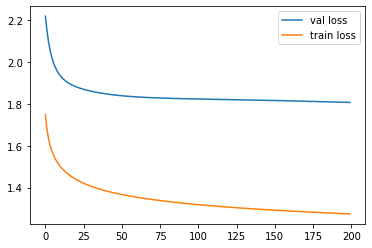

In [78]:
fig,ax=plt.subplots()


# loss_valid=list(loss_list_val[i] for i in range(1,len(loss_list_val),2))
ax.plot(epoch,loss_list_val,label="val loss")
ax.plot(epoch,loss_list_train,label="train loss")
ax.legend() 


In [ ]:
acc= 0.49098580744150366
f1 score 0.5038051702212941


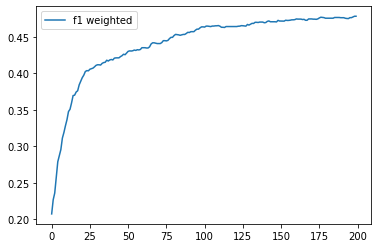

In [83]:
fig,ax2=plt.subplots()
ax2.plot(epoch,f1_list,label="f1 weighted")
# ax2.plot(epoch,loss_list_train,label="train loss")
ax2.legend()
plt.savefig("twolayer_sentimentlex_f1.png")